In [5]:
floor_lower_tails = False
cap_upper_tails = False
drop_lower_tails = False
drop_upper_tails = False
std_to_cap_at_or_drop_above = 2

test_split_size_fraction = 0.2
early_stop_evaluation_split_size_fraction = 0.1

plot_fastbook_cluster_columns = True

min_to_avg_distribution_matching = True
record_feature_importances_expvars_correlations = False
do_basic_feature_elimination = False
do_recursive_feature_elimination = False

windows_environment = False

# Random seed
RS = 120
n_jobs = -1


In [6]:
from datetime import datetime
from logging import error
from optuna.study.study import Study
import warnings
from warnings import simplefilter

simplefilter(action='ignore', category=FutureWarning)
# warnings.simplefilter(action='default', category=FutureWarning)
# warnings.simplefilter(action='default', category=UserWarning)
simplefilter(action='ignore', category=UserWarning)
# warnings.filterwarnings("ignore")
import optuna
from optuna.exceptions import ExperimentalWarning
warnings.filterwarnings("ignore", category=ExperimentalWarning, module="optuna.multi_objective")
optuna.logging.set_verbosity(optuna.logging.WARNING)
# optuna.logging.set_verbosity(optuna.logging.INFO) # Default level
simplefilter("ignore", category=RuntimeWarning)
simplefilter("ignore", category=ExperimentalWarning)


In [7]:
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_datareader.data as pdr
from sklearn.pipeline import Pipeline
from IPython.display import IFrame
from IPython.display import display
import os


In [8]:
pd.set_option('display.expand_frame_repr', False) # don't wrap to multiple pages
pd.set_option("display.max_columns", None) # don't truncate columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 200)
pd.set_option('display.max_rows', 17)
pd.set_option('display.width', 190)
pd.set_option('display.min_rows', 50)
pd.options.mode.copy_on_write = True
pd.DataFrame.iteritems = pd.DataFrame.items
pd.options.display.float_format = '{:.2f}'.format

# np.set_printoptions(edgeitems=10, precision=3, suppress=True)
np.set_printoptions(edgeitems=10, formatter=dict(float=lambda x: "%.3g" % x))

np.set_printoptions(linewidth=sys.maxsize) # no-wrap
# np.set_printoptions(threshold=sys.maxsize) # no-truncate
np.set_printoptions(threshold=30) # truncate after 30 array elements


if (windows_environment):
    working_folder_path = r"C:\Users\XXXXX\Documents\Code"
    dataframes_path = r"C:\Users\XXXXX\Documents\Code\Dataframes"
else:
    working_folder_path = r"/home/XXXXX/Code/"
    dataframes_path = r"/home/XXXXX/Documents/Code/Dataframes"


In [9]:
# For transforming prices from 2023 (minimum budget based expenses) to 2016 prices (household consumption statistics)
CPI_adjustment_from_2023_prices_to_2016_prices = 1913/2300


In [10]:
# The expense estimates
avg_expense_estimates_in_use = {"food_expenses":[int(400*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
    "health_and_hygiene_expenses":[int(100*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90], \
        "freetime_expenses":[int(100*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 90],\
            "clothing_expenses":[int(100*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
                "communication_IT_and_media_expenses": [int(100*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "local_public_transportation_expenses":[int(100*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "other_regular_expenses_incl_recreational_dwel":[int(50*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],
        "utilities_and_energy": [int(50*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "insurance_expenses_other_than_car_or_home": [int(20*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "car_expenses":[int(300*12*CPI_adjustment_from_2023_prices_to_2016_prices),  0.90, 0.90, 0.90]}

avg_expense_estimates_in_use["total_expenses"] = [sum([value[0] for value in avg_expense_estimates_in_use.values()]), 0, 0, 0]
    
for i in range(1, 4):
    total = 0
    for key in avg_expense_estimates_in_use.keys():
        total += avg_expense_estimates_in_use[key][0] * avg_expense_estimates_in_use[key][i]
        
    avg_expense_estimates_in_use["total_expenses"][i] = round(total/avg_expense_estimates_in_use["total_expenses"][0], 2)

min_expense_estimates_in_use = {"food_expenses":[int(300*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
    "health_and_hygiene_expenses":[int(80*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "freetime_expenses":[int(30*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
            "clothing_expenses":[int(30*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
                "communication_IT_and_media_expenses": [int(50*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "local_public_transportation_expenses":[int(50*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "other_regular_expenses_incl_recreational_dwel":[int(30*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],
        "utilities_and_energy": [int(20*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "insurance_expenses_other_than_car_or_home": [int(10*12*CPI_adjustment_from_2023_prices_to_2016_prices), 0.90, 0.90, 0.90],\
        "car_expenses":[int(150*12*CPI_adjustment_from_2023_prices_to_2016_prices),  0.90, 0.90, 0.90]}
    
min_expense_estimates_in_use["total_expenses"] = [sum([value[0] for value in min_expense_estimates_in_use.values()]), 0, 0, 0]

for i in range(1, 4):
    total = 0
    for key in min_expense_estimates_in_use.keys():
        total += min_expense_estimates_in_use[key][0] * min_expense_estimates_in_use[key][i]
        
    min_expense_estimates_in_use["total_expenses"][i] = round(total/min_expense_estimates_in_use["total_expenses"][0], 2)


In [11]:
# Household consumption expenditures data
if (windows_environment):
    household_consumption_data = pd.read_csv(r"C:\Users\XXXXX\Documents\Code\Data\kotitalo_tutk_2016_palvaine_kark.csv", sep=",", header=0, encoding='latin6')
else:
    household_consumption_data = pd.read_csv(r"/home/XXXXX/Documents/Code/Data/kotitalo_tutk_2016_palvaine_kark.csv", sep=",", header=0, encoding='latin6')
IFrame(household_consumption_data, width=700, height=600)


In [12]:
# household_consumption_data.info(verbose=True, show_counts=True)


In [13]:
# household_consumption_data.describe()


In [14]:
# These are from the variable description sheet of the dataset.

"""
A01 Elintarvikkeet ja alkoholittomat juomat
A1111S01  Lounas ja muut ateriat ravintolassa
+ A1112  Työpaikka- ja opiskelija-ateriat (P)

A092  Muut suuret vapaa-ajan välineet
+ A093  Muut virkistys- ja harrastusvälineet
+ A094 Kulttuuri- ja vapaa-ajan palvelut
+ A096 Valmismatkat
+ [A111 Ateriapalvelut - (A1111S01  Lounas ja muut ateriat ravintolassa + A1112 Työpaikka- ja opiskelija-ateriat (P))] 
+ A112 Majoituspalvelut
+ A0731103 Pitkät junamatkat 
+ A0732103  Pitkät linja-automatkat
+ A0730 Ulkomaanmatkojen matkaliput (P)
+ A0733 Laiva-, vene- ja lentomatkat Suomessa
+ A0732104 Taksimatkat

A121 Puhtaus ja kauneudenhoito
A06 Terveys

A03 Vaatteet ja jalkineet

A08 Tietoliikenne
+ A091 Audiovisuaaliset laitteet ja tietokoneet
+ A095 Kirjat ja lehdet

A12312  Lasten päivähoitopalvelut
A12122S4  Vauvanvaipat ja vaippaliinat
+ A1212223  Muut vauvanhoitoaineet ja -tarvikkeet
+ A12222S1  Lastenvaunut, turvaistuimet, vauvarinkat ym.
"""

food_expenses = ["A01", "A1111S01", "A1112"]
freetime_expenses_add = ["A092", "A093", "A094", "A096", "A111", "A112", "A0731103", "A0732103", "A0730", "A0733", "A0732104"]
freetime_expenses_subtract = ["A1111S01", "A1112"]
health_and_hygiene_expenses = ["A121", "A06"]
clothing_expenses = ["A03"]
communication_IT_and_media_expenses = ["A08", "A091", "A095"]
childcare_expenses = ["A12312", "A12122S4", "A1212223", "A12222S1"]


"""
# Voluntary insurance (other than home or car)
A1243 Vapaaehtoiset tapaturma- ja sairausvakuutukset (P)
+ A1244104 Matka- ja matkatavaravakuutus

# Other costs (consumables, furniture & other home content, union fee)
A1292104  Työmarkkinajärjestöjen jäsenmaksut
+ A051 Huonekalut, taide-esineet ja matot
+ A052 Kodintekstiilit
+ A053 Kodinkoneet
+ A054 Lasitavarat, astiat ja keittiötyövälineet
+ A055 Kodin ja puutarhan työkoneet, työkalut ym.
+ A056 Kodinhoitotarvikkeet ja -palvelut

"""
insurance_expenses_other_than_car_or_home = ["A1243", "A1244104"]
other_costs = ["A1292104", "A051", "A052", "A053", "A054", "A055", "A056"]

"""
# Public transportation
= A07311S1  Lyhyet junamatkat
+ A07321S1  Lyhyet linja-automatkat

# Own car
= A0722  Poltto- ja voiteluaineet (KR)
+ A1244101  Pakollinen liikennevakuutus
+ A1244102  Muut moottoriajoneuvovakuutukset
+ A0723  Yksityisajoneuvojen huolto ja korjaus (P)
+ A0724104  Pysäköinti-, silta- ja lossimaksut ym.
+ A0724101  Autopaikan tai -tallin vuokra
+ A0724108  Katsastusmaksut
+ A1292101  Liikennesakot
+ A1291106  Ajoneuvovero

# Leasing car
= A0736  Ajoneuvo luontoisetuna (P)
+ A0724105 Ajoneuvojen ja lisätarvikkeiden vuokraus
+ A0722  Poltto- ja voiteluaineet (KR)
+ A1244101  Pakollinen liikennevakuutus
+ A1244102  Muut moottoriajoneuvovakuutukset
+ A0723  Yksityisajoneuvojen huolto ja korjaus (P)
+ A0724104  Pysäköinti-, silta- ja lossimaksut ym.
+ A0724101  Autopaikan tai -tallin vuokra
+ A0724108  Katsastusmaksut
+ A1292101  Liikennesakot
A1291106  Ajoneuvovero

# Bicycle
= A0713  Polkupyörät (KS)
"""

local_public_transportation_expenses = ["A07311S1", "A07321S1", "A0713"]
car_expenses = ["A0722", "A1244101", "A1244102", "A0723", "A0724104", "A0724101", "A0724108", "A1292101", "A1291106", "A0736", "A0724105"]

"""
# Utilities and insurance
= A0451101  Asunnon sähkö
+ A1242  Irtaimistovakuutukset (P)
+ A0442101  Asunnon erilliset vesi- ja jätevesimaksut
+ A0444102  Asunnon muut maksut
+ A0421601  Asunnon tontin vuokra
+ A0444101  Asunnon nuohousmaksut
+ A0411  Varsinaisen asunnon vuokra (P)
+ A0412  Kakkosasunnon ja vapaa-ajanasunnon vuokra (P)
+ A0422  Luontoisetuasunto (P)
+ A043  Vuokra- ja luontoisetuasunnon huolto ja korjaus (asukas)

# Apartment
= A04212  Omistusasunnon hoitovastike
+ A0452  Kaasu (KR)
+ A0453101  Asunnon lämmitysöljy ym.
+ A0455  Kaukolämpö, lämminvesi ym. (KR)
+ A0421302  Oman osakehuoneiston huolto ja korjaus

# House
= A0452  Kaasu (KR)
+ A0453101  Asunnon lämmitysöljy ym.
+ A0455  Kaukolämpö, lämminvesi ym. (KR)
+ A0421602  Omakotikiinteistön palovakuutusmaksu
+ A0421603  Omakotikiinteistön osuus kotivakuutuksesta
+ A0421604  Omakotikiinteistön vahinkovakuutusmaksut
+ A0421301  Oman talon huolto ja korjaus
+ A0724102  Oman talon tienhoitomaksut
+ A0441101  Asunnon erillinen jätemaksu
+ A0454101  Ostetut halot ja muut lämmitysaineet
+ A0454102  Omat ja saadut halot ym.

# Recreational dwelling
= A0724103  Vapaa-ajanasunnon tienhoitomaksut
+ A0442102  Vapaa-ajanasunnon vesi- ja jätevesimaksut
+ A0453102  Vapaa-ajanasunnon lämmitysöljy
+ A0454103  Vapaa-ajanasunnon halot ym.
+ A0451102  Vapaa-ajanasunnon sähkö
+ A0424104  Vapaa-ajanasunnon palovakuutusmaksu
+ A0424105  Vapaa-ajanasunnon osuus kotivakuutuksesta
+ A0424106  Vapaa-ajanasunnon vahinkovakuutusmaksut
+ A0424101  Vapaa-ajanasunnon huolto ja korjaus
+ A0444103  Vapaa-ajanasunnon nuohous- ym. Maksut
+ A0441102  Vapaa-ajanasunnon jätemaksut
+ A0424103  Vapaa-ajanasunnon tontin vuokra

# Cooperative dwelling
= A04212  Omistusasunnon hoitovastike
+ A0452  Kaasu (KR)
+ A0453101  Asunnon lämmitysöljy ym.
+ A0455  Kaukolämpö, lämminvesi ym. (KR)
+ A0421302  Oman osakehuoneiston huolto ja korjaus
"""

utilities_and_energy = ["A0451101", "A0442101", "A0452", "A0453101", "A0455", "A0454101", "A0454102"] # Here, perhaps should move A0442101 to housing expenses, and then can choose to compute the energy costs directly from the TEUI (E-luku) of the loan applicant instead of including this expenditure category at all.
recreational_dwelling_expenses = ["A0412", "A0724103", "A0442102", "A0453102", "A0454103", "A0451102", "A0424104", "A0424106", "A0424101", "A0444103", "A0441102", "A0424103", "A0424105"]
other_regular_expenses_incl_recreational_dwel = other_costs + recreational_dwelling_expenses
housing_expenses_wo_utilities_and_energy = ["A0444102", "A0421601", "A0411", "A0422", "A04212", "A0421602", "A0421302", "A0444101", "A043", "A0421603", "A0421604", "A0421301", "A0724102", "A0441101", "A1242"]



In [15]:
# Sum columns specified in freetime_expenses_add
household_consumption_data['freetime_expenses'] = household_consumption_data[freetime_expenses_add].sum(axis="columns")
# Subtract columns specified in freetime_expenses_subtract
household_consumption_data['freetime_expenses'] -= household_consumption_data[freetime_expenses_subtract].sum(axis="columns")
# household_consumption_data['freetime_expenses_per_adult_per_month'] = household_consumption_data['freetime_expenses'] /household_consumption_data['aikuisia'] // 12

# household_consumption_data['freetime_expenses_per_adult_per_month'].describe()

household_consumption_data['food_expenses'] = household_consumption_data[food_expenses].sum(axis="columns")
# household_consumption_data['food_expenses_per_adult_per_month'] = household_consumption_data['food_expenses'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['food_expenses_per_adult_per_month'].describe()

household_consumption_data['health_and_hygiene_expenses'] = household_consumption_data[health_and_hygiene_expenses].sum(axis="columns")
# household_consumption_data['health_and_hygiene_expenses_per_adult_per_month'] = household_consumption_data['health_and_hygiene_expenses'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['health_and_hygiene_expenses_per_adult_per_month'].describe()

household_consumption_data['clothing_expenses'] = household_consumption_data[clothing_expenses].sum(axis="columns")
# household_consumption_data['clothing_expenses_per_adult_per_month'] = household_consumption_data['clothing_expenses'] /household_consumption_data['aikuisia'] // 12

# household_consumption_data['clothing_expenses_per_adult_per_month'].describe()

household_consumption_data['communication_IT_and_media_expenses'] = household_consumption_data[communication_IT_and_media_expenses].sum(axis="columns")
# household_consumption_data['communication_IT_and_media_expenses_per_adult_per_month'] = household_consumption_data['communication_IT_and_media_expenses'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['communication_IT_and_media_expenses_per_adult_per_month'].describe()

household_consumption_data['childcare_expenses'] = household_consumption_data[childcare_expenses].sum(axis="columns")
# household_consumption_data['childcare_expenses_per_adult_per_month'] = household_consumption_data['childcare_expenses'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['childcare_expenses_per_adult_per_month'].describe()

household_consumption_data['utilities_and_energy'] = household_consumption_data[utilities_and_energy].sum(axis="columns")
# household_consumption_data['utilities_and_energy_per_adult_per_month'] = household_consumption_data['utilities_and_energy'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['utilities_and_energy_per_adult_per_month'].describe()

household_consumption_data['insurance_expenses_other_than_car_or_home'] = household_consumption_data[insurance_expenses_other_than_car_or_home].sum(axis="columns")
# household_consumption_data['insurance_expenses_other_than_car_or_home_per_adult_per_month'] = household_consumption_data['insurance_expenses_other_than_car_or_home'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['insurance_expenses_other_than_car_or_home_per_adult_per_month'].describe()

household_consumption_data['other_regular_expenses_incl_recreational_dwel'] = household_consumption_data[other_costs].sum(axis="columns")
# household_consumption_data['other_regular_expenses_incl_recreational_dwel_per_adult_per_month'] = household_consumption_data['other_regular_expenses_incl_recreational_dwel'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['other_regular_expenses_incl_recreational_dwel_per_adult_per_month'].describe()

household_consumption_data['housing_expenses_wo_utilities_and_energy'] = household_consumption_data[housing_expenses_wo_utilities_and_energy].sum(axis="columns")
# household_consumption_data['housing_expenses_wo_utilities_and_energy_per_adult_per_month'] = household_consumption_data['housing_expenses_wo_utilities_and_energy'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['housing_expenses_wo_utilities_and_energy_per_adult_per_month'].describe()

household_consumption_data['local_public_transportation_expenses'] = household_consumption_data[local_public_transportation_expenses].sum(axis="columns")
# household_consumption_data['local_public_transportation_expenses_per_adult_per_month'] = household_consumption_data['local_public_transportation_expenses'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['local_public_transportation_expenses_per_adult_per_month'].describe()

household_consumption_data['car_expenses'] = household_consumption_data[car_expenses].sum(axis="columns")
# household_consumption_data['car_expenses_per_adult_per_month'] = household_consumption_data['car_expenses'] / household_consumption_data['aikuisia'] // 12

# household_consumption_data['car_expenses_per_adult_per_month'].describe()


/tmp/ipykernel_2813192/1242080560.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  household_consumption_data['freetime_expenses'] = household_consumption_data[freetime_expenses_add].sum(axis="columns")
/tmp/ipykernel_2813192/1242080560.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  household_consumption_data['food_expenses'] = household_consumption_data[food_expenses].sum(axis="columns")
/tmp/ipykernel_2813192/1242080560.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `f

In [16]:
"""
nuts3	Nuts3 – maakunta
1 = Uusimaa
2 = Varsinais-suomi
4 = Satakunta
5 = Kanta-Häme
6 = Pirkanmaa
7 = Päijät-Häme
8 = Kymenlaakso
9 = Etelä-Karjala
10 = Etelä-Savo
11 = Pohjois-Savo
12 = Pohjois-Karjala
13 = Keski-Suomi
14 = Etelä-Pohjanmaa
15 = Pohjanmaa
16 = Keski-Pohjanmaa
17 = Pohjois-Pohjanmaa
18 = Kainuu
19 = Lappi
21 = Ahvenanmaa
	Vuosien 1985, 1990, 1994–96, 1998, 2001 ja 2006 aineistot ovat vuoden 2006 luokituksen mukaisia.
Vuosien 2012 ja 2016 aineistot ovat vuoden 2012 alueluokituksen mukaisia.

taajama	Kunnan kaupunkimaisuus
1 = Kaupunkimaiset kunnat
2 = Taajaan asutut kunnat
3 = Maaseutumaiset kunnat	Luokituksen mukaan kaupunkimaisia kuntia ovat ne kunnat, joiden väestöstä vähintään 90 % asuu taajamissa tai suurimman taajaman väkiluku on vähintään 15000.
Taajaan asuttuja kuntia ovat kunnat, joiden väestöstä vähintään 60 %, mutta alle 90 % asuu taajamissa ja suurimman taajaman väkiluku on vähintään 4000, mutta alle 15000.

paak
	Pääkaupunkiseutu
1= Pääkaupunkiseutu
2= Muu	Pääkaupunkiseutuun luetaan Helsinki, Espoo, Kauniainen ja Vantaa.

maka	Maaseutu-kaupunki -luokitus
Bl = tietoa ei voitu muodostaa
K1 = Sisempi kaupunkialue
K2 = Ulompi kaupunkialue
K3 = Kaupungin kehysalue
M4 = Maaseudun paikalliskeskus
M5 = Kaupungin läheinen maaseutu
M6 = Ydinmaaseutu
M7 = Harvaan asuttu maaseutu
Paikkatietoihin perustuva kaupunki-maaseutu -luokitus. Alueet on luokiteltu 250*250 metrin tilastoruutujen avulla.

Tieto on vuosilta 2012 ja 2016. Alueiden luokitus on vuoden 2010 mukainen.

aikuisia	Aikuisten lukumäärä	Aikuisia ovat tutkimusvuoden loppuun mennessä 18 vuotta täyttäneet. Myös tätä nuorempi luetaan aikuiseksi, jos hänen asemansa kotitaloudessa on viitehenkilö tai puoliso.

ellu	Yli 64-vuotiaiden lukumäärä
	Ikä tutkimusvuoden lopussa.

yli75v	Yli 75-vuotiaiden lukumäärä
	Ikä tutkimusvuoden lopussa.

skidi	Alle 3-vuotiaiden lukumäärä
	Ikä tutkimusvuoden lopussa.

muku	Alle 7-vuotiaiden lukumäärä
	Ikä tutkimusvuoden lopussa.

peru	7 - 12-vuotiaiden lukumäärä
	Ikä tutkimusvuoden lopussa.

murk	13 - 16-vuotiaiden lukumäärä
	Ikä tutkimusvuoden lopussa.

isot	17 - 24-vuotiaiden huollettavien lasten lukumäärä
	Niiden kotitalouden jäsenten lukumäärä, jotka olivat tutkimusvuoden lopussa 17-24-vuotiaita ja ammatissa toimimattomia eivätkä olleet  tutkimuksen aikana avio- tai avoliitossa, eronneita eikä leskiä.

kaytetmk Käytettävissä olevat tulot
Yksikkö: euro
Kotitalouden yhteenlasketut palkkatulot, yrittäjätulot, omaisuustulot ja saadut tulonsiirrot, joista vähennetty kotitalouden maksamat tulonsiirrot tutkimusvuonna. 

Talotyyp	Talotyyppi
1= Yhden asunnon pientalo (ml. omakoti- ja maalaistalot)
2= Kahden asunnon pientalot (ml. omakoti- ja maalaistalot)
3= Rivi- tai ketjutalo
4= Kerrostalo
5= Muu rakennus (esim. koulu, virasto, teollisuusrakennus)
bl= Tietoa ei ole kysytty (asunto on alivuokralaisasunto tai parakki tms.)
	Tietoa ei ole kysytty, jos asunto on sisäoppilaitoksessa, asuntovaunussa, parakissa jne.

ravuosi	Talon rakennusvuosi
1919-
 bl Tietoa ei ole kysytty
	Tietoa ei ole kysytty, jos asunto on sisäoppilaitoksessa, asuntovaunussa, parakissa jne.

paalammi	Asunnon pääasiallinen lämmitystapa
1 = Kauko- tai aluelämpö
2 = Suora sähkölämmitys
3 = Varaava sähkölämmitys
4 = Öljykeskuslämmitys (rakennus- tai kiinteistökohtainen)
5 = Muu keskuslämmitys (rakennus- tai kiinteistökohtainen)
6 = Uuni-, takka- tai muu kiinteällä polttoaineella toimiva lämmitys)
9 = Muu lämmitystapa
bl = Tietoa ei ole kysytty
Lisäksi v. 2006, 2012 ja 2016
7 = maalämpö
8 = ilmalämpöpumppu
	Tietoa ei ole kysytty, jos asunto on sisäoppilaitoksessa, asuntovaunussa, parakissa jne.

aspintaa	Asunnon pinta-ala
Omassa  käytössä oleva asuinpinta-ala, neliömetriä
bl = Tietoa ei ole kysytty
	Tietoa ei ole kysytty, jos asunto on sisäoppilaitoksessa, asuntovaunussa, parakissa jne. V. 2006 kysytty lämmitettävät asuinneliöt.

huonluku	Asunnon huoneluku
Omassa käytössä olevat huoneet, kpl
bl = Tietoa ei ole kysytty
	Tietoa ei ole kysytty, jos asunto on sisäoppilaitoksessa, asuntovaunussa, parakissa jne. Keittiö sisältyy huonelukuun.

toimivia	Ammatissa toimivia

	Niiden henkilöiden lukumäärä, joiden sosioekonominen asema on yrittäjä tai palkansaaja.

vamto	Viitehenkilön  ammatissa toimivuus
0= Ei ammatissa toimiva
1= Ammatissa toimiva

pamto	Puolison ammatissa toimivuus
0 = Ei ammatissa toimiva
1 = Ammatissa toimiva
bl = ei puolisoa

pika	Viitehenkilön ikä tutkimusvuoden lopussa, vuosia

psup	Viitehenkilön sukupuoli
1= Mies
2= Nainen

soss90	Kotitalouden viitehenkilön sosioekonominen asema vuodesta 1990 (työttömät)
10= Maatalousyrittäjät
20= Muut yrittäjät
30= Ylemmät toimihenkilöt
40= Alemmat toimihenkilöt
50= Työntekijät
60= Opiskelijat ja koululaiset
70= Eläkeläiset
80= Pitkäaikaistyöttömät
90= Muut ammatissa toimimattomat  (omaa kotitaloutta hoitavat, muualla luokittelemattomat)
99= Sosioekonominen asema tuntematon
	Muodostettu viitehenkilön sosioekonomisen aseman perusteella.
Ei pystytty muodostamaan vuodesta 1985.

ppika	Puolison ikä
bl = ei puolisoa
	Puolison ikä tutkimusvuoden lopussa, vuosia.

ppsup	Puolison sukupuoli
1= Mies
2= Nainen
bl = ei puolisoa

psoss90
	Puolison sosioekonominen asema (työttöm.)
10 = Maatalousyrittäjät
20 = Muut yrittäjät
30 = Ylemmät toimihenkilöt
40 = Alemmat toimihenkilöt
50 = Työntekijät
60 = Opiskelijat ja koululaiset
70 = Eläkeläiset
80 = Työttömät
90 = Muut ammatissa toimimattomat (omaa kotitaloutta hoitavat, muualla luokittelemattomat)
99 = Sosioekonominen asema tuntematon
bl = Ei puolisoa	Ei vuonna 1985.

vaautom	Henkilö- tai pakettiautojen lukumäärä
	Ei työsuhdeautoja

vamautom	Matkailuautojen lukumäärä
	Ei kysytty 1985

vatsautm	Työsuhdeautojen lukumäärä
	Vuosina 1985, 2006, 2012 ja 2016 tieto ei sisällä lukumäärää vaan 1 (=on työsuhdeauto) tai 0.

vaasvaum	Matkailuvaunujen lukumäärä
	Vuoden 1985 tieto ei sisällä lukumäärää,
vaan kaikki arvot 1 (=omistus) tai 0. Vuosina 2012 ja 2016 sisältää myös peräkärryt ja venetrailerit.

vavenem	Moottori- tai purjevene, lukumäärä
	Ei kysytty 1985

Muuas	Kakkos- tai sijoitusasunnon omistus
0 = Ei
1 = On	Kysytty 2012 ja 2016

muuasulk	Kakkos- tai sijoitusasunto ulkomailla
0 = Ei
1 = On	Kysytty 2012 ja 2016

vapaikas	Vapaa-ajanasunnon omistus
0 = Ei
1 = On

vapaulk     Vapaa-ajanasunto ulkomailla
0 = Ei
1 = On	Kysytty 2012 ja 2016

"""

'\nnuts3\tNuts3 – maakunta\n1 = Uusimaa\n2 = Varsinais-suomi\n4 = Satakunta\n5 = Kanta-Häme\n6 = Pirkanmaa\n7 = Päijät-Häme\n8 = Kymenlaakso\n9 = Etelä-Karjala\n10 = Etelä-Savo\n11 = Pohjois-Savo\n12 = Pohjois-Karjala\n13 = Keski-Suomi\n14 = Etelä-Pohjanmaa\n15 = Pohjanmaa\n16 = Keski-Pohjanmaa\n17 = Pohjois-Pohjanmaa\n18 = Kainuu\n19 = Lappi\n21 = Ahvenanmaa\n\tVuosien 1985, 1990, 1994–96, 1998, 2001 ja 2006 aineistot ovat vuoden 2006 luokituksen mukaisia.\nVuosien 2012 ja 2016 aineistot ovat vuoden 2012 alueluokituksen mukaisia.\n\ntaajama\tKunnan kaupunkimaisuus\n1 = Kaupunkimaiset kunnat\n2 = Taajaan asutut kunnat\n3 = Maaseutumaiset kunnat\tLuokituksen mukaan kaupunkimaisia kuntia ovat ne kunnat, joiden väestöstä vähintään 90 % asuu taajamissa tai suurimman taajaman väkiluku on vähintään 15000.\nTaajaan asuttuja kuntia ovat kunnat, joiden väestöstä vähintään 60 %, mutta alle 90 % asuu taajamissa ja suurimman taajaman väkiluku on vähintään 4000, mutta alle 15000.\n\npaak\n\tPääkaup

In [17]:
target_variables = ["total_expenses", 'food_expenses', 'freetime_expenses', 'housing_expenses_wo_utilities_and_energy', 'car_expenses', 'health_and_hygiene_expenses','other_regular_expenses_incl_recreational_dwel', 'communication_IT_and_media_expenses', 'utilities_and_energy', 'clothing_expenses', 'childcare_expenses', 'insurance_expenses_other_than_car_or_home', 'local_public_transportation_expenses']


In [18]:
if (windows_environment):
    minimums_and_averages_df = pd.read_csv(r"C:\Users\XXXXX\Documents\Code\Data\Features long format.csv", sep=";", header=0, encoding='latin6')
else:
    minimums_and_averages_df = pd.read_csv(r"/home/XXXXX/Documents/Code/Data/Features long format.csv", sep=";", header=0, encoding='latin6')

averages_df = minimums_and_averages_df[minimums_and_averages_df["Cost type"] == "avg"].drop("Cost type", axis="columns")
minimums_df = minimums_and_averages_df[minimums_and_averages_df["Cost type"] == "min"].drop("Cost type", axis="columns")

minavg_columns = ['Retirement-age females','Retirement-age males','Working-age females','Working-age males','Toddlers','School children','Teenagers',"Sum of childrens' ages",'HasOwnCar','Dwelling size']
min_avg_target_variables = list(set(target_variables) - set(['childcare_expenses', 'insurance_expenses_other_than_car_or_home', 'total_expenses']))

averages_df = averages_df.pivot(index=minavg_columns, columns="Cost cat", values="Value")
minimums_df = minimums_df.pivot(index=minavg_columns, columns="Cost cat", values="Value")

# Flatten the multi-index
averages_df = averages_df.reset_index()
minimums_df = minimums_df.reset_index()

minimums_df['total_expenses'] = minimums_df[min_avg_target_variables].sum(axis="columns")

min_X = minimums_df[minavg_columns]
min_y = minimums_df[min_avg_target_variables]

# Match the columns of the min-avg dataset with those of the average consumption microdataset
averages_df["aikuisia"] = averages_df["Retirement-age females"] + averages_df["Retirement-age males"] + averages_df["Working-age females"] + averages_df["Working-age males"]
averages_df["ellu"] = averages_df["Retirement-age females"] + averages_df["Retirement-age males"]
averages_df["muku"] = averages_df["Toddlers"]
averages_df["peru"] = averages_df["School children"]
averages_df["murk"] = averages_df["Teenagers"]
averages_df["aspintaa"] = averages_df["Dwelling size"]
averages_df["autoja"] = averages_df["HasOwnCar"]
averages_df["toimivia"] = averages_df["Working-age females"] + averages_df["Working-age males"]

# Only these columns have a counterpart in microdataset
columns_matching_minavg_and_microdatasets = ["aikuisia", "ellu", "muku", "peru", "murk", "aspintaa",  "autoja", "toimivia"]
#, "psup", "soss90", "ppsup", "psoss90","Talotyyp"
# To consider: "huonluku", "nuts3", "taajama", "paak", "maka", "paalammi"
averages_df = averages_df[columns_matching_minavg_and_microdatasets]


In [19]:
## Exploratory data analysis
## 


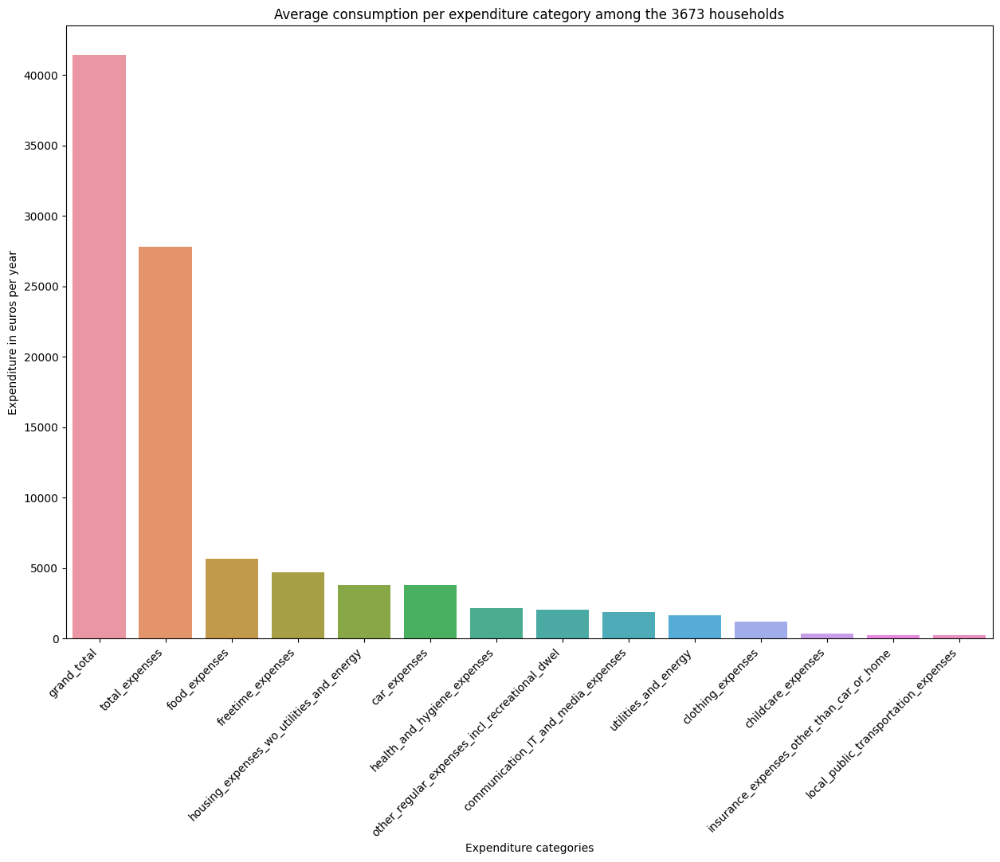

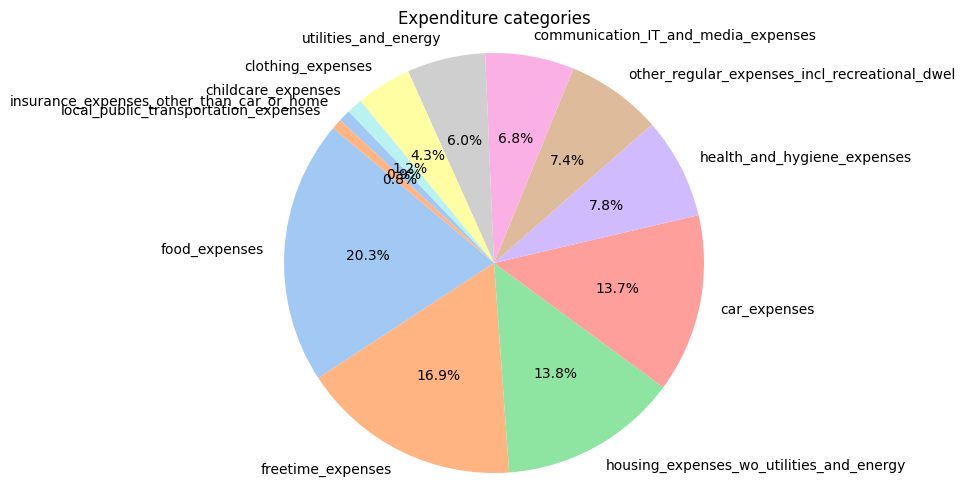

In [20]:
# Investigate the sizes of the expense categories in relation to each other
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Make a barchart of the target variables
plt.figure(figsize=(15, 10))
column_sums = household_consumption_data[[target for target in target_variables if target not in ["total_expenses"]]].sum()
column_sums["total_expenses"] = column_sums.sum()
column_sums["grand_total"] = household_consumption_data["A01_12"].sum() # Also including those COICOP expenditure codes in the microdataset that are not mapped into any of the 12 expenditure categories. Such expenditures include e.g. vehicle purchase costs and the theoretical expenditure of imputed rent.
column_sums = column_sums.sort_values(ascending=False)
target_variables_wo_total_sorted = [target for target in column_sums.index if target not in ["total_expenses", "grand_total"]]
target_variables = [target for target in column_sums.index if target not in ["grand_total"]]

sns.set_palette("pastel")
sns.barplot(x = column_sums.index, y = column_sums/len(household_consumption_data[[target for target in target_variables if target not in ["total_expenses"]]]), order=column_sums.index)
plt.xlabel('Expenditure categories')
plt.ylabel('Expenditure in euros per year')
plt.xticks(rotation=45, ha='right')
plt.title(f"Average consumption per expenditure category among the 3673 households")

# Plot a pie chart of the total sums of the columns in y with percentages shown
plt.figure(figsize=(8, 6))
patches, texts, autotexts = plt.pie(column_sums.drop(["grand_total", "total_expenses"]), labels=target_variables_wo_total_sorted, autopct='%2.1f%%', startangle=140)
plt.title("Expenditure categories")
plt.axis('equal')
# Add legend
# plt.legend(patches, column_sums.index, loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.show()

/tmp/ipykernel_2813192/500302754.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  household_consumption_data["autoja"]  = household_consumption_data["vaautom"] + household_consumption_data["vamautom"] + household_consumption_data["vatsautm"]
/tmp/ipykernel_2813192/500302754.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  household_consumption_data['cars'] = household_consumption_data['autoja'].apply(lambda x: str(x) if x < 3 else '3 or more')


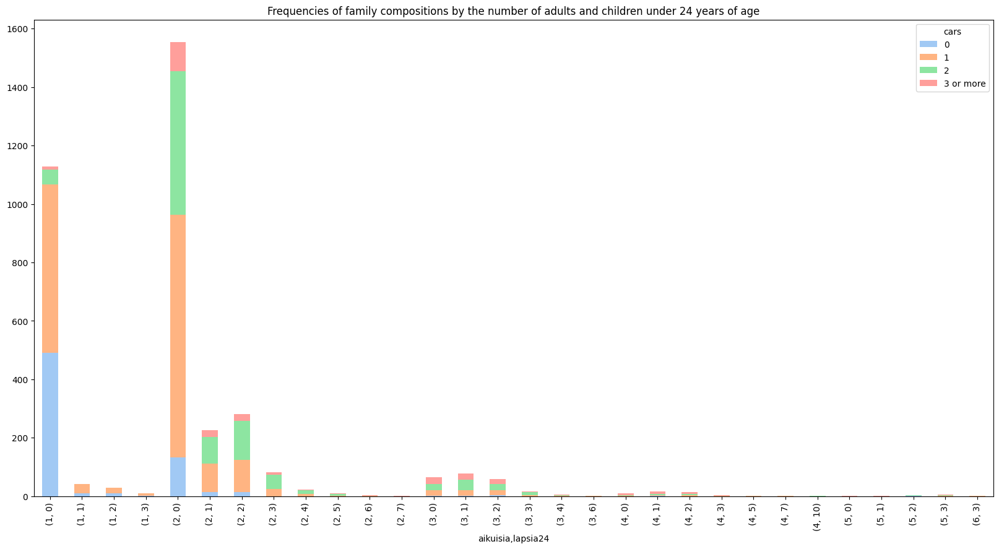

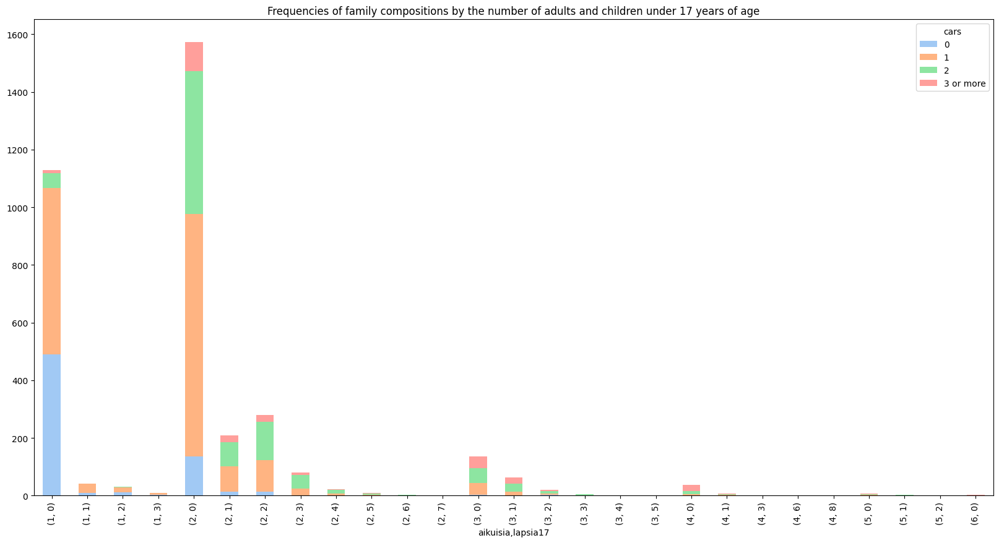

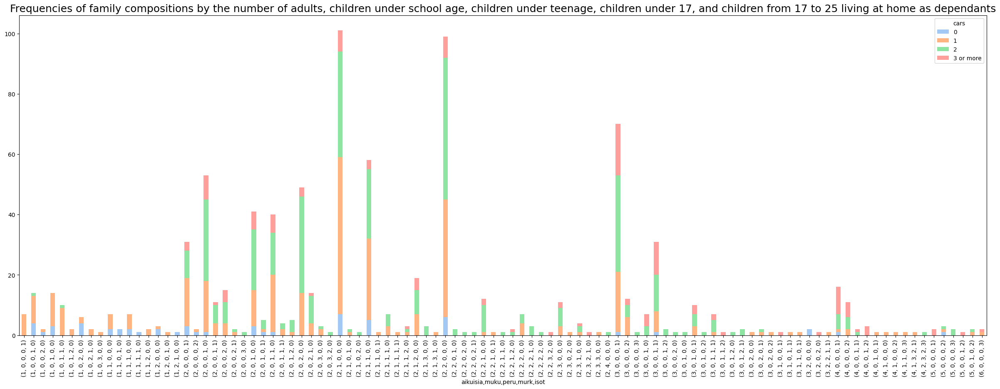

755

In [21]:
# Investigate the representativeness of the dataset
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20,10)
household_consumption_data["autoja"]  = household_consumption_data["vaautom"] + household_consumption_data["vamautom"] + household_consumption_data["vatsautm"]
household_consumption_data['cars'] = household_consumption_data['autoja'].apply(lambda x: str(x) if x < 3 else '3 or more')
grouped_data = household_consumption_data.groupby(["aikuisia", "lapsia24", "cars"]).size().reset_index(name="count")
grouped_data.pivot_table(index=["aikuisia", "lapsia24"], columns="cars", values="count", aggfunc="sum").plot.bar(stacked=True)
plt.title("Frequencies of family compositions by the number of adults and children under 24 years of age")
plt.show()

plt.rcParams["figure.figsize"] = (20,10)
household_consumption_data["autoja"]  = household_consumption_data["vaautom"] + household_consumption_data["vamautom"] + household_consumption_data["vatsautm"]
household_consumption_data['cars'] = household_consumption_data['autoja'].apply(lambda x: str(x) if x < 3 else '3 or more')
grouped_data = household_consumption_data.groupby(["aikuisia", "lapsia17", "cars"]).size().reset_index(name="count")
grouped_data.pivot_table(index=["aikuisia", "lapsia17"], columns="cars", values="count", aggfunc="sum").plot.bar(stacked=True)
plt.title("Frequencies of family compositions by the number of adults and children under 17 years of age")
plt.show()

plt.rcParams["figure.figsize"] = (30,10)
household_consumption_data["autoja"]  = household_consumption_data["vaautom"] + household_consumption_data["vamautom"] + household_consumption_data["vatsautm"]
household_consumption_data['cars'] = household_consumption_data['autoja'].apply(lambda x: str(x) if x < 3 else '3 or more')
grouped_data = household_consumption_data.groupby(["aikuisia", "muku", "peru", "murk", "isot", "cars"]).size().reset_index(name="count")
grouped_data = grouped_data[(grouped_data["muku"] > 0) | (grouped_data["peru"] > 0) | (grouped_data["murk"] > 0) | (grouped_data["isot"] > 0)]
grouped_data.pivot_table(index=["aikuisia", "muku", "peru", "murk", "isot"], columns="cars", values="count", aggfunc="sum").plot.bar(stacked=True)
plt.title("Frequencies of family compositions by the number of adults, children under school age, children under teenage, children under 17, and children from 17 to 25 living at home as dependants", size=18)
plt.show()

# Show the total of "count" in grouped_data
grouped_data["count"].sum() # = 3673
len(household_consumption_data) # = 3673

# What is the total "count" of rows where "muku" > 0, "peru" > 0, or "murk" > 0?
grouped_data[(grouped_data["muku"] > 0) | (grouped_data["peru"] > 0) | (grouped_data["murk"] > 0) | (grouped_data["isot"] > 0)]["count"].sum() # = 914

len(household_consumption_data[(household_consumption_data["lapsia24"] > 0)]) # = 914

# What is the total "count" of rows where "muku" = 0, "peru" = 0, or "murk" > 0?
grouped_data[(grouped_data["muku"] > 0) | (grouped_data["peru"] > 0) | (grouped_data["murk"] > 0)]["count"].sum() # = 755


In [22]:
# Print the top 5 rows with the highest sum X['muku'] + X['peru'] + X['murk'] + X['isot']
top_10_rows = household_consumption_data[['muku', 'peru', 'murk', 'isot']].sum(axis=1).nlargest(10)
print(top_10_rows)


2131    10
312      7
2415     7
55       6
839      6
915      6
1315     6
418      5
689      5
812      5
dtype: int64


In [23]:
## Minimum budget assessment
## 


In [ ]:
# Match the 14x2 example families of the minimum reference budget study with a percentile in the distribution of equivalent families in the household consumption microdataset
if (min_to_avg_distribution_matching):
    import math
    target_variables_wo_missing = [target for target in target_variables if target not in ["childcare_expenses", "insurance_expenses_other_than_car_or_home"]]
    household_consumption_data["total_expenses"] = household_consumption_data[[target for target in target_variables_wo_missing if target not in ["total_expenses"]]].sum(axis="columns")
    CPI_adjustment_from_2023_prices_to_2016_prices = 1913/2300

    percentiles_per_category = {'freetime_expenses':[0, 0, 0, 0, 0], 'food_expenses':[0, 0, 0, 0, 0], 'health_and_hygiene_expenses':[0, 0, 0, 0, 0], 'clothing_expenses':[0, 0, 0, 0, 0], 'communication_IT_and_media_expenses':[0, 0, 0, 0, 0], 'utilities_and_energy':[0, 0, 0, 0, 0], 'other_regular_expenses_incl_recreational_dwel':[0, 0, 0, 0, 0], 'housing_expenses_wo_utilities_and_energy':[0, 0, 0, 0, 0], 'local_public_transportation_expenses':[0, 0, 0, 0, 0], 'car_expenses':[0, 0, 0, 0, 0], 'total_expenses':[0, 0, 0, 0, 0]}
    printed_three_dots = False
    for idx, row in minimums_df.iterrows():
        # idx, row = next(minimums_df.iterrows())
        if (idx < 5):
            print(f'Which percentile of household consumption microdataset does the minimum of the family composition\nRetirement-age females = {row.loc["Retirement-age females"]}, Retirement-age males = {row.loc["Retirement-age males"]}, Working-age females = {row.loc["Working-age females"]}, Working-age males = {row.loc["Working-age males"]}, children 0-6 = {row.loc["Toddlers"]}, children 7-17 = {row.loc["School children"] + row.loc["Teenagers"]}, cars = {row.loc["HasOwnCar"]}\ncorrespond to?')
            for target in target_variables_wo_missing:
                distribution_of_matching = household_consumption_data[(household_consumption_data["aikuisia"] == (row.loc["Working-age females"] + row.loc["Working-age males"] + row.loc["Retirement-age females"] + row.loc["Retirement-age males"])) & (household_consumption_data["muku"] == row.loc["Toddlers"]) & (household_consumption_data["peru"] == row.loc["School children"]) & (household_consumption_data["murk"] == row.loc["Teenagers"]) & (household_consumption_data["ellu"] == (row.loc["Retirement-age females"] + row.loc["Retirement-age males"])) & ((household_consumption_data["autoja"] == row.loc["HasOwnCar"]) | ((household_consumption_data["autoja"] > 0) & (row["HasOwnCar"] > 0))) & ((household_consumption_data["aspintaa"] + 20 >=row.loc["Dwelling size"]) & (household_consumption_data["aspintaa"] - 20 <= row.loc["Dwelling size"]))][target]
                percentile = (distribution_of_matching < row[target]*CPI_adjustment_from_2023_prices_to_2016_prices).mean()
                if (not math.isnan(percentile) and row[target] != 0):
                    percentiles_per_category[target][0] += percentile
                    percentiles_per_category[target][1] += 1
                    percentiles_per_category[target][2] += len(distribution_of_matching)
                    percentiles_per_category[target][3] += int(row[target]*CPI_adjustment_from_2023_prices_to_2016_prices)
                    percentiles_per_category[target][4] += int(distribution_of_matching.mean())
                print(f"{round(percentile, 2)}\tin {target} with {len(distribution_of_matching)} matching observations")
            print()
        elif (not printed_three_dots):
            print("...")
            printed_three_dots = True
    print('\n-----------------------------------------------------------------------------------------------------------------------')
    print("Weighted average of the percentiles over all household compositions:")
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    for key, value in percentiles_per_category.items():
        print(f"{round(value[0] / (value[1] + 0.001), 2)}\t in {key} with {value[2]} matching observations")
        
    # Plot a bar chart of all first elements of values in percentiles_per_category
    plt.figure(figsize=(20, 6))
    ax = plt.gca()
    ax.set_ylim([0, 1.05])
    bars = ax.bar(percentiles_per_category.keys(), [value[0] / (value[1] + 0.001) for value in percentiles_per_category.values()], color='lightblue', align='center', width = 0.5)
    # Add text above each bar
    for idx, bar in enumerate(bars):
        # idx, bar in next(enumerate(bars))
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height, f"mean of mean of exp:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][4]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)},\nmean of min:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][3]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)}", ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height, round(height, 2), ha='center', va='bottom')
    plt.xticks(rotation=45, ha='right')
    plt.title("Weighted average of the percentiles over all household compositions")
    plt.xlabel("Expenditure categories")
    plt.ylabel("Average percentile")


    percentiles_per_category = {'freetime_expenses':[0, 0, 0, 0, 0], 'food_expenses':[0, 0, 0, 0, 0], 'health_and_hygiene_expenses':[0, 0, 0, 0, 0], 'clothing_expenses':[0, 0, 0, 0, 0], 'communication_IT_and_media_expenses':[0, 0, 0, 0, 0], 'utilities_and_energy':[0, 0, 0, 0, 0], 'other_regular_expenses_incl_recreational_dwel':[0, 0, 0, 0, 0], 'housing_expenses_wo_utilities_and_energy':[0, 0, 0, 0, 0], 'local_public_transportation_expenses':[0, 0, 0, 0, 0], 'car_expenses':[0, 0, 0, 0, 0], 'total_expenses':[0, 0, 0, 0, 0]}
    for idx, row in minimums_df.iterrows():
        if (row.loc["HasOwnCar"] != 0):
            continue
        for target in target_variables_wo_missing:
            distribution_of_matching = household_consumption_data[(household_consumption_data["aikuisia"] == (row.loc["Working-age females"] + row.loc["Working-age males"] + row.loc["Retirement-age females"] + row.loc["Retirement-age males"])) & (household_consumption_data["muku"] == row.loc["Toddlers"]) & (household_consumption_data["peru"] == row.loc["School children"]) & (household_consumption_data["murk"] == row.loc["Teenagers"]) & (household_consumption_data["ellu"] == (row.loc["Retirement-age females"] + row.loc["Retirement-age males"])) & ((household_consumption_data["autoja"] == row.loc["HasOwnCar"]) | ((household_consumption_data["autoja"] > 0) & (row["HasOwnCar"] > 0))) & ((household_consumption_data["aspintaa"] + 20 >=row.loc["Dwelling size"]) & (household_consumption_data["aspintaa"] - 20 <= row.loc["Dwelling size"]))][target]
            percentile = (distribution_of_matching < row[target]*CPI_adjustment_from_2023_prices_to_2016_prices).mean()
            if (not math.isnan(percentile) and row[target] != 0):
                percentiles_per_category[target][0] += percentile
                percentiles_per_category[target][1] += 1
                percentiles_per_category[target][2] += len(distribution_of_matching)
                percentiles_per_category[target][3] += int(row[target]*CPI_adjustment_from_2023_prices_to_2016_prices)
                percentiles_per_category[target][4] += int(distribution_of_matching.mean())

    print('\n-----------------------------------------------------------------------------------------------------------------------')
    print("Weighted average of the percentiles over all household compositions without cars:")
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    for key, value in percentiles_per_category.items():
        print(f"{round(value[0] / (value[1] + 0.001), 2)}\t in {key} with {value[2]} matching observations")
        
    # Plot a bar chart of all first elements of values in percentiles_per_category
    plt.figure(figsize=(20, 6))
    ax = plt.gca()
    ax.set_ylim([0, 1.05])
    bars = ax.bar(percentiles_per_category.keys(), [value[0] / (value[1] + 0.001) for value in percentiles_per_category.values()], color='lightblue', align='center', width = 0.5)
    # Add text above each bar
    for idx, bar in enumerate(bars):
        # idx, bar in next(enumerate(bars))
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height, f"mean of mean of exp:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][4]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)},\nmean of min:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][3]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)}", ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height, round(height, 2), ha='center', va='bottom')
    plt.xticks(rotation=45, ha='right')
    plt.title("Weighted average of the percentiles over all household compositions without cars")
    plt.xlabel("Expenditure categories")
    plt.ylabel("Average percentile")

    percentiles_per_category = {'freetime_expenses':[0, 0, 0, 0, 0], 'food_expenses':[0, 0, 0, 0, 0], 'health_and_hygiene_expenses':[0, 0, 0, 0, 0], 'clothing_expenses':[0, 0, 0, 0, 0], 'communication_IT_and_media_expenses':[0, 0, 0, 0, 0], 'utilities_and_energy':[0, 0, 0, 0, 0], 'other_regular_expenses_incl_recreational_dwel':[0, 0, 0, 0, 0], 'housing_expenses_wo_utilities_and_energy':[0, 0, 0, 0, 0], 'local_public_transportation_expenses':[0, 0, 0, 0, 0], 'car_expenses':[0, 0, 0, 0, 0], 'total_expenses':[0, 0, 0, 0, 0]}
    for idx, row in minimums_df.iterrows():
        if (row.loc["HasOwnCar"] == 0):
            continue
        for target in target_variables_wo_missing:
            distribution_of_matching = household_consumption_data[(household_consumption_data["aikuisia"] == (row.loc["Working-age females"] + row.loc["Working-age males"] + row.loc["Retirement-age females"] + row.loc["Retirement-age males"])) & (household_consumption_data["muku"] == row.loc["Toddlers"]) & (household_consumption_data["peru"] == row.loc["School children"]) & (household_consumption_data["murk"] == row.loc["Teenagers"]) & (household_consumption_data["ellu"] == (row.loc["Retirement-age females"] + row.loc["Retirement-age males"])) & ((household_consumption_data["autoja"] == row.loc["HasOwnCar"]) | ((household_consumption_data["autoja"] > 0) & (row["HasOwnCar"] > 0))) & ((household_consumption_data["aspintaa"] + 20 >=row.loc["Dwelling size"]) & (household_consumption_data["aspintaa"] - 20 <= row.loc["Dwelling size"]))][target]
            percentile = (distribution_of_matching < row[target]*CPI_adjustment_from_2023_prices_to_2016_prices).mean()
            if (not math.isnan(percentile) and row[target] != 0):
                percentiles_per_category[target][0] += percentile
                percentiles_per_category[target][1] += 1
                percentiles_per_category[target][2] += len(distribution_of_matching)
                percentiles_per_category[target][3] += int(row[target]*CPI_adjustment_from_2023_prices_to_2016_prices)
                percentiles_per_category[target][4] += int(distribution_of_matching.mean())

    print('\n-----------------------------------------------------------------------------------------------------------------------')
    print("Weighted average of the percentiles over all household compositions with cars:")
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    for key, value in percentiles_per_category.items():
        print(f"{round(value[0] / (value[1] + 0.001), 2)}\t in {key} with {value[2]} matching observations")
        
    # Plot a bar chart of all first elements of values in percentiles_per_category
    plt.figure(figsize=(20, 6))
    ax = plt.gca()
    ax.set_ylim([0, 1.05])
    bars = ax.bar(percentiles_per_category.keys(), [value[0] / (value[1] + 0.001) for value in percentiles_per_category.values()], color='lightblue', align='center', width = 0.5)
    # Add text above each bar
    for idx, bar in enumerate(bars):
        # idx, bar in next(enumerate(bars))
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height, f"mean of mean of exp:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][4]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)},\nmean of min:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][3]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)}", ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height, round(height, 2), ha='center', va='bottom')
    plt.xticks(rotation=45, ha='right')
    plt.title("Weighted average of the percentiles over all household compositions with cars")
    plt.xlabel("Expenditure categories")
    plt.ylabel("Average percentile")
    plt.show()


In [ ]:
# Match 87 families computed with minimum expenditure calculator with a percentile in the distribution of equivalent families in the household consumption microdataset
if (min_to_avg_distribution_matching):
    CPI_adjustment_from_2023_prices_to_2016_prices = 1913/2300
    percentiles_per_category = {'freetime_expenses':[0, 0, 0, 0, 0], 'food_expenses':[0, 0, 0, 0, 0], 'health_and_hygiene_expenses':[0, 0, 0, 0, 0], 'clothing_expenses':[0, 0, 0, 0, 0], 'communication_IT_and_media_expenses':[0, 0, 0, 0, 0], 'utilities_and_energy':[0, 0, 0, 0, 0], 'insurance_expenses_other_than_car_or_home':[0, 0, 0, 0, 0], 'other_regular_expenses_incl_recreational_dwel':[0, 0, 0, 0, 0], 'local_public_transportation_expenses':[0, 0, 0, 0, 0], 'car_expenses':[0, 0, 0, 0, 0], 'total_expenses':[0, 0, 0, 0, 0]}

    if (windows_environment):
        minimums_for_families_df = pd.read_csv(r"C:\Users\XXXXX\Documents\Code\Data\Minimimenoja_perheille.csv", sep=";", header=0, encoding='latin6')
    else:
        minimums_for_families_df = pd.read_csv(r"/home/XXXXX/Documents/Code/Data/Minimimenoja_perheille.csv", sep=";", header=0, encoding='latin6')

    target_variables_wo_missing = [target for target in target_variables if target not in ["childcare_expenses", "housing_expenses_wo_utilities_and_energy"]] # Because not given
    minimums_for_families_df[target_variables_wo_missing] *= 12
    printed_three_dots = False

    for idx, row in minimums_for_families_df.iterrows():
        # idx, row = next(minimums_for_families_df.iterrows())
        if (idx < 5):
            print(f'Which percentile of household consumption microdataset does the minimum of the family composition\nAdults = {row["ïŧŋAdults"]}, Children 0-6 = {row["Children0_6"]}, Children 7-17 = {row["Children7_17"]}, Cars = {row["cars"]}\ncorrespond to?')
            for target in target_variables_wo_missing:
                distribution_of_matching = household_consumption_data[(household_consumption_data["aikuisia"] == row.loc["ïŧŋAdults"]) & (household_consumption_data["muku"] == row.loc["Children0_6"]) & ((household_consumption_data["peru"] + household_consumption_data["murk"]) == row.loc["Children7_17"])\
                                            & ((household_consumption_data["autoja"] ) == row.loc["cars"])\
                                            ][target]
                percentile = (distribution_of_matching < row[target]*CPI_adjustment_from_2023_prices_to_2016_prices).mean()
                if (not math.isnan(percentile) and row[target] != 0):
                    percentiles_per_category[target][0] += percentile
                    percentiles_per_category[target][1] += 1
                    percentiles_per_category[target][2] += len(distribution_of_matching)
                    percentiles_per_category[target][3] += int(row[target]*CPI_adjustment_from_2023_prices_to_2016_prices)
                    percentiles_per_category[target][4] += int(distribution_of_matching.mean())
                print(f"{round(percentile, 2)}\tin {target} with {len(distribution_of_matching)} matching observations")
            print()
        elif (not printed_three_dots):
            print("...")
            printed_three_dots = True
    print('\n-----------------------------------------------------------------------------------------------------------------------')
    print("Weighted average of the percentiles over all household compositions:")
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    for key, value in percentiles_per_category.items():
        print(f"{round(value[0] / (value[1] + 0.001), 2)}\t in {key} with {value[2]} matching observations")
        
    # Plot a bar chart of all first elements of values in percentiles_per_category
    plt.figure(figsize=(20, 6))
    ax = plt.gca()
    ax.set_ylim([0, 1.05])
    bars = ax.bar(percentiles_per_category.keys(), [value[0] / (value[1] + 0.001) for value in percentiles_per_category.values()], color='lightblue', align='center', width = 0.5)
    # Add text above each bar
    for idx, bar in enumerate(bars):
        # idx, bar in next(enumerate(bars))
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height, f"mean of mean of exp:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][4]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)},\nmean of min:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][3]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)}", ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height, round(height, 2), ha='center', va='bottom')
        
    plt.xticks(rotation=45, ha='right')
    plt.title("Weighted average of the percentiles over all household compositions")
    plt.xlabel("Expenditure categories")
    plt.ylabel("Average percentile")


    percentiles_per_category = {'freetime_expenses':[0, 0, 0, 0, 0], 'food_expenses':[0, 0, 0, 0, 0], 'health_and_hygiene_expenses':[0, 0, 0, 0, 0], 'clothing_expenses':[0, 0, 0, 0, 0], 'communication_IT_and_media_expenses':[0, 0, 0, 0, 0], 'utilities_and_energy':[0, 0, 0, 0, 0], 'insurance_expenses_other_than_car_or_home':[0, 0, 0, 0, 0], 'other_regular_expenses_incl_recreational_dwel':[0, 0, 0, 0, 0], 'local_public_transportation_expenses':[0, 0, 0, 0, 0], 'car_expenses':[0, 0, 0, 0, 0], 'total_expenses':[0, 0, 0, 0, 0]}
    for idx, row in minimums_for_families_df.iterrows():
        # idx, row = next(minimums_for_families_df.iterrows())
        for target in target_variables_wo_missing:
            if (row.loc["cars"] != 0):
                continue
            distribution_of_matching = household_consumption_data[(household_consumption_data["aikuisia"] == row.loc["ïŧŋAdults"]) & (household_consumption_data["muku"] == row.loc["Children0_6"]) & ((household_consumption_data["peru"] + household_consumption_data["murk"]) == row.loc["Children7_17"])\
                                        & (household_consumption_data["autoja"] == row.loc["cars"])\
                                        ][target]
            percentile = (distribution_of_matching < row[target]*CPI_adjustment_from_2023_prices_to_2016_prices).mean()
            if (not math.isnan(percentile) and row[target] != 0):
                percentiles_per_category[target][0] += percentile
                percentiles_per_category[target][1] += 1
                percentiles_per_category[target][2] += len(distribution_of_matching)
                percentiles_per_category[target][3] += int(row[target]*CPI_adjustment_from_2023_prices_to_2016_prices)
                percentiles_per_category[target][4] += int(distribution_of_matching.mean())

    print('\n-----------------------------------------------------------------------------------------------------------------------')
    print("Weighted average of the percentiles over all household compositions without cars:")
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    for key, value in percentiles_per_category.items():
        print(f"{round(value[0] / (value[1] + 0.001), 2)}\t in {key} with {value[2]} matching observations")
        
    # Plot a bar chart of all first elements of values in percentiles_per_category
    plt.figure(figsize=(20, 6))
    ax = plt.gca()
    ax.set_ylim([0, 1.05])
    bars = ax.bar(percentiles_per_category.keys(), [value[0] / (value[1] + 0.001) for value in percentiles_per_category.values()], color='lightblue', align='center', width = 0.5)
    # Add text above each bar
    for idx, bar in enumerate(bars):
        # idx, bar in next(enumerate(bars))
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height, f"mean of mean of exp:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][4]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)},\nmean of min:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][3]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)}", ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height, round(height, 2), ha='center', va='bottom')
    plt.xticks(rotation=45, ha='right')
    plt.title("Weighted average of the percentiles over all household compositions without cars")
    plt.xlabel("Expenditure categories")
    plt.ylabel("Average percentile")


    percentiles_per_category = {'freetime_expenses':[0, 0, 0, 0, 0], 'food_expenses':[0, 0, 0, 0, 0], 'health_and_hygiene_expenses':[0, 0, 0, 0, 0], 'clothing_expenses':[0, 0, 0, 0, 0], 'communication_IT_and_media_expenses':[0, 0, 0, 0, 0], 'utilities_and_energy':[0, 0, 0, 0, 0], 'insurance_expenses_other_than_car_or_home':[0, 0, 0, 0, 0], 'other_regular_expenses_incl_recreational_dwel':[0, 0, 0, 0, 0], 'local_public_transportation_expenses':[0, 0, 0, 0, 0], 'car_expenses':[0, 0, 0, 0, 0], 'total_expenses':[0, 0, 0, 0, 0]}
    for idx, row in minimums_for_families_df.iterrows():
        for target in target_variables_wo_missing:
            if (row.loc["cars"] == 0):
                continue
            distribution_of_matching = household_consumption_data[(household_consumption_data["aikuisia"] == row.loc["ïŧŋAdults"]) & (household_consumption_data["muku"] == row.loc["Children0_6"]) & ((household_consumption_data["peru"] + household_consumption_data["murk"]) == row.loc["Children7_17"])\
                                        & (household_consumption_data["autoja"] == row.loc["cars"])\
                                        ][target]
            percentile = (distribution_of_matching < row[target]*CPI_adjustment_from_2023_prices_to_2016_prices).mean()
            if (not math.isnan(percentile) and row[target] != 0):
                percentiles_per_category[target][0] += percentile
                percentiles_per_category[target][1] += 1
                percentiles_per_category[target][2] += len(distribution_of_matching)
                percentiles_per_category[target][3] += int(row[target]*CPI_adjustment_from_2023_prices_to_2016_prices)
                percentiles_per_category[target][4] += int(distribution_of_matching.mean())

    print('\n-----------------------------------------------------------------------------------------------------------------------')
    print("Weighted average of the percentiles over all household compositions with cars:")
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    for key, value in percentiles_per_category.items():
        print(f"{round(value[0] / (value[1] + 0.001), 2)}\t in {key} with {value[2]} matching observations")
        
    # Plot a bar chart of all first elements of values in percentiles_per_category
    plt.figure(figsize=(20, 6))
    ax = plt.gca()
    ax.set_ylim([0, 1.05])
    bars = ax.bar(percentiles_per_category.keys(), [value[0] / (value[1] + 0.001) for value in percentiles_per_category.values()], color='lightblue', align='center', width = 0.5)
    # Add text above each bar
    for idx, bar in enumerate(bars):
        # idx, bar in next(enumerate(bars))
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height, f"mean of mean of exp:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][4]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)},\nmean of min:\n{round(percentiles_per_category[target_variables_wo_missing[idx]][3]/(percentiles_per_category[target_variables_wo_missing[idx]][1] + 0.001), 0)}", ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height, round(height, 2), ha='center', va='bottom')
    plt.xticks(rotation=45, ha='right')
    plt.title("Weighted average of the percentiles over all household compositions with cars")
    plt.xlabel("Expenditure categories")
    plt.ylabel("Average percentile")
    plt.show()


In [24]:
household_consumption_data[target_variables_wo_total_sorted].describe()

len(household_consumption_data[household_consumption_data["food_expenses"] == 0]) # = 27
len(household_consumption_data[(household_consumption_data["food_expenses"] == 0) & (household_consumption_data["freetime_expenses"] == 0)]) # = 10
len(household_consumption_data[household_consumption_data["freetime_expenses"] == 0]) # = 139
len(household_consumption_data[household_consumption_data["health_and_hygiene_expenses"] == 0]) # = 144
len(household_consumption_data[household_consumption_data["clothing_expenses"] == 0]) # = 1558
len(household_consumption_data[household_consumption_data["communication_IT_and_media_expenses"] == 0]) # = 4
len(household_consumption_data[household_consumption_data["childcare_expenses"] == 0]) # = 3172
len(household_consumption_data[household_consumption_data["utilities_and_energy"] == 0]) # = 2
len(household_consumption_data[household_consumption_data["insurance_expenses_other_than_car_or_home"] == 0]) # = 1125
len(household_consumption_data[household_consumption_data["other_regular_expenses_incl_recreational_dwel"] == 0]) # = 51
len(household_consumption_data[household_consumption_data["housing_expenses_wo_utilities_and_energy"] == 0]) # = 1475
len(household_consumption_data[household_consumption_data["local_public_transportation_expenses"] == 0]) # = 3025
len(household_consumption_data[household_consumption_data["car_expenses"] == 0]) # = 470


510

Text(0.5, 1.0, 'Scrutiny of lower tails')

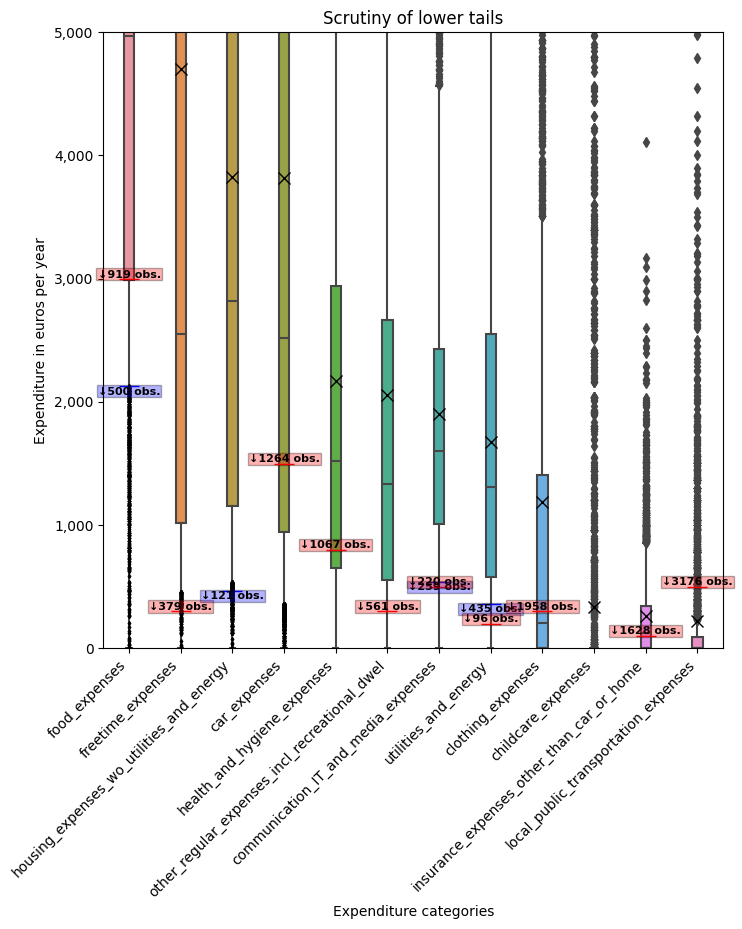

In [25]:
# Investigate lower tails

from matplotlib.axes import Axes
import matplotlib.ticker as ticker

fig, ax = plt.subplots(figsize=(8, 8))

# Format y tickers
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x:,.0f}'))

ax: Axes
sns.boxplot(data=household_consumption_data[target_variables_wo_total_sorted], ax=ax, width=0.2)
ax.set_ylim([0, 5000])
ax.set_xlabel('Expenditure categories')
ax.set_ylabel('Expenditure in euros per year', color='black')
ax.tick_params(axis='y', labelcolor='black')
ax.tick_params(axis='x', labelcolor='black')
ax.set_xticklabels(target_variables_wo_total_sorted, rotation=45, ha='right')

# Format y tickers
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x:,.0f}'))

# Add markers for 2, 3, and 4 standard deviations above the mean
mean = household_consumption_data[target_variables_wo_total_sorted].mean()
std = household_consumption_data[target_variables_wo_total_sorted].std()
mean_minus_stds = {} # The values of mean - 1 sigma, mean - 2 sigma etc.

num_below_mean_minus_std = {}  # Record the number of observations below mean - std
num_below_mean_minus_2std = {}  # Record the number of observations below mean - 2std
num_below_floor = {}

for target in target_variables_wo_total_sorted:
    mean_minus_stds[target] = (mean[target] - std[target], mean[target] - 2*std[target], mean[target] - 3*std[target], mean[target] - 4*std[target], mean[target] - 5*std[target], mean[target] - 6*std[target])
    num_below_mean_minus_std[target] = len(household_consumption_data[household_consumption_data[target] < mean_minus_stds[target][0]])
    num_below_mean_minus_2std[target] = len(household_consumption_data[household_consumption_data[target] < mean_minus_stds[target][1]])
    try:
        num_below_floor[target] = len(household_consumption_data[household_consumption_data[target] < min_expense_estimates_in_use[target][0]])
    except:
        pass

# Plot markers for each box
for i, m in enumerate(mean):
    ax.plot([i], [m], marker='x', markersize=8, color='black')
for i, std in enumerate(mean_minus_stds.values()):
    ax.plot([i], [std], marker='_', markersize=15, color='blue')

# Plot circles for observations lower than mean - std
for i, target in enumerate(target_variables_wo_total_sorted):
    try:
        ax.plot([i], min_expense_estimates_in_use[target][0], marker='_', markersize=15, color='red')
    except:
        pass
    for i, obs in enumerate(household_consumption_data[target].values.flatten()):
        if obs < mean_minus_stds[target][0]:
            ax.plot([target], [obs], marker='d', markersize=2, color='black')

# Print the number of observations below mean - std and below the floor set by minimum reference
for i, target in enumerate(target_variables_wo_total_sorted):
    if (mean_minus_stds[target][0] > 0):
        ax.text(i, mean_minus_stds[target][0], f'\u2193{num_below_mean_minus_std[target]} obs.', ha='center', va='top', color='black', fontweight='bold', fontsize=8, bbox=dict(boxstyle='square,pad=0.1',facecolor='blue', alpha=0.3))
    if (mean_minus_stds[target][1] > 0):
        ax.text(i, mean_minus_stds[target][1], f'\u2193{num_below_mean_minus_2std[target]} obs.', ha='center', va='top', color='black', fontweight='bold', fontsize=8, bbox=dict(boxstyle='square,pad=0.1',facecolor='blue', alpha=0.3))
    try:
        ax.text(i, min_expense_estimates_in_use[target][0], f'\u2193{num_below_floor[target]} obs.', ha='center', va='bottom', color='black', fontweight='bold', fontsize=8, bbox=dict(boxstyle='square,pad=0.1',facecolor='red', alpha=0.3))
    except:
        pass

plt.title("Scrutiny of lower tails")


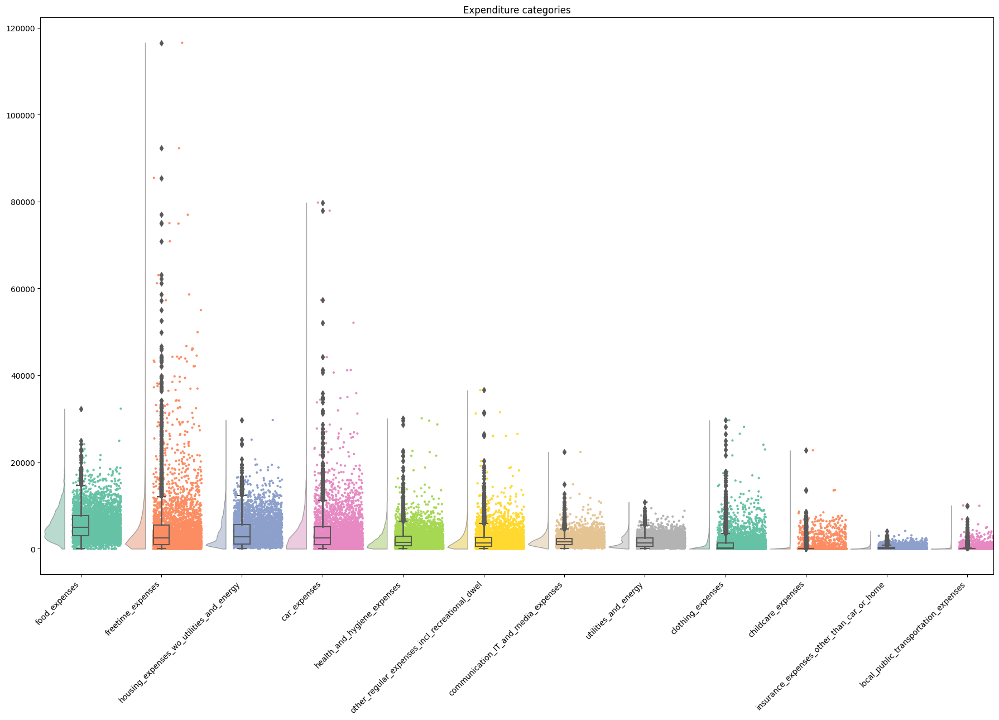

In [26]:
# Investigate lower tails with Raincloud plots
# Use ptitprince library to plot household_consumption_data[target_variables_wo_total_sorted]
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (18,13)
pt.RainCloud(data=household_consumption_data[target_variables_wo_total_sorted], width_box=0.2, orient='v', move=0.2, alpha=0.5, jitter=0.3, dodge=False, palette="Set2", bw=0.1, width_viol=0.5, scale="count")
plt.xticks(rotation=45, ha='right')
plt.title("Expenditure categories")
plt.tight_layout()
plt.show()



In [27]:
# Floor lower tails at the minimum expense for each household for the given target variable-

if (floor_lower_tails):
    target_variables_wo_missing = [target for target in target_variables if target not in ["childcare_expenses", "total_expenses", 'housing_expenses_wo_utilities_and_energy']]
    for target in target_variables_wo_missing:
        household_consumption_data.loc[household_consumption_data[target] <= min_expense_estimates_in_use[target][0] * (1+(household_consumption_data["aikuisia"]-1) *  min_expense_estimates_in_use[target][1] + household_consumption_data["muku"] * min_expense_estimates_in_use[target][2] + (household_consumption_data["peru"] + household_consumption_data["murk"]) * min_expense_estimates_in_use[target][3]), target] = min_expense_estimates_in_use[target][0] * (1+(household_consumption_data["aikuisia"]-1) * min_expense_estimates_in_use[target][1] + household_consumption_data["muku"] * min_expense_estimates_in_use[target][2] + (household_consumption_data["peru"] + household_consumption_data["murk"]) * min_expense_estimates_in_use[target][3])


In [28]:
# After flooring, how many rows with food_expenses equaling zero?
len(household_consumption_data[household_consumption_data["food_expenses"] == 0]) # = 0
len(household_consumption_data[(household_consumption_data["food_expenses"] == 0) & (household_consumption_data["freetime_expenses"] == 0)]) # = 0
len(household_consumption_data[household_consumption_data["freetime_expenses"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["health_and_hygiene_expenses"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["clothing_expenses"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["communication_IT_and_media_expenses"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["childcare_expenses"] == 0]) # = 3172
len(household_consumption_data[household_consumption_data["utilities_and_energy"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["insurance_expenses_other_than_car_or_home"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["other_regular_expenses_incl_recreational_dwel"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["housing_expenses_wo_utilities_and_energy"] == 0]) # = 1475
len(household_consumption_data[household_consumption_data["local_public_transportation_expenses"] == 0]) # = 0
len(household_consumption_data[household_consumption_data["car_expenses"] == 0]) # = 0


510

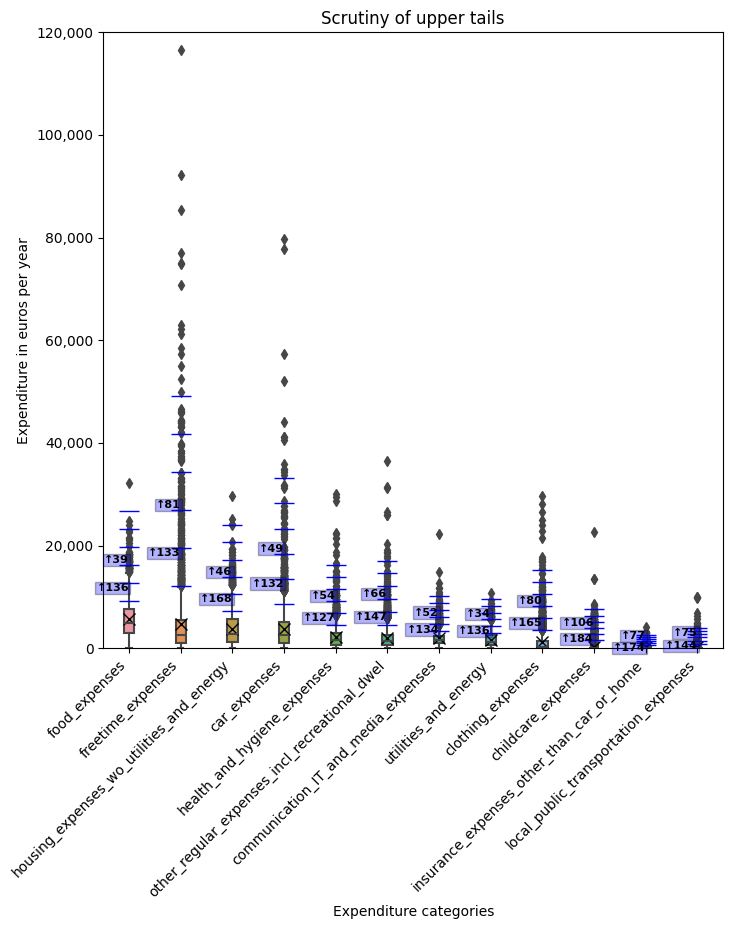

In [29]:
# Investigate upper tails

from matplotlib.axes import Axes
import matplotlib.ticker as ticker

import pandas as pd

fig, ax = plt.subplots(figsize=(8, 8))
# Plot the bar chart of the totals on the left axis
ax: Axes
sns.boxplot(data=household_consumption_data[target_variables_wo_total_sorted], ax=ax, width=0.2)
ax.set_xlabel('Expenditure categories')
# ax1.set_ylabel('Total sum', color='tab:blue')
ax.tick_params(axis='y', labelcolor='black')
ax.tick_params(axis='x', labelcolor='black')
ax.set_xticklabels(target_variables_wo_total_sorted, rotation=45, ha='right')

# Format y tickers
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x:,.0f}'))

ax.set_ylim([0, 120000])
ax.set_ylabel('Expenditure in euros per year', color='black')
ax.tick_params(axis='y', labelcolor='black')

# Format y tickers
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{x:,.0f}'))

# Add markers for 2, 3, and 4 standard deviations above the mean
mean = household_consumption_data[target_variables_wo_total_sorted].mean()
std = household_consumption_data[target_variables_wo_total_sorted].std()
mean_plus_stds = {}
num_above_mean_plus_3std = {}  # Record the number of observations above mean + 3 std
num_above_mean_plus_2std = {}  # Record the number of observations above mean + 2 std

for target in target_variables_wo_total_sorted:
    mean_plus_stds[target] = (mean[target] + std[target], mean[target] + 2*std[target], mean[target] + 3*std[target], mean[target] + 4*std[target], mean[target] + 5*std[target], mean[target] + 6*std[target])
    num_above_mean_plus_3std[target] = len(household_consumption_data[household_consumption_data[target] > mean_plus_stds[target][2]])
    num_above_mean_plus_2std[target] = len(household_consumption_data[household_consumption_data[target] > mean_plus_stds[target][1]])

# Plot markers for each box
for i, m in enumerate(mean):
    ax.plot([i], [m], marker='x', markersize=8, color='black')
for i, std in enumerate(mean_plus_stds.values()):
    ax.plot([i], [std], marker='_', markersize=15, color='blue')
    
# Print the number of observations above mean + 3std
for i, target in enumerate(target_variables_wo_total_sorted):
    if (num_above_mean_plus_3std[target] > 0):
        ax.text(i, mean_plus_stds[target][2], f'\u2191{num_above_mean_plus_3std[target]}', ha='right', va='bottom', color='black', fontweight="bold", fontsize=8, bbox=dict(boxstyle='square,pad=0.1', facecolor='blue', alpha=0.3))
    if (num_above_mean_plus_2std[target] > 0):
        ax.text(i, mean_plus_stds[target][1], f'\u2191{num_above_mean_plus_2std[target]}', ha='right', va='top', color='black', fontweight="bold", fontsize=8, bbox=dict(boxstyle='square,pad=0.1', facecolor='blue', alpha=0.3))

plt.title("Scrutiny of upper tails")
plt.show()


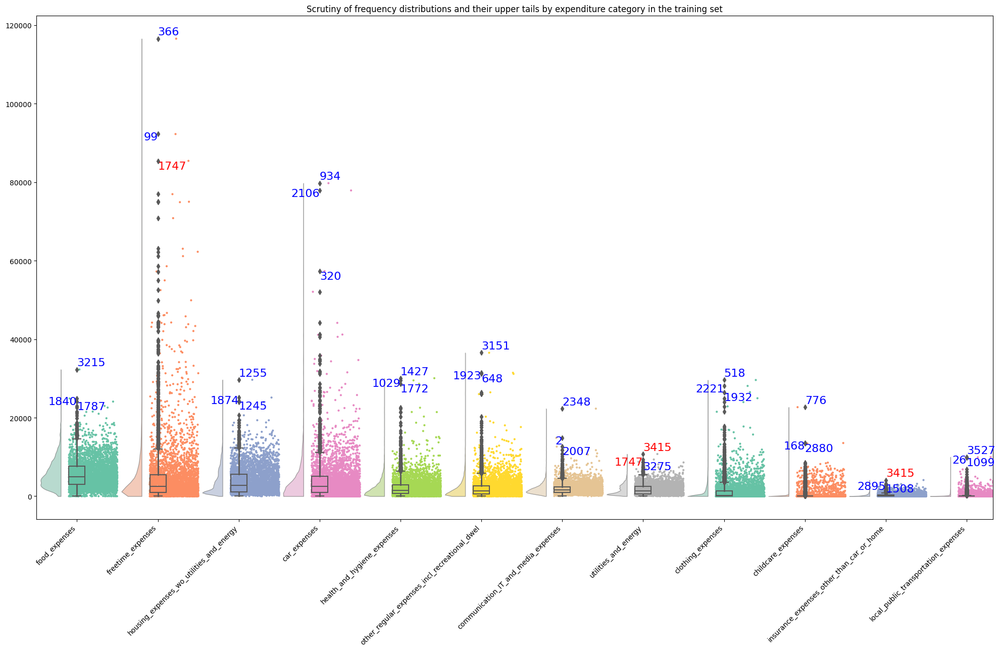

In [30]:
# Investigate upper tails with Raincloud plots
# Use ptitprince library to plot household_consumption_data[target_variables_wo_total_sorted]
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# Get top 3 expenditures and their indices for each group
top_expenditures_in_each_category = {}
index_frequency = defaultdict(int)

for group in target_variables_wo_total_sorted:
    group_data = household_consumption_data[group]
    sorted_indices = np.argsort(group_data)[::-1]
    top_expenditures_in_each_category[group] = [(i, group_data[i]) for i in sorted_indices[:3]]
    for i in sorted_indices[:3]:
        index_frequency[i] += 1

# Plotting
plt.rcParams["figure.figsize"] = (20,13)
ax = pt.RainCloud(data=household_consumption_data[target_variables_wo_total_sorted], width_viol=0.5, width_box=0.2, orient='v', move=0.2, alpha=0.5, jitter=0.3, dodge=False, palette="Set2", bw=0.1, scale="count")
plt.xticks(rotation=45, ha='right')
plt.title("Scrutiny of frequency distributions and their upper tails by expenditure category in the training set")

# Adding annotations
for i, group in enumerate(target_variables_wo_total_sorted):
    for j, (index, value) in enumerate(top_expenditures_in_each_category[group]):
        ha = 'left' if j % 2 == 0 else 'right'
        va = 'top' if j % 2 == 0 else 'bottom'
        color = 'red' if index_frequency[index] > 1 else 'blue'
        offset = 3000 if j % 3 == 0 else -2000  if j % 3 == 1 else 0# Add 100 for even indices, subtract 100 for odd indices
        ax.text(i, value + offset, str(index), color=color, ha=ha, va=va, size=16)

plt.tight_layout()
plt.show()


In [31]:
# Cap upper tails at mean + n * standard deviation
if (cap_upper_tails):
    for target in [target for target in target_variables if target != 'total_expenses']:
        mean = household_consumption_data[target].mean()
        std = household_consumption_data[target].std()
        threshold = mean + std_to_cap_at_or_drop_above * std
        household_consumption_data.loc[household_consumption_data[target] > threshold, target] = threshold


In [32]:
# Choose which columns to include in the modeling in the end.
columns_to_be_considered = ["nuts3", "taajama", "paak", "maka", "aikuisia", "ellu", "yli75v", "skidi", "muku", "peru", "murk", "isot", "Talotyyp", "ravuosi", "paalammi", "aspintaa", "huonluku",  "toimivia", "vamto", "pamto", "pika", "psup", "soss90", "ppika", "ppsup", "psoss90", "vaautom", "vamautom", "vatsautm", "vaasvaum", "vavenem", "Muuas", "muuasulk", "vapaikas", "vapaulk", "kaytetmk"]
target_variables = ["freetime_expenses", "food_expenses", "health_and_hygiene_expenses", "clothing_expenses", "communication_IT_and_media_expenses", "childcare_expenses", "utilities_and_energy", "insurance_expenses_other_than_car_or_home", "other_regular_expenses_incl_recreational_dwel", "housing_expenses_wo_utilities_and_energy", "local_public_transportation_expenses", "car_expenses"]

X = household_consumption_data[columns_to_be_considered].copy()
y = household_consumption_data[target_variables].copy()

y['total_expenses'] = y.sum(axis="columns")
target_variables.append('total_expenses')

# Sort the target variables in a descending order
target_variables = y.mean().sort_values(ascending=False).index.tolist()


In [33]:
# Make a termporary training set and profile it

# X_train, _, _, _ = train_test_split(X, y, shuffle=True, test_size=test_split_size_fraction, random_state=RS)

# from ydata_profiling import ProfileReport
# profile = ProfileReport(X_train,
#     title="Initial Profiling on X_train",
#     infer_dtypes=True,
#     missing_diagrams={
#         'bar': False,
#         'matrix': False,
#         'heatmap': False,
#         'dendrogram': False
#     },
#     correlations={
#         "auto": {"calculate": True},
#         "pearson": {"calculate": True},
#         "spearman": {"calculate": False},
#         "kendall": {"calculate": False},
#         "phi_k": {"calculate": False},
#         "cramers": {"calculate": False},
#     }
# )
# profile.to_file("initial_profile_of_all_columns4.html")


In [34]:
# Create a feature for the number of exclusively 64-75 yo persons
X["yli64v_alle75v"] = X["ellu"] - X["yli75v"]

# Create a feature for the number of exclusively 0-3 yo children
X["alle7v_yli3v"] = X["muku"] - X["skidi"]

# Create a feature for the number of exclusively under 64 yo adults, but who are not children of age of majority living as dependants with their parents
X["alle64v_aikuisia"] = X["aikuisia"] - X["ellu"] - X["isot"]

# Add all cars (passenger cars/vans, RVs, company-owned cars) together and remove the individual features
X["autoja"] = X["vaautom"]
X = X.drop(["vaautom"], axis=1)
X["autoja"] += X["vamautom"]
X = X.drop(["vamautom"], axis=1)
X["autoja"] += X["vatsautm"]
X = X.drop(["vatsautm"], axis=1)

# Ignore recreational dwelling and second home abroad
X = X.drop(["muuasulk"], axis=1)
X = X.drop(["vapaulk"], axis=1)

# Ignore trailers and boats
X = X.drop(["vaasvaum"], axis=1)
X = X.drop(["vavenem"], axis=1)

# Add recreational recreational dwellings and second homes together and remove the individual features
X.loc[:, "vapaa_ajan_tai_kakkosasunto"] = (X["Muuas"] == 1) | (X["vapaikas"] == 1)
X = X.drop(["Muuas", "vapaikas"], axis=1)

# And then those that are categorical features, coerce to "category"
categorical_columns = ["nuts3", "taajama", "paak", "maka", "Talotyyp", "paalammi", "vamto", "pamto", "psup", "soss90", "ppsup", "psoss90", "vapaa_ajan_tai_kakkosasunto"]
X[categorical_columns] = X[categorical_columns].astype("category")


In [35]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X.dtypes)


In [36]:
# Feature engineering


In [37]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X.dtypes)


In [38]:
# First coerce all the types apart from "maka" to integer, as some are float
columns_to_coerce_to_int = X.columns.tolist()
columns_to_coerce_to_int.remove("maka")
for col in columns_to_coerce_to_int:
    if (X[col].dtype == float):
        X.loc[:,col] = np.floor(X[col])

X[columns_to_coerce_to_int] = X[columns_to_coerce_to_int].astype(pd.Int64Dtype())


In [39]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X.dtypes)


In [40]:
# Print the number of missing values in each column before imputing NaNs
with pd.option_context('display.max_columns', None, 'display.max_colwidth', None, 'display.max_rows', None): display(X.isnull().sum())


nuts3                             0
taajama                           0
paak                              0
maka                              0
aikuisia                          0
ellu                              0
yli75v                            0
skidi                             0
muku                              0
peru                              0
murk                              0
isot                              0
Talotyyp                          0
ravuosi                           0
paalammi                         13
aspintaa                          0
huonluku                          0
toimivia                          0
vamto                             0
pamto                          1342
pika                              0
psup                              0
soss90                            0
ppika                          1342
ppsup                          1342
psoss90                        1342
kaytetmk                          0
yli64v_alle75v              

In [41]:
# Impute to the variables that have missing values:

categorical_columns = ["nuts3", "taajama", "paak", "maka", "Talotyyp", "paalammi", "vamto", "pamto", "psup", "soss90", "ppsup", "psoss90", "vapaa_ajan_tai_kakkosasunto"]
X[categorical_columns] = X[categorical_columns].astype("category")

# When no spouse, make the age of the spouse zero
X.loc[:, "ppika"] = X["ppika"].fillna(0)

# For categorical features with missing values, add a category
X.loc[:, "pamto"] = X["pamto"].cat.add_categories('no_spouse')
X.loc[:, "pamto"] = X.loc[:, "pamto"].fillna("no_spouse")

X.loc[:, "ppsup"] = X["ppsup"].cat.add_categories('no_spouse')
X.loc[:, "ppsup"] = X.loc[:, "ppsup"].fillna("no_spouse")

X.loc[:, "psoss90"] = X["psoss90"].cat.add_categories('no_spouse')
X.loc[:, "psoss90"] = X.loc[:, "psoss90"].fillna("no_spouse")

X.loc[:, "paalammi"] = X["paalammi"].cat.add_categories('unknown')
X.loc[:, "paalammi"] = X.loc[:, "paalammi"].fillna("unknown")


In [42]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X.dtypes)


In [43]:
# Print the number of missing values in each column after imputing
with pd.option_context('display.max_columns', None, 'display.max_colwidth', None, 'display.max_rows', None): display(X.isnull().sum())


nuts3                          0
taajama                        0
paak                           0
maka                           0
aikuisia                       0
ellu                           0
yli75v                         0
skidi                          0
muku                           0
peru                           0
murk                           0
isot                           0
Talotyyp                       0
ravuosi                        0
paalammi                       0
aspintaa                       0
huonluku                       0
toimivia                       0
vamto                          0
pamto                          0
pika                           0
psup                           0
soss90                         0
ppika                          0
ppsup                          0
psoss90                        0
kaytetmk                       0
yli64v_alle75v                 0
alle7v_yli3v                   0
alle64v_aikuisia               0
autoja    

In [44]:
# Select columns in narrow_set_of_columns
narrowed_down_columns_to_be_considered = ["nuts3", "paak", "aikuisia", "ellu", "yli75v", "skidi", "muku", "peru", "murk", "isot", "Talotyyp", "ravuosi", "paalammi", "aspintaa", "huonluku",  "toimivia", "pika", "psup", "soss90", "ppika", "ppsup", "psoss90", "autoja", "vapaa_ajan_tai_kakkosasunto", "kaytetmk", "yli64v_alle75v", "alle7v_yli3v", "alle64v_aikuisia"]
X = X[narrowed_down_columns_to_be_considered]
categorical_columns = list(set(categorical_columns).intersection(narrowed_down_columns_to_be_considered))
family_composition_columns = ["aikuisia", "ellu", "yli75v", "skidi", "muku", "peru", "murk", "isot", "yli64v_alle75v", "alle7v_yli3v", "alle64v_aikuisia"]
numeric_columns = X.select_dtypes(include=[np.number]).columns.tolist()
numeric_columns_with_wider_distributions = ["aspintaa", "huonluku", "pika", "ppika", "ravuosi"]
numeric_columns_with_wider_distributions = numeric_columns_with_wider_distributions


In [45]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X.dtypes)


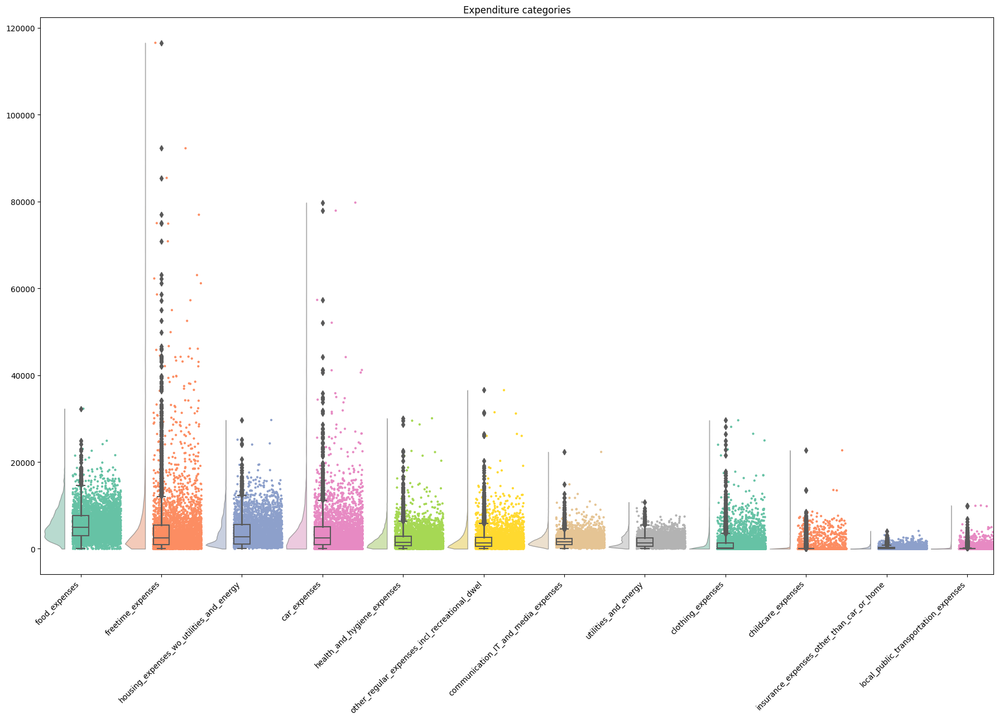

In [46]:
# Investigate the distributions with Raincloud plots
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (18,13)
import pandas as pd

# pt.RainCloud(data=y, width_viol=7, width_box=0.2, orient='v', move=0.2, alpha=0.5, jitter=0.3, dodge=False, palette="Set2", bw=0.1)
pt.RainCloud(data=household_consumption_data[target_variables_wo_total_sorted], width_box=0.2, orient='v', move=0.2, alpha=0.5, jitter=0.3, dodge=False, palette="Set2", bw=0.1, width_viol=0.5, scale="count")
plt.xticks(rotation=45, ha='right')
plt.title("Expenditure categories")
plt.tight_layout()
plt.show()


In [47]:
from sklearn.model_selection import KFold, train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=test_split_size_fraction, random_state=RS)


In [48]:
# Discard upper tails at or above std_to_cap_at_or_drop_above
X_train_dict = {}
X_test_dict = {}
y_train_dict = {}
y_test_dict = {}

# y_train_upper_tails_discarded = pd.DataFrame(index=y_train.index)
y_train_upper_tails_discarded = y_train.copy()
# y_test_upper_tails_discarded = pd.DataFrame(index=y_test.index)
y_test_upper_tails_discarded = y_test.copy()

X_train_upper_tails_discarded = pd.DataFrame(index=X_train.index)
X_test_upper_tails_discarded = pd.DataFrame(index=X_test.index)
if (drop_upper_tails):
    for target in [target for target in target_variables if target != 'total_expenses']:
    # for target in [target for target in target_variables]:
        # target = "housing_expenses_wo_utilities_and_energy"
        mean = y_train[target].mean()
        std = y_train[target].std()
        threshold = mean + std_to_cap_at_or_drop_above * std
        
        # Select only rows of y[target] below the threshold, and the equivalent rows in X_train_dict[target] 
        y_train_dict[target] = y_train[target][y_train[target] < threshold]
        y_test_dict[target] = y_test[target][y_test[target] < threshold]
        # Index X with boolean mask [y_dict[target] <= threshold] and assign to X_dict[target]
        X_train_dict[target] = X_train.loc[y_train_dict[target].dropna().index]
        X_test_dict[target] = X_test.loc[y_test_dict[target].dropna().index]
        
        # These are to be used with multi-target predictors, and for multi-target we want to clip/cap instead of discard, because discarding forces us to impute means/medians to fill the gaps and those make the prediction performance bad for a multitarget predictor.
        y_train_upper_tails_discarded.loc[y_train_upper_tails_discarded[target] >= threshold, target] = threshold
        y_test_upper_tails_discarded.loc[y_test_upper_tails_discarded[target] >= threshold, target] = threshold

    # These also to be used with multi-target predictors:
    X_train_upper_tails_discarded = X_train.loc[y_train_upper_tails_discarded.index]
    X_test_upper_tails_discarded = X_test.loc[y_test_upper_tails_discarded.index]

else:
    for target in [target for target in target_variables if target != 'total_expenses']:
        X_train_dict[target] = X_train
        X_test_dict[target] = X_test
        y_train_dict[target] = y_train[target]
        y_test_dict[target] = y_test[target]
    y_train_upper_tails_discarded = y_train
    y_test_upper_tails_discarded = y_test
    X_train_upper_tails_discarded = X_train
    X_test_upper_tails_discarded = X_test


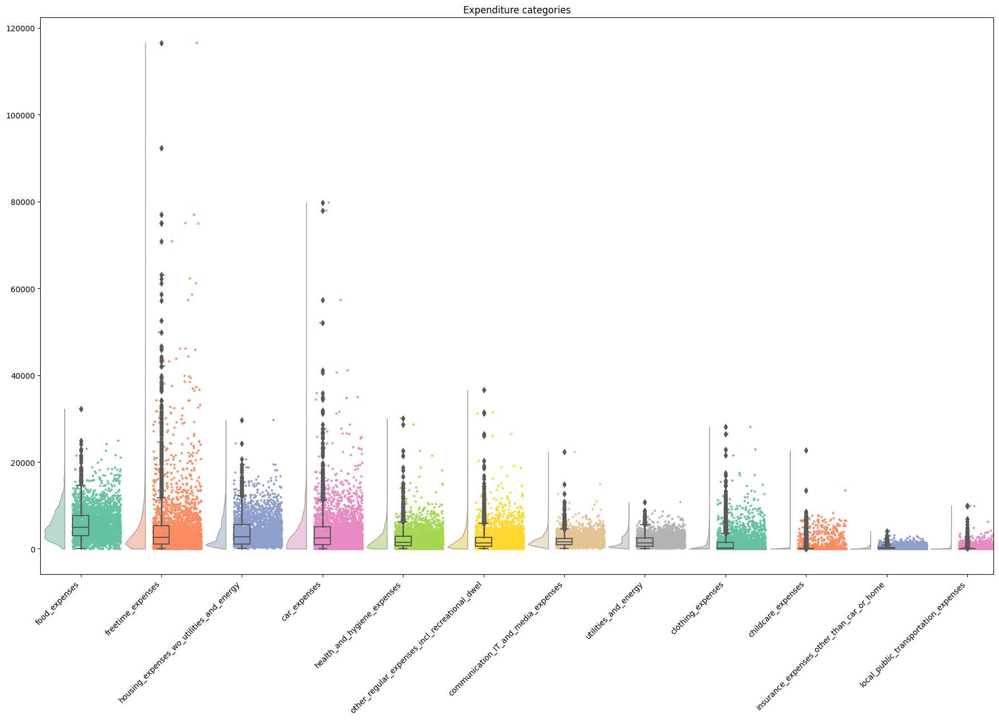

In [49]:
# See dropped upper tails with Raincloud plots
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (18,13)
import pandas as pd
y_train_dict_df = pd.DataFrame(y_train_dict)
pt.RainCloud(data=y_train_dict_df, width_box=0.2, orient='v', move=0.2, alpha=0.5, jitter=0.3, dodge=False, palette="Set2", bw=0.1, width_viol=0.5, scale="count")
plt.xticks(rotation=45, ha='right')
plt.title("Expenditure categories")
plt.tight_layout()
plt.show()


In [50]:
# Discard lower tails below or at the minimum expense for each household for the given target variable:
target_variables_wo_missing = [target for target in target_variables if target not in ["childcare_expenses", "total_expenses", 'housing_expenses_wo_utilities_and_energy']]
y_train_upper_and_lower_tails_discarded = y_train_upper_tails_discarded.copy()
y_test_upper_and_lower_tails_discarded = y_test_upper_tails_discarded.copy()
X_train_multitarget = X_train_upper_tails_discarded.copy()
X_test_multitarget = X_test_upper_tails_discarded.copy()

if (drop_lower_tails):
    for target in target_variables_wo_missing:
        # Select only rows of y[target] above the minimum expense of the given target, and the equivalent rows in X_train[target]
        y_train_dict[target] = y_train_dict[target][y_train_dict[target] > min_expense_estimates_in_use[target][0] * (1+((X_train_dict[target]["alle64v_aikuisia"]+X_train_dict[target]["yli64v_alle75v"]+X_train_dict[target]["yli75v"])-1)*min_expense_estimates_in_use[target][1] + (X_train_dict[target]["skidi"]+X_train_dict[target]["alle7v_yli3v"])* min_expense_estimates_in_use[target][2] + (X_train_dict[target]["peru"] + X_train_dict[target]["murk"]) * min_expense_estimates_in_use[target][3])]
        y_test_dict[target] = y_test_dict[target][y_test_dict[target] > min_expense_estimates_in_use[target][0] * (1+((X_test_dict[target]["alle64v_aikuisia"]+X_test_dict[target]["yli64v_alle75v"]+X_test_dict[target]["yli75v"])-1)*min_expense_estimates_in_use[target][1] + (X_test_dict[target]["skidi"]+X_test_dict[target]["alle7v_yli3v"])* min_expense_estimates_in_use[target][2] + (X_test_dict[target]["peru"] + X_test_dict[target]["murk"]) * min_expense_estimates_in_use[target][3])]
        
        X_train_dict[target] = X_train_dict[target].loc[y_train_dict[target].dropna().index]
        X_test_dict[target] = X_test_dict[target].loc[y_test_dict[target].dropna().index]
        
        # These are to be used for multi-target problems, and for multi-target we want to clip/cap instead of discard:
        y_train_upper_and_lower_tails_discarded.loc[y_train_upper_and_lower_tails_discarded[target] <= min_expense_estimates_in_use[target][0] * (1+(X_train_upper_tails_discarded["alle64v_aikuisia"]-1) *  min_expense_estimates_in_use[target][1] + X_train_upper_tails_discarded["muku"] * min_expense_estimates_in_use[target][2] + (X_train_upper_tails_discarded["peru"] + X_train_upper_tails_discarded["murk"]) * min_expense_estimates_in_use[target][3]), target] = min_expense_estimates_in_use[target][0] * (1+(X_train_upper_tails_discarded["alle64v_aikuisia"]-1) * min_expense_estimates_in_use[target][1] + X_train_upper_tails_discarded["muku"] * min_expense_estimates_in_use[target][2] + (X_train_upper_tails_discarded["peru"] + X_train_upper_tails_discarded["murk"]) * min_expense_estimates_in_use[target][3])
        y_test_upper_and_lower_tails_discarded.loc[y_test_upper_and_lower_tails_discarded[target] <= min_expense_estimates_in_use[target][0] * (1+(X_test_upper_tails_discarded["alle64v_aikuisia"]-1) *  min_expense_estimates_in_use[target][1] + X_test_upper_tails_discarded["muku"] * min_expense_estimates_in_use[target][2] + (X_test_upper_tails_discarded["peru"] + X_test_upper_tails_discarded["murk"]) * min_expense_estimates_in_use[target][3]), target] = min_expense_estimates_in_use[target][0] * (1+(X_test_upper_tails_discarded["alle64v_aikuisia"]-1) * min_expense_estimates_in_use[target][1] + X_test_upper_tails_discarded["muku"] * min_expense_estimates_in_use[target][2] + (X_test_upper_tails_discarded["peru"] + X_test_upper_tails_discarded["murk"]) * min_expense_estimates_in_use[target][3])

y_train_multitarget = y_train_upper_and_lower_tails_discarded
y_test_multitarget = y_test_upper_and_lower_tails_discarded
X_train_multitarget = X_train_upper_tails_discarded.loc[y_train_multitarget.dropna(axis="columns", how='all').index]
X_test_multitarget = X_test_upper_tails_discarded.loc[y_test_multitarget.dropna(axis="columns", how='all').index]

# Compute the total expenses and assign to a its own key in the dictionarites and column in the dataframe
y_train_dict["total_expenses"] = pd.DataFrame(y_train_dict, index=y_train.index).sum(axis="columns")
y_train_dict["total_expenses"].rename("total_expenses", inplace=True)
y_test_dict["total_expenses"] = pd.DataFrame(y_test_dict, index=y_test.index).sum(axis="columns")
y_test_dict["total_expenses"].rename("total_expenses", inplace=True)
X_train_dict["total_expenses"] = X_train_multitarget
X_test_dict["total_expenses"] = X_test_multitarget


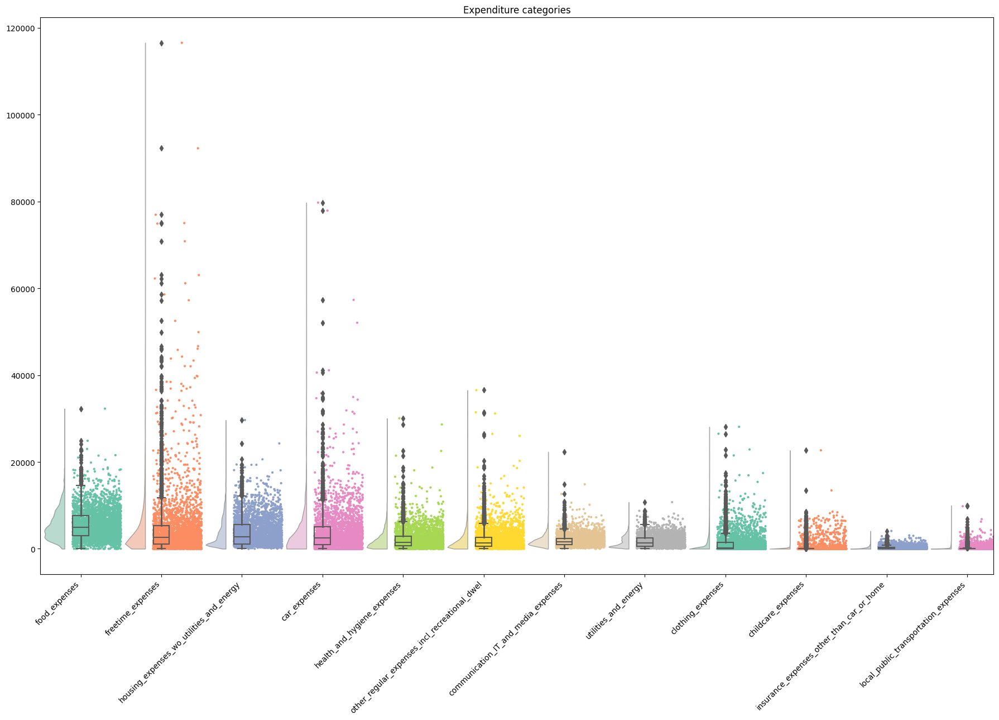

In [51]:
# See dropped lower tails with Raincloud plots
import ptitprince as pt
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (18,13)
y_train_dict_df = pd.DataFrame(y_train_dict).drop("total_expenses", axis="columns")
pt.RainCloud(data=y_train_dict_df, width_box=0.2, orient='v', move=0.2, alpha=0.5, jitter=0.3, dodge=False, palette="Set2", bw=0.1, width_viol=0.5, scale="count")
plt.xticks(rotation=45, ha='right')
plt.title("Expenditure categories")
plt.tight_layout()
plt.show()


In [52]:
# # Profiling of the numeric columns of train set before any transformations and scaling
# from ydata_profiling import ProfileReport
# profile = ProfileReport(X_train[numeric_columns],
#     title="Pandas Profiling Report",
#     infer_dtypes=False,
#     missing_diagrams={
#         'bar': False,
#         'matrix': True,
#         'heatmap': True,
#         'dendrogram': False
#     },
#     explorative=True,
#     correlations=None
# )
# profile.to_file("Reports/initial_profile_of_numeric_columns2.html")


In [53]:
# Keep a copy with "ellu" (over 64yo), "muku" (under 7yo), and "aikuisia" (adults)
X_train_unscaled_untransformed_w_ellu_muku_aikuisia_dict,X_test_unscaled_untransformed_w_ellu_muku_aikuisia_dict = {}, {}
for target in [target for target in target_variables]:
    X_train_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target] = X_train_dict[target].copy()
    X_test_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target] = X_test_dict[target].copy()
    
X_train_unscaled_untransformed_w_ellu_muku_aikuisia = X_train_multitarget.copy()
X_test_unscaled_untransformed_w_ellu_muku_aikuisia = X_test_multitarget.copy()


In [54]:
# Drop "ellu" (over 64yo), "muku" (under 7yo), and "aikuisia" (adults) from the train and test set
X_train_unscaled_untransformed_dict, X_test_unscaled_untransformed_dict = {}, {}
for target in [target for target in target_variables]:
    X_train_unscaled_untransformed_dict[target] = X_train_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target].drop(["ellu", "muku", "aikuisia"], axis=1)
    X_test_unscaled_untransformed_dict[target] = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target].drop(["ellu", "muku", "aikuisia"], axis=1)
    
X_train_unscaled_untransformed = X_train_unscaled_untransformed_w_ellu_muku_aikuisia.drop(["ellu", "muku", "aikuisia"], axis=1)
X_test_unscaled_untransformed = X_test_unscaled_untransformed_w_ellu_muku_aikuisia.drop(["ellu", "muku", "aikuisia"], axis=1)


In [55]:
# One-hot encode unscaled and untransformed
X_train_unscaled_untransformed_onehot_encoded_dict, X_test_unscaled_untransformed_onehot_encoded_dict, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict, X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict = {}, {}, {}, {}
for target in [target for target in target_variables]:
    X_train_unscaled_untransformed_onehot_encoded_dict[target] = pd.get_dummies(X_train_unscaled_untransformed_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_test_unscaled_untransformed_onehot_encoded_dict[target] = pd.get_dummies(X_test_unscaled_untransformed_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target] = pd.get_dummies(X_train_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target] = pd.get_dummies(X_test_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target], columns=list(set(categorical_columns)), drop_first=True)

X_train_unscaled_untransformed_onehot_encoded = pd.get_dummies(X_train_unscaled_untransformed, columns=list(set(categorical_columns)), drop_first=True)
X_test_unscaled_untransformed_onehot_encoded = pd.get_dummies(X_test_unscaled_untransformed, columns=list(set(categorical_columns)), drop_first=True)
X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded = pd.get_dummies(X_train_unscaled_untransformed_w_ellu_muku_aikuisia, columns=list(set(categorical_columns)), drop_first=True)
X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded = pd.get_dummies(X_test_unscaled_untransformed_w_ellu_muku_aikuisia, columns=list(set(categorical_columns)), drop_first=True)

onehot_encoded_columns = [col for col in X_train_unscaled_untransformed_w_ellu_muku_aikuisia.columns if col not in numeric_columns]


In [56]:
# Make all columns that are of type float to be of type int in X_train_unscaled_int_onehot_encoded
for target in [target for target in target_variables]:
    for col in X_train_unscaled_untransformed_onehot_encoded_dict[target].columns:
        if X_train_unscaled_untransformed_onehot_encoded_dict[target][col].dtype == np.float64:
            X_train_unscaled_untransformed_onehot_encoded_dict[target][col] = X_train_unscaled_untransformed_onehot_encoded_dict[target][col].astype(int)
            X_test_unscaled_untransformed_onehot_encoded_dict[target][col] = X_test_unscaled_untransformed_onehot_encoded_dict[target][col].astype(int)
            
for col in X_train_unscaled_untransformed_onehot_encoded.columns:
    if X_train_unscaled_untransformed_onehot_encoded[col].dtype == np.float64:
        X_train_unscaled_untransformed_onehot_encoded[col] = X_train_unscaled_untransformed_onehot_encoded[col].astype(int)
        X_test_unscaled_untransformed_onehot_encoded[col] = X_test_unscaled_untransformed_onehot_encoded[col].astype(int)


In [57]:
##
## Transformation and scaling
##


In [58]:
X_train_unscaled_transformed_dict, X_test_unscaled_transformed_dict = {}, {}
for target in [target for target in target_variables]:
    X_train_unscaled_transformed_dict[target] = X_train_dict[target].copy()
    X_test_unscaled_transformed_dict[target] = X_test_dict[target].copy()

X_train_unscaled_transformed = X_train_multitarget.copy()
X_test_unscaled_transformed = X_test_multitarget.copy()


In [59]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_unscaled_transformed.dtypes)


In [60]:
# Subtract the minimum value from the ravuosi and kaytetmk them make it start from zero
columns_to_shift_to_zero = ["ravuosi"]
for target in [target for target in target_variables]:
    for col in columns_to_shift_to_zero:
        min_val = X_train_dict[target][col].min()
        X_train_unscaled_transformed_dict[target][col] = X_train_dict[target][col] - min_val
        X_test_unscaled_transformed_dict[target][col] = X_test_dict[target][col] - min_val
        
min_val = {}
for col in columns_to_shift_to_zero:
    min_val[col] = X_train_unscaled_transformed[col].min()
    X_train_unscaled_transformed[col] = X_train_unscaled_transformed[col] - min_val[col]
    X_test_unscaled_transformed[col] = X_test_unscaled_transformed[col] - min_val[col]

# Transformations

# Log-transform
X_train_unscaled_transformed_dict[target]["aspintaa"] = np.log(X_train_unscaled_transformed_dict[target]["aspintaa"]) / np.log(2)
X_test_unscaled_transformed_dict[target]["aspintaa"] = np.log(X_test_unscaled_transformed_dict[target]["aspintaa"]) / np.log(2)
X_train_unscaled_transformed["aspintaa"]  = np.log(X_train_unscaled_transformed["aspintaa"]) / np.log(2)
X_test_unscaled_transformed["aspintaa"]  = np.log(X_test_unscaled_transformed["aspintaa"]) / np.log(2)

# Power transform
X_train_unscaled_transformed_dict[target]["ravuosi"] = np.power(X_train_unscaled_transformed_dict[target]["ravuosi"], 1.5)
X_test_unscaled_transformed_dict[target]["ravuosi"] = np.power(X_test_unscaled_transformed_dict[target]["ravuosi"], 1.5)
X_train_unscaled_transformed["ravuosi"] = np.power(X_train_unscaled_transformed["ravuosi"], 1.5)
X_test_unscaled_transformed["ravuosi"] = np.power(X_test_unscaled_transformed["ravuosi"], 1.5)

# Root transform
columns_to_root_transform = ["pika", "ppika"]
for col in columns_to_root_transform:
    X_train_unscaled_transformed_dict[target][col] = X_train_unscaled_transformed_dict[target][col]**(5/6)
    X_test_unscaled_transformed_dict[target][col] = X_test_unscaled_transformed_dict[target][col]**(5/6)
    X_train_unscaled_transformed[col] = X_train_unscaled_transformed[col]**(5/6)
    X_test_unscaled_transformed[col] = X_test_unscaled_transformed[col]**(5/6)

X_train_unscaled_transformed_dict[target]["kaytetmk"] = X_train_unscaled_transformed_dict[target]["kaytetmk"]**(1/2)
X_test_unscaled_transformed_dict[target]["kaytetmk"] = X_test_unscaled_transformed_dict[target]["kaytetmk"]**(1/2)
X_train_unscaled_transformed["kaytetmk"] = X_train_unscaled_transformed["kaytetmk"]**(1/2)
X_test_unscaled_transformed["kaytetmk"] = X_test_unscaled_transformed["kaytetmk"]**(1/2)


In [61]:
# Scaling


In [62]:
# # Profiling of the train set numeric columns after transformations
# from ydata_profiling import ProfileReport
# profile = ProfileReport(X_train_transformed[numeric_columns],
#     title="Pandas Profiling Report",
#     infer_dtypes=False,
#     missing_diagrams={
#         'bar': False,
#         'matrix': True,
#         'heatmap': True,
#         'dendrogram': False
#     },
#     explorative=True,
#     correlations=None
# )
# profile.to_file("Reports/profile_of_numeric_columns_after_transformations.html")


In [63]:
## Standardization scaling
from sklearn.preprocessing import StandardScaler

# Select columns standardize scale in X_train

std_scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and test data with the same scaler.
# This first transformation is if we want to have some columsn standardized, while others are min-max scaled.
# columns_to_standardize_scale = ["aspintaa", "huonluku", "pika"]
X_train_std_scaled_dict = {}
X_test_std_scaled_dict = {}
columns_to_standardize_scale = []
for target in [target for target in target_variables]:
    try:
        X_train_std_scaled_dict[target] = pd.DataFrame(std_scaler.fit_transform(X_train_dict[target][columns_to_standardize_scale]), columns=columns_to_standardize_scale, index=X_train_dict[target].index)
    except:
        X_train_std_scaled_dict[target] = pd.DataFrame()
    try:
        X_test_std_scaled_dict[target] = pd.DataFrame(std_scaler.transform(X_test_dict[target][columns_to_standardize_scale]), columns=columns_to_standardize_scale, index=X_test_dict[target].index)
    except:
        X_test_std_scaled_dict[target] = pd.DataFrame()

try:
    X_train_std_scaled = pd.DataFrame(std_scaler.fit_transform(X_train_multitarget[columns_to_standardize_scale]), columns=columns_to_standardize_scale, index=X_train_multitarget.index)
except:
    X_train_std_scaled = pd.DataFrame()
try:
    X_test_std_scaled = pd.DataFrame(std_scaler.transform(X_test_multitarget[columns_to_standardize_scale]), columns=columns_to_standardize_scale, index=X_test_multitarget.index)
except:
    X_test_std_scaled = pd.DataFrame()

# Here we standardize all numeric columns
X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia_dict = {}
X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia_dict = {}
for target in [target for target in target_variables]:
    # X_train_dict[target][numeric_columns].describe()
    X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia_dict[target] = pd.DataFrame(std_scaler.fit_transform(X_train_dict[target][numeric_columns]), columns=numeric_columns, index=X_train_dict[target].index)
    X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia_dict[target] = pd.DataFrame(std_scaler.transform(X_test_dict[target][numeric_columns]), columns=numeric_columns, index=X_test_dict[target].index)
    
X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia = pd.DataFrame(std_scaler.fit_transform(X_train_multitarget[numeric_columns]), columns=numeric_columns, index=X_train_multitarget.index)
X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia = pd.DataFrame(std_scaler.transform(X_test_multitarget[numeric_columns]), columns=numeric_columns, index=X_test_multitarget.index)


In [64]:
## Min-max scaling
from sklearn.preprocessing import MinMaxScaler

# Min-max scale all numeric columns that are not in columns_to_standardize_scale
columns_to_minmax_scale = [col for col in numeric_columns if col not in columns_to_standardize_scale]
X_train_minmax_scaled_dict = {}
X_test_minmax_scaled_dict = {}
minmax_scaler_dict = {}

for target in [target for target in target_variables]:
    minmax_scaler_dict[target] = MinMaxScaler()
    X_train_minmax_scaled_dict[target] = pd.DataFrame(minmax_scaler_dict[target].fit_transform(X_train_unscaled_transformed_dict[target][columns_to_minmax_scale]), columns=columns_to_minmax_scale, index=X_train_unscaled_transformed_dict[target].index)
    X_test_minmax_scaled_dict[target] = pd.DataFrame(minmax_scaler_dict[target].transform(X_test_unscaled_transformed_dict[target][columns_to_minmax_scale]), columns=columns_to_minmax_scale, index=X_test_unscaled_transformed_dict[target].index)

minmax_scaler = MinMaxScaler()
X_train_minmax_scaled = pd.DataFrame(minmax_scaler.fit_transform(X_train_unscaled_transformed[columns_to_minmax_scale]), columns=columns_to_minmax_scale, index=X_train_unscaled_transformed.index)
X_test_minmax_scaled = pd.DataFrame(minmax_scaler.transform(X_test_unscaled_transformed[columns_to_minmax_scale]), columns=columns_to_minmax_scale, index=X_test_unscaled_transformed.index)


In [65]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_minmax_scaled.dtypes)


In [66]:
# Merge the standardization scaled and min-max scaled features into one
X_train_scaled_transformed_w_ellu_muku_aikuisia_dict = {}
X_test_scaled_transformed_w_ellu_muku_aikuisia_dict = {}

for target in [target for target in target_variables]:
    X_train_scaled_transformed_w_ellu_muku_aikuisia_dict[target] = pd.concat([X_train_std_scaled_dict[target], X_train_minmax_scaled_dict[target]], axis=1)
    X_test_scaled_transformed_w_ellu_muku_aikuisia_dict[target]  = pd.concat([X_test_std_scaled_dict[target], X_test_minmax_scaled_dict[target]], axis=1)

X_train_scaled_transformed_w_ellu_muku_aikuisia = pd.concat([X_train_std_scaled, X_train_minmax_scaled], axis=1)
X_test_scaled_transformed_w_ellu_muku_aikuisia  = pd.concat([X_test_std_scaled, X_test_minmax_scaled], axis=1)

# And categorical and the scaled features into one:
for target in [target for target in target_variables]:
    X_train_scaled_transformed_w_ellu_muku_aikuisia_dict[target] = pd.concat([X_train_scaled_transformed_w_ellu_muku_aikuisia_dict[target], X_train_dict[target][categorical_columns]], axis=1)
    X_test_scaled_transformed_w_ellu_muku_aikuisia_dict[target]  = pd.concat([X_test_scaled_transformed_w_ellu_muku_aikuisia_dict[target], X_test_dict[target][categorical_columns]], axis=1)

X_train_scaled_transformed_w_ellu_muku_aikuisia  = pd.concat([X_train_scaled_transformed_w_ellu_muku_aikuisia, X_train_multitarget[categorical_columns]], axis=1)
X_test_scaled_transformed_w_ellu_muku_aikuisia  = pd.concat([X_test_scaled_transformed_w_ellu_muku_aikuisia, X_test_multitarget[categorical_columns]], axis=1)

# And categorical and all numeric std scaled into one:
X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict = {}
X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict = {}

for target in [target for target in target_variables]:
    X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict[target]  = pd.concat([X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia_dict[target], X_train_dict[target][categorical_columns]], axis=1)
    X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict[target]  = pd.concat([X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia_dict[target], X_test_dict[target][categorical_columns]], axis=1)

X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia  = pd.concat([X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia, X_train_multitarget[categorical_columns]], axis=1)
X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia  = pd.concat([X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia, X_test_multitarget[categorical_columns]], axis=1)


In [67]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_scaled_transformed_w_ellu_muku_aikuisia.dtypes)
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_test_scaled_transformed_w_ellu_muku_aikuisia.dtypes)


In [68]:
## Profiling of the train set numeric columns after transformation and scaling
# from ydata_profiling import ProfileReport
# profile = ProfileReport(X_train_scaled[numeric_columns],
#     title="Pandas Profiling Report",
#     infer_dtypes=False,
#     missing_diagrams={
#         'bar': False,
#         'matrix': True,
#         'heatmap': True,
#         'dendrogram': False
#     },
#     explorative=True,
#     correlations=None
# )
# profile.to_file("profile_of_numeric_columns_after_transformations_and_scaling.html")


In [69]:
# Drop "ellu" (over 64yo), "muku" (under 7yo) and "aikuisia" (adults under 64yo)

X_train_scaled_transformed_dict = {}
X_test_scaled_transformed_dict = {}
X_train_all_numeric_std_scaled_transformed_dict = {}
X_test_all_numeric_std_scaled_transformed_dict = {}

for target in [target for target in target_variables]:
    X_train_scaled_transformed_dict[target] = X_train_scaled_transformed_w_ellu_muku_aikuisia_dict[target].drop(["ellu", "muku", "aikuisia"], axis=1)
    X_test_scaled_transformed_dict[target] = X_test_scaled_transformed_w_ellu_muku_aikuisia_dict[target].drop(["ellu", "muku", "aikuisia"], axis=1)
    X_train_all_numeric_std_scaled_transformed_dict[target] = X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict[target].drop(["ellu", "muku", "aikuisia"], axis=1)
    X_test_all_numeric_std_scaled_transformed_dict[target] = X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict[target].drop(["ellu", "muku", "aikuisia"], axis=1)

X_train_scaled_transformed = X_train_scaled_transformed_w_ellu_muku_aikuisia.drop(["ellu", "muku", "aikuisia"], axis=1)
X_test_scaled_transformed = X_test_scaled_transformed_w_ellu_muku_aikuisia.drop(["ellu", "muku", "aikuisia"], axis=1)
X_train_all_numeric_std_scaled_transformed = X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia.drop(["ellu", "muku", "aikuisia"], axis=1)
X_test_all_numeric_std_scaled_transformed = X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia.drop(["ellu", "muku", "aikuisia"], axis=1)

numeric_columns_wo_ellu_muku_aikuisia = list(set(numeric_columns) - set(["ellu", "muku", "aikuisia"]))


In [70]:
# One-hot encode

X_train_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded_dict = {}
X_test_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded_dict = {}
X_train_scaled_transformed_onehot_encoded_dict = {}
X_test_scaled_transformed_onehot_encoded_dict = {}
X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia_onehot_encoded_dict = {}
X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia_onehot_encoded_dict = {}
X_train_all_numeric_std_scaled_transformed_onehot_encoded_dict = {}
X_test_all_numeric_std_scaled_transformed_onehot_encoded_dict = {}

for target in [target for target in target_variables]:
    X_train_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target] = pd.get_dummies(
        [target], columns=list(set(categorical_columns)), drop_first=True)
    X_test_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target] = pd.get_dummies(X_test_scaled_transformed_w_ellu_muku_aikuisia_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_train_scaled_transformed_onehot_encoded_dict[target] = pd.get_dummies(X_train_scaled_transformed_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_test_scaled_transformed_onehot_encoded_dict[target] = pd.get_dummies(X_test_scaled_transformed_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia_onehot_encoded_dict[target] = pd.get_dummies(X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia_onehot_encoded_dict[target] = pd.get_dummies(X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_train_all_numeric_std_scaled_transformed_onehot_encoded_dict[target] = pd.get_dummies(X_train_all_numeric_std_scaled_transformed_dict[target], columns=list(set(categorical_columns)), drop_first=True)
    X_test_all_numeric_std_scaled_transformed_onehot_encoded_dict[target] = pd.get_dummies(X_test_all_numeric_std_scaled_transformed_dict[target], columns=list(set(categorical_columns)), drop_first=True)

X_train_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded = pd.get_dummies(X_train_scaled_transformed_w_ellu_muku_aikuisia, columns=list(set(categorical_columns)), drop_first=True)
X_test_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded = pd.get_dummies(X_test_scaled_transformed_w_ellu_muku_aikuisia, columns=list(set(categorical_columns)), drop_first=True)
X_train_scaled_transformed_onehot_encoded = pd.get_dummies(X_train_scaled_transformed, columns=list(set(categorical_columns)), drop_first=True)
X_test_scaled_transformed_onehot_encoded = pd.get_dummies(X_test_scaled_transformed, columns=list(set(categorical_columns)), drop_first=True)
X_train_all_numeric_std_scaled_w_ellu_muku_aikuisia_onehot_encoded = pd.get_dummies(X_train_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia, columns=list(set(categorical_columns)), drop_first=True)
X_test_all_numeric_std_scaled_w_ellu_muku_aikuisia_onehot_encoded = pd.get_dummies(X_test_all_numeric_std_scaled_transformed_w_ellu_muku_aikuisia, columns=list(set(categorical_columns)), drop_first=True)
X_train_all_numeric_std_scaled_transformed_onehot_encoded = pd.get_dummies(X_train_all_numeric_std_scaled_transformed, columns=list(set(categorical_columns)), drop_first=True)
X_test_all_numeric_std_scaled_transformed_onehot_encoded = pd.get_dummies(X_test_all_numeric_std_scaled_transformed, columns=list(set(categorical_columns)), drop_first=True)
    

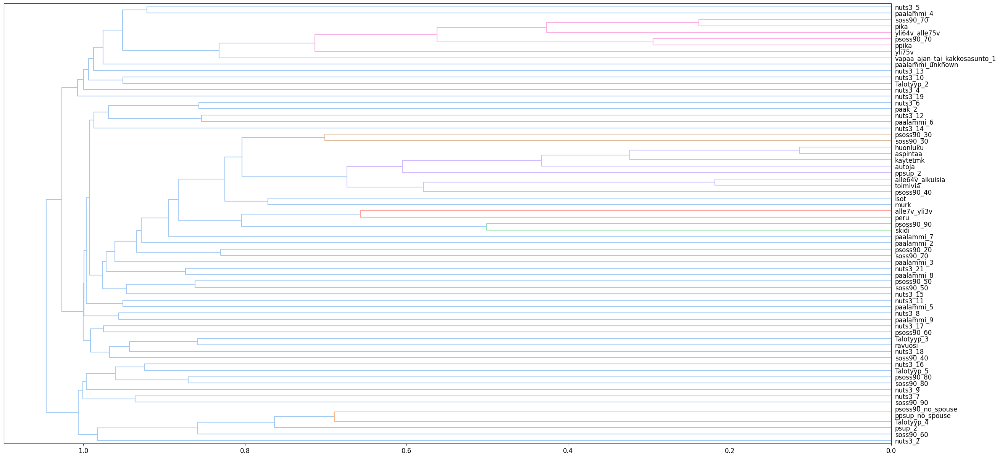

In [71]:
# A quick visualization into correlation of features in X_train_unscaled_untransformed_onehot_encoded

if (plot_fastbook_cluster_columns):
    import fastbook 
    fastbook.cluster_columns(X_train_unscaled_untransformed_onehot_encoded, figsize=(30, 15))


In [72]:
#
# Record feature importances, explained variances, and correlations
#

if (record_feature_importances_expvars_correlations):
    from feature_selector import FeatureSelector
    from sklearn.linear_model import Ridge
    from sklearn.metrics import explained_variance_score
    from scipy.stats import pearsonr
    import sklearn.ensemble
    import plotly.express as px

    importances_dict = {}
    varexp_dict = {}
    corr_dict = {}

    for target in target_variables:
        print("\n**************")
        print(f"{target}")
        print("**************\n")

        #
        # Feature importances

        # Get feature importances of each column in X_train_unscaled_untransformed_onehot_encoded after fitting LightGBM in the data
        fs = FeatureSelector(data = X_train_unscaled_untransformed_onehot_encoded, labels = y_train[target])
        fs.identify_zero_importance(task = 'regression', eval_metric = 'l2', n_iterations = 10, early_stopping = False)

        rf = sklearn.ensemble.RandomForestRegressor(1000, min_samples_leaf=100, oob_score=True)
        rf.fit(X_train_unscaled_untransformed_onehot_encoded, y_train[target])
        # plot_feature_importance(rf, X_train_unscaled_untransformed_onehot_encoded.columns)

        # Record all feature importances
        importances_dict[target] = fs.feature_importances

        #
        # Explained variances

        # Get explained variance of each column in X_train_scaled_transformed_onehot_encoded after fitting linear regression model (Ridge) in a dataset consisting of the column (alone) and y[target]
        explained_variance = {}

        lr = Ridge()
        for column in X_train_scaled_transformed_onehot_encoded.columns:
            lr.fit(X_train_scaled_transformed_onehot_encoded[column].to_numpy().reshape(-1, 1), y_train[target].to_numpy().reshape(-1, 1))
            y_pred = lr.predict(X_train_scaled_transformed_onehot_encoded[column].to_numpy().reshape(-1, 1))
            explained_variance[column] = explained_variance_score(y_train[target], y_pred)

        # Sort explained_variance_scores of predictions by value
        explained_variance_of_predictions = {k: v for k, v in sorted(explained_variance.items(), key=lambda item: item[1], reverse=True)}
        explained_variance_of_predictions_df = pd.DataFrame.from_dict(explained_variance_of_predictions, orient='index', columns=[f"Proportion of {target} explained"])
        explained_variance_of_predictions_df = explained_variance_of_predictions_df.reset_index()
        explained_variance_of_predictions_df.columns = ["feature", f"Proportion of variance of {target} explained"]

        varexp_dict[target] = explained_variance_of_predictions_df

        #
        # Correlations

        # Get correlation of each column in X_train_unscaled_untransformed_onehot_encoded with y[target]
        correlations = {}
        for column in X_train_unscaled_untransformed_onehot_encoded.columns:
            correlations[column] = pearsonr(y_train[target].to_numpy().ravel(), X_train_unscaled_untransformed_onehot_encoded[column].to_numpy().ravel())[0]

        # Sort the correlations
        correlations = {k: v for k, v in sorted(correlations.items(), key=lambda item: item[1], reverse=True)}
        correlations_df = pd.DataFrame.from_dict(correlations, orient='index', columns=[f"Correlation with {target}"])
        correlations_df = correlations_df.reset_index()
        correlations_df.columns = ["feature", f"Correlation with {target}"]

        corr_dict[target] = correlations_df

    # Save the results in files
    for target in target_variables:
        pd.DataFrame(importances_dict[target]).to_csv(f"Dataframes/{target} feature importances.csv", sep=";", index=False)
        pd.DataFrame(varexp_dict[target]).to_csv(f"Dataframes/{target} explained variances.csv", sep=";", index=False)
        pd.DataFrame(corr_dict[target]).to_csv(f"Dataframes/{target} correlations.csv", sep=";", index=False)


In [73]:
# Load the results from files
importances_dict = {}
varexp_dict = {} 
corr_dict = {}

for target in target_variables:
    importances_dict[target] = pd.read_csv(f"{dataframes_path}/{target} feature importances.csv", sep=";")
    varexp_dict[target] = pd.read_csv(f"{dataframes_path}/{target} explained variances.csv", sep=";")
    corr_dict[target] = pd.read_csv(f"{dataframes_path}/{target} correlations.csv", sep=";")



In [74]:
# Filter-based feature elimination by collinearity and importance ("low-hanging fruit")

if (do_basic_feature_elimination):
    from feature_selector import FeatureSelector
    X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict = {}
    collinear_dict = {}
    corr_matrix_dict = {}
    collinear_drop_features_dict = {}
    zero_importances_dict = {}
    low_importances_dict = {}

    for target in target_variables:
        print("\n**************")
        print(f"{target}")
        print("**************\n")

        fs = FeatureSelector(data = X_train_unscaled_untransformed_onehot_encoded, labels = y_train[target])

        fs.identify_collinear(correlation_threshold=0.80, one_hot = False)

        # Record correlation matrix
        corr_matrix_dict[target] = correlation_matrix = fs.corr_matrix

        # Record collinear drop features
        collinear_drop_features_dict[target] = fs.ops['collinear']

        # Record collinearity
        collinear_dict[target] = fs.record_collinear

        fs.identify_zero_importance(task = 'regression', eval_metric = 'l2', n_iterations = 5, early_stopping = False)

        # Record zero feature importances
        zero_importances_dict[target] = fs.record_zero_importance

        fs.identify_low_importance(cumulative_importance=0.99)

        # Record low feature importances
        low_importances_dict[target] = fs.record_low_importance

        # Save the feature sets for each prediction problem (target varible)
        X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target] = fs.remove(methods=["collinear", "zero_importance", "low_importance"], keep_one_hot=False)

    # Save the results in files
    for target in target_variables:
        X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target].to_csv(f"Dataframes/{target} X_train_FE_filtered_onehot_encoded_narrow_dict.csv", sep=";", index=False)
        collinear_dict[target].to_csv(f"Dataframes/{target} collinear_narrow_dict.csv", sep=";", index=False)
        pd.DataFrame(corr_matrix_dict[target]).to_csv(f"Dataframes/{target} corr_matrix_narrow_dict.csv", sep=";", index=False)
        pd.DataFrame(collinear_drop_features_dict[target]).to_csv(f"Dataframes/{target} collinear_drop_features_narrow_dict.csv", sep=";", index=False)
        zero_importances_dict[target].to_csv(f"{target} zero_importances_narrow_dict.csv", sep=";", index=False)
        low_importances_dict[target].to_csv(f"{target} low_importances_narrow_dict.csv", sep=";", index=False)
        pd.DataFrame([column for column in X_train_unscaled_untransformed_onehot_encoded.columns.tolist() if column not in X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target].columns.tolist()]).to_csv(f"{target} FE_all_dropped_features.csv", sep=";", index=False)


In [75]:
# Load X_train_FE_filtered_onehot_encoded_dict from files
X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file = {}
collinear_dict = {}
corr_matrix_dict = {}
collinear_drop_features_dict = {}
zero_importances_dict = {}
low_importances_dict = {}
FE_all_dropped_features = {}
for target in target_variables:
    X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target] = pd.read_csv(f"{dataframes_path}/{target} X_train_FE_filtered_onehot_encoded_narrow_dict.csv", sep=";")
    collinear_dict[target] = pd.read_csv(f"{dataframes_path}/{target} collinear_narrow_dict.csv", sep=";")
    corr_matrix_dict[target] = pd.read_csv(f"{dataframes_path}/{target} corr_matrix_narrow_dict.csv", sep=";")
    collinear_drop_features_dict[target] = pd.read_csv(f"{dataframes_path}/{target} collinear_drop_features_narrow_dict.csv", sep=";")
    zero_importances_dict[target] = pd.read_csv(f"{working_folder_path}/{target} zero_importances_narrow_dict.csv", sep=";")
    low_importances_dict[target] = pd.read_csv(f"{working_folder_path}/{target} low_importances_narrow_dict.csv", sep=";")
    FE_all_dropped_features[target] = pd.read_csv(f"{working_folder_path}/{target} FE_all_dropped_features.csv", sep=";")
    
# Rename column 'vapaa_ajan_tai_kakkosasunto_True' to 'vapaa_ajan_tai_kakkosasunto_1'
for target in target_variables:
    X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].rename(columns={'vapaa_ajan_tai_kakkosasunto_True': 'vapaa_ajan_tai_kakkosasunto_1'}, inplace=True)
    

In [76]:
# Remove FE filtered columns based on things loaded from the file above
X_train_FE_filtered_scaled_onehot_encoded_dict = {}
X_train_FE_filtered_all_numeric_std_scaled_onehot_encoded_dict = {}
X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict = {}
X_train_FE_filtered_unscaled_untransformed_dict = {}
X_test_FE_filtered_scaled_onehot_encoded_dict = {}
X_test_FE_filtered_all_numeric_std_scaled_onehot_encoded_dict = {}
X_test_FE_filtered_unscaled_untransformed_onehot_encoded_dict = {}
X_test_FE_filtered_unscaled_untransformed_dict = {}

for target in [target for target in target_variables]:
    X_train_FE_filtered_scaled_onehot_encoded_dict[target] = X_train_scaled_transformed_onehot_encoded_dict[target][X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].columns.values.tolist()]
    X_train_FE_filtered_all_numeric_std_scaled_onehot_encoded_dict[target] = X_train_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].columns.values.tolist()]
    X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target] = X_train_unscaled_untransformed_onehot_encoded_dict[target][X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].columns.values.tolist()]
    # Drop those columns that were dropped by the FE and which were not dummy features
    X_train_FE_filtered_unscaled_untransformed_dict[target] = X_train_unscaled_untransformed_dict[target].drop(X_train_unscaled_untransformed_dict[target].columns.intersection(FE_all_dropped_features[target].values.flatten().tolist()), axis="columns")

    X_test_FE_filtered_scaled_onehot_encoded_dict[target] = X_test_scaled_transformed_onehot_encoded_dict[target][X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].columns.tolist()]
    X_test_FE_filtered_all_numeric_std_scaled_onehot_encoded_dict[target] = X_test_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].columns.tolist()]
    X_test_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target] = X_test_unscaled_untransformed_onehot_encoded_dict[target][X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file[target].columns.tolist()]
    X_test_FE_filtered_unscaled_untransformed_dict[target] = X_test_unscaled_untransformed_dict[target].drop(X_test_unscaled_untransformed_dict[target].columns.intersection(FE_all_dropped_features[target].values.flatten().tolist()), axis="columns")

X_train_FE_filtered_scaled_onehot_encoded = X_train_scaled_transformed_onehot_encoded[X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file['total_expenses'].columns.values.tolist()]
X_train_FE_filtered_all_numeric_std_scaled_onehot_encoded = X_train_all_numeric_std_scaled_transformed_onehot_encoded[X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file['total_expenses'].columns.values.tolist()]
X_train_FE_filtered_unscaled_untransformed_onehot_encoded = X_train_unscaled_untransformed_onehot_encoded[X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file['total_expenses'].columns.values.tolist()]
X_train_FE_filtered_unscaled_untransformed = X_train_unscaled_untransformed.drop(X_train_unscaled_untransformed.columns.intersection(FE_all_dropped_features['total_expenses'].values.flatten().tolist()), axis="columns")

X_test_FE_filtered_scaled_onehot_encoded = X_test_scaled_transformed_onehot_encoded[X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file['total_expenses'].columns.values.tolist()]
X_test_FE_filtered_all_numeric_std_scaled_onehot_encoded = X_test_all_numeric_std_scaled_transformed_onehot_encoded[X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file['total_expenses'].columns.values.tolist()]
X_test_FE_filtered_unscaled_untransformed_onehot_encoded = X_test_unscaled_untransformed_onehot_encoded[X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict_from_file['total_expenses'].columns.values.tolist()]
X_test_FE_filtered_unscaled_untransformed = X_test_unscaled_untransformed.drop(X_train_unscaled_untransformed.columns.intersection(FE_all_dropped_features['total_expenses'].values.flatten().tolist()), axis="columns")


In [77]:
# Data types in X_train_FE_filtered_onehot_encoded_dict
with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target_variables[1]].dtypes)


yli75v                           Int64
skidi                            Int64
peru                             Int64
murk                             Int64
isot                             Int64
ravuosi                          Int64
aspintaa                         Int64
toimivia                         Int64
pika                             Int64
ppika                            Int64
autoja                           Int64
kaytetmk                         Int64
yli64v_alle75v                   Int64
alle7v_yli3v                     Int64
alle64v_aikuisia                 Int64
Talotyyp_2                        bool
Talotyyp_3                        bool
Talotyyp_4                        bool
psoss90_30                        bool
psoss90_40                        bool
psoss90_50                        bool
psoss90_70                        bool
psoss90_80                        bool
nuts3_2                           bool
nuts3_4                           bool
nuts3_5                  

In [78]:
# Recursive Feature Elimination with Cross-Validation (RFECV)

if (do_recursive_feature_elimination):
    from sklearn.feature_selection import RFECV
    from sklearn.model_selection import RandomizedSearchCV
    from xgboost import XGBRegressor
    import xgboost as xgb
    import scipy.stats as stats

    multitarget = False
    min_features_to_select = 20
    cv=5
    step=3

    constructor_params = {
        'n_estimators' : stats.randint(50, 2000),
        'num_parallel_tree' : stats.randint(1, 5), # [default=1] Number of parallel trees constructed during each iteration. This option is used to support boosted random forest.
        # 'max_depth' : stats.randint(3, 10),
        'learning_rate' : stats.uniform(0.001, 0.5), # eta (also known as learning rate): step size shrinkage used in updates to prevent overfitting. Lower values make the model more robust by taking smaller steps.
        'reg_alpha' : stats.uniform(1, 200), # alpha: L1 regularization term on weights. Higher values increase the regularization.
        'reg_lambda' : stats.uniform(1, 200), # lambda: L2 regularization term on weights. Higher values increase the regularization.
        'reg_gamma' : stats.uniform(1, 200), # gamma: minimum loss reduction required to make a further partition on a leaf node of the tree. Higher values increase the regularization.
        'subsample' : stats.uniform(0.3, 0.7), # subsample: percentage of rows used for each tree construction. Lowering this value can prevent overfitting by training on a smaller subset of the data.
        'booster' : ["gbtree"],
        'verbosity' : [0],
        'eval_metric' : ["rmse"],
        'tree_method' : ['hist'],
        "multi_strategy" : ["multi_output_tree"] if multitarget else ["one_output_per_tree"]
    }

    RFECV_model = XGBRegressor(enable_categorical = False, categorical_features=(X_train_FE_filtered_unscaled_untransformed.dtypes == "category").values, njobs=-1, importance_type="gain")
    random_search = RandomizedSearchCV(RFECV_model, param_distributions=constructor_params, n_iter=10, return_train_score=True, random_state=42, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs)

    random_search = random_search.fit(X_train_FE_filtered_unscaled_untransformed_onehot_encoded, y_train)
    best_estimator = random_search.best_estimator_
    RFE = RFECV(best_estimator, min_features_to_select = min_features_to_select, cv = KFold(n_splits=5, shuffle=True), step = 2, verbose = 0, n_jobs = n_jobs, scoring = "r2")
    RFE_fitted = RFE.fit(X_train_FE_filtered_unscaled_untransformed_onehot_encoded, y_train)
    selected_features = RFE_fitted.get_feature_names_out()
    RFECV_drop_features = set(RFE_fitted.feature_names_in_) - set(RFE_fitted.get_feature_names_out()) 
    cv_results = RFE_fitted.cv_results_
    X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded = pd.DataFrame(RFE_fitted.transform(X_train_FE_filtered_unscaled_untransformed_onehot_encoded), columns=selected_features)

    selected_features_dict = {}
    RFECV_drop_features_dict = {}
    cv_results_dict = {}
    X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict = {}
    for target in target_variables:
        random_search = random_search.fit(X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target], y_train[target])
        best_estimator = random_search.best_estimator_
        RFE = RFECV(best_estimator, min_features_to_select=min_features_to_select, cv=cv, step=step, verbose=0, n_jobs=n_jobs, scoring="r2")
        RFE_fitted = RFE.fit(X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target], y_train[target])
        selected_features_dict[target] = RFE_fitted.get_feature_names_out()
        RFECV_drop_features_dict[target] = set(RFE_fitted.feature_names_in_) - set(RFE_fitted.get_feature_names_out())
        cv_results_dict[target] = RFE_fitted.cv_results_
        X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict[target] = pd.DataFrame(RFE_fitted.transform(X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target]), columns=selected_features_dict[target])

    # Save the results in files
    pd.DataFrame(selected_features).to_csv(f"Dataframes/RFECV selected_features_narrow.csv", sep=";", index=False)
    pd.DataFrame(RFECV_drop_features).to_csv(f"Dataframes/RFECV dropped_features_narrow.csv", sep=";", index=False)
    pd.DataFrame(cv_results).to_csv(f"Dataframes/RFECV cv_results_narrow.csv", sep=";", index=False)
    X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.to_csv(f"Dataframes/X_train_RFECV_filtered_onehot_encoded.csv", sep=";", index=False)

    for target in target_variables:
        pd.DataFrame(selected_features_dict[target]).to_csv(f"Dataframes/{target} RFECV selected_features_narrow_dict.csv", sep=";", index=False)
        pd.DataFrame(RFECV_drop_features_dict[target]).to_csv(f"Dataframes/{target} RFECV dropped_features_narrow_dict.csv", sep=";", index=False)
        pd.DataFrame(cv_results_dict[target]).to_csv(f"Dataframes/{target} RFECV cv_results_narrow_dict.csv", sep=";", index=False)
        X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict[target].to_csv(f"Dataframes/{target} X_train_RFECV_filtered_onehot_encoded_dict.csv", sep=";", index=False)


In [79]:
# Load the results from RFECV from files
selected_features = pd.read_csv(f"{dataframes_path}/RFECV selected_features_narrow.csv", sep=";")
selected_features = selected_features.replace("vapaa_ajan_tai_kakkosasunto_True", "vapaa_ajan_tai_kakkosasunto_1")
try:
    RFECV_drop_features = pd.read_csv(f"{dataframes_path}/RFECV dropped_features_narrow.csv", sep=";")
except:
    RFECV_drop_features = pd.DataFrame()

cv_results = pd.read_csv(f"{dataframes_path}/RFECV cv_results_narrow.csv", sep=";")

X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file = X_train_FE_filtered_unscaled_untransformed_onehot_encoded[selected_features.values.flatten().tolist()]
# X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file = X_train_FE_filtered_unscaled_untransformed_onehot_encoded

selected_features_dict = {}
RFECV_drop_features_dict = {}
cv_results_dict = {}
X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file_dict = {}
for target in target_variables:
    selected_features_dict[target] = pd.read_csv(f"{dataframes_path}/{target} RFECV selected_features_narrow_dict.csv", sep=";")
    try:
        RFECV_drop_features_dict[target] = pd.read_csv(f"{dataframes_path}/{target} RFECV dropped_features_narrow_dict.csv", sep=";")
    except:
        RFECV_drop_features_dict[target] = []

    cv_results_dict[target] = pd.read_csv(f"{dataframes_path}/{target} RFECV cv_results_narrow_dict.csv", sep=";")
    X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file_dict[target] = pd.read_csv(f"{dataframes_path}/{target} X_train_RFECV_filtered_onehot_encoded_dict.csv", sep=";")


In [80]:
# Remove RFECV filtered columns based on things loaded from the file above

X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict = {}
X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict = {}
X_train_RFECV_filtered_unscaled_untransformed_dict = {}
X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict = {}
X_test_RFECV_filtered_scaled_transformed_onehot_encoded_dict = {}
X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict = {}
X_test_RFECV_filtered_unscaled_untransformed_dict = {}
X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict = {}

for target in [target for target in target_variables]:
    X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict[target] = X_train_FE_filtered_scaled_onehot_encoded_dict[target].drop(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else [], axis="columns")
    X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target] = X_train_FE_filtered_all_numeric_std_scaled_onehot_encoded_dict[target].drop(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else [], axis="columns")
    X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict[target] = X_train_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target].drop(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else [], axis="columns")
    # Drop those columns that were dropped by the RFECV and which were not dummy features
    X_train_RFECV_filtered_unscaled_untransformed_dict[target] = X_train_FE_filtered_unscaled_untransformed_dict[target].drop(X_train_unscaled_untransformed.columns.intersection(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else []), axis="columns")

    X_test_RFECV_filtered_scaled_transformed_onehot_encoded_dict[target] = X_test_FE_filtered_scaled_onehot_encoded_dict[target].drop(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else [], axis="columns")
    X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target] = X_test_FE_filtered_all_numeric_std_scaled_onehot_encoded_dict[target].drop(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else [], axis="columns")
    X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict[target] = X_test_FE_filtered_unscaled_untransformed_onehot_encoded_dict[target].drop(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else [], axis="columns")
   # Drop those columns that were dropped by the RFECV and which were not dummy features
    X_test_RFECV_filtered_unscaled_untransformed_dict[target] = X_test_FE_filtered_unscaled_untransformed_dict[target].drop(X_test_unscaled_untransformed.columns.intersection(list(RFECV_drop_features_dict[target]["0"]) if len(RFECV_drop_features_dict[target]) != 0 else []), axis="columns")

X_train_RFECV_filtered_scaled_transformed_onehot_encoded = X_train_scaled_transformed_onehot_encoded[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file.columns.values.tolist()]
X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded = X_train_all_numeric_std_scaled_transformed_onehot_encoded[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file.columns.values.tolist()]
X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_train_unscaled_untransformed_onehot_encoded[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file.columns.values.tolist()]
# Drop those columns that were dropped by the RFECV and which were not dummy features
X_train_RFECV_filtered_unscaled_untransformed = X_train_unscaled_untransformed.copy().drop(X_train_unscaled_untransformed.columns.intersection(list(RFECV_drop_features)), axis="columns")

X_test_RFECV_filtered_scaled_transformed_onehot_encoded = X_test_scaled_transformed_onehot_encoded[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file.columns.tolist()]
X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded = X_test_all_numeric_std_scaled_transformed_onehot_encoded[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file.columns.tolist()]
X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_test_unscaled_untransformed_onehot_encoded[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_from_file.columns.tolist()]
# Drop those columns that were dropped by the RFECV and which were not dummy features
X_test_RFECV_filtered_unscaled_untransformed = X_test_unscaled_untransformed.drop(X_test_unscaled_untransformed.columns.intersection(list(RFECV_drop_features)), axis="columns")


In [81]:
numeric_columns_wo_dropped_cols = {}
numeric_and_non_onehot_encoded_categorical_columns_wo_dropped_cols = {}
numeric_and_onehot_encoded_categorical_columns_wo_dropped_cols = {}

for target in [target for target in target_variables]:
    numeric_columns_wo_dropped_cols[target] = list((X_train_RFECV_filtered_unscaled_untransformed_dict[target].columns.intersection(numeric_columns)))
    numeric_and_non_onehot_encoded_categorical_columns_wo_dropped_cols[target] = list((X_train_RFECV_filtered_unscaled_untransformed_dict[target].columns.intersection(narrowed_down_columns_to_be_considered)))
    numeric_and_onehot_encoded_categorical_columns_wo_dropped_cols[target] = list((X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict[target].columns.intersection(X_train_unscaled_untransformed_onehot_encoded.columns)))


In [82]:
# Data types in X_train_RFECV_filtered_onehot_encoded_dict
with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.dtypes)


yli75v                           Int64
skidi                            Int64
peru                             Int64
murk                             Int64
isot                             Int64
ravuosi                          Int64
aspintaa                         Int64
toimivia                         Int64
pika                             Int64
ppika                            Int64
autoja                           Int64
kaytetmk                         Int64
yli64v_alle75v                   Int64
alle7v_yli3v                     Int64
alle64v_aikuisia                 Int64
Talotyyp_2                        bool
Talotyyp_3                        bool
Talotyyp_4                        bool
psoss90_20                        bool
psoss90_30                        bool
psoss90_40                        bool
psoss90_50                        bool
psoss90_70                        bool
psoss90_80                        bool
nuts3_2                           bool
nuts3_4                  

---------------------------------------------------------------------------------------


Comparison diagnostics: linear regression of *scaled and transformed* data against train set
Dep. Variable:         total_expenses   R-squared:                       0.511
Model:                            OLS   Adj. R-squared:                  0.502
No. Observations:                2938   F-statistic:                     50.96
Covariance Type:                  HC0   Prob (F-statistic):               0.00
                                    coef   std err         z  P>|z|    [0.025    0.975]
                     kaytetmk    68010.0   1.3e+04     5.242  0.000  4.26e+04  9.34e+04
                     aspintaa    16970.0  4294.825     3.951  0.000  8551.340  2.54e+04
                       autoja    15430.0  4523.499     3.410  0.001  6560.312  2.43e+04
                         murk    11610.0  2555.256     4.543  0.000  6599.195  1.66e+04
                        skidi    10840.0  2840.487     3.816 

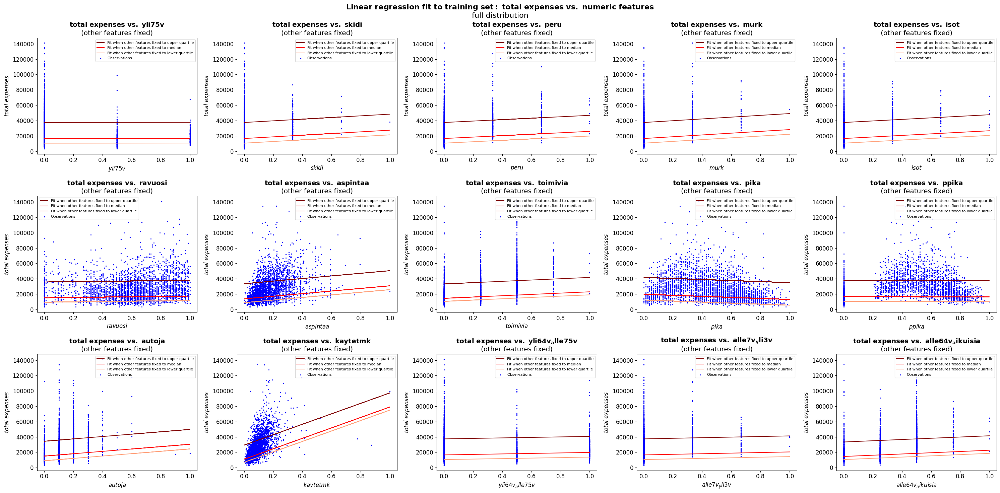

In [83]:
##
## Diagnostics with linear regression model
##
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_white, het_breuschpagan # Heteroscedasticity tests
from statsmodels.regression.linear_model import RegressionResultsWrapper
from statsmodels.iolib.summary import Summary
from statsmodels.graphics.regressionplots import plot_regress_exog, plot_partregress, plot_ccpr_grid

distribution_description = f"{'full distribution' if (not floor_lower_tails and not cap_upper_tails and not drop_lower_tails and not drop_upper_tails) else 'distribution with lower tail floored' if (floor_lower_tails and not cap_upper_tails and not drop_lower_tails and not drop_upper_tails) else 'distribution with upper tail capped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (not floor_lower_tails and not drop_upper_tails and not drop_lower_tails and cap_upper_tails) else 'distribution with lower tail floored and upper tail capped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (floor_lower_tails and cap_upper_tails and not drop_lower_tails and not drop_upper_tails) else 'distribution with lower tails dropped at minimum reference' if (drop_lower_tails and not drop_upper_tails and not cap_upper_tails) else 'distribution with upper tails dropped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (drop_upper_tails and not drop_lower_tails and not floor_lower_tails) else 'distribution with lower tails dropped at minimum reference and upper tails dropped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (drop_upper_tails and drop_lower_tails) else 'distribution with upper tails dropped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' + ' and lower tails floored' if (drop_upper_tails and not drop_lower_tails and floor_lower_tails) else 'distribution with lower tails dropped at minimum reference and upper tails capped at mean + ' + str(std_to_cap_at_or_drop_above) if (drop_lower_tails and cap_upper_tails) else 'todo'}"

# ['aikuisia', 'yli75v', 'skidi', 'peru', 'murk', 'isot', 'ravuosi', 'aspintaa', 'huonluku', 'toimivia', 'pika', 'ppika', 'alle7v_yli3v', 'alle64v_aikuisia', 'autoja', 'soss90_20', 'soss90_30', 'soss90_40', 'soss90_50', 'soss90_60', 'soss90_70', 'soss90_80', 'soss90_90', 'Talotyyp_2', 'Talotyyp_3', 'Talotyyp_4', 'taajama_2', 'taajama_3', 'vapaa_ajan_tai_kakkosasunto_True', 'maka_K2', 'maka_K3', 'maka_M4', 'maka_M5', 'maka_M6', 'paak_2', 'psoss90_20', 'psoss90_30', 'psoss90_40', 'psoss90_60', 'psoss90_70', 'psoss90_80', 'psoss90_90', 'nuts3_2', 'nuts3_7', 'nuts3_11', 'nuts3_17', 'nuts3_21', 'pamto_1', 'psup_2', 'vamto_1', 'ppsup_2', 'paalammi_2', 'paalammi_4', 'paalammi_7']

def linear_regression_diagnosis(target_variables, y_train, y_test, numeric_columns_wo_dropped_cols, X_train_dict, X_test_dict, plot_fits_against_predictors=False, use_train_only = True, slim_summary = True, return_print_as_string = False, title_addition = "", scaled_data_and_sort_coefficients = False, plot_residual_plots = False):
    
    if (return_print_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s
    
    for target in target_variables:
        if (use_train_only):
            X_diagnose_train = X_train_dict[target].astype(float)
            expenditure_of_target = y_train[target]
        else:
            X_diagnose_train = pd.concat([X_train_dict[target], X_test_dict[target]], axis="rows").astype(float)
            expenditure_of_target = pd.concat([y_train[target], y_test[target]], axis="rows")

        X_diagnose_train = sm.add_constant(X_diagnose_train)
        mod = sm.OLS(endog=expenditure_of_target, exog=X_diagnose_train, missing='drop').fit(cov_type='HC0')
        summary = mod.summary(title=f"{'Comparison diagnostics:' if scaled_data_and_sort_coefficients else 'Interpretation diagnostics:'} linear regression of *{title_addition}* data against {'train' if use_train_only else 'train and test'} set", slim=slim_summary)

        if (scaled_data_and_sort_coefficients):
            coef_table = mod.summary().tables[1]
            coef_df = pd.DataFrame(coef_table.data[1:], columns=coef_table.data[0])
            coef_df['coef'] = pd.to_numeric(coef_df['coef'])
            # coef_df = coef_df.rename(columns={coef_df.columns[0]: 'variable'})
            sorted_coef = coef_df.iloc[coef_df['coef'].abs().argsort()[::-1]]
            # Convert sorted_coef back to SimpleTable format
            sorted_coef_values = [sorted_coef.columns.tolist()] + sorted_coef.values.tolist()
            sorted_coef_table = sm.iolib.table.SimpleTable(sorted_coef_values, txt_fmt=sm.iolib.table.default_txt_fmt)
            # Assign the sorted coefficient table to summary.tables[1]
            summary.tables[1] = sorted_coef_table
        else:
            # Sort in alphabetical order
            coef_table = mod.summary().tables[1]
            coef_df = pd.DataFrame(coef_table.data[1:], columns=coef_table.data[0])
            coef_df['coef'] = pd.to_numeric(coef_df['coef'])
            # coef_df = coef_df.rename(columns={coef_df.columns[0]: 'variable'})
            sorted_coef = coef_df.sort_values(by='', key=lambda x: x.str.lower())
            # Convert sorted_coef back to SimpleTable format
            sorted_coef_values = [sorted_coef.columns.tolist()] + sorted_coef.values.tolist()
            sorted_coef_table = sm.iolib.table.SimpleTable(sorted_coef_values, txt_fmt=sm.iolib.table.default_txt_fmt)
            # Assign the sorted coefficient table to summary.tables[1]
            summary.tables[1] = sorted_coef_table      
        
        print('---------------------------------------------------------------------------------------\n\n')
        print(summary)

        if (plot_residual_plots):
        #     """
        #     Why Residual Plots?
        #     Residual plots offer several advantages:
        #     Identifying Bias: If residuals show a trend (not centered around zero), it might indicate that your model is systematically over- or under-predicting the target variable.
        #     Heteroskedasticity: Varying spread of residuals across the range of the predicted values can indicate ‘Heteroskedasticity,’ which can violate assumptions in some modeling techniques.
        #     Outliers: Points far away from the zero line can be considered as outliers and might warrant further investigation.
        #     """

        #     # Plot a component and component-plus-residual (CCPR) plot
            fig, ax = plt.subplots(figsize=(30, 15))
            plot_ccpr_grid(results=mod, grid=(3, 5), exog_idx=list(numeric_columns_wo_dropped_cols), fig=fig)
            plt.show()
            # Plot regression results against one regressor
            for i, column in enumerate([exog for exog in mod.model.exog_names if exog in numeric_columns_wo_dropped_cols]):
                fig, ax = plt.subplots(figsize=(15, 7))
                plot_regress_exog(mod, column, fig=fig)
                plt.show()
            fig.tight_layout()
            plt.show()
        
        # Plot the fit for each predictor with the others fixed at their median
        if (plot_fits_against_predictors):
            numeric_columns_in_target = [x for x in numeric_columns_wo_dropped_cols[target] if x in X_diagnose_train.columns]
            y_pred_when_others_median = pd.DataFrame()
            y_pred_when_others_lower_quartile = pd.DataFrame()
            y_pred_when_others_upper_quartile = pd.DataFrame()
            linres_pred_when_others_median = pd.DataFrame()
            linres_pred_when_others_upper_quartile = pd.DataFrame()
            linres_pred_when_others_lower_quartile = pd.DataFrame()

            for feature in numeric_columns_in_target:
                # _, feature = next(enumerate(numeric_columns_in_target))
                grid_wrt_one_feature_and_others_fixed_to_their_median = X_diagnose_train.copy()
                grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile = X_diagnose_train.copy()
                grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile = X_diagnose_train.copy()
                # Take the mean and lower and upper quartiles of all other variables (to plot against the projection of the hyperplane against these)
                other_cols = [c for c in grid_wrt_one_feature_and_others_fixed_to_their_median.columns if c != feature]
                grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols] = grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols].median()
                grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile[other_cols] = grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile[other_cols].quantile(0.25)
                grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile[other_cols] = grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile[other_cols].quantile(0.75)
                # Remove duplicate rows: we only use actual values of "feature" that are present in the data instead of making a grid of all possible values with linspace, because we know the projection of the fit to the "feature" will be a straight line anyway
                grid_wrt_one_feature_and_others_fixed_to_their_median = grid_wrt_one_feature_and_others_fixed_to_their_median[~grid_wrt_one_feature_and_others_fixed_to_their_median.duplicated()]
                grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile = grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile[~grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile.duplicated()]
                grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile = grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile[~grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile.duplicated()]

                linres_pred_mean = pd.DataFrame(data=mod.predict(grid_wrt_one_feature_and_others_fixed_to_their_median), columns=[f"{feature}-{target}"])
                linres_pred_when_others_upper_quartile = pd.DataFrame(mod.predict(grid_wrt_one_feature_and_others_fixed_to_their_upper_quartile), columns=[f"{feature}-{target}"])
                linres_pred_when_others_lower_quartile = pd.DataFrame(mod.predict(grid_wrt_one_feature_and_others_fixed_to_their_lower_quartile), columns=[f"{feature}-{target}"])
                
                # Concatenate linres_pred to the dataframes
                y_pred_when_others_median = pd.concat([y_pred_when_others_median, linres_pred_mean], axis=1)
                y_pred_when_others_lower_quartile = pd.concat([y_pred_when_others_lower_quartile, linres_pred_when_others_lower_quartile], axis=1)
                y_pred_when_others_upper_quartile = pd.concat([y_pred_when_others_upper_quartile, linres_pred_when_others_upper_quartile], axis=1)
                
            # Define the layout for subplots
            num_rows = 3
            num_cols = 5
            # Create a figure and subplots
            fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 15))
            # Flatten the axes array to iterate over subplots
            axes = axes.flatten()
            
            # Loop through predictors and plot each in a separate subplot
            for i, predictor_to_vizualize_against in enumerate(numeric_columns_in_target):
                ax = axes[i]  # Select the current subplot
                df_median_for_plotting_one_feature = pd.concat([X_diagnose_train[numeric_columns_in_target][predictor_to_vizualize_against], y_pred_when_others_median[f"{predictor_to_vizualize_against}-{target}"]], axis=1).dropna(axis="rows")
                df_upper_quartile_for_plotting_one_feature = pd.concat([X_diagnose_train[numeric_columns_in_target][predictor_to_vizualize_against], y_pred_when_others_upper_quartile[f"{predictor_to_vizualize_against}-{target}"]], axis=1).dropna(axis="rows")
                df_lower_quartile_for_plotting_one_feature = pd.concat([X_diagnose_train[numeric_columns_in_target][predictor_to_vizualize_against], y_pred_when_others_lower_quartile[f"{predictor_to_vizualize_against}-{target}"]], axis=1).dropna(axis="rows")
                ax.plot(df_upper_quartile_for_plotting_one_feature[predictor_to_vizualize_against], df_upper_quartile_for_plotting_one_feature[f"{predictor_to_vizualize_against}-{target}"], color='maroon', label=f"Fit when other features fixed to upper quartile")
                ax.plot(df_median_for_plotting_one_feature[predictor_to_vizualize_against], df_median_for_plotting_one_feature[f"{predictor_to_vizualize_against}-{target}"], color='red', label=f"Fit when other features fixed to median")
                ax.plot(df_lower_quartile_for_plotting_one_feature[predictor_to_vizualize_against], df_lower_quartile_for_plotting_one_feature[f"{predictor_to_vizualize_against}-{target}"], color='lightsalmon', label=f"Fit when other features fixed to lower quartile")

                ax.scatter(X_diagnose_train[predictor_to_vizualize_against], expenditure_of_target, color='blue', label='Observations', s=2)
                ax.set_xlabel(f"${predictor_to_vizualize_against}$")
                ax.set_ylabel(f'${target.replace("_", "~")}$')
                # ax.set_title(f"{predictor_to_vizualize_against} vs {target}")
                ax.set_title(r"$\bf{" + f'{target.replace("_", "~")}~vs.~{predictor_to_vizualize_against}' + "}$\n(other features fixed)")
                ax.legend(fontsize=8)
                # fig.suptitle(f"Multivariate linear regression fit against {target}, projected individually to every predictor variable", fontsize=14, fontweight='bold')
                fig.suptitle(r"$\bf{" + f'Linear~regression~fit~to~{"training~set" if use_train_only else "training+test set"}:~{target.replace("_", "~")}~vs.~numeric~features' + "}$\n" + f"{distribution_description}", fontsize=16)
                
            # Hide any extra empty subplots
            for i in range(len(numeric_columns_in_target), num_rows * num_cols):
                axes[i].axis('off')
                    
            plt.tight_layout()
            plt.show()

    if (return_print_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout
        return output

linear_regression_diagnosis(target_variables = [target_variables[0]], y_train = y_train_dict, y_test = y_test_dict, numeric_columns_wo_dropped_cols = numeric_columns_wo_dropped_cols, X_train_dict = X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict, X_test_dict = X_test_RFECV_filtered_scaled_transformed_onehot_encoded_dict, plot_fits_against_predictors = True, use_train_only = True, slim_summary = True, return_print_as_string = False, title_addition = "scaled and transformed", scaled_data_and_sort_coefficients = True)

# linear_regression_diagnosis(target_variables = [target_variables[0]], y_train = y_train_dict, y_test = y_test_dict, numeric_columns_wo_dropped_cols = numeric_columns_wo_dropped_cols, X_train_dict = X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict, X_test_dict = X_test_RFECV_filtered_scaled_transformed_onehot_encoded_dict, plot_fits_against_predictors = True, use_train_only = False, slim_summary = True, return_print_as_string = False, title_addition = "unscaled and untransformed", scaled_data_and_sort_coefficients = False)


In [84]:
# Helper functions for parsing and plotting

# XGBoost's booster (ensemble of boosted trees) to code
def model_to_py(base_score, booster_dump, out_file):
    def tree_parser(tree, i):
        import re
        def string_parser(s):
            if len(re.findall(r":leaf=", s)) == 0:
                out  = re.findall(r"[\w.-]+", s)
                tabs = re.findall(r"[\t]+", s)
                if (out[4] == out[8]):
                    missing_value_handling = (" or np.isnan(x['" + out[1] + "']) ")
                else:
                    missing_value_handling = ""
                    
                if len(tabs) > 0:
                    return (re.findall(r"[\t]+", s)[0].replace('\t', '    ') + 
                            '        if state == ' + out[0] + ':\n' +
                            re.findall(r"[\t]+", s)[0].replace('\t', '    ') +
                            '            state = (' + out[4] +  
                            ' if ' +  "x['" + out[1] +"']<" + out[2] + missing_value_handling + 
                            ' else ' + out[6] + ')\n' )
                else:
                    return ('        if state == ' + out[0] + ':\n' +
                            '            state = (' + out[4] +  
                            ' if ' +  "x['" + out[1] +"']<" + out[2] + missing_value_handling +
                            ' else ' + out[6] + ')\n' )
            else:
                out = re.findall(r"[\d.-]+", s)
                try:
                    return (re.findall(r"[\t]+", s)[0].replace('\t', '    ') + 
                            '        if state == ' + out[0] + ':\n    ' +
                            re.findall(r"[\t]+", s)[0].replace('\t', '    ') + 
                            '        return ' + out[1] + '\n')
                except:
                    return ('        if state == ' + out[0] + ':\n    ' + '        return ' + out[1] + '\n')
        if i == 0:
            return ('    if num_booster == 0:\n        state = 0\n'
                + "".join([string_parser(tree.split('\n')[j]) 
                            for j in range(len(tree.split('\n'))-1)]))
        else:
            return ('    elif num_booster == '+str(i)+':\n        state = 0\n'
                + "".join([string_parser(tree.split('\n')[j]) for j in range(len(tree.split('\n'))-1)]))
    
    trees = booster_dump
    result = ["import numpy as np\n\n" +"def xgb_tree(x, num_booster):\n"]
    for i in range(len(trees)):
        result.append(tree_parser(trees[i], i))
    with open(out_file, 'a') as the_file:
        the_file.write("".join(result) + "\ndef xgb_predict(x):\n    predict = " 
                    + str(base_score) + "\n"
                    + "# initialize prediction with base score\n" 
                    + "    for i in range(" 
                    + str(len(trees))  
                    + "):\n        predict = predict + xgb_tree(x, i)"
                    + "\n    return predict")

# Decision tree to code
def tree_to_code(tree, feature_names, tree_idx = None):
    from sklearn.tree import _tree
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    feature_names = [f.replace(" ", "_")[:-5] for f in feature_names]
    print('def tree_{1}({0}):'.format(", ".join(feature_names),tree_idx))

    def recurse(node, depth):
        indent = "    " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node].reshape(1, -1)))

    recurse(0, 1)

# Decision tree to human-readable rules
def tree_to_rules(tree, feature_names, class_names, tree_idx = None):
    from sklearn.tree import _tree
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    paths = []
    path = []
    def recurse(tree, feature_name, node, path, paths):
        if tree.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree.threshold[node]
            p1, p2 = list(path), list(path)
            if (int(np.floor(threshold)) == 0):
                p1 += [f"(not {name})"]
            else:
                p1 += [f"({name} <= {int(np.floor(threshold))})"]
            recurse(tree = tree, feature_name = feature_name, node = tree.children_left[node], path = p1, paths = paths)
            if (int(np.ceil(threshold)) == 1):
                p2 += [f"({name})"]
            else:
                p2 += [f"({name} >= {int(np.ceil(threshold))})"]
            recurse(tree = tree, feature_name = feature_name, node = tree.children_right[node], path = p2, paths = paths)
        else:
            path += [(tree.value[node], tree.n_node_samples[node])]
            paths += [path]
            
    recurse(tree = tree_, feature_name = feature_name, node = 0, path = path, paths = paths)
    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]
    
    rules = []
    decision = 0
    for path in paths:
        decision += 1
        rule = "if "
        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None: # Regression
            rule += "response: "+ str(np.round(path[-1][0].reshape(1, -1),2)) + " €/month"
        else: # Classification
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"
        if (tree_idx is not None):
            rules += [f"Tree number {tree_idx}, leaf number {decision}: {rule}"]
        else:
            rules += [rule]
    return rules

# Random forest to code
def rf_to_code(rf, feature_names):
    """
    Conversion of Random forest Decision rules to code.
    """
    code = []
    for base_learner_id, base_learner in enumerate(rf.estimators_):
        code += tree_to_code(tree = base_learner,feature_names=feature_names,tree_idx=base_learner_id)
    return code

# Random forest to decision rules
def rf_to_rules(rf, feature_names):
    """
    Conversion of Random forest Decision rules to human readable rules.
    """
    rules = []
    for base_learner_id, base_learner in enumerate(rf.estimators_):
        rules += tree_to_rules(tree = base_learner, feature_names=feature_names, class_names=None, tree_idx=base_learner_id)
    return rules

def print_side_by_side(output1, output2, print_line_numbers = False, col_padding=2, delimiter='', col_width_addition_left = 0, col_width_addition_right = 0):
    import platform
    import math
    import os
    import shutil
    def make_substrings(s, L):
        """ splits `s` into substrings of length L """
        i = 0
        pieces = []
        while i < len(s):
            pieces.append(s[i:i+L])
            i += L
        return pieces
    if len(delimiter) > col_padding:
        raise ValueError('Delimiter cannot be longer than padding')
    
    terminal_dimensions = shutil.get_terminal_size()
    rows, columns = terminal_dimensions.lines, terminal_dimensions.columns

    # Split files into lines
    lines1 = output1.split('\n')
    lines2 = output2.split('\n')
    # Get number of digits in line numbers
    max_num_lines = max(len(lines1), len(lines2))
    if print_line_numbers:
        max_num_digits_in_line_num = math.ceil(math.log(max_num_lines))
        col_width_left = (columns - (max_num_digits_in_line_num) - col_padding) // 2 + col_width_addition_left
        col_width_right = (columns - (max_num_digits_in_line_num) - col_padding) // 2 + col_width_addition_right
        line_fmt = ('{:<' + str(max_num_digits_in_line_num) + '}' )
    else:
        col_width_left = (columns - col_padding) // 2 + col_width_addition_left
        col_width_right = (columns - col_padding) // 2 + col_width_addition_right
        max_num_digits_in_line_num = False
        line_fmt = ''
    # Print lines side by side
    line_fmt += ('{:<' + str(col_width_left) + '}'
               + (' ' * math.floor((col_padding-len(delimiter))/2.))
               + delimiter
               + (' ' * math.ceil((col_padding-len(delimiter))/2.))
               + '{:<' + str(col_width_right) + '}')
    for i in range(max_num_lines):
        # Get rows for this line for file 1.
        l1 = ''
        if i < len(lines1):
            l1 = lines1[i]
        rows1 = make_substrings(l1, col_width_left)
        # Get rows for this line for file 2.
        l2 = ''
        if i < len(lines2):
            l2 = lines2[i]
        rows2 = make_substrings(l2, col_width_right)
        # Print rows.
        max_num_rows = max(len(rows1), len(rows2))
        j = 0
        while j < max_num_rows:
            token1 = rows1[j] if j < len(rows1) else ''
            token2 = rows2[j] if j < len(rows2) else ''
            if print_line_numbers:
                row_num = i if j == 0 else ''
                print(line_fmt.format(row_num, token1, token2))
            else:
                print(line_fmt.format(token1, token2))
            j += 1

def plot_feature_importance(model, names, threshold = None):
    feature_importance_df = pd.DataFrame.from_dict({'feature_importance': model.feature_importances_, 'feature': names}).set_index('feature').sort_values('feature_importance', ascending = False)
    if threshold is not None:
        feature_importance_df = feature_importance_df[feature_importance_df.feature_importance > threshold]
    fig = px.bar(
        feature_importance_df,
        text_auto = '.2f',
        labels = {'value': 'feature importance'},
        title = 'Feature importances')
    fig.update_layout(showlegend = False)
    
    return fig
    
def plot_feature_importance_XGBoost(model, booster):
    """
    Plots feature importance for an XGBoost model.

    Args:
    - model: A trained XGBoost model

    Returns:
    - fig: The matplotlib figure object
    """
    fig, ax = plt.subplots(figsize=(10, 8))
    importance_type = "weight" if booster == "gblinear" else "gain"
    xgb.plot_importance(
        model,
        importance_type=importance_type,
        ax=ax,
        title=f"Feature Importance based on {importance_type}",
    )
    plt.tight_layout()
    plt.close(fig)

    return fig


In [86]:
# Benchmark 1: expenditure estimates and children accounted for with a factor
def benchmark1_return_pred(target, X_test, y_test):
    if (target in ["childcare_expenses", "housing_expenses_wo_utilities_and_energy"]):
        return pd.DataFrame(np.zeros_like(y_test), index=X_test.index)[0]
    
    adults = X_test["alle64v_aikuisia"] + X_test["yli64v_alle75v"] + X_test["yli75v"]
    children0_7yo = X_test["muku"]
    children7_17yo = X_test["peru"] + X_test["murk"]
    # if (target == "car_expenses"):
    #     y_pred_benchmark1 = avg_expense_estimates_in_use[target][0] * (1+(adults-1)*avg_expense_estimates_in_use[target][1] + avg_expense_estimates_in_use[target][2]*children0_7yo + avg_expense_estimates_in_use[target][3]*children7_17yo) * (X_test["autoja"] > 0).astype(int)
    # else:
    y_pred_benchmark1 = avg_expense_estimates_in_use[target][0] * (1+(adults-1)*avg_expense_estimates_in_use[target][1] + avg_expense_estimates_in_use[target][2]*children0_7yo + avg_expense_estimates_in_use[target][3]*children7_17yo)
        
    return pd.Series(y_pred_benchmark1)

def benchmark1_evaluate_and_print_or_return_as_string(target, y_test, X_test, return_as_string = True):
    
    from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score, mean_absolute_error
    
    if(return_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s

    print('---------------------------------------------------------------------------------------------')
    print(f"Benchmark 1 for {target}:")
    print("expenditure estimates from table")
    print(' ')
    if (target in ['childcare_expenses', 'housing_expenses_wo_utilities_and_energy']):
        print(f"Cost category {target} has no estimate in the benchmark")
        print(".")
        print(".")
        print(".")
        if (return_as_string):
            output = s.getvalue()
            sys.stdout.close()
            sys.stdout = old_stdout
            return output
        else:
            return pd.DataFrame(np.zeros_like(X_test), index=X_test.index)[0]
    y_pred_benchmark1 = benchmark1_return_pred(target=target, X_test=X_test, y_test=y_test)
    print(f"Test mean absolute error: {round(mean_absolute_error(y_true=y_test, y_pred=y_pred_benchmark1), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_true=y_test.dropna(), y_pred=y_pred_benchmark1, squared=False), 1)}")
    print(f"Test R2 score: {round(r2_score(y_true=y_test.dropna(), y_pred=y_pred_benchmark1), 3)}")
    print(f"Test explained variance score: {round(explained_variance_score(y_true=y_test.dropna(), y_pred=y_pred_benchmark1), 3)}")
    print(' ')
        
    print(f'"Regression coefficients" for expenditures (in 2023 prices) per month for')
    print(f"{target}:")
    print()
    print()
    print()
    print()
    print("========================================================================")
    print()
    
    for key, value in avg_expense_estimates_in_use.items():
        if (key == target):
            print(f"1st adult:             {int((1/CPI_adjustment_from_2023_prices_to_2016_prices)*value[0]/12)}\nAdults after the 1st:  {int((1/CPI_adjustment_from_2023_prices_to_2016_prices)*value[1]*value[0]/12)}\nChildren 0-7 yo:       {int((1/CPI_adjustment_from_2023_prices_to_2016_prices)*value[2]*value[0]/12)}\nChildren 7-17 yo:      {int((1/CPI_adjustment_from_2023_prices_to_2016_prices)*value[3]*value[0]/12)}")

    if(return_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout
        return output
    
# benchmark1_evaluate_and_print_or_return_as_string(target_variables=[target], y_test=y_test, X_test=X_test, return_as_string = False)


In [87]:
# benchmark 2: three-variable linear regression model fitted to microdataset

def benchmark2_return_pred(target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, expenditure_per_year_of_target, per_month_expenses_instead_of_per_year = False):
    from sklearn.linear_model import LinearRegression
    
    lm_estimator = LinearRegression()
            
    if (per_month_expenses_instead_of_per_year):
        expenditure_of_target = (expenditure_per_year_of_target / 12)
    else:
        expenditure_of_target = expenditure_per_year_of_target
        
    benchmark2_X_train_df = X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded[['aikuisia', 'muku', 'peru', 'murk']].astype(float)
    benchmark2_X_train_df["children0_7"] = benchmark2_X_train_df["muku"]
    benchmark2_X_train_df["children7_17"] = benchmark2_X_train_df["peru"] + benchmark2_X_train_df["murk"]
    benchmark2_X_train_df = benchmark2_X_train_df.drop(["muku", "peru",'murk'], axis="columns")
    benchmark2_X_train_df["aikuisia"] = benchmark2_X_train_df["aikuisia"] - 1
    
    lm_predictor = lm_estimator.fit(X=benchmark2_X_train_df, y=expenditure_of_target.dropna())
    
    benchmark2_X_test_df = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded[['aikuisia', 'muku', 'peru', 'murk']].astype(float)
    benchmark2_X_test_df["children0_7"] = benchmark2_X_test_df["muku"]
    benchmark2_X_test_df["children7_17"] = benchmark2_X_test_df["peru"] + benchmark2_X_test_df["murk"]
    benchmark2_X_test_df = benchmark2_X_test_df.drop(["muku", "peru",'murk'], axis="columns")
    benchmark2_X_test_df["aikuisia"] = benchmark2_X_test_df["aikuisia"] - 1

    y_pred_benchmark2 = lm_predictor.predict(benchmark2_X_test_df)

    return pd.Series(y_pred_benchmark2, index=benchmark2_X_test_df.index)

def benchmark2_evaluate_and_print_or_return_as_string(target, y_train, y_test, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, scaled_data_and_sort_coefficients = False, return_as_string = False, use_train_only = True):
    import statsmodels.api as sm
    from statsmodels.regression.linear_model import RegressionResultsWrapper
    from statsmodels.iolib.summary import Summary
    from sklearn.metrics import explained_variance_score, mean_squared_error, accuracy_score, r2_score, mean_absolute_error
    title_addition = "unscaled"
    slim_summary = True
    
    if(return_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s
            
    if (use_train_only):
        benchmark2_X_train_df = X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded.astype(float)
        expenditure_of_target = y_train
    else:
        benchmark2_X_train_df = pd.concat([X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict], axis="rows").astype(float)
        expenditure_of_target = pd.concat([y_train, y_test], axis="rows")

    expenditure_per_year_of_target = expenditure_of_target
    expenditures_per_month_of_target_compounded_to_2023_prices = expenditure_of_target * (1/CPI_adjustment_from_2023_prices_to_2016_prices) / 12
    
    benchmark2_X_train_df = benchmark2_X_train_df[['aikuisia', 'muku', 'peru', 'murk']]
    benchmark2_X_train_df["children0_7"] = benchmark2_X_train_df["muku"]
    benchmark2_X_train_df["children7_17"] = benchmark2_X_train_df["peru"] + benchmark2_X_train_df["murk"]
    benchmark2_X_train_df = benchmark2_X_train_df.drop(["muku", "peru",'murk'], axis="columns")
    benchmark2_X_train_df["aikuisia"] = benchmark2_X_train_df["aikuisia"] - 1
    benchmark2_X_train_df = sm.add_constant(benchmark2_X_train_df)
    
    print('---------------------------------------------------------------------------------------------')
    print(f"Benchmark 2 for {target}:")
    print("three-variable linear regression model fitted to microdataset")
    print(' ')
    if target in ['childcare_expenses', 'direct_housing_costs']:
        print(f"Expenditures in category {target} were not specified in the minimum reference budget dataset")
        print(".")
        print(".")
        print(".")
        print("------------------------------------------------------------------------")
        print()
        print()
        print()
        if(return_as_string):
            output = s.getvalue()
            sys.stdout.close()
            sys.stdout = old_stdout
            return output
        else:
            return pd.DataFrame(np.zeros_like(X_test))[0]
    y_pred_benchmark2 = benchmark2_return_pred(target=target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded = X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, expenditure_per_year_of_target=expenditure_per_year_of_target)
    print(f"Test mean absolute error: {round(mean_absolute_error(y_true=y_test.dropna(), y_pred=y_pred_benchmark2), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_true=y_test.dropna(), y_pred=y_pred_benchmark2, squared=False), 1)}")
    print(f"Test R2 score: {round(r2_score(y_true=y_test.dropna(), y_pred=y_pred_benchmark2), 3)}")
    print(f"Test explained variance score: {round(explained_variance_score(y_true=y_test.dropna(), y_pred=y_pred_benchmark2), 3)}")
    print(' ')

    mod = sm.OLS(endog=expenditures_per_month_of_target_compounded_to_2023_prices, exog=benchmark2_X_train_df, missing='drop').fit(cov_type='HC0')
    summary = mod.summary(slim=True, title=f"Diagnostics about the linear regression fit to the microdataset (brought to 2023 prices)")
    
    # Edit the names of the coefficients:
    coef_table = mod.summary().tables[1]
    coef_df = pd.DataFrame(coef_table.data[1:], columns=coef_table.data[0])
    coef_df['coef'] = pd.to_numeric(coef_df['coef'])
    for i, value in enumerate(coef_df['']):
        if (value == 'const'):
            coef_df.loc[i, ''] = '1st adult'
        if (value == 'aikuisia'):
            coef_df.loc[i, ''] = 'Adults after the 1st'
        if (value == 'children0_7'):
            coef_df.loc[i, ''] = 'Children 0-7 yo'
        if (value == 'children7_17'):
            coef_df.loc[i, ''] = 'Children 7-17 yo'
        
    # These should be redundant:
    # # # coef_df = coef_df.rename(columns={coef_df.columns[0]: 'variable'})
    # sorted_coef = coef_df.sort_values(by='', key=lambda x: x.str.lower())
    # sorted_coef['coef'] = ((1/CPI_adjustment_from_2023_prices_to_2016_prices)*sorted_coef['coef']).astype(int)
    # sorted_coef_values = [sorted_coef.columns.tolist()] + sorted_coef.values.tolist()
    
    # Convert coef_df back to SimpleTable format
    coef_values = [coef_df.columns.tolist()] + coef_df.values.tolist()
    sorted_coef_table = sm.iolib.table.SimpleTable(coef_values, txt_fmt=sm.iolib.table.default_txt_fmt)
    # Assign the sorted coefficient table to summary.tables[1]
    summary.tables[1] = sorted_coef_table
    print(summary)
    
    if(return_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout
        return output
    
# benchmark2_evaluate_and_print_or_return_as_string(target_variables=target_variables, y_train=y_train, y_test=y_test, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict=X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict, scaled_data_and_sort_coefficients = False, return_as_string = False, use_train_only = True)


In [88]:
# benchmark 3: naive/common sense forming of groups

from sklearn.tree import export_text

def benchmark3_return_pred(target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia, X_test_unscaled_untransformed_w_ellu_muku_aikuisia, y_train, y_test):
    # Merge X_train and y_train into Xy_train
    y_train = y_train.rename(target)
    Xy_train_avg = X_train_unscaled_untransformed_w_ellu_muku_aikuisia.join(y_train)

    # Add a new column in Xy_train which indicates group as follows: 
    # 0 indicates alle64v_aikuisia=1 and muku+peru+murk+isot=1, 
    # 1 indicates alle64v_aikuisia=1 and muku+peru+murk+isot=2,
    # 2 indicates alle64v_aikuisia=1 and muku+peru+murk+isot>2,
    # 3 indicates alle64v_aikuisia=2 and muku+peru+murk+isot=1,
    # 4 indicates alle64v_aikuisia=2 and muku+peru+murk+isot=2,
    # 5 indicates alle64v_aikuisia=2 and muku+peru+murk+isot=3,
    # 6 indicates alle64v_aikuisia=2 and muku+peru+murk+isot>3,
    # 7 indicates alle64v_aikuisia=1 and muku+peru+murk+isot=0 and ellu=0,
    # 8 indicates alle64v_aikuisia=2 and muku+peru+murk+isot=0 and ellu=0, 
    # 9 indicates alle64v_aikuisia=0 and muku+peru+murk+isot=0 and ellu=1,
    # 10 indicates alle64v_aikuisia=0 and muku+peru+murk+isot=0 and ellu=1,
    # 11 indicates alle64v_aikuisia=0 and muku+peru+murk+isot=0 and ellu=2,
    # 12 indicates other family compositions
    
    # Assign a group to each row in Xy_train_avg.
    Xy_train_avg["group"] = 12
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==1) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==1), "group"] = 0
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==1) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==2), "group"] = 1
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==1) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]>2), "group"] = 2
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==2) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==1), "group"] = 3
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==2) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==2), "group"] = 4
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==2) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==3), "group"] = 5
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==2) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]>3), "group"] = 6
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==1) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==0) & (Xy_train_avg["ellu"]==0), "group"] = 7
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==2) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==0) & (Xy_train_avg["ellu"]==0), "group"] = 8
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==0) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==0) & (Xy_train_avg["ellu"]==1), "group"] = 9
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==0) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==0) & (Xy_train_avg["ellu"]==1), "group"] = 10
    Xy_train_avg.loc[(Xy_train_avg["alle64v_aikuisia"]==0) & (Xy_train_avg["muku"]+Xy_train_avg["peru"]+Xy_train_avg["murk"]+Xy_train_avg["isot"]==0) & (Xy_train_avg["ellu"]==2), "group"] = 11

    # Compute the mean of the last 13 columns in Xy_train by "group" columns
    Xy_train_group_means = Xy_train_avg.iloc[:, -2:].groupby("group").mean()

    # Merge X_test and y_test into Xy_test
    # Xy_test_avg = X_test.join(y_test)
    X_test_avg = X_test_unscaled_untransformed_w_ellu_muku_aikuisia
    
    # Assign a group to each row in X_test_avg.
    X_test_avg["group"] = 12
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==1) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==1), "group"] = 0
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==1) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==2), "group"] = 1
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==1) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]>2), "group"] = 2
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==2) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==1), "group"] = 3
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==2) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==2), "group"] = 4
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==2) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==3), "group"] = 5
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==2) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]>3), "group"] = 6
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==1) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==0) & (X_test_avg["ellu"]==0), "group"] = 7
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==2) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==0) & (X_test_avg["ellu"]==0), "group"] = 8
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==0) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==0) & (X_test_avg["ellu"]==1), "group"] = 9
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==0) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==0) & (X_test_avg["ellu"]==1), "group"] = 10
    X_test_avg.loc[(X_test_avg["alle64v_aikuisia"]==0) & (X_test_avg["muku"]+X_test_avg["peru"]+X_test_avg["murk"]+X_test_avg["isot"]==0) & (X_test_avg["ellu"]==2), "group"] = 11

    # Join the features in X_test with X_train_group_means by "group" colum
    y_pred_benchmark3 = X_test_avg.join(Xy_train_group_means, on="group", rsuffix="_group_mean")[target]

    return y_pred_benchmark3

def benchmark3_evaluate_and_print_or_return_as_string(target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, y_train, y_test, return_as_string = True):
    
    from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score, mean_absolute_error
    
    if(return_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s
    
    print("------------------------------------------------------------------------")
    print()
    print()
    print()

    y_pred_benchmark3 = benchmark3_return_pred(target=target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia=X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, X_test_unscaled_untransformed_w_ellu_muku_aikuisia=X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded, y_train=y_train, y_test=y_test)
    print('---------------------------------------------------------------------------------------------')
    print(f"Benchmark 3 for {target}:")
    print(f"expenditure estimates from the averages of 12 different family compositions in microdataset")
    print(" ")
    print(f"Test mean absolute error: {round(mean_absolute_error(y_true=y_test.dropna(), y_pred=y_pred_benchmark3), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_true=y_test.dropna(), y_pred=y_pred_benchmark3, squared=False), 1)}")
    print(f"Test R2 score: {round(r2_score(y_true=y_test.dropna(), y_pred=y_pred_benchmark3), 3)}")
    print(f"Test explained variance score: {round(explained_variance_score(y_true=y_test.dropna(), y_pred=y_pred_benchmark3), 3)}")
        
    print('---------------------------------------------------------------------------------------------')
    
    if(return_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout
        return output
    
    return y_pred_benchmark3

# benchmark3_evaluate_and_print_or_return_as_string(target_variables=target_variables, X_train=X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict, X_test=X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict, y_train=y_train, y_test=y_test, return_as_string = False)


In [89]:
# Benchmark 4: forming groups by clustering by principal components of predictors

def benchmark4_return_pred(target, n_clusters, y_train, y_test, X_train_RFECV_filtered_scaled_transformed_onehot_encoded, X_test_RFECV_filtered_scaled_transformed_onehot_encoded, PCA_cutoff_variance_ratio_benchmark4):
    
    from sklearn.cluster import KMeans
    from sklearn.decomposition import PCA
    PCA_estimator_train = PCA()
    PCA_estimator_train.fit(X_train_RFECV_filtered_scaled_transformed_onehot_encoded)
    
    X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA = pd.DataFrame(PCA_estimator_train.transform(X_train_RFECV_filtered_scaled_transformed_onehot_encoded), index=X_train_RFECV_filtered_scaled_transformed_onehot_encoded.index)
    X_test_RFECV_filtered_scaled_transformed_onehot_encoded_PCA = pd.DataFrame(PCA_estimator_train.transform(X_test_RFECV_filtered_scaled_transformed_onehot_encoded.dropna()), index=X_test_RFECV_filtered_scaled_transformed_onehot_encoded.dropna().index)
    
    cumulative_variance_ratio = np.cumsum(a=PCA_estimator_train.explained_variance_ratio_)

    num_components_to_keep = np.argmax(cumulative_variance_ratio >= PCA_cutoff_variance_ratio_benchmark4) + 1

    # Remove remaining principal components after reaching cutoff_variance_ratio % of explained variance
    X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA = X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA.iloc[:, :num_components_to_keep]
    X_test_RFECV_filtered_scaled_transformed_onehot_encoded_PCA = X_test_RFECV_filtered_scaled_transformed_onehot_encoded_PCA.iloc[:, :num_components_to_keep]

    # Do k-means clustering on X train
    kmeans_train = KMeans(n_clusters=n_clusters, random_state=RS, n_init='auto').fit(X=X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA)
    
    X_train_benchmark4_clusters = kmeans_train.predict(X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA)
    X_train_benchmark4_clusters = pd.DataFrame(X_train_benchmark4_clusters, columns=["X_train_benchmark4_clusters"], index=X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA.index)
    # Attach the clusters to X train
    X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA_with_clusters = pd.concat([X_train_benchmark4_clusters, X_train_RFECV_filtered_scaled_transformed_onehot_encoded_PCA], axis="columns")

    Xy_train_clustered = pd.concat([y_train, X_train_benchmark4_clusters], axis="columns")
                                      
    y_train_cluster_means = Xy_train_clustered.groupby("X_train_benchmark4_clusters").mean()
    
    # Assign unseen observations in (PCA transformed) X_test to the clusters (effectively 1-nearest neighbor to cluster centroids):
    X_test_benchmark4_clusters = pd.DataFrame(kmeans_train.predict(X_test_RFECV_filtered_scaled_transformed_onehot_encoded_PCA), columns=["X_test_benchmark4_clusters"], index=X_test_RFECV_filtered_scaled_transformed_onehot_encoded_PCA.index)
    
    # Join cluster means to each 1-nn predicted cluster
    y_pred_benchmark4_1nn_to_kmeans_centroids = X_test_benchmark4_clusters.join(y_train_cluster_means, on="X_test_benchmark4_clusters", rsuffix="_mean")
    # Add total expenses column
    y_pred_benchmark4_1nn_to_kmeans_centroids["total_expenses"] = y_pred_benchmark4_1nn_to_kmeans_centroids.drop("X_test_benchmark4_clusters", axis="columns").sum(axis="columns")
    
    return y_pred_benchmark4_1nn_to_kmeans_centroids[target], X_train_benchmark4_clusters, y_train_cluster_means, X_test_benchmark4_clusters

def benchmark4_evaluation_and_print_or_return_as_string(target, n_clusters, y_train, y_test, X_train_RFECV_filtered_scaled_transformed_onehot_encoded, X_test_RFECV_filtered_scaled_transformed_onehot_encoded, return_as_string = True):
    from sklearn.tree import export_text
    from sklearn.metrics import explained_variance_score, mean_squared_error, accuracy_score, r2_score, mean_absolute_error
    from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
    from sklearn.model_selection import RandomizedSearchCV
    import scipy.stats as stats
    
    if(return_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s
    

    y_pred_benchmark4_1nn_to_kmeans_centroids, X_train_benchmark4_clusters_df, y_train_cluster_means, X_test_benchmark4_clusters_df = benchmark4_return_pred(target=target, n_clusters=n_clusters, y_train=y_train, y_test=y_test, X_train_RFECV_filtered_scaled_transformed_onehot_encoded=X_train_RFECV_filtered_scaled_transformed_onehot_encoded, X_test_RFECV_filtered_scaled_transformed_onehot_encoded=X_test_RFECV_filtered_scaled_transformed_onehot_encoded, PCA_cutoff_variance_ratio_benchmark4=PCA_cutoff_variance_ratio_benchmark4)
    
    # Make the test set examples match with the ones that remain for black box in this prediction problem (i.e. with this particular target):
    y_test_true = y_test[y_test.index.isin(X_test_RFECV_filtered_scaled_transformed_onehot_encoded.index)]
    y_test_pred_decision_tree_matching_black_box = y_pred_benchmark4_1nn_to_kmeans_centroids[y_pred_benchmark4_1nn_to_kmeans_centroids.index.isin(X_test_RFECV_filtered_scaled_transformed_onehot_encoded.index)]

    print('---------------------------------------------------------------------------------------------')
    print(f"Benchmark 4 for {target}:")
    print("forming groups by clustering by predictors")
    print(" ")
    print(f"Test mean absolute error: {round(mean_absolute_error(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box, squared=False), 1)}")
    print(f"Test R2 score: {round(r2_score(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box), 3)}")
    print(f"Test explained variance score: {round(explained_variance_score(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box), 3)}")
        
    print('---------------------------------------------------------------------------------------------')

    if(return_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout

    return output


In [90]:
# benchmark 5: expenditure predictions using minimum reference budget study dataset and average household consumption statistics

def benchmark5_return_pred(target, X_test_unscaled_untransformed_onehot_encoded):
    from sklearn.linear_model import LinearRegression
    benchmark5_df = pd.read_csv(f"{working_folder_path}/Data/Features long format.csv", sep=";", header=0, encoding='latin6')
    benchmark5_df = benchmark5_df[benchmark5_df["Cost type"] == "avg"].drop("Cost type", axis="columns")
    benchmark5_df = benchmark5_df.pivot(index=['ïŧŋHousehold composition','Retirement-age females','Retirement-age males','Working-age females','Working-age males','Toddlers','School children','Teenagers',"Sum of childrens' ages",'HasOwnCar','Dwelling size'], columns="Cost cat", values="Value")
    # Flatten the multi-index
    benchmark5_df = benchmark5_df.reset_index()
    benchmark5_predictors_df = pd.DataFrame()
    benchmark5_predictors_df["alle64v_aikuisia"] = benchmark5_df["Working-age females"] + benchmark5_df["Working-age males"]
    benchmark5_predictors_df["ellu"] = benchmark5_df["Retirement-age females"] + benchmark5_df["Retirement-age males"]
    benchmark5_predictors_df["muku"] = benchmark5_df["Toddlers"]
    benchmark5_predictors_df["peru"] = benchmark5_df["School children"]
    benchmark5_predictors_df["murk"] = benchmark5_df["Teenagers"]
    benchmark5_predictors_df["aspintaa"] = benchmark5_df["Dwelling size"]
    # benchmark5_avg_test_df["Talotyyp"] = 4 # Apartment block
    benchmark5_predictors_df["autoja"] = benchmark5_df["HasOwnCar"]
    # Only these columns have a clear counterpart in the minimum reference budget dataset
    columns_included = ["alle64v_aikuisia", "ellu", "muku", "peru", "murk", "aspintaa",  "autoja"]
    # Left to consider: "huonluku", "nuts3", "taajama", "paak", "maka", "paalammi", "psup", "soss90", "ppsup", "psoss90", "Talotyyp"
    # columns_included = benchmark5_avg_train_df.columns.values
  
    if (target in ["childcare_expenses", "insurance_expenses_other_than_car_or_home"]):
        return pd.DataFrame(np.zeros_like(X_test_unscaled_untransformed_onehot_encoded), index = X_test_unscaled_untransformed_onehot_encoded.index)[0]
    benchmark5_targets_df = benchmark5_df.iloc[:, -10:]
    benchmark5_targets_df["total_expenses"] = benchmark5_targets_df.sum(axis=1)
    
    # total_expenditure_pred = np.full_like(X_test_unscaled_untransformed_onehot_encoded.iloc[:,0], fill_value = 0)
    
    # Use min-max scale on benchmark5_predictors_df
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler()
    benchmark5_predictors_scaled_df = pd.DataFrame(scaler.fit_transform(benchmark5_predictors_df), columns=columns_included)
    # Use the same scaler to scale X_test
    X_test_benchmark5 = pd.DataFrame(scaler.transform(X_test_unscaled_untransformed_onehot_encoded[columns_included]), columns=columns_included)
    lm_estimator = LinearRegression()
    lm_predictor = lm_estimator.fit(benchmark5_predictors_scaled_df, benchmark5_targets_df[target])
    y_pred_benchmark5 = pd.Series(lm_predictor.predict(X_test_benchmark5), index=X_test_unscaled_untransformed_onehot_encoded.index)
    
    return pd.Series(y_pred_benchmark5)

def benchmark5_evaluate_and_print_or_return_as_string(target, y_test, X_test_unscaled_untransformed_onehot_encoded, return_as_string = True):
    
    from sklearn.metrics import explained_variance_score, mean_squared_error, accuracy_score, r2_score, mean_absolute_error
    
    if(return_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s

    print(f"Benchmark 5 for {target}:")
    print("expenditure predictions (lin. reg. fitted in min-avg statistics)")
    print()
    if target in ['childcare_expenses', 'insurance_expenses_other_than_car_or_home']:
        print(f"Expenditures in category {target} were not specified in the minimum reference budget dataset")
        print(".")
        print(".")
        print(".")
        if(return_as_string):
            output = s.getvalue()
            sys.stdout.close()
            sys.stdout = old_stdout
            return output
        else:
            return pd.DataFrame(np.zeros_like(X_test_unscaled_untransformed_onehot_encoded), index=X_test_unscaled_untransformed_onehot_encoded.index)[0]
    y_pred_benchmark5 = benchmark5_return_pred(target = target, X_test_unscaled_untransformed_onehot_encoded = X_test_unscaled_untransformed_onehot_encoded)
    print(f"Test mean absolute error: {round(mean_absolute_error(y_test.dropna(), y_pred_benchmark5), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_test.dropna(), y_pred_benchmark5, squared=False), 1)}")
    print(f"Test R2 score: {round(r2_score(y_test.dropna(), y_pred_benchmark5), 3)}")
    print(f"Test explained variance score: {round(explained_variance_score(y_test.dropna(), y_pred_benchmark5), 3)}")
    
    if(return_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout
        return output
    
    return y_pred_benchmark5
    
# benchmark5_evaluate_and_print_or_return_as_string(target_variables=target_variables, y_test=y_test, X_test_unscaled_untransformed_onehot_encoded=X_test_scaled_transformed_w_ellu_muku_aikuisia_onehot_encoded, return_as_string = False)


In [91]:
# Interpretable solution 1: Linear regression (uni-target)
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score, mean_absolute_error

def linear_regressor_return_pred(estimator, target, X_train_scaled_transformed_onehot_encoded, y_train, X_test_scaled_transformed_onehot_encoded):
    y_pred = 0
    y_pred_std = 0

    predictor = estimator.fit(X_train_scaled_transformed_onehot_encoded, y_train)
    if (type(estimator).__name__ == "BayesianRidge"):
        y_pred, y_pred_std = predictor.predict(X_test_scaled_transformed_onehot_encoded.astype(float), return_std = True)
    else:
        y_pred = predictor.predict(X_test_scaled_transformed_onehot_encoded)

    return pd.Series(y_pred, index = X_test_scaled_transformed_onehot_encoded.index), pd.Series(y_pred_std, index = X_test_scaled_transformed_onehot_encoded.index)

def linear_regressor_evaluate_print_or_return_as_a_string(name, estimator, target, y_train, y_test, X_train_scaled_transformed_onehot_encoded, X_test_scaled_transformed_onehot_encoded, return_as_string = True, optuna_search_bayesian_ridge = None):
    if(return_as_string):
        import sys
        from io import StringIO
        old_stdout = sys.stdout
        s = StringIO()
        sys.stdout = s

    y_pred, y_pred_std = linear_regressor_return_pred(estimator=estimator, target=target, X_train_scaled_transformed_onehot_encoded=X_train_scaled_transformed_onehot_encoded, y_train=y_train, X_test_scaled_transformed_onehot_encoded=X_test_scaled_transformed_onehot_encoded)
    print('-----------------------------------------------------------------------------------------------------------------------\n')
    print(f"\x1b[31m{name} (uni-target) for {target}\x1b[0m")
    if (type(estimator).__name__ == "BayesianRidge"):
        print()
        print('Number of finished trials in Optuna hyperparameter search:', len(optuna_search_bayesian_ridge.trials_))
        print('Best parameters found in hyperparameter search:', optuna_search_bayesian_ridge.best_params_,)
        print(f"All parameters: {estimator.get_params()}")
    print()
    training_r2 = round(estimator.score(X_train_scaled_transformed_onehot_encoded, y_train), 3)
    training_exp_var = round(explained_variance_score(y_true=y_train.fillna(y_train.median()), y_pred=estimator.predict(X_train_scaled_transformed_onehot_encoded)), 3)
    print(f"Training R2: {training_r2}")
    print(f"Training explained variance: {training_exp_var}")
    print()
    print(f"Test mean absolute error: {round(mean_absolute_error(y_test, y_pred), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_test, y_pred, squared=False), 1)}")
    print(f"Test R2 score:\x1b[31m {round(r2_score(y_test, y_pred), 3)}\x1b[0m")
    print(f"Test explained variance score:\x1b[31m {round(explained_variance_score(y_test, y_pred), 3)}\x1b[0m")
        
    if(return_as_string):
        output = s.getvalue()
        sys.stdout.close()
        sys.stdout = old_stdout
        return output
    else:
        return y_pred, y_pred_std, training_r2
    
# linear_regressor_evaluate_print_or_return_as_a_string("foo", estimator,target_variables, y_train, y_test, X_train_scaled_transformed_onehot_encoded, X_test_scaled_transformed_onehot_encoded, return_as_string = False)


In [92]:
# Interpretable solution 2.1 and 2.2: Pruned decision tree regressor (multi-target)
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree as sklearn_plot_tree
from sklearn.tree import export_text
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score, mean_absolute_error

# def interpretable_multitarget_decision_tree_return_pred(best_decision_tree_estimator, y_train, y_test, X_test_unscaled_untransformed_onehot_encoded):
    # return y_pred_decision_tree

def interpretable_multitarget_decision_tree_evaluate(target, name, best_decision_tree_estimator, hyperparameter_search_decision_tree, y_train, y_test, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_black_box, plot_tree = False, print_decision_rules = False, print_code = False, print_results = True):

    if (print_results):
        # y_pred_decision_tree = interpretable_multitarget_decision_tree_return_pred(best_decision_tree_estimator=best_decision_tree_estimator, y_train=y_train, y_test=y_test, X_test_unscaled_untransformed_onehot_encoded=X_test_unscaled_untransformed_onehot_encoded["total_expenses"])
        y_train_pred_decision_tree = pd.DataFrame(data=best_decision_tree_estimator.predict(X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded), columns=y_train.drop("total_expenses", axis="columns").columns, index=X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.index)
        y_train_pred_decision_tree["total_expenses"] = y_train_pred_decision_tree.sum(axis="columns")
        y_test_pred_decision_tree = pd.DataFrame(data=best_decision_tree_estimator.predict(X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded), columns=y_train.drop("total_expenses", axis="columns").columns, index=X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded.index)
        y_test_pred_decision_tree["total_expenses"] = y_test_pred_decision_tree.sum(axis="columns")
    
        # Make the test set examples match with the ones that remain for black box in this prediction problem (i.e. with this particular target):
        y_test_true = y_test
        y_test_pred_decision_tree_matching_black_box = y_test_pred_decision_tree[y_test_pred_decision_tree.index.isin(X_test_black_box.index)]
        
        print('-----------------------------------------------------------------------------------------------------------------------\n')
        print(f"\x1b[31m{name} (multi-target) for {target}\x1b[0m\n")
        print('Number of finished trials in Optuna hyperparameter search:', len(hyperparameter_search_decision_tree.trials_))
        # print('Trials:\n', hyperparameter_search_decision_tree.trials_dataframe()) # Prints a lot of text
        # print('Best trial:', hyperparameter_search_decision_tree.best_trial_)  # Prints a lot of text
        print(f"Features and their importances:\n", pd.DataFrame([best_decision_tree_estimator.feature_importances_], columns = best_decision_tree_estimator.feature_names_in_).sort_values(axis="columns", by=0, ascending=False))
        print('Best parameters found in hyperparameter search:', hyperparameter_search_decision_tree.best_params_,)
        print(f"All parameters: {best_decision_tree_estimator.get_params()}")
        print(f"Best estimator tree depth: {best_decision_tree_estimator.get_depth()}")
        print(f"Best estimator n leaves: {best_decision_tree_estimator.get_n_leaves()}")
        print()
        
        training_r2 = round(r2_score(y_true=y_train[target], y_pred=y_train_pred_decision_tree[target]), 3)
        training_exp_var = round(explained_variance_score(y_true=y_train[target], y_pred=y_train_pred_decision_tree[target]), 3)
        print(f"Training R2: {training_r2}")
        print(f"Training explained variance: {training_exp_var}")
        print()
        test_mae = round(mean_absolute_error(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box[target]), 1)
        print(f"Test mean absolute error: {test_mae}")
        test_rmse = round(mean_squared_error(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box[target], squared=False), 1)
        print(f"Test root mean squared error: {test_rmse}")
        test_r2 = round(r2_score(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box[target]), 3)
        print(f"Test R2 score:\x1b[31m {test_r2}\x1b[0m")
        test_exp_var = round(explained_variance_score(y_true=y_test_true, y_pred=y_test_pred_decision_tree_matching_black_box[target]), 3)
        print(f"Test explained variance score:\x1b[31m {test_exp_var}\x1b[0m")

    if (plot_tree):
        plt.figure(figsize=(60, 40))
        # sklearn_plot_tree(best_decision_tree_estimator, feature_names=list(X_train_unscaled_untransformed_onehot_encoded.columns), filled=True, fontsize=10)
        sklearn_plot_tree(decision_tree=best_decision_tree_estimator, feature_names=best_decision_tree_estimator.feature_names_in_, filled=True, fontsize=10)
        plt.tight_layout()
        plt.show()

    if (print_decision_rules):
        # tree_rules = export_text(best_decision_tree_estimator, feature_names=list(X_train_unscaled_untransformed_onehot_encoded.columns))
        print("\nDecision rules:")
        # rules = tree_to_rules(best_decision_tree_estimator, list(X_train_unscaled_untransformed_onehot_encoded.columns), None)
        rules = tree_to_rules(tree=best_decision_tree_estimator, feature_names=best_decision_tree_estimator.feature_names_in_, class_names=None)
        # Print at most 15 rows of rules
        for i in range(0, min(16, len(rules))):
            print(rules[i])
        if (i + 1 < len(rules)):
            print(f"and {len(rules) - i} more decision paths...")
        print()

    if (print_code):
        print("\nDecision rules in code:")
        # print(tree_to_code(best_decision_tree_estimator, list(X_train_unscaled_untransformed_onehot_encoded.columns)))
        print(tree_to_code(tree=best_decision_tree_estimator, feature_names=best_decision_tree_estimator.feature_names_in_))
        print()
    
    return y_test_pred_decision_tree_matching_black_box, y_train_pred_decision_tree, training_r2, training_exp_var, test_mae, test_rmse, test_r2, test_exp_var


In [93]:
# Interpretable solution 2.3: Decision tree regressor to kmeans cluster means

def interpretable_multitarget_decision_tree_to_kmeans_cluster_means_evaluate(name, target, y_train, y_test, X_train_benchmark4_clusters_df, y_train_cluster_means, X_test_benchmark4_clusters_df, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_black_box):
    
    from sklearn.model_selection import RandomizedSearchCV
    # Attach the clusters computed in the PCA space to the original X train and X test
    # X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters = pd.concat([X_train_benchmark4_clusters_df, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded], axis="columns").dropna(how="any")
    X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters = pd.concat([X_train_benchmark4_clusters_df, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded], axis="columns", join="inner")
    # X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters = pd.concat([X_test_benchmark4_clusters_df, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded], axis="columns").dropna(how="any")
    X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters = pd.concat([X_test_benchmark4_clusters_df, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded], axis="columns", join="inner")

    # Then, the actual fitting of a decision tree regressor to the data, targeting cluster means
    
    # First, set up a randomized search
    constructor_params = {}
    constructor_params['criterion'] = ['squared_error', 'absolute_error', 'poisson', 'friedman_mse']
    constructor_params['splitter'] = ['best', 'random']
    constructor_params['max_depth'] = stats.randint(5, 10)
    constructor_params['max_features'] = stats.randint(15, 50)
    constructor_params['max_leaf_nodes'] = stats.randint(10, 25)
    constructor_params['min_samples_leaf'] = stats.randint(1, 5)
    constructor_params['min_samples_split'] = stats.randint(2, 5)
    constructor_params['ccp_alpha'] = stats.uniform(0.1, 2)
    
    random_search = RandomizedSearchCV(estimator=DecisionTreeRegressor(), param_distributions=constructor_params, n_iter=10, return_train_score=True, random_state=RS, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs, error_score="raise")
    
    # Merge the cluster means to the X train and X test
    Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters.join(y_train_cluster_means, on="X_train_benchmark4_clusters", rsuffix="_mean").drop(["X_train_benchmark4_clusters"], axis="columns")
    
    Xy_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters.join(y_train_cluster_means, on="X_test_benchmark4_clusters", rsuffix="_mean").drop(["X_test_benchmark4_clusters"], axis="columns")
    
    # Fit a tree to the means of the clusters
    random_search = random_search.fit(X=Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.columns], y=Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters[y_train.columns].drop("total_expenses", axis="columns"))
    best_decision_tree_estimator = random_search.best_estimator_
    
    # Predict 
    y_test_pred_kmeans_cluster_means_decision_tree = pd.DataFrame(data=best_decision_tree_estimator.predict(Xy_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.columns]), columns=Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters[y_train.columns].drop("total_expenses", axis="columns").columns, index=Xy_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters.index)
    y_test_pred_kmeans_cluster_means_decision_tree["total_expenses"] = y_test_pred_kmeans_cluster_means_decision_tree.sum(axis="columns")
    
    # y_test_true_matching_black_box = y_test[y_test.index.isin(X_test_black_box.index)]
    
    # Make the test set examples match with the ones that remain for black box in this prediction problem (i.e. with this particular target):
    y_test_true_matching_black_box = y_test
    y_test_pred_decision_tree_matching_black_box = y_test_pred_kmeans_cluster_means_decision_tree[y_test_pred_kmeans_cluster_means_decision_tree.index.isin(X_test_black_box.index)]
    
    # Predict train set to get training evaluation metrics
    y_train_pred_benchmark4_decision_tree_regressor_to_cluster_means = pd.DataFrame(best_decision_tree_estimator.predict(Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters[X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.columns]), columns=Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters[y_train.columns].drop("total_expenses", axis="columns").columns, index = Xy_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_with_clusters.index)
    y_train_pred_benchmark4_decision_tree_regressor_to_cluster_means["total_expenses"] = y_train_pred_benchmark4_decision_tree_regressor_to_cluster_means.sum(axis="columns")
    
    y_train = y_train[y_train.index.isin(y_train_pred_benchmark4_decision_tree_regressor_to_cluster_means.index)]

    print('-----------------------------------------------------------------------------------------------------------------------\n')
    print(f"\x1b[31m{name} (multi-target) for {target}\x1b[0m")
    print()
    print(f"Best estimator tree depth: {best_decision_tree_estimator.get_depth()}")
    print(f"Best estimator n leaves: {best_decision_tree_estimator.get_n_leaves()}")
    print()
    print(f"Training R2: {round(r2_score(y_true=y_train[target], y_pred=y_train_pred_benchmark4_decision_tree_regressor_to_cluster_means[target]), 3)}")
    print(f"Training eplained variance: {round(explained_variance_score(y_true=y_train[target], y_pred=y_train_pred_benchmark4_decision_tree_regressor_to_cluster_means[target]), 3)}")
    print()
    print(f"Test mean absolute error: {round(mean_absolute_error(y_true=y_test_true_matching_black_box, y_pred=y_test_pred_decision_tree_matching_black_box[target]), 1)}")
    print(f"Test root mean squared error: {round(mean_squared_error(y_true=y_test_true_matching_black_box, y_pred=y_test_pred_decision_tree_matching_black_box[target], squared=False), 1)}")
    print(f"Test R2 score: \x1b[31m{round(r2_score(y_true=y_test_true_matching_black_box, y_pred=y_test_pred_decision_tree_matching_black_box[target]), 3)}\x1b[0m")
    print(f"Test explained variance score: \x1b[31m{round(explained_variance_score(y_true=y_test_true_matching_black_box, y_pred=y_test_pred_decision_tree_matching_black_box[target]), 3)}\x1b[0m")
    
    # Print fit R2 score for the best estimator
    print()
    print(f"Decision tree's fit to the kmeans clusters (R2 of predicting the cluster means): {round(random_search.best_score_, 3)}")

    random_search.best_params_
    # tree_rules = {}
    # tree_rules[n_clusters] = export_text(best_decision_tree_estimator, feature_names=list(Xy_train_RFECV_filtered_inversescaled_transformed_onehot_encoded_with_clusters.iloc[:, :-13].columns))
    # print(tree_rules[n_clusters])
    
    print("\nDecision rules:")
    rules = tree_to_rules(tree=best_decision_tree_estimator, feature_names=best_decision_tree_estimator.feature_names_in_, class_names=None)
    # Print at most 15 rows of rules
    for i in range(0, min(16, len(rules))):
        print(rules[i])
    if (i + 1 < len(rules)):
        print(f"and {len(rules) - i} more decision paths...")
    print()

    return y_test_pred_decision_tree_matching_black_box[target]


In [94]:
# Non-onehot encoded data types
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_scaled_transformed_dict[target_variables[0]].dtypes)
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_RFECV_filtered_unscaled_untransformed.dtypes)


In [95]:
# import numpy as np
# import GPy_ABCD
# from GPy_ABCD.Models.modelSearch import explore_model_space, fit_mods_parallel_processes, start_kernels, production_rules, BIC, GPy_optimisers, AIC, AICc, model_printout
# """
# production_rules_by_type = {
#     'basic': {
#         'plus_base': plus_base,
#         'times_base': times_base,
#         'replace_base': replace_base,
#     }, 'change': {
#         'change_new_base': change_new_base,
#         'change_same': change_same,
#         'change_point_linear': change_point_linear,
#         'change_window_constant': change_window_constant,
#         'change_window_linear': change_window_linear,
#     }, 'heuristic': {
#         'times_shifted_base': times_shifted_base,
#         'replace_with_singleton': replace_with_singleton,
#         'remove_some_term': remove_some_term,
#         'try_higher_curves': try_higher_curves
#     }
# }

# # Default groups

# production_rules = {
#     'All': list(non_grouped_prs.values()),
#     'Original_ABCD': [plus_base, times_base, replace_base, change_same, change_window_constant, times_shifted_base, replace_with_singleton, remove_some_term],
#     'Minimal': [plus_base, times_base, replace_base, change_same],
#     'Default': [plus_base, times_base, replace_base, change_point_linear, change_window_linear, times_shifted_base, replace_with_singleton, remove_some_term]
# }

# # Default groups

# start_kernels = {
#     'Default': make_simple_kexs(list(base_kerns - {'SE'}) + # Base Kernels without SE
#                                           [ProductKE(['LIN', 'LIN']), ProductKE(['LIN', 'LIN', 'LIN']), SumKE(['PER', 'C'])] + # More generic LIN and PER
#                                           both_changes('LIN')), # To catch a possible changepoint or changewindow with simple enough shapes
#     'Extended': make_simple_kexs(list(base_kerns - {'SE'}) + # Base Kernels without SE
#                                           [ProductKE(['LIN', 'LIN']), ProductKE(['LIN', 'LIN', 'LIN']), SumKE(['PER', 'C'])] + # More generic LIN and PER
#                                           [SumKE(['C'], [ck]) for ck in both_changes('LIN')]), # To catch a possible changepoint or changewindow with simple enough shapes
#     'Original_ABCD': make_simple_kexs(['WN'])
# }

# GPy_optimisers =
#     ['lbfgsb',
#     'org-bfgs',
#     'fmin_tnc',
#     'scg',
#     'simplex',
#     'adadelta',
#     'rprop',
#     'adam']
# """

# # kernels = [Matern() + WhiteKernel(), ConstantKernel()*RBF() + WhiteKernel(noise_level=0.1), 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0)), 1.0 * RationalQuadratic(length_scale=1.0, alpha=0.1), 1.0 * ExpSineSquared(length_scale=1.0, periodicity=3.0, length_scale_bounds=(0.1, 10.0), periodicity_bounds=(1.0, 10.0)), 1.0 * Matern(length_scale=1.0, length_scale_bounds=(1e-1, 10.0), nu=2.5), RBF(length_scale=10) + WhiteKernel(noise_level=1), ConstantKernel()*RBF(length_scale=1.0, length_scale_bounds=(1.0e-5, 1.3e-1)) + WhiteKernel()]

# # Main function call:
# best_mods, all_mods, all_exprs, expanded, not_expanded = explore_model_space(X_train_RFECV_filtered_scaled_transformed_onehot_encoded, y_train["total_expenses"], start_kernels = start_kernels['Original_ABCD'], p_rules = production_rules['Minimal'], utility_function = BIC, rounds = 3, beam = [3, 2, 1], restarts = 2, model_list_fitter = fit_mods_parallel_processes, optimiser = GPy_optimisers[0], max_retries = 1, verbose = True)

# print('\nFull lists of models by round:')
# for mod_depth in all_mods: print(', '.join([str(mod.kernel_expression) for mod in mod_depth]) + f'\n{len(mod_depth)}')

# print('\n\nTop-3 models\' details:')
# for bm in best_mods[:3]:
#     try:
#         model_printout(bm, plotly = False) # See the definition of this convenience function for examples of model details' extraction
#     except:
#         pass
#     print('Prediction at X = 11:', bm.predict(np.array([11])[:, None]), '\n')
    
# from matplotlib import pyplot as plt
# plt.show() # Not required for plotly = True above


In [96]:
# with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(X_train_RFECV_filtered_unscaled_untransformed.dtypes)


In [97]:
# Functions called from the main cell

def plot_black_box_learning_curves(target, plot_learning_curves, multitarget, model_estimator_constructor, best_parameters, best_estimator):
    fig = plt.figure(figsize=(12, 6))
    if (type(model_estimator_constructor()).__name__  in ["XGBRegressor"]):
        results = best_estimator.evals_result()
        if (len(results["validation_0"]["rmse"]) < best_parameters["n_estimators"]):
            plt.axvline(x=len(results["validation_0"]["rmse"]) - best_estimator.early_stopping_rounds, color="r", linestyle="--")
            plt.text(x=len(results["validation_0"]["rmse"]) - best_estimator.early_stopping_rounds + 10, y=int(sum(results["validation_0"]["rmse"]) // len(results["validation_0"]["rmse"])), s="best iteration by early stopping", rotation=90, size=10)
        plt.plot(results['validation_1']['rmse'], label=f'RMSE early-stopping evaluation set with split fraction {early_stop_evaluation_split_size_fraction} => {len(valid_x)} rows')
        plt.plot(results['validation_0']['rmse'], label=f'RMSE cross-validation set, {len(train_train_x)} rows')
            # plt.plot(results['validation_1']['mae'], label='MAE evaluation set')
            # plt.plot(results['validation_0']['mae'], label='MAE cross-validation set')
    elif (type(model_estimator_constructor()).__name__ == "CatBoostRegressor"):
        results = best_estimator.get_evals_result()
        if (len(results["validation_0"]["MultiRMSE" if multitarget else "RMSE"]) < best_parameters["n_estimators"]):
            plt.axvline(x=len(results["validation_0"]["MultiRMSE" if multitarget else "RMSE"]) - best_parameters["early_stopping_rounds"], color="r", linestyle="--")
            plt.text(x=len(results["validation_0"]["MultiRMSE" if multitarget else "RMSE"]) - best_parameters["early_stopping_rounds"] + 10, y=int(sum(results["validation_0"]["MultiRMSE" if multitarget else "RMSE"]) // len(results["validation_0"]["MultiRMSE" if multitarget else "RMSE"])), s= "best iteration by early stopping", rotation=90, size=10)
        plt.plot(results['validation_1']["MultiRMSE" if multitarget else "RMSE"], label=f'RMSE early-stopping evaluation set with split fraction {early_stop_evaluation_split_size_fraction}, {len(valid_x)} rows')
        plt.plot(results['validation_0']["MultiRMSE" if multitarget else "RMSE"], label=f'RMSE cross-validation set, {len(train_train_x)} rows')
    plt.xlabel("The number of iterations of the algorithm (or the number of trees added to the ensemble, n_estimators)")
    plt.ylabel(f"Loss")
    plt.title(f"{type(model_estimator_constructor()).__name__} learning curve for {target}")
    plt.legend()
    plt.show()
    return fig

def plot_black_box_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at, target, PCA_cutoff_variance_ratio, multitarget, model_estimator_constructor, X_test_loop, expenditure_pred_lin_reg, expenditure_pred_bayesian_ridge, expenditure_pred_std_bayesian_ridge, expenditure_pred_black_box, expenditure_test_split_sorted_by_target, y_preds_std):
    fig, ax = plt.subplots(figsize=(20, 10))
    ax: Axes
    ax.plot(expenditure_test_split_sorted_by_target.reset_index(drop=True), 'o', markersize=3, label = target, linestyle="None", color="blue")
    ax.plot(expenditure_pred_black_box.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), marker='o', label = f"Black box: {type(model_estimator_constructor()).__name__}", markersize=3, linestyle="None", color="black", alpha=1)
    ax.plot(expenditure_pred_lin_reg.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), marker='o', label = "Interpretable solution 1.1: linear regression", markersize=3, linestyle="None", color="red", alpha=1)
    ax.plot(expenditure_pred_bayesian_ridge.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), label="Interpretable solution 1.2: Bayesian ridge", marker="o", markersize=3, linestyle="None", color="green", alpha=1)
        
    if (type(model_estimator_constructor()).__name__ == "GaussianProcessRegressor"):
        expenditure_pred_std_gaussian_process = pd.DataFrame(data=y_preds_std, index = X_test_loop.index)
        expenditure_pred_std_gaussian_process = expenditure_pred_std_gaussian_process.reindex(labels=expenditure_test_split_sorted_by_target.index)
        ax.fill_between(
                    x=expenditure_pred_black_box.reset_index(drop = True).index,
                    y1=expenditure_pred_black_box.reindex(index=expenditure_test_split_sorted_by_target.index).values.ravel() - 1.96 * expenditure_pred_std_gaussian_process.values.ravel(),
                    y2=expenditure_pred_black_box.reindex(index=expenditure_test_split_sorted_by_target.index).values.ravel() + 1.96 * expenditure_pred_std_gaussian_process.values.ravel(),
                    alpha=0.5,
                    label=r"95% Bayesian prediction interval of Gaussian Process",
                    color="moccasin")
    else:
            # The prediction interval from Bayesian ridge
        ax.fill_between(
                x=expenditure_test_split_sorted_by_target.reset_index(drop = True).index,
                y1=expenditure_pred_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel() - 1.96 * expenditure_pred_std_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel(),
                y2=expenditure_pred_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel() + 1.96 * expenditure_pred_std_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel(),
                alpha=0.5,
                label=r"95% Bayesian prediction interval of Bayesian ridge",
                color="thistle")
        
    ax.set_xlabel('Observations (sorted)')
    ax.set_ylabel(f'Euros per year spent in {target}')
    fig.suptitle(f"Black box vs. linear regression vs. Bayesian ridge: predictions of " + r"$\bf{" + target.replace("_", "~") + "}$" + " sorted by true values in the test split")
    ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
    ax.legend()
    plt.tight_layout()
    return fig

def plot_bar_chart_and_histogram_of_target(target, y):
    print()
    print("-------------------------------------------------------------------------------------------------------------")
    print(f"Next target feature: {target}\n")
    fig, (ax1, ax) = plt.subplots(1, 2, figsize=(20, 10))
    column_sums = y.iloc[:, :-1].sum()
    column_sums["total_expenses"] = column_sums.sum()
            # column_sums["grand total"] = household_consumption_data["A01_12"].sum() # Also including those COICOP expenditure codes in the microdataset that are not mapped into any of the 12 expenditure categories. Such expenditures include e.g. vehicle purchase costs and the theoretical expenditure of imputed rent.
    column_sums = column_sums.sort_values(ascending=False)
    sns.set_palette("pastel")
    ax1 = sns.barplot(x = column_sums.index, y = column_sums/len(y), order=column_sums.index, ax=ax1)
    for label in ax1.get_xticklabels():
        if (label.get_text() == target):
            label.set_fontweight('bold')
    ax1.set_xlabel('Expenditure categories')
    ax1.set_ylabel('Euros per year')
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
    ax1.set_title(f"Average consumption per household per expenditure category", fontsize=9)
    # Histogram
    ax = sns.histplot(data=y[target], ax=ax)
    ax.set_xlabel('Euros per year')
    ax.set_ylabel('Observations')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(f"Histogram", fontsize=9)
    fig.suptitle(f"{target.replace('_', ' ')} in {distribution_description}", fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()

def plot_decision_tree_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at, target, PCA_cutoff_variance_ratio, multitarget, model_estimator_constructor, expenditure_test_split_sorted_by_target, expenditure_pred_bayesian_ridge, expenditure_pred_std_bayesian_ridge, expenditure_pred_prepruned_decision_tree, expenditure_pred_postpruned_decision_tree, expenditure_pred_decision_tree_on_clusters):
    fig, ax = plt.subplots(figsize=(20, 10))
    ax: Axes
    ax.plot(expenditure_test_split_sorted_by_target.reset_index(drop=True), marker='o', markersize=3, label = target, linestyle="None", color="blue")
    ax.plot(expenditure_pred_prepruned_decision_tree.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Interpretable solution 2.1: pre-pruned decision tree", markersize=3, linestyle="None", color="black")
    ax.plot(expenditure_pred_postpruned_decision_tree.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Interpretable solution 2.2: post-pruned decision tree", markersize=3, linestyle="None", color="red")
    ax.plot(expenditure_pred_decision_tree_on_clusters.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Interpretable solution 2.3: decision tree on kmeans clusters", markersize=3, linestyle="None", color="green")
    ax.set_xlabel('Observations and predictions (sorted by y_true)')
    ax.set_ylabel(f'Euros per year spent in {target}')
    if (type(model_estimator_constructor()).__name__ == "GaussianProcessRegressor"):
            # The prediction interval from Bayesian ridge moved here if black box is the GP, and its uncertainty is plotted in the first plot.
        ax.fill_between(
                x=expenditure_test_split_sorted_by_target.reset_index(drop = True).index,
                y1=expenditure_pred_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel() - 1.96 * expenditure_pred_std_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel(),
                y2=expenditure_pred_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel() + 1.96 * expenditure_pred_std_bayesian_ridge.reindex(expenditure_test_split_sorted_by_target.index).values.ravel(),
                alpha=0.5,
                label=r"95% Bayesian prediction interval of Bayesian ridge",
                color="thistle")
        
    fig.suptitle(f"Decision trees: predictions of " + r"$\bf{" + target.replace("_", "~") + "}$" + " sorted by true values in the test split")
    ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
    ax.legend()
    plt.tight_layout()
    return fig

def plot_evaluation_metrics_as_bar_chart(floor_lower_tails, cap_upper_tails, std_to_cap_at, target, PCA_cutoff_variance_ratio, multitarget, evaluation_metrics_df):
    fig, ax = plt.subplots(figsize=(20, 10))
    evaluation_metrics_df.plot(kind='bar', ax=ax, secondary_y=['R2', 'Explained variance'], rot=0)
    ax.set_xlabel('Model')
    ax.set_ylabel('MAE and RMSE')
    ax.right_ax.set_ylabel('R2 and explained variance')
        # Make x axis ticklabels have rotation=45
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        # Show above each bar the exact value of the bar
    for p in ax.patches:
        ax.annotate(str(round(p.get_height(), 2)), (p.get_x() * 1.005, p.get_height() * 1.005))
    for p in ax.right_ax.patches:
        ax.right_ax.annotate(str(round(p.get_height(), 2)), (p.get_x() * 1.005, p.get_height() * 1.005))
    fig.suptitle(f"Model evaluation metrics for " + r"$\bf{" + target.replace("_", "~") + "}$")
    ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
        # Legend located at the top center with variables from both ax and ax.right
    ax.legend(handles=ax.get_legend_handles_labels()[0] + ax.right_ax.get_legend_handles_labels()[0], labels=ax.get_legend_handles_labels()[1] + ax.right_ax.get_legend_handles_labels()[1], loc='best', bbox_to_anchor=(0.5, 0.99), ncol=2, fancybox=False, shadow=False)
    plt.tight_layout()
    plt.close()
    return fig

def plot_all_targets_predictions_summed_evaluation_metrics_bar_chart(evaluation_metrics_df):
    fig, ax = plt.subplots(figsize=(20, 10))
    evaluation_metrics_df.plot(kind='bar', ax=ax, secondary_y=['R2', 'Explained variance'], rot=0)
    ax.set_xlabel('Model')
    ax.set_ylabel('MAE and RMSE')
    ax.set_ylim([0, 40000])
    ax.right_ax.set_ylabel('R2 and explained variance')
        # Make x axis ticklabels have rotation=45
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        # Show above each bar the exact value of the bar
    for p in ax.patches:
        ax.annotate(str(round(p.get_height(), 2)), (p.get_x() * 1.005, p.get_height() * 1.005))
    for p in ax.right_ax.patches:
        ax.right_ax.annotate(str(round(p.get_height(), 2)), (p.get_x() * 1.005, p.get_height() * 1.005))

    ax.legend(handles=ax.get_legend_handles_labels()[0] + ax.right_ax.get_legend_handles_labels()[0], labels=ax.get_legend_handles_labels()[1] + ax.right_ax.get_legend_handles_labels()[1], loc='upper center', bbox_to_anchor=(1, 0.99), ncol=1, fancybox=True, shadow=False)
    ax.set_title(f"Evaluation of the 12 cost categories' predictions (summed up) against the test set {modeling_choice_description_short}, {distribution_description}")
    plt.tight_layout()
    plt.show()
    return fig

def plot_benchmark_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at, target, PCA_cutoff_variance_ratio, include_benchmarks_3_4_5, multitarget, expenditure_test_split_sorted_by_target, expenditure_pred_benchmark1, expenditure_pred_benchmark2, expenditure_pred_benchmark3=None, expenditure_pred_benchmark4=None, expenditure_pred_benchmark5=None):
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.plot(expenditure_test_split_sorted_by_target.reset_index(drop=True), marker='o', markersize=3, label = target, linestyle="None", color="blue")
    ax.plot(expenditure_pred_benchmark1.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Benchmark 1: estimates from table", markersize=3, color="black", alpha=0.7)
    ax.plot(expenditure_pred_benchmark2.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Benchmark 2: three-variable linear regression", markersize=3, color="red", alpha=0.9)
    if (include_benchmarks_3_4_5):
        ax.plot(expenditure_pred_benchmark3.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Benchmark 3: common sense groups", markersize=3, color="green", alpha=0.8)
        ax.plot(expenditure_pred_benchmark4.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Benchmark 4: groups formed by kmeans clustering features", markersize=3, color="lightsalmon", alpha=0.7)
        if (include_benchmark_5):
            ax.plot(expenditure_pred_benchmark5.reindex(index=expenditure_test_split_sorted_by_target.index).reset_index(drop=True), 'o', label = "Benchmark 5: lin. reg. to minimum budget & statistics", markersize=3, alpha=0.6, color="darkturquoise")
    ax.set_xlabel('Observations')
    ax.set_ylabel('Euros per year')
    fig.suptitle(f"Benchmarks: predictions of " + r"$\bf{" + target.replace("_", "~") + "}$" + " sorted by true values in the test split")
    ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
    ax.legend()
    plt.tight_layout()
    plt.show()
    return fig

def get_or_create_experiment(experiment_name):
    """
    Retrieve the ID of an existing MLflow experiment or create a new one if it doesn't exist.

    This function checks if an experiment with the given name exists within MLflow.
    If it does, the function returns its ID. If not, it creates a new experiment
    with the provided name and returns its ID.

    Parameters:
    - experiment_name (str): Name of the MLflow experiment.

    Returns:
    - str: ID of the existing or newly created MLflow experiment.
    """

    if experiment := mlflow.get_experiment_by_name(experiment_name):
        return experiment.experiment_id
    else:
        return mlflow.create_experiment(experiment_name)

def champion_callback(study, frozen_trial):
    """
    Logging callback that will report when a new trial iteration improves upon existing
    best trial values.

    Note: This callback is not intended for use in distributed computing systems such as Spark
    or Ray due to the micro-batch iterative implementation for distributing trials to a cluster's
    workers or agents.
    The race conditions with file system state management for distributed trials will render
    inconsistent values with this callback.
    """
    if (not show_call_back_info):
        return
    
    print(f"---------------------------------------------------")
    print(f"Status callback for Optuna Study {study.study_name}:")

    winner = study.user_attrs.get("winner", None)

    if study.best_value and winner != study.best_value:
        study.set_user_attr("winner", study.best_value)
        if (winner):
            improvement_percent = (abs(winner - study.best_value) / study.best_value) * 100
            print(
                f"Trial {frozen_trial.number} achieved value: {frozen_trial.value} with "
                f"{improvement_percent: .4f}% improvement"
            )
        else:
            print(f"Initial trial {frozen_trial.number} achieved value: {frozen_trial.value}")

def plot_black_box_predictions_against_each_feature(target, numeric_columns, y_train, y_test, multitarget, X_train_black_box, X_test_black_box, best_estimator):
    if (PCA_cutoff_variance_ratio == 0.0):
        numeric_columns_in_target = [x for x in numeric_columns if x in X_train_black_box]
    else:
        numeric_columns_in_target = X_train_black_box.columns
    y_pred_when_others_median = pd.DataFrame()
    y_pred_std_when_others_median = pd.DataFrame()
    df_lower_quartile = pd.DataFrame()
    df_upper_quartile = pd.DataFrame()
    black_box_pred_when_others_median = pd.DataFrame()
    black_box_pred_when_others_upper_quartile = pd.DataFrame()
    black_box_pred_when_others_lower_quartile = pd.DataFrame()

    X_plot = pd.concat([X_train_black_box, X_test_black_box])

    for feature in numeric_columns_in_target:
        # _, feature = next(enumerate(numeric_columns_in_target))
        # Take the mean of all other variables (to plot against the projection of the hyperplane against these)
        grid_wrt_one_feature_and_others_fixed_to_their_median = X_plot.copy()
        other_cols_numeric = [c for c in grid_wrt_one_feature_and_others_fixed_to_their_median.columns if (c != feature and c in numeric_columns_in_target)]
        other_cols_categorical = [c for c in grid_wrt_one_feature_and_others_fixed_to_their_median.columns if (c != feature and c not in numeric_columns_in_target)]
        grid_wrt_one_feature_and_others_fixed_to_their_median.loc[:, other_cols_numeric] = grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols_numeric].median().ravel()
        if (type(model_estimator_constructor()).__name__ in ['GaussianProcessRegressor']):
            grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols_categorical] = grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols_categorical].astype(float).median()
        else:
            grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols_categorical] = pd.Series(grid_wrt_one_feature_and_others_fixed_to_their_median[other_cols_categorical].mode().iloc[0].values, index=other_cols_categorical)
        
        grid_x = np.linspace(start=X_plot[feature].min(), stop=X_plot[feature].max(), num=len(grid_wrt_one_feature_and_others_fixed_to_their_median))
        grid_wrt_one_feature_and_others_fixed_to_their_median[feature] = grid_x
        if (type(model_estimator_constructor()).__name__ in ['GaussianProcessRegressor']):
            black_box_pred_when_others_median, black_box_pred_std_when_others_median = best_estimator.predict(X=grid_wrt_one_feature_and_others_fixed_to_their_median.astype(float), return_std = True)
            black_box_pred_when_others_median_df = pd.DataFrame(data=black_box_pred_when_others_median, columns=[f"{feature}-{target}-pred-mean"], index=grid_wrt_one_feature_and_others_fixed_to_their_median.index)
            black_box_pred_std_when_others_median_df = pd.DataFrame(data=black_box_pred_std_when_others_median, columns=[f"{feature}-{target}-pred-std"], index=grid_wrt_one_feature_and_others_fixed_to_their_median.index)
            y_pred_std_when_others_median = pd.concat(objs=[y_pred_std_when_others_median, black_box_pred_std_when_others_median_df], axis=1)
        else:
            if (PCA_cutoff_variance_ratio == 0.0):
                grid_wrt_one_feature_and_others_fixed_to_their_median[categorical_columns] = grid_wrt_one_feature_and_others_fixed_to_their_median[categorical_columns].astype("category") # Quick and dirty fix to "Invalid columns:psoss90: object"
            black_box_pred_when_others_median = best_estimator.predict(grid_wrt_one_feature_and_others_fixed_to_their_median)
            black_box_pred_when_others_median_df = pd.DataFrame(data=black_box_pred_when_others_median, columns=[f"{feature}-{target}-pred-mean"], index=grid_wrt_one_feature_and_others_fixed_to_their_median.index)
            
        # Concatenate linres_pred to the dataframes
        y_pred_when_others_median = pd.concat(objs=[y_pred_when_others_median, black_box_pred_when_others_median_df], axis=1)

    # Define the layout for subplots
    num_cols = 3
    num_rows = len(numeric_columns_in_target) // 3 + (1 if len(numeric_columns_in_target) % 3 != 0 else 0)
    # Create a figure and subplots
    height = 5 * num_rows
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, height))
    # Flatten the axes array to iterate over subplots
    axes = axes.flatten()
    grid_x_dict = {}
    # Loop through predictors and plot each in a separate subplot
    for i, predictor_to_vizualize_against in enumerate(numeric_columns_in_target):
        # i, predictor_to_vizualize_against = next(enumerate(numeric_columns_in_target))
        ax = axes[i]  # Select the current subplot
                
        grid_x_dict[predictor_to_vizualize_against] = pd.DataFrame(np.linspace(start=X_plot[predictor_to_vizualize_against].min(), stop=X_plot[predictor_to_vizualize_against].max(), num=len(X_plot)), columns=[predictor_to_vizualize_against], index = X_plot.index)
        data_wrt_one_feature_when_others_median = pd.concat(objs=[grid_x_dict[predictor_to_vizualize_against], y_pred_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-mean"]], axis=1)
        if (type(model_estimator_constructor()).__name__ in ['GaussianProcessRegressor']):
            data_wrt_one_feature_when_others_median = pd.concat(objs=[data_wrt_one_feature_when_others_median, y_pred_std_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-std"]], axis=1)
        data_wrt_one_feature_when_others_median = pd.concat(objs=[data_wrt_one_feature_when_others_median, y_train[target]], axis=1)
                
        # df_upper_quartile_for_plotting_one_feature = pd.concat([X_plot[numeric_columns_in_target][predictor_to_vizualize_against], df_upper_quartile[f"{predictor_to_vizualize_against}-{target}"]], axis=1).dropna(axis="rows")
                
        # df_lower_quartile_for_plotting_one_feature = pd.concat([X_plot[numeric_columns_in_target][predictor_to_vizualize_against], df_lower_quartile[f"{predictor_to_vizualize_against}-{target}"]], axis=1).dropna(axis="rows")
                
        ax.scatter(x=X_train_black_box[predictor_to_vizualize_against], y=y_train[target], label="y_train", s=10, c="blue", alpha=0.5)
        ax.scatter(x=X_test_black_box[predictor_to_vizualize_against], y=y_test[target], label="y_test", s=10, c="red", alpha=0.5)
        ax.plot(data_wrt_one_feature_when_others_median[predictor_to_vizualize_against], data_wrt_one_feature_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-mean"], label=r"y_pred", c="black")
        if (type(model_estimator_constructor()).__name__ in ['GaussianProcessRegressor']):
            ax.fill_between(
                x=data_wrt_one_feature_when_others_median[predictor_to_vizualize_against].values.ravel(),
                y1=data_wrt_one_feature_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-mean"].values - 1.96 * data_wrt_one_feature_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-std"].values,
                y2=data_wrt_one_feature_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-mean"].values + 1.96 * data_wrt_one_feature_when_others_median[f"{predictor_to_vizualize_against}-{target}-pred-std"].values,
                alpha=0.5,
                label=r"95% Bayesian prediction interval",
                color="orange")
        # ax.set_ylim(0, 50000)
        leg = ax.legend(fontsize=11)
        for lh in leg.legend_handles: 
            lh.set_alpha(0.5)
        ax.set_xlabel(f"${predictor_to_vizualize_against}$")
        ax.set_ylabel(f'${target.replace("_", "~")}$')
        ax.set_title(r"$\bf{" + f'{target.replace("_", "~")}~vs.~{predictor_to_vizualize_against}' + "}$\n(other numeric features fixed to median and categorical to mode)")
        
    fig.suptitle(r"$\bf{" + f'{type(best_estimator).__name__}~predictions:~{target.replace("_", "~")}~vs.~numeric~features' + "}$\n" + f"{modeling_choice_description}, {distribution_description}", fontsize=16)
    # Hide any extra empty subplots
    # for i in range(len(numeric_columns_in_target), num_rows * num_cols):
    #     axes[i].axis('off')
    plt.tight_layout(pad=4.0)

    return fig



*************************************************************************************************************************************************
Predictive power oriented solution ("black box"): XGBRegressor
	-uni-target (i.e., fitted against each target)
	-full distribution
*************************************************************************************************************************************************


-------------------------------------------------------------------------------------------------------------
Next target feature: total_expenses



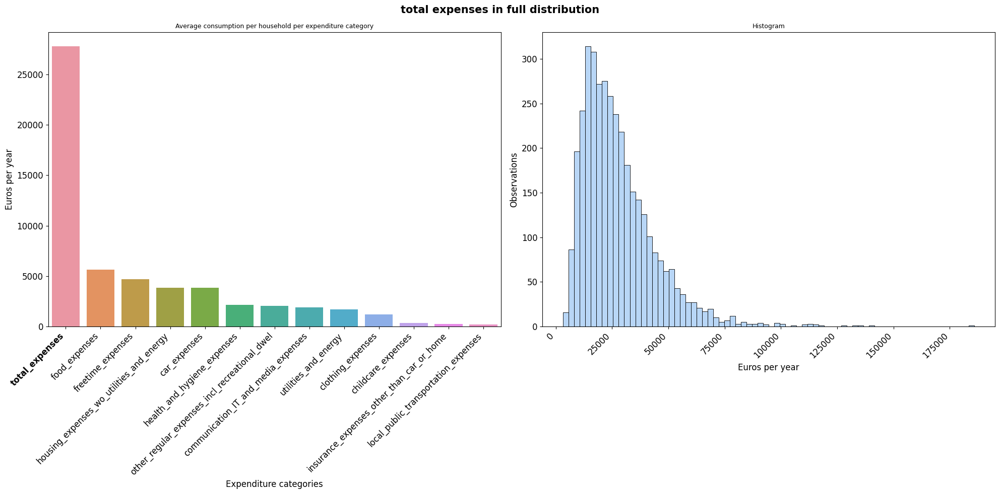

2024/03/20 00:04:57 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).
2024/03/20 00:04:57 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).


count     3673.00                             |        freetime_expenses  food_expenses  health_and_hygiene_expenses  clothing_expenses  communication_IT_and_media_expenses  childcare_expenses  utilities_and_energy  insurance_expenses_other_than_car_or_home  other_regular_expenses_incl_recreational_dwel  housing_expenses_wo_utilities_and_energy  local_public_transportation_expenses  car_expenses                                                                                        
mean     27786.87                             | count            3673.00        3673.00                      3673.00            3673.00                              3673.00             3673.00               3673.00                                    3673.00                                        3673.00                                   3673.00                               3673.00       3673.00                                                                                        
std      16367.05         

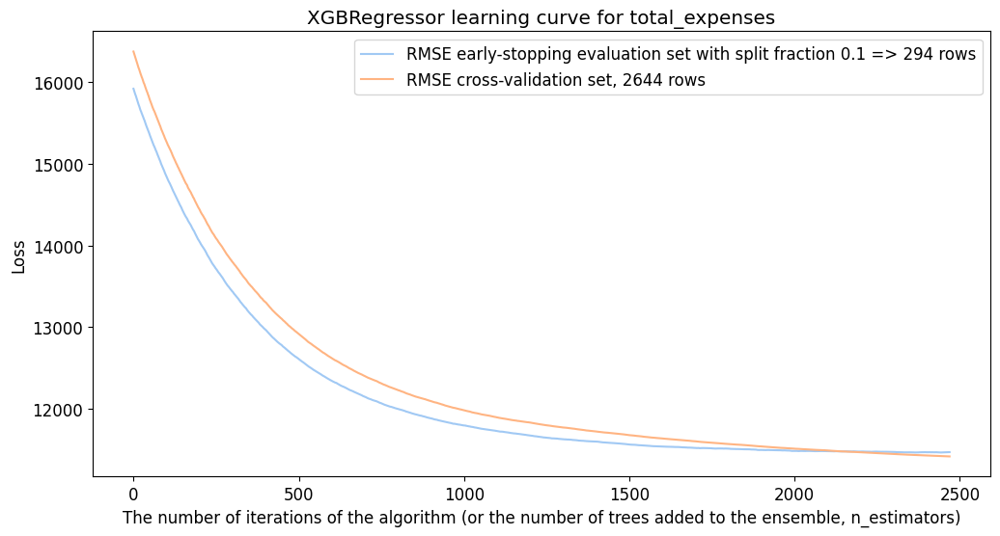

-----------------------------------------------------------------------------------------------------------------------

Interpreteable solutions for total_expenses:

-----------------------------------------------------------------------------------------------------------------------

Interpretable solution 1.1: linear regressor (uni-target) for total_expenses

Training R2: 0.511
Training explained variance: 0.511

Test mean absolute error: 7490.2
Test root mean squared error: 11836.7
Test R2 score: 0.484
Test explained variance score: 0.486
---------------------------------------------------------------------------------------                   | ---------------------------------------------------------------------------------------                               
 Comparison diagnostics: linear regression of *scaled* data against train set                             | Interpretation diagnostics: linear regression of *unscaled* data against train set                                 

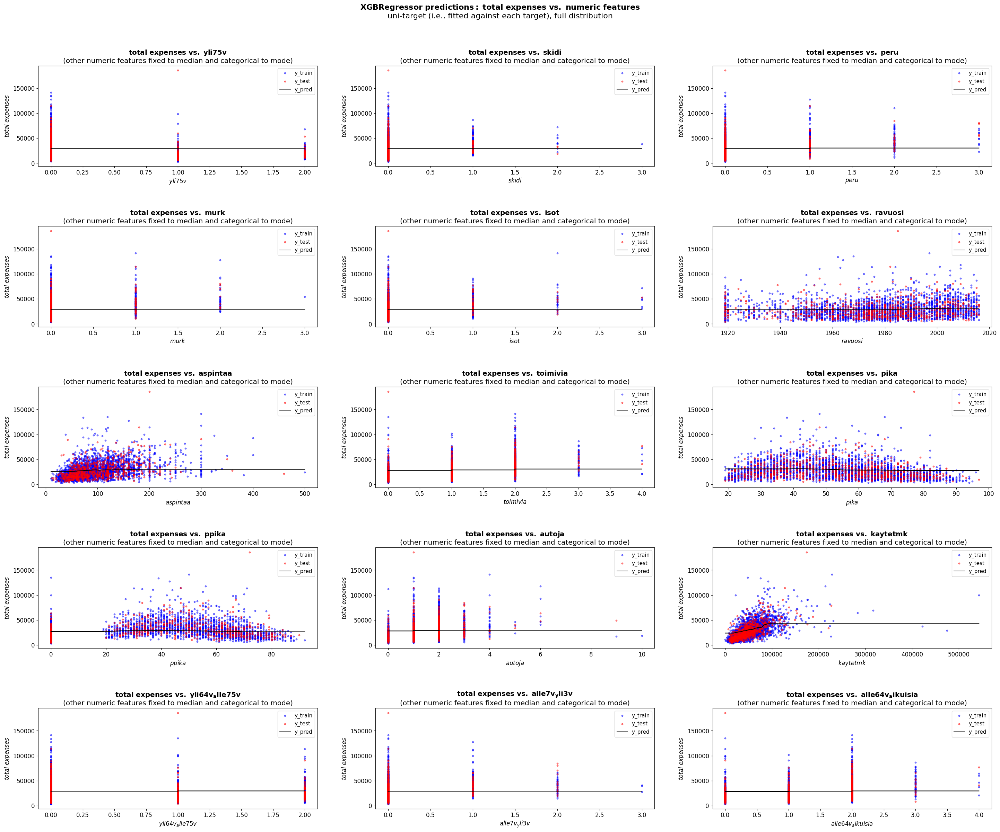

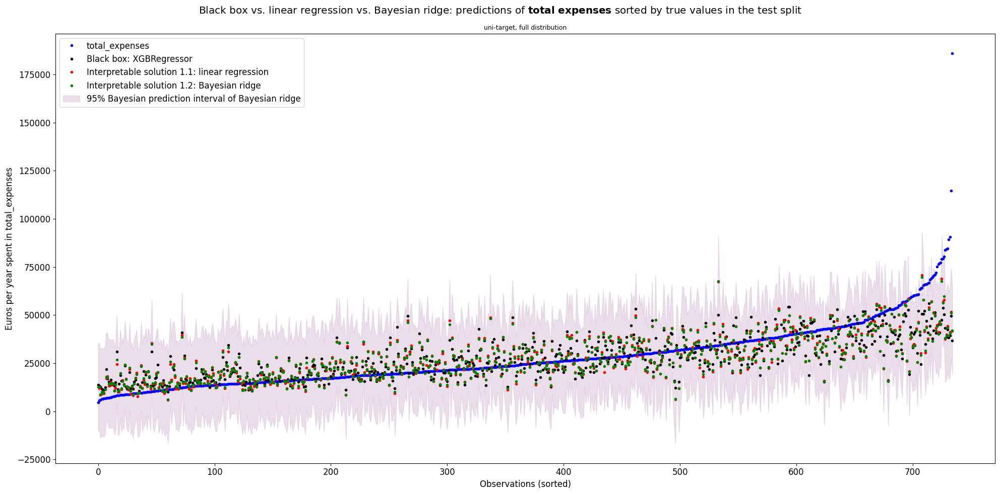

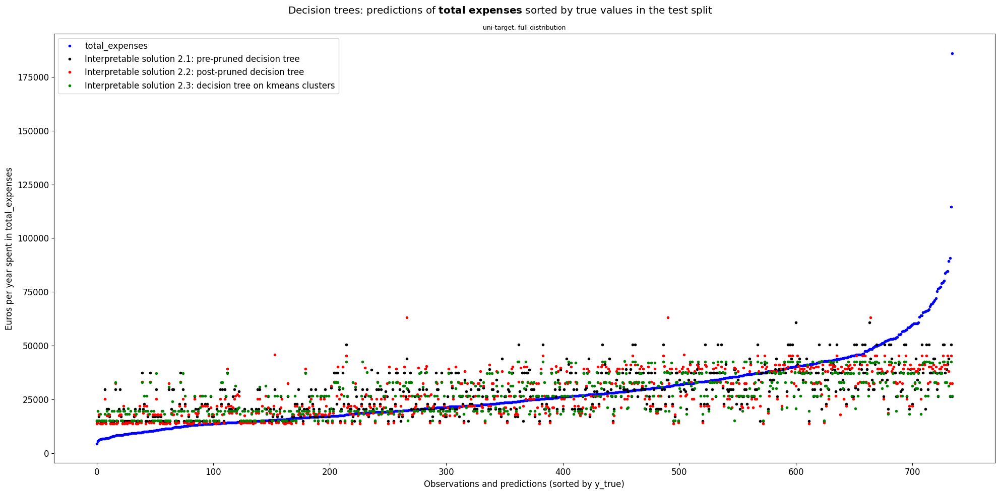

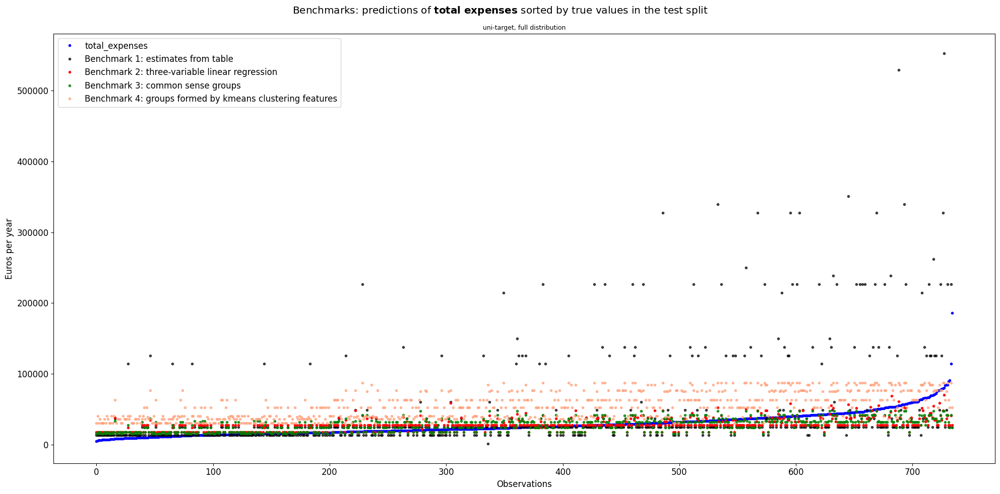


**************************************************************************************
Performance comparison for predicting total_expenses
**************************************************************************************
                                                             R2  Explained variance    MAE   RMSE
Bayesian ridge                                             0.49                0.49   7471  11820
Linear regression                                          0.48                0.49   7490  11836
Black box: XGBRegressor                                    0.47                0.47   7546  11962
Post-pruned decision tree                                  0.34                0.34   8700  13438
Pre-pruned decision tree                                   0.31                0.31   8977  13707
Kmeans cluster decision tree                               0.30                0.30   8955  13771
Benchmark 3: common sense groups                           0.29                0.29   

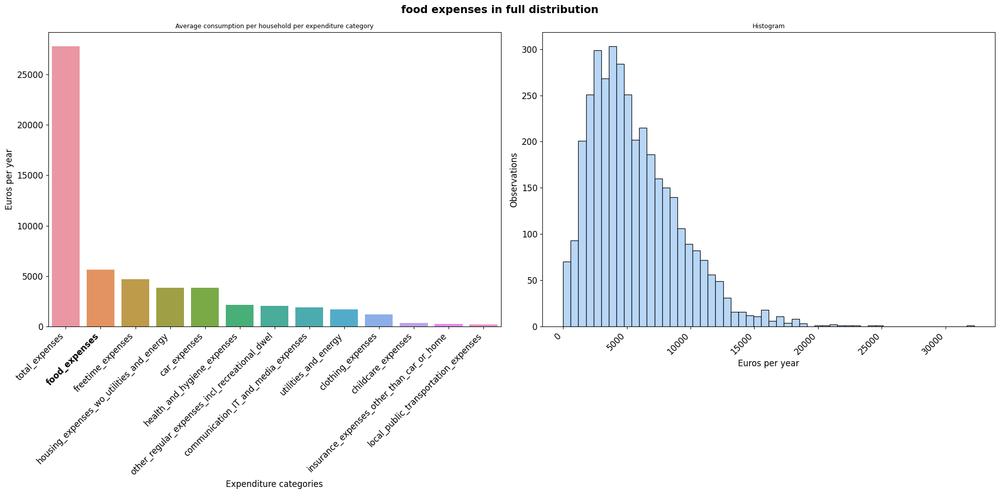

2024/03/20 00:06:37 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).
2024/03/20 00:06:37 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).


count    3673.00                              |        freetime_expenses  health_and_hygiene_expenses  clothing_expenses  communication_IT_and_media_expenses  childcare_expenses  utilities_and_energy  insurance_expenses_other_than_car_or_home  other_regular_expenses_incl_recreational_dwel  housing_expenses_wo_utilities_and_energy  local_public_transportation_expenses  car_expenses  total_expenses                                                                                       
mean     5651.72                              | count            3673.00                      3673.00            3673.00                              3673.00             3673.00               3673.00                                    3673.00                                        3673.00                                   3673.00                               3673.00       3673.00         3673.00                                                                                       
std      3526.31          

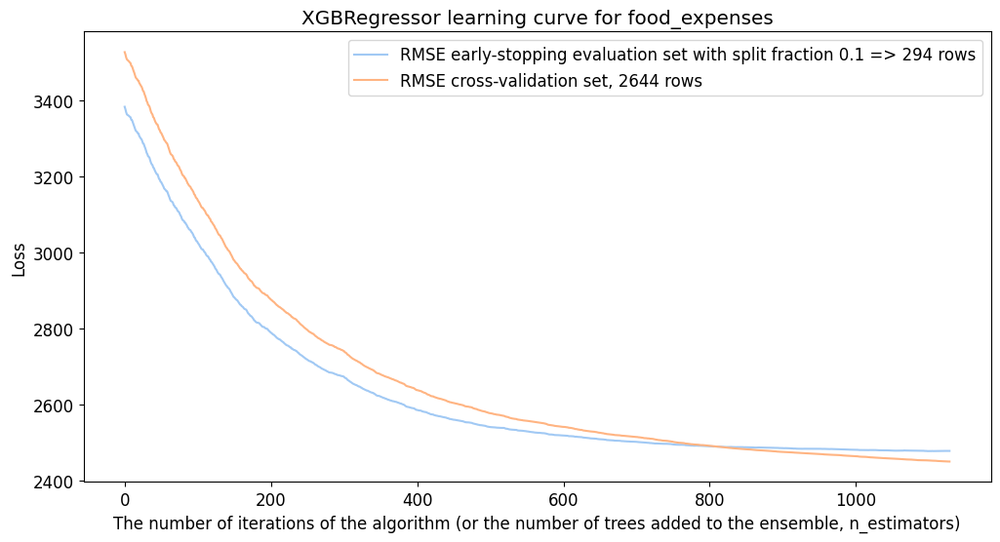

-----------------------------------------------------------------------------------------------------------------------

Interpreteable solutions for food_expenses:

-----------------------------------------------------------------------------------------------------------------------

Interpretable solution 1.1: linear regressor (uni-target) for food_expenses

Training R2: 0.519
Training explained variance: 0.519

Test mean absolute error: 1850.4
Test root mean squared error: 2558.7
Test R2 score: 0.484
Test explained variance score: 0.486
---------------------------------------------------------------------------------------                   | ---------------------------------------------------------------------------------------                               
 Comparison diagnostics: linear regression of *scaled* data against train set                             | Interpretation diagnostics: linear regression of *unscaled* data against train set                                    

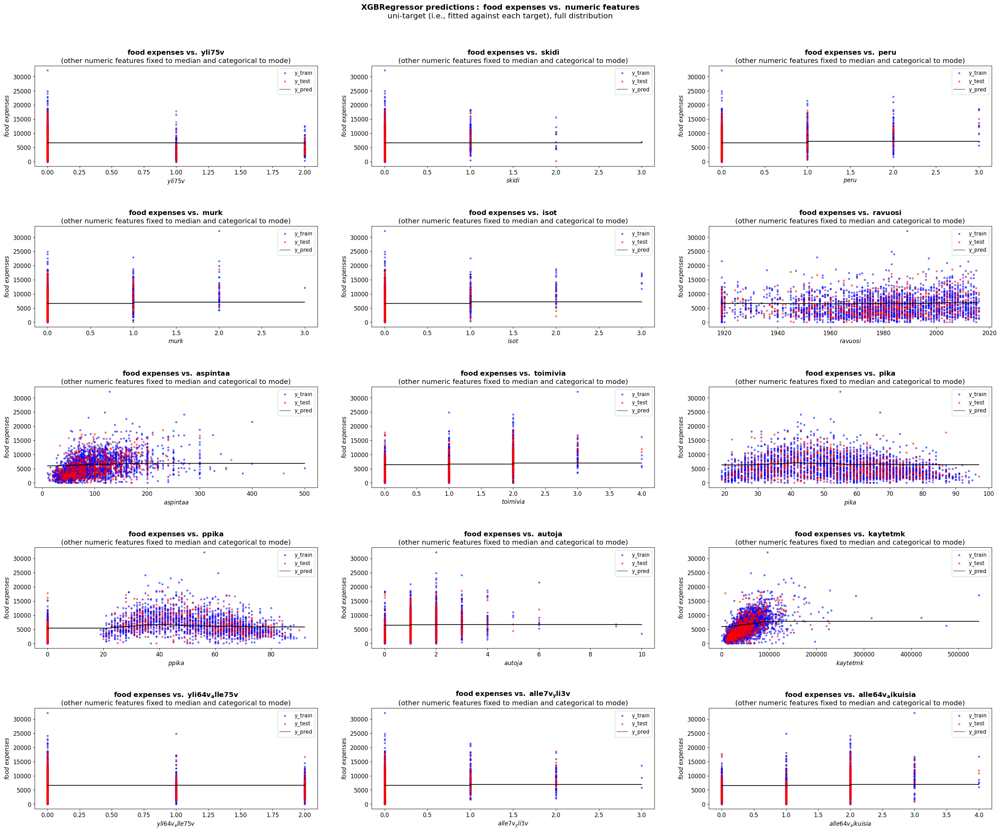

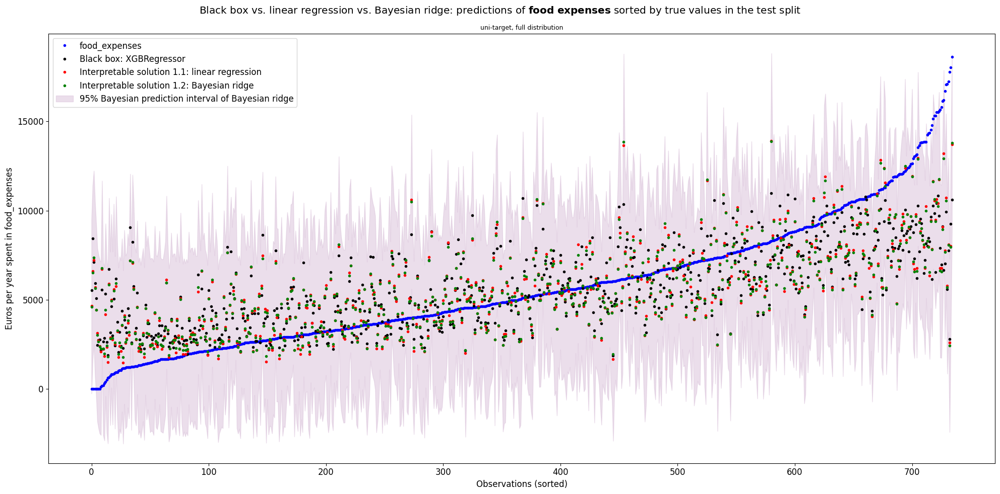

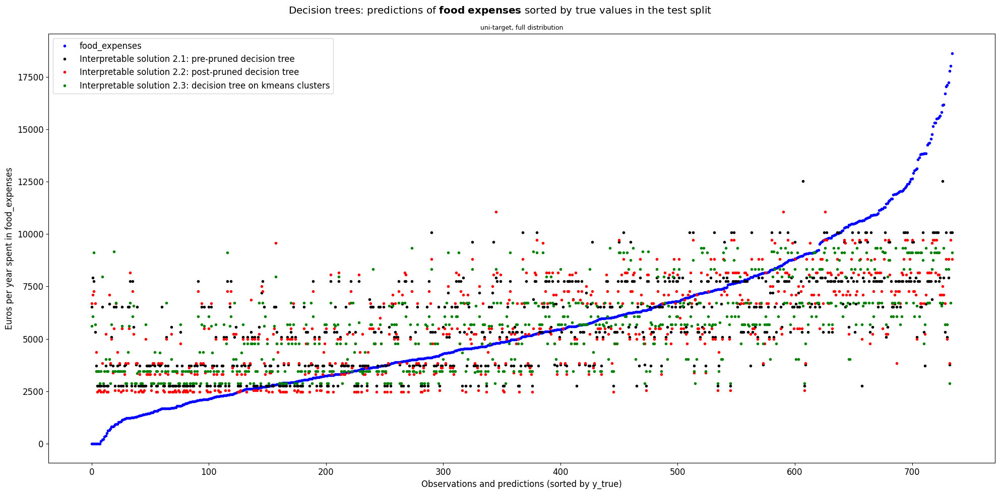

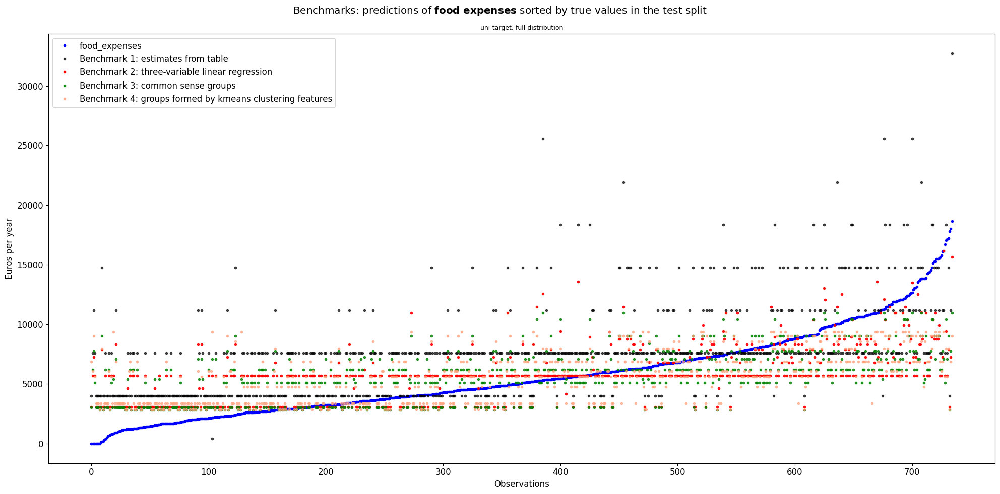


**************************************************************************************
Performance comparison for predicting food_expenses
**************************************************************************************
                                                            R2  Explained variance   MAE  RMSE
Linear regression                                         0.48                0.49  1850  2558
Bayesian ridge                                            0.48                0.49  1848  2560
Black box: XGBRegressor                                   0.46                0.46  1898  2624
Post-pruned decision tree                                 0.38                0.39  2065  2795
Benchmark 2: three-variable linear regression             0.37                0.37  2082  2837
Pre-pruned decision tree                                  0.36                0.36  2121  2848
Kmeans cluster decision tree                              0.36                0.37  2099  2843
Benchmark 3: 

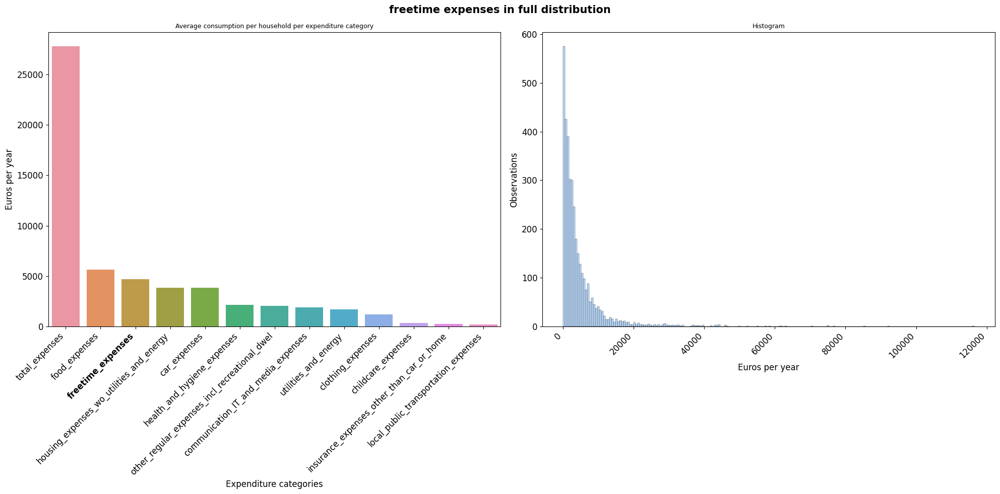

2024/03/20 00:07:41 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).
2024/03/20 00:07:41 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).


count     3673.00                             |        food_expenses  health_and_hygiene_expenses  clothing_expenses  communication_IT_and_media_expenses  childcare_expenses  utilities_and_energy  insurance_expenses_other_than_car_or_home  other_regular_expenses_incl_recreational_dwel  housing_expenses_wo_utilities_and_energy  local_public_transportation_expenses  car_expenses  total_expenses                                                                                           
mean      4701.49                             | count        3673.00                      3673.00            3673.00                              3673.00             3673.00               3673.00                                    3673.00                                        3673.00                                   3673.00                               3673.00       3673.00         3673.00                                                                                           
std       7416.44         

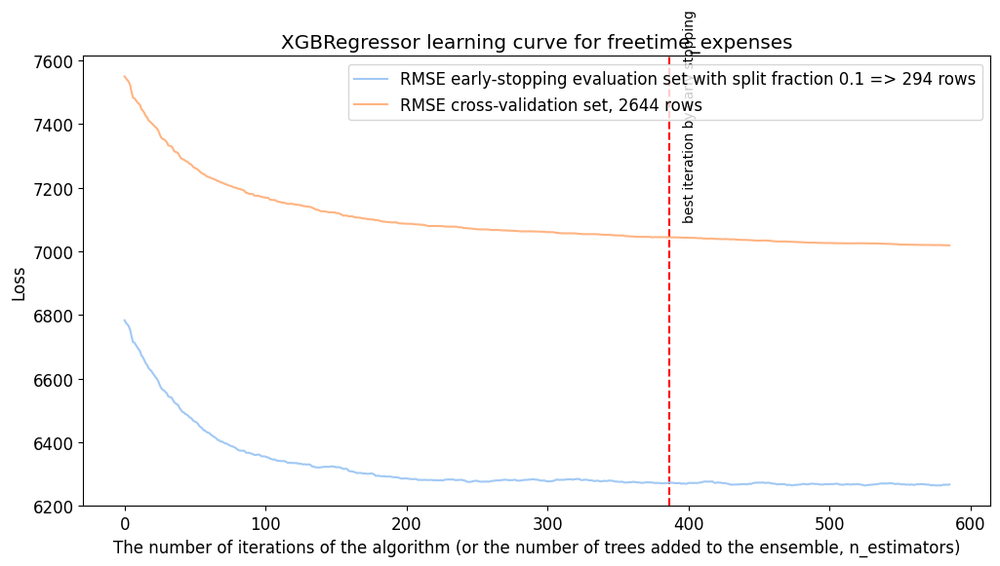

-----------------------------------------------------------------------------------------------------------------------

Interpreteable solutions for freetime_expenses:

-----------------------------------------------------------------------------------------------------------------------

Interpretable solution 1.1: linear regressor (uni-target) for freetime_expenses

Training R2: 0.134
Training explained variance: 0.134

Test mean absolute error: 3575.0
Test root mean squared error: 6498.0
Test R2 score: 0.167
Test explained variance score: 0.167
---------------------------------------------------------------------------------------                   | ---------------------------------------------------------------------------------------                               
 Comparison diagnostics: linear regression of *scaled* data against train set                             | Interpretation diagnostics: linear regression of *unscaled* data against train set                            

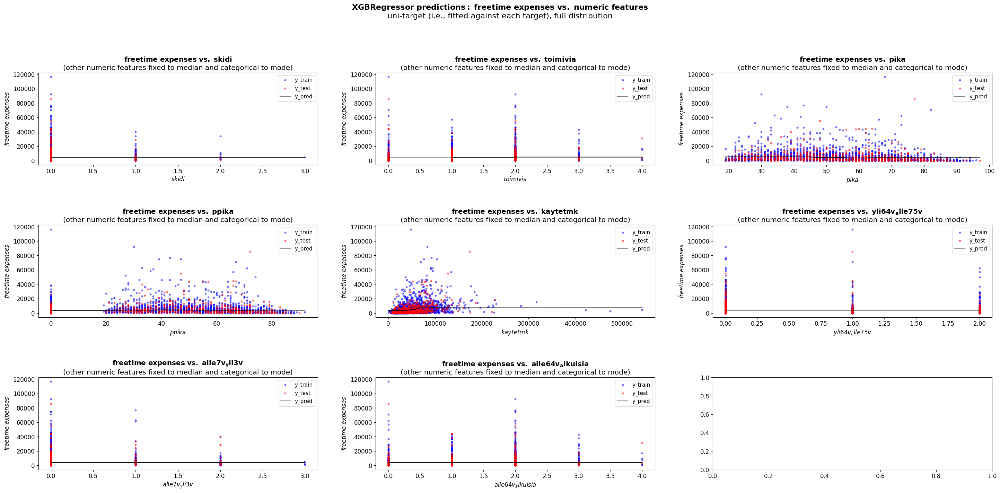

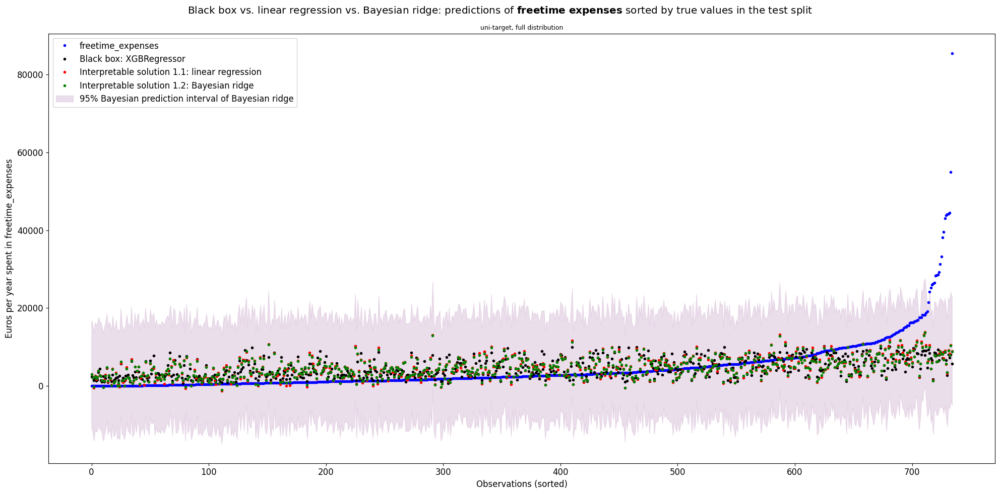

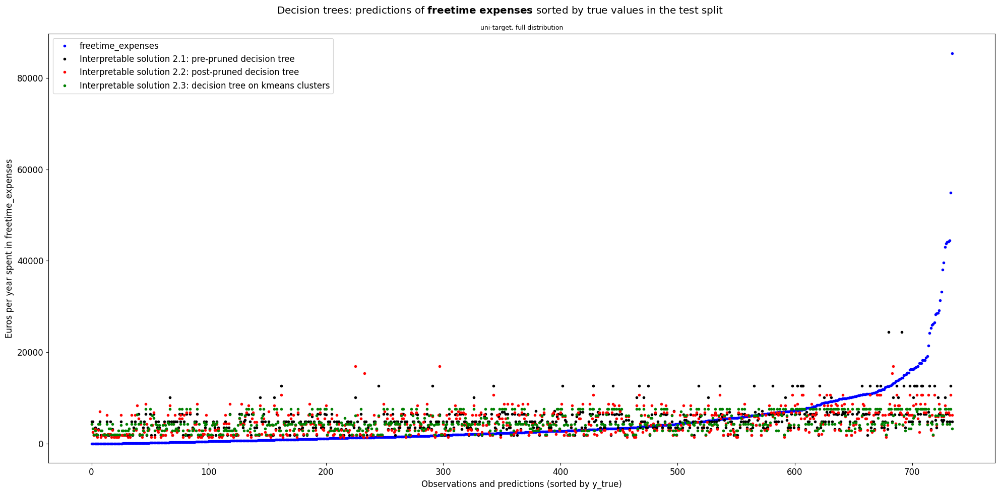

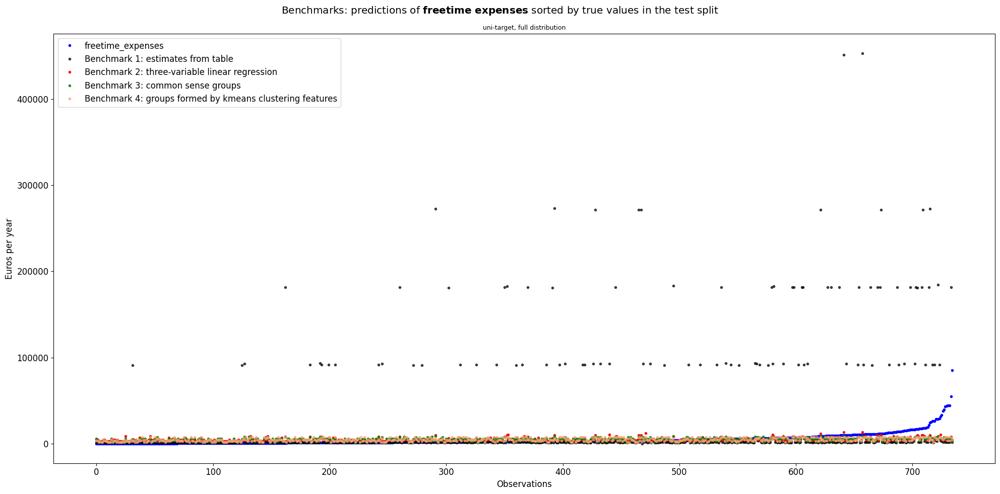


**************************************************************************************
Performance comparison for predicting freetime_expenses
**************************************************************************************
                                                             R2  Explained variance    MAE   RMSE
Linear regression                                          0.17                0.17   3575   6498
Bayesian ridge                                             0.17                0.17   3568   6499
Black box: XGBRegressor                                    0.15                0.15   3577   6583
Pre-pruned decision tree                                   0.09                0.09   3838   6809
Post-pruned decision tree                                  0.09                0.09   3779   6804
Kmeans cluster decision tree                               0.07                0.07   3880   6882
Benchmark 2: three-variable linear regression              0.07                0.07

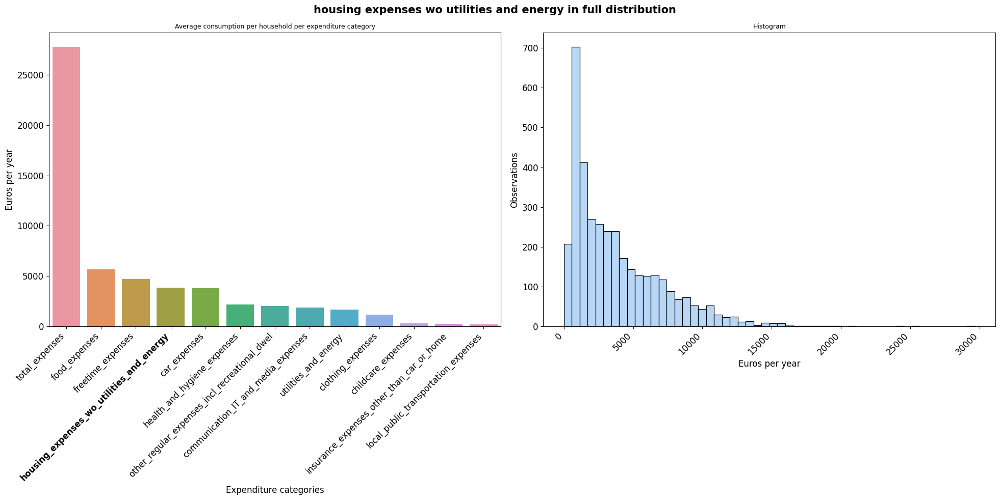

2024/03/20 00:08:54 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).
2024/03/20 00:08:54 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).


count    3673.00                              |        freetime_expenses  food_expenses  health_and_hygiene_expenses  clothing_expenses  communication_IT_and_media_expenses  childcare_expenses  utilities_and_energy  insurance_expenses_other_than_car_or_home  other_regular_expenses_incl_recreational_dwel  local_public_transportation_expenses  car_expenses  total_expenses                                                                                                                  
mean     3825.13                              | count            3673.00        3673.00                      3673.00            3673.00                              3673.00             3673.00               3673.00                                    3673.00                                        3673.00                               3673.00       3673.00         3673.00                                                                                                                  
std      3360.79          

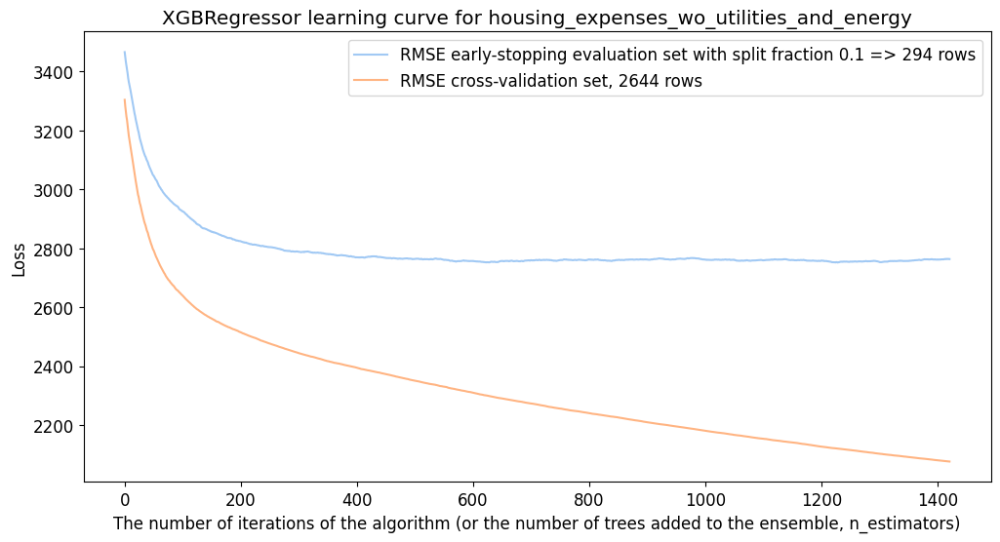

-----------------------------------------------------------------------------------------------------------------------

Interpreteable solutions for housing_expenses_wo_utilities_and_energy:

-----------------------------------------------------------------------------------------------------------------------

Interpretable solution 1.1: linear regressor (uni-target) for housing_expenses_wo_utilities_and_energy

Training R2: 0.369
Training explained variance: 0.369

Test mean absolute error: 1996.7
Test root mean squared error: 2807.3
Test R2 score: 0.343
Test explained variance score: 0.344
---------------------------------------------------------------------------------------                   | ---------------------------------------------------------------------------------------                               
            Comparison diagnostics: linear regression of *scaled* data against train set                  |          Interpretation diagnostics: linear regression of *unsca

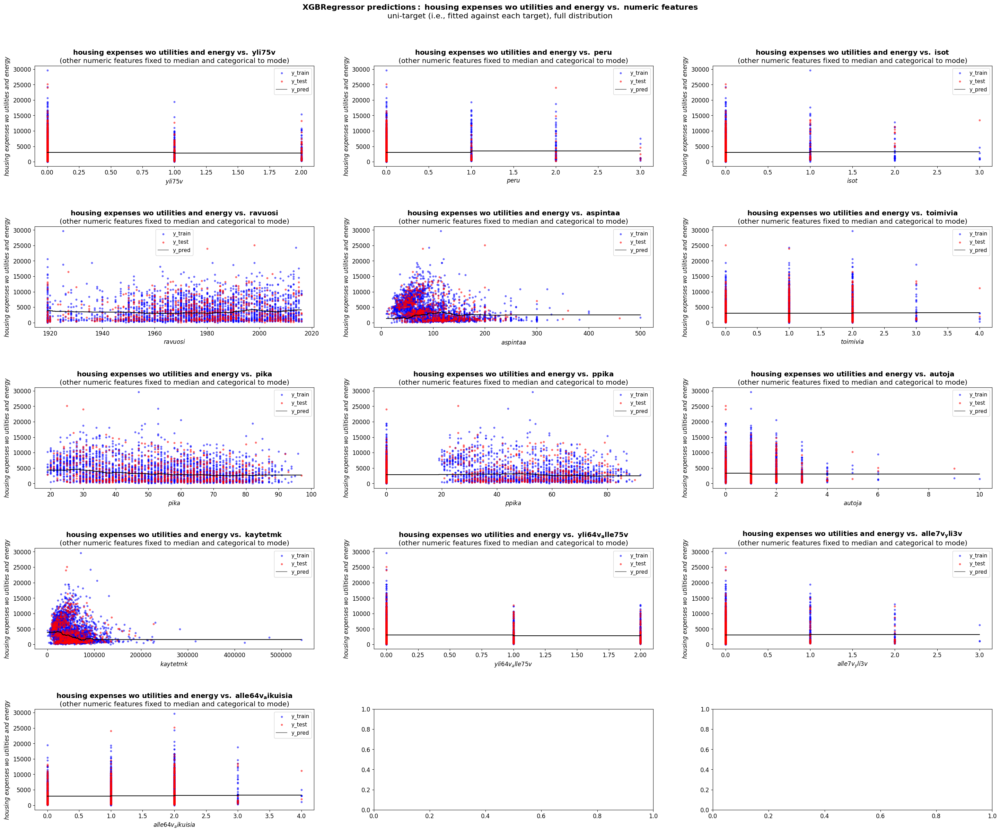

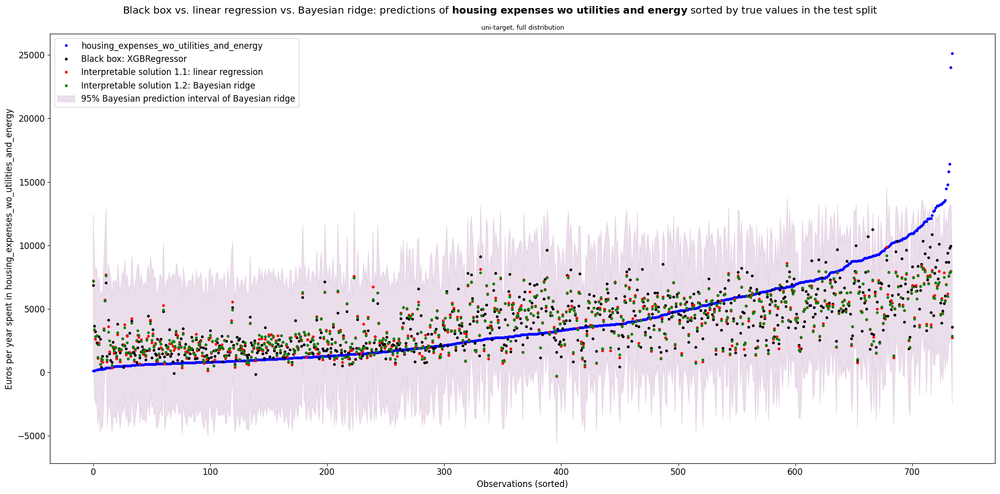

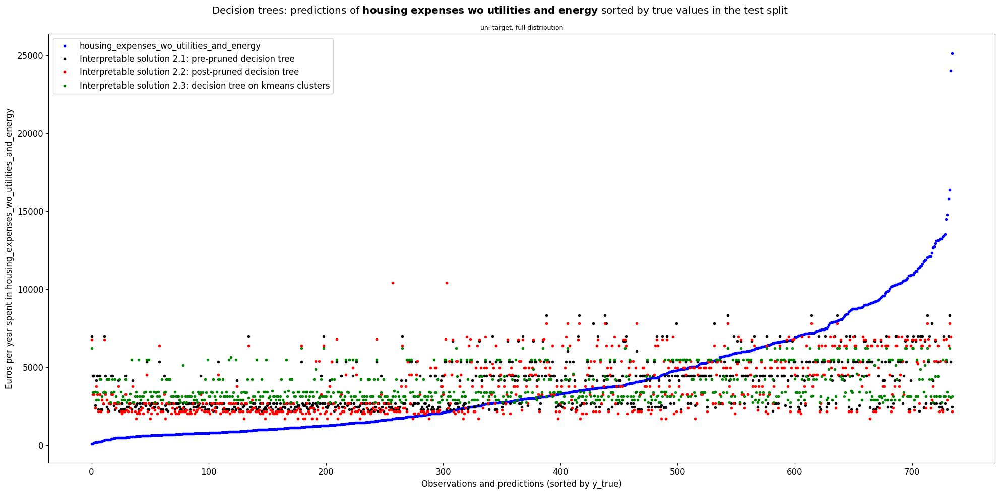

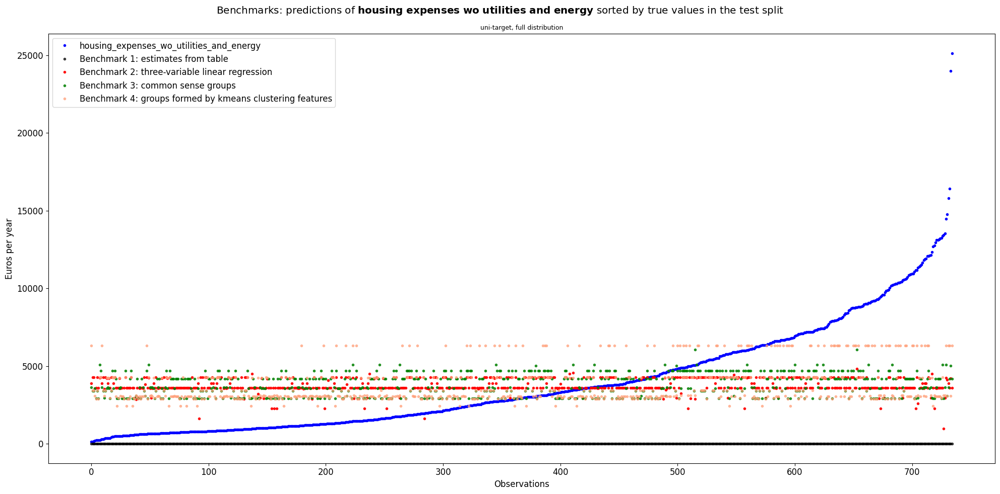


**************************************************************************************
Performance comparison for predicting housing_expenses_wo_utilities_and_energy
**************************************************************************************
                                                            R2  Explained variance   MAE  RMSE
Black box: XGBRegressor                                   0.39                0.40  1869  2694
Linear regression                                         0.34                0.34  1996  2807
Bayesian ridge                                            0.34                0.35  1996  2804
Post-pruned decision tree                                 0.21                0.21  2206  3079
Pre-pruned decision tree                                  0.18                0.18  2284  3145
Benchmark 4: groups formed by kmeans clustering features  0.07                0.08  2499  3334
Kmeans cluster decision tree                              0.06                0.0

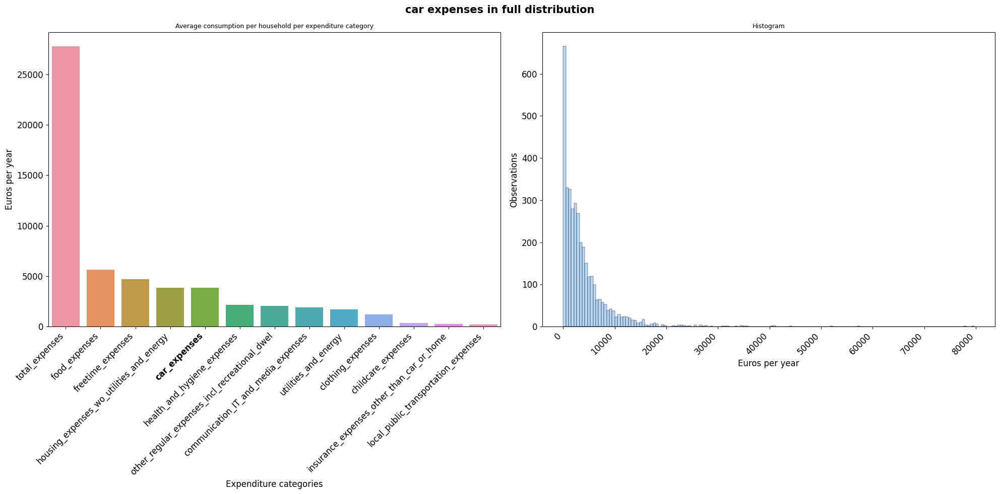

2024/03/20 00:10:33 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).
2024/03/20 00:10:33 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).


count    3673.00                              |        freetime_expenses  food_expenses  health_and_hygiene_expenses  clothing_expenses  communication_IT_and_media_expenses  childcare_expenses  utilities_and_energy  insurance_expenses_other_than_car_or_home  other_regular_expenses_incl_recreational_dwel  housing_expenses_wo_utilities_and_energy  local_public_transportation_expenses  total_expenses                                                                                      
mean     3818.95                              | count            3673.00        3673.00                      3673.00            3673.00                              3673.00             3673.00               3673.00                                    3673.00                                        3673.00                                   3673.00                               3673.00         3673.00                                                                                      
std      4876.25          

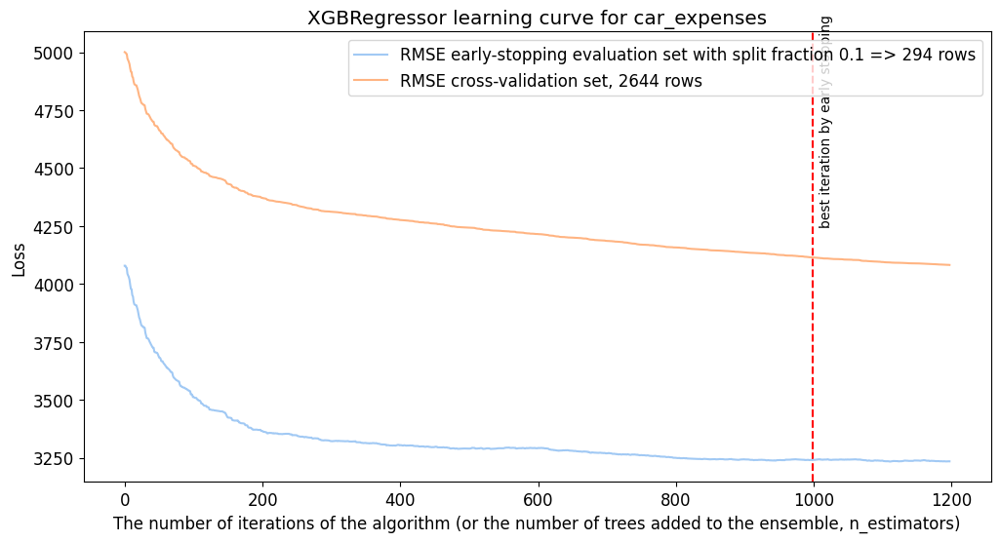

-----------------------------------------------------------------------------------------------------------------------

Interpreteable solutions for car_expenses:

-----------------------------------------------------------------------------------------------------------------------

Interpretable solution 1.1: linear regressor (uni-target) for car_expenses

Training R2: 0.316
Training explained variance: 0.316

Test mean absolute error: 2319.7
Test root mean squared error: 3953.5
Test R2 score: 0.276
Test explained variance score: 0.277
---------------------------------------------------------------------------------------                   | ---------------------------------------------------------------------------------------                               
 Comparison diagnostics: linear regression of *scaled* data against train set                             | Interpretation diagnostics: linear regression of *unscaled* data against train set                                    
=

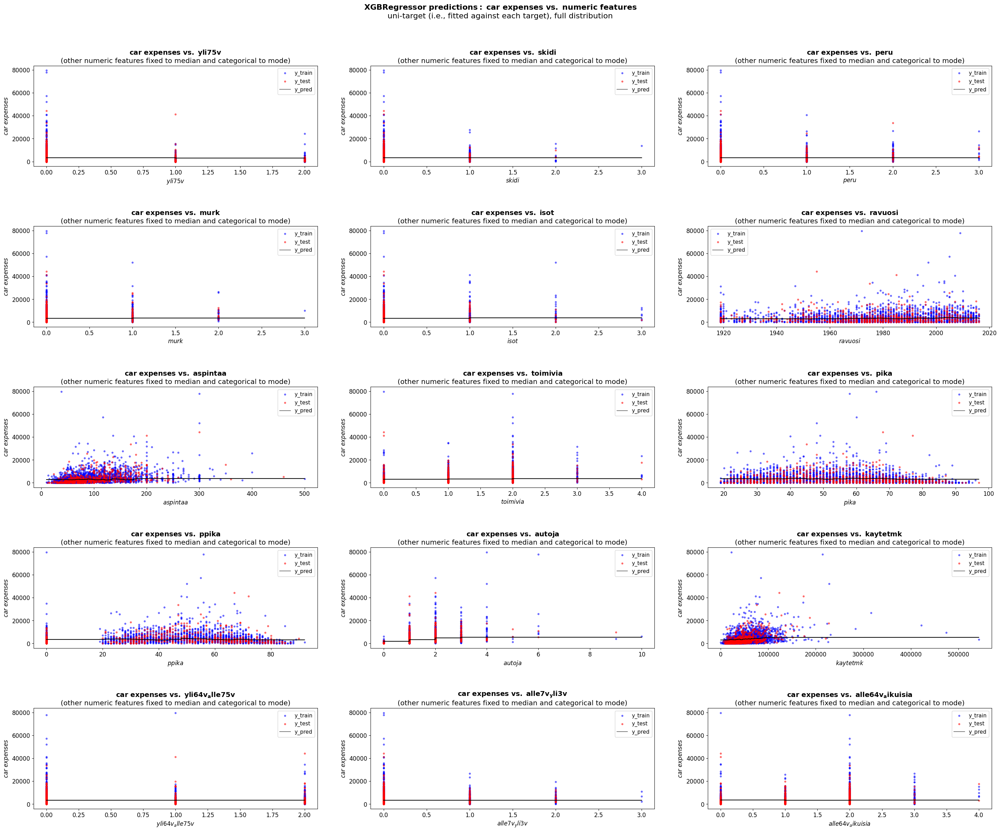

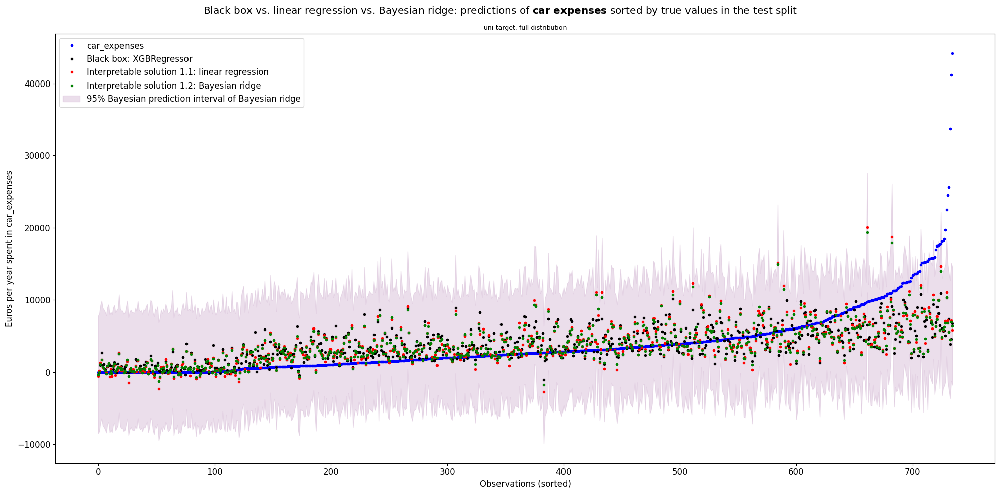

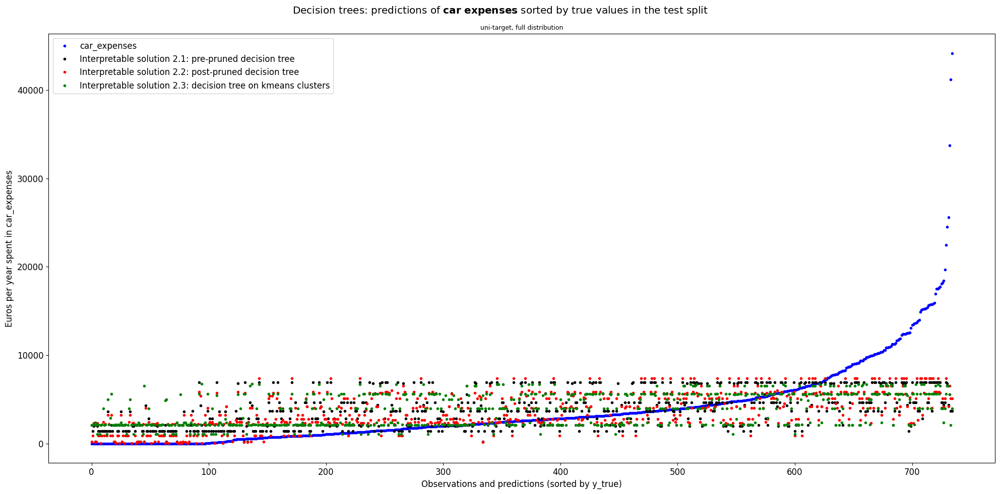

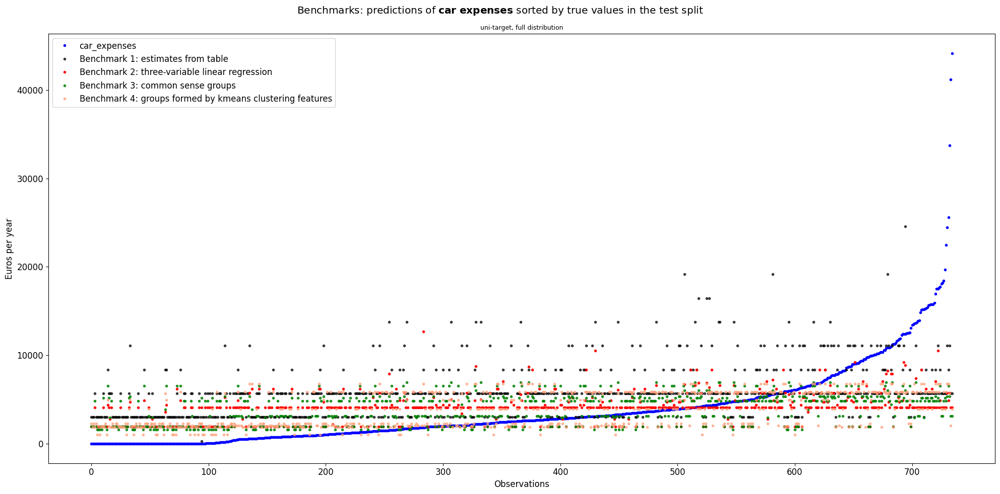


**************************************************************************************
Performance comparison for predicting car_expenses
**************************************************************************************
                                                            R2  Explained variance   MAE  RMSE
Bayesian ridge                                            0.29                0.29  2296  3925
Black box: XGBRegressor                                   0.28                0.28  2309  3938
Linear regression                                         0.28                0.28  2319  3953
Post-pruned decision tree                                 0.21                0.21  2519  4143
Pre-pruned decision tree                                  0.17                0.17  2648  4233
Benchmark 4: groups formed by kmeans clustering features  0.16                0.16  2671  4249
Kmeans cluster decision tree                              0.14                0.14  2725  4318
Benchmark 2: t

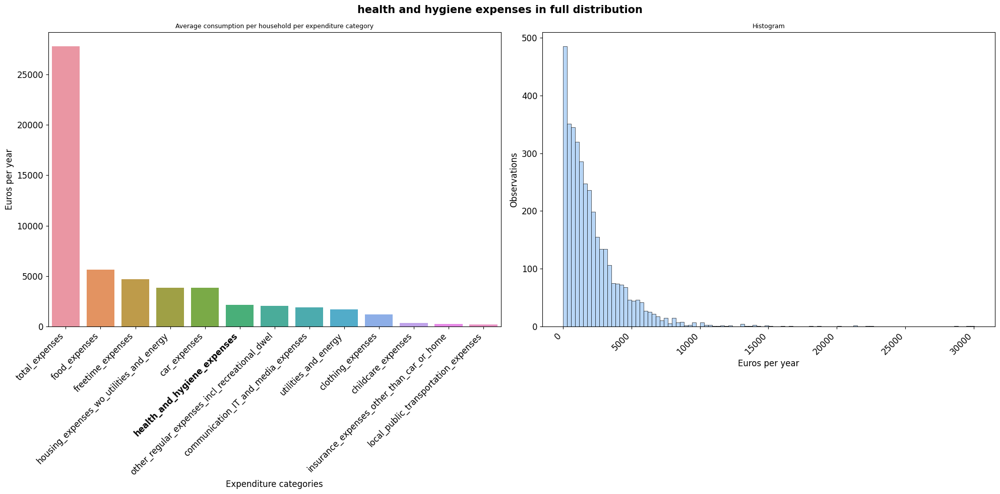

2024/03/20 00:12:02 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).
2024/03/20 00:12:02 WARNING mlflow.data.pandas_dataset: Failed to infer schema for Pandas dataset. Exception: Unable to map 'object' type to MLflow DataType. object can be mapped iff all values have identical data type which is one of (string, (bytes or byterray),  int, float).


count    3673.00                              |        freetime_expenses  food_expenses  clothing_expenses  communication_IT_and_media_expenses  childcare_expenses  utilities_and_energy  insurance_expenses_other_than_car_or_home  other_regular_expenses_incl_recreational_dwel  housing_expenses_wo_utilities_and_energy  local_public_transportation_expenses  car_expenses  total_expenses                                                                                                     
mean     2165.09                              | count            3673.00        3673.00            3673.00                              3673.00             3673.00               3673.00                                    3673.00                                        3673.00                                   3673.00                               3673.00       3673.00         3673.00                                                                                                     
std      2357.56          

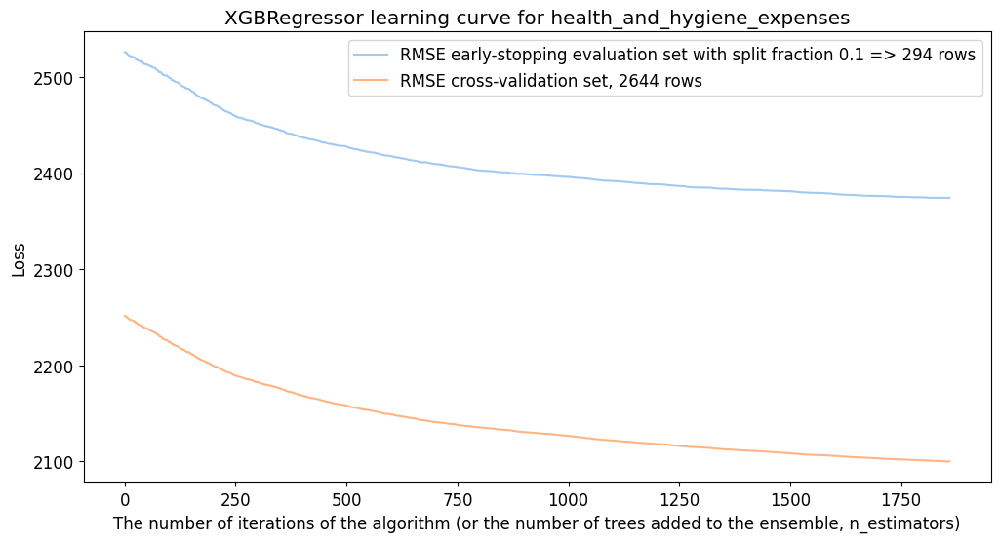

-----------------------------------------------------------------------------------------------------------------------

Interpreteable solutions for health_and_hygiene_expenses:

-----------------------------------------------------------------------------------------------------------------------

Interpretable solution 1.1: linear regressor (uni-target) for health_and_hygiene_expenses

Training R2: 0.155
Training explained variance: 0.155

Test mean absolute error: 1509.2
Test root mean squared error: 2492.5
Test R2 score: 0.105
Test explained variance score: 0.11
---------------------------------------------------------------------------------------                   | ---------------------------------------------------------------------------------------                               
      Comparison diagnostics: linear regression of *scaled* data against train set                        |    Interpretation diagnostics: linear regression of *unscaled* data against train set      

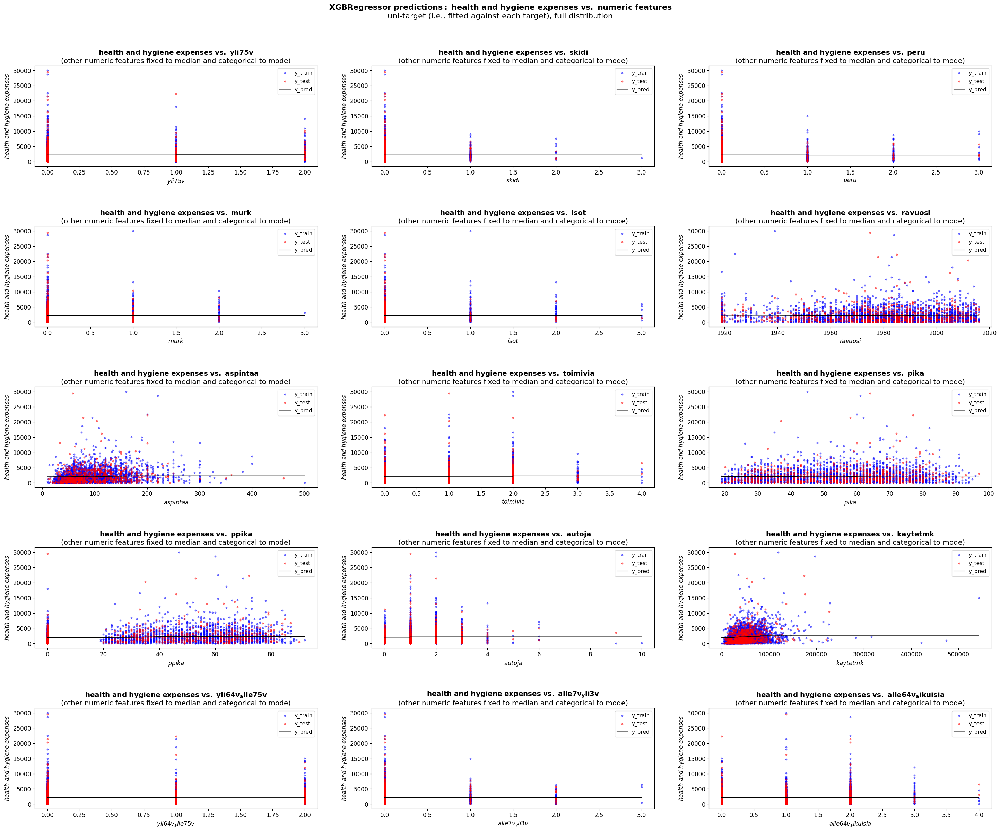

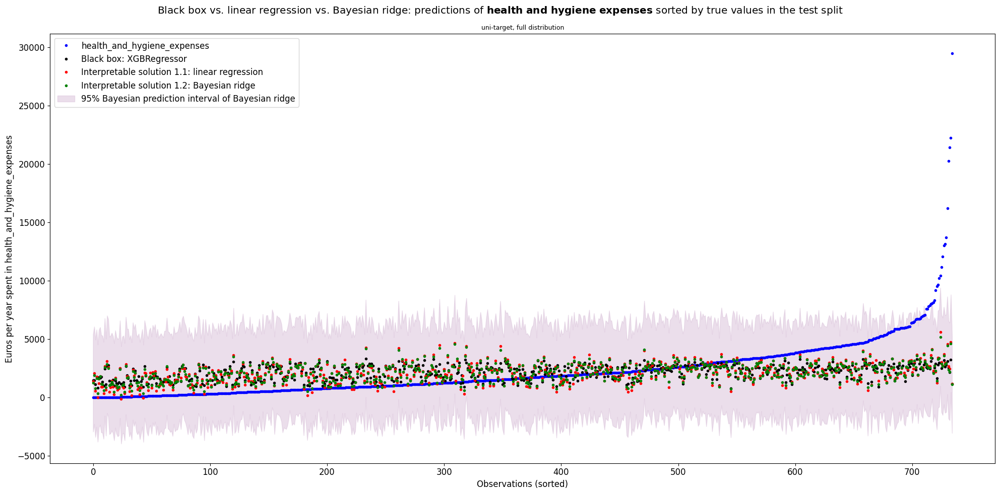

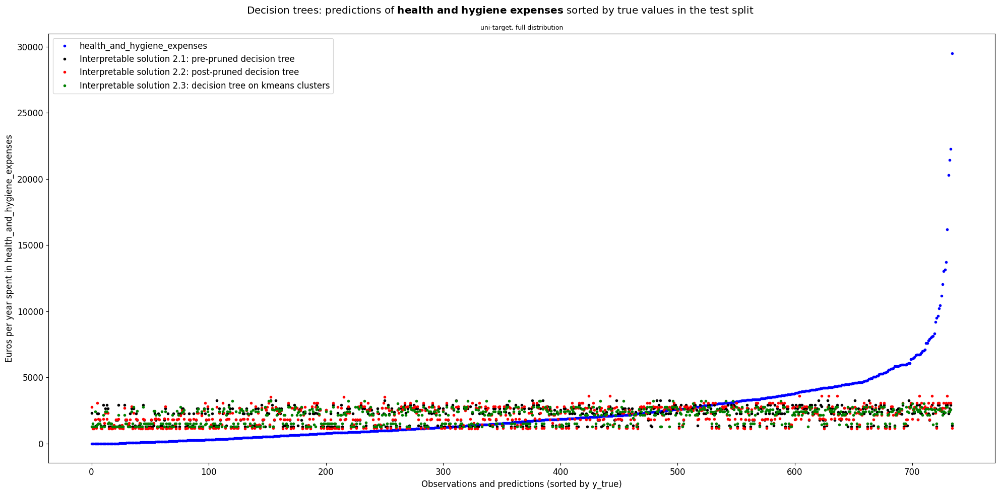

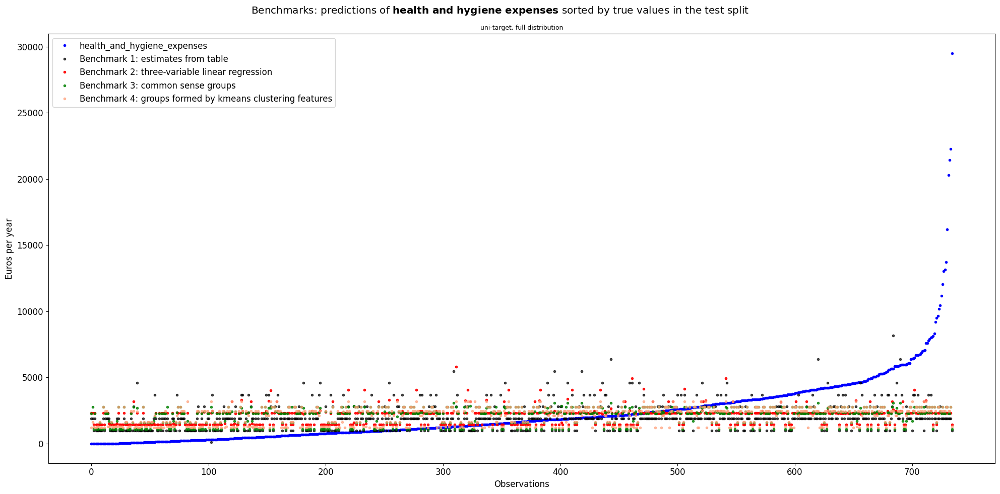


**************************************************************************************
Performance comparison for predicting health_and_hygiene_expenses
**************************************************************************************
                                                            R2  Explained variance   MAE  RMSE
Linear regression                                         0.11                0.11  1509  2492
Bayesian ridge                                            0.10                0.10  1507  2499
Black box: XGBRegressor                                   0.07                0.08  1526  2534
Post-pruned decision tree                                 0.06                0.07  1548  2549
Pre-pruned decision tree                                  0.05                0.05  1561  2572
Kmeans cluster decision tree                              0.05                0.05  1555  2572
Benchmark 4: groups formed by kmeans clustering features  0.05                0.05  1564  2573

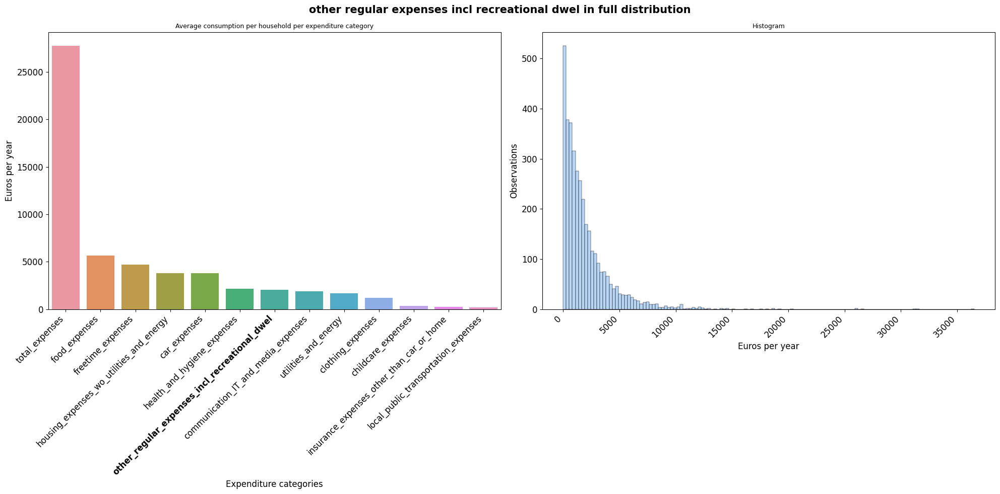

In [103]:
from xgboost import XGBRegressor
from xgboost import XGBRFRegressor
import xgboost as xgb
from catboost import CatBoostRegressor, Pool
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score, mean_absolute_error
import scipy.stats as stats
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text
from sklearn import tree
from xgboost import plot_tree as xgb_plot_tree
from sklearn.tree import plot_tree as sklearn_plot_tree
import warnings
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, DotProduct, WhiteKernel, Matern, RationalQuadratic, ExpSineSquared
from sklearn.linear_model import BayesianRidge
from sklearn.svm import SVR
from optuna.integration import XGBoostPruningCallback
from optuna.integration import CatBoostPruningCallback
from optuna.integration import LightGBMPruningCallback
from optuna.integration import OptunaSearchCV
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from scipy.optimize import minimize
import random
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import mlflow
from mlflow import log_metric, log_param, log_params, log_artifacts, autolog
import contextlib
from optuna.integration.mlflow import MLflowCallback
from mlflow.data.pandas_dataset import PandasDataset
from mlflow.models.signature import infer_signature
import tempfile
from dict_and_html import *
import math
import html
import sys
from io import StringIO
# from lightgbm_callbacks import LGBMDartEarlyStoppingEstimator
# from lightgbm_callbacks import ProgressBarCallback, DartEarlyStoppingCallback

# %matplotlib inline
# mpl.is_interactive()
# plt.ioff()
##
## Settings:
##

# MLOps with Mlflow

# First, finish/disable any active runs/logging/tracking from previous runs
autolog(disable = True)
mlflow.xgboost.autolog(disable = True)
mlflow.sklearn.autolog(disable = True)
mlflow.end_run()

# Mlflow settings:
use_mlflow = True
log_interpretable_models = False
log_black_box_models = False

# mlflow_URI = "http://127.0.0.1:5000"
if (windows_environment):
    mlflow_URI = r"file:C:\Users\XXXXX\Documents\Code\mlruns"
else:
    mlflow_URI = r"file:/home/XXXXX/Documents/Code/mlruns"

# Linux: run in terminal: mlflow ui --backend-store-uri 'file:/home/XXXXX/Documents/Code/mlruns' --default-artifact-root 'file:/home/XXXXX/Documents/Code/mlartifacts'
# Windows: run in PowerShell: mlflow ui --backend-store-uri 'file:C:\Users\XXXXX\Documents\Code\mlruns' --default-artifact-root 'file:C:\Users\XXXXX\Documents\Code\mlartifacts'

# For autologging:
# if (use_mlflow):
#     mlflow.set_tracking_uri(uri=mlflow_URI) 
#     mlflow.xgboost.autolog(log_input_examples = True, log_model_signatures = True, log_models = log_black_box_models, log_datasets = True, disable = False, exclusive = False, silent = True)
#     mlflow.sklearn.autolog(log_input_examples = True, log_model_signatures = True, log_models = log_interpretable_models, log_datasets = True, disable = False, exclusive = False, silent = True)
#     optuna.logging.set_verbosity(optuna.logging.ERROR)

# Modeling configuration
n_jobs_sync = 1 # Value "1" synchronizes (awaits) for the finishing of Optuna Study optimize()
nthread = -1

# Pipeline info
show_call_back_info = False
show_Optuna_progress_bar = False

# About the features given to the black box
native_categorical_feature_handling = True
PCA_cutoff_variance_ratio = 0.0 # No PCA transformation if set to 0.0
PCA_cutoff_variance_ratio_benchmark4 = 0.9

if (PCA_cutoff_variance_ratio != 0.0): # If PCA is turned on, native categorical feature handling cannot be on, because we must have all features in numerical format to be able to do the PCA transformation
    native_categorical_feature_handling = False
    n_features = 50

# Comparison, visualization and analytics
include_benchmark_3_4_5 = True
include_benchmark_5 = False
additional_scrutiny_of_Bayesian_ridge_prediction_intervals = False
additional_scrutiny_of_Gaussian_processes_prediction_intervals = True
plot_learning_curves = True
optuna_study_plots = False

# Hyperparameter search
n_trials_black_box = 10
timeout_black_box = None
n_trials_interpretable_solutions = 10

# Prediction problem
multitarget = False # For added interpretability of the black box models (where applicable), since there is one fit against all targets instead of one fit against each. Currently, the multitarget codeflow might be broken.

# Interpretation and visualization of the black box (where applicable):
print_tree_rules = False
plot_tree = False
print_regression_coefficients = True

# Model selection and loading

model_to_load = "" # Leave empty for not loading a model from file

# target_variables = ["total_expenses", 'food_expenses', 'freetime_expenses', 'housing_expenses_wo_utilities_and_energy', 'car_expenses', 'health_and_hygiene_expenses','other_regular_expenses_incl_recreational_dwel', 'communication_IT_and_media_expenses', 'utilities_and_energy', 'clothing_expenses', 'childcare_expenses', 'insurance_expenses_other_than_car_or_home', 'local_public_transportation_expenses']
target_variables = y.mean().sort_values(ascending=False).index.tolist() # Make sure the target variables are sorted by magnitude

# target_variables = [target for target in column_sums.index if target not in ["grand_total", "total_expenses", "food_expenses", "freetime_expenses", "housing_expenses_wo_utilities_and_energy", 'car_expenses', 'health_and_hygiene_expenses','other_regular_expenses_incl_recreational_dwel']]

# model_estimator_constructors = [lambda **args: XGBRegressor(**args)]
model_estimator_constructors = [lambda **args: XGBRegressor(**args)]
# model_estimator_constructors = [lambda **args: SVR(**args), lambda **args: GaussianProcessRegressor(**args), lambda **args: CatBoostRegressor(**args), lambda **args: XGBRFRegressor(**args), lambda **args: RandomForestRegressor(**args)]

# model_estimator_constructors = [lambda **args: XGBRegressor(**args), lambda **args: CatBoostRegressor(**args), lambda **args: XGBRFRegressor(**args), lambda **args: GaussianProcessRegressor(**args), lambda **args: ElasticNet(**args), lambda **args: SVR(**args)]

# model_estimator_constructors = [lambda **args: SVR(**args)]

##
## Kernels for GaussianProcessRegressor
##

#     Kernel with parameters given in GPML book for the gaussian surrogate models. The hyperparameters are optimized so you can get anything here.
# k1 = 5**2 * RBF(length_scale=1e-5)  # long term smooth rising trend RBF: radio basis functions (you can have many, this is one).
# k2 = 5**2 * RBF(length_scale=0.000415) * ExpSineSquared(length_scale=3.51e-5, periodicity=0.000199)  # seasonal component
# # medium term irregularity
# k3 = 316**2 * RationalQuadratic(length_scale=3.54, alpha=1e+05)
# k4 = 316**2 * RBF(length_scale=4.82) + WhiteKernel(noise_level=0.43)  # noise terms

# Tried:
# kernel = k1 + k2 + k3 + k4 # very good predictive power: beats linear regression; medium non-linearity
# kernel = 1.0 * ExpSineSquared(length_scale=1.0, periodicity=3.0, length_scale_bounds=(0.1, 10.0), periodicity_bounds=(1.0, 10.0)) # Resulting in an error
# kernel = 1.0 * Matern(length_scale=1.0, length_scale_bounds=(1e-1, 10.0), nu=2.5) # mediocre predictive power (training fit always 1.0); high non-linearity
# kernel = ConstantKernel()*RBF(length_scale=1.0, length_scale_bounds=(1.0e-5, 1.3e-1)) + WhiteKernel() # poor predictive power
kernel = Matern() + WhiteKernel() # very good predictive power: beats linear regression; medium non-linearity
# kernel = 1.0 * RationalQuadratic(length_scale=1.0, alpha=0.1) # good predictive power
# kernel = ConstantKernel()*RBF() + WhiteKernel(noise_level=0.1) # good predictive power
# kernel = RBF(length_scale=10) + WhiteKernel(noise_level=1) # very good predictive power: beats linear regression; high non-linearity
# kernel = 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0)) # very poor predictive power
# kernel = ExpSineSquared(periodicity = 30)*RBF() + RBF() + RationalQuadratic() + WhiteKernel() # very good predictive power: beats linear regression; medium non-linearity


modeling_choice_description = f"{'multi-target (i.e., fitted against each target)' if multitarget else 'uni-target (i.e., fitted against each target)'}{f' with PCA dimensionality reduction at {PCA_cutoff_variance_ratio} expvar cutoff level' if PCA_cutoff_variance_ratio != 0.0 else ''}"
modeling_choice_description_short = f"{'multi-target' if multitarget else 'uni-target'}{f' with PCA {PCA_cutoff_variance_ratio} cutoff' if PCA_cutoff_variance_ratio != 0.0 else ''}"
distribution_description = f"{'full distribution' if (not floor_lower_tails and not cap_upper_tails and not drop_lower_tails and not drop_upper_tails) else 'distribution with lower tail floored' if (floor_lower_tails and not cap_upper_tails and not drop_lower_tails and not drop_upper_tails) else 'distribution with upper tail capped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (not floor_lower_tails and not drop_upper_tails and not drop_lower_tails and cap_upper_tails) else 'distribution with lower tail floored and upper tail capped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (floor_lower_tails and cap_upper_tails and not drop_lower_tails and not drop_upper_tails) else 'distribution with lower tails dropped at minimum reference' if (drop_lower_tails and not drop_upper_tails and not cap_upper_tails) else 'distribution with upper tails dropped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (drop_upper_tails and not drop_lower_tails and not floor_lower_tails) else 'distribution with lower tails dropped at minimum reference and upper tails dropped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' if (drop_upper_tails and drop_lower_tails) else 'distribution with upper tails dropped at mean + ' + str(std_to_cap_at_or_drop_above) + ' std' + ' and lower tails floored' if (drop_upper_tails and not drop_lower_tails and floor_lower_tails) else 'distribution with lower tails dropped at minimum reference and upper tails capped' if (drop_lower_tails and cap_upper_tails) else 'todo'}"

gaussian_process_constructor_params = {
        'optimizer' : 'fmin_l_bfgs_b',
        'alpha' : 1e-9,
        "n_restarts_optimizer" : 5,
        "normalize_y" : True
}
    
constructor_params_optuna_sklearn = {
    "RandomForestRegressor" : {
        'random_state': optuna.distributions.IntDistribution(1, 1000),
        'n_estimators' : optuna.distributions.IntDistribution(300, 2000),
        'ccp_alpha' : optuna.distributions.FloatDistribution(0.1, 10), # Cost complexity pruning provides another option to control the size of a tree. In DecisionTreeClassifier, this pruning technique is parameterized by the cost complexity parameter, ccp_alpha. Greater values of ccp_alpha increase the number of nodes pruned.
        "min_impurity_decrease" : optuna.distributions.FloatDistribution(0.0001, 0.1)
        # The following hyperparameters are commented out, because it might be better to not limit the forests' growth, only do the pruning at the end.
        # 'max_depth' : optuna.distributions.IntDistribution(3, 10), # Parameters such as min_samples_leaf and max_depth to prevent a tree from overfitting.
        # 'max_leaf_nodes' : optuna.distributions.CategoricalDistribution([20]),
        # "min_samp_split" : optuna.distributions.IntDistribution(2, 10),
        # "min_samples_leaf" : optuna.distributions.IntDistribution(2, 10),
        # "max_features" : optuna.distributions.IntDistribution(10, 50),
    },
    "ElasticNet" : {
        'random_state': optuna.distributions.IntDistribution(1, 1000),
        'alpha' : optuna.distributions.FloatDistribution(0.00001, 10),
        "l1_ratio" : optuna.distributions.FloatDistribution(0, 1),
        'tol' : optuna.distributions.FloatDistribution(0.00001, 0.001),
        "max_iter" : optuna.distributions.IntDistribution(500, 15000),
        'fit_intercept' : optuna.distributions.IntDistribution(0, 1)
    },
    "SVR" : {
        # 'random_state': optuna.distributions.IntDistribution(1, 1000), # Invalid parameter 'random_state' for estimator SVR(). Valid parameters are: ['C', 'cache_size', 'coef0', 'degree', 'epsilon', 'gamma', 'kernel', 'max_iter', 'shrinking', 'tol', 'verbose'].
        'C' : optuna.distributions.FloatDistribution(1, 100), #(2 ** (-10), 2 ** 10), 0.3, 10.0
        "epsilon" : optuna.distributions.FloatDistribution(0.001, 1), #(2 ** (-10), 1), 0.05, 0.5
        'gamma' : optuna.distributions.FloatDistribution(0.0001, 1), # (2 ** (-20), 1), 1e-3, 0.01
        "kernel": optuna.distributions.CategoricalDistribution(['rbf', 'poly','sigmoid']),
        'degree': optuna.distributions.IntDistribution(2, 7),
        'tol' : optuna.distributions.FloatDistribution(0.00001, 0.001),
    }
    # Do not use hyperparameter search for GP, because they are mostly categorical parameters and the kernel selection tends to result in a choice that converges to almost identical predictions and prediction uncertaincies with those of Bayesian Ridge (as linear regression tends to give the best R2 in this prediction problem)
    # "GaussianProcessRegressor" : {
    #     'optimizer' : optuna.distributions.CategoricalDistribution(['fmin_l_bfgs_b', None]),
    #     'alpha' : optuna.distributions.FloatDistribution(1e-12, 1e-8),
    #     "n_restarts_optimizer" : optuna.distributions.IntDistribution(1, 10),
    #     "normalize_y" : optuna.distributions.CategoricalDistribution([True, False])
    # }
}

fit_params = {
    "XGBRegressor": {
        'verbose' : False
    },
    "CatBoostRegressor": {
        "plot": False
    },
    "LGBMRegressor": {
    },
    "XGBRFRegressor": {
        'verbose' : False
    },
    "RandomForestRegressor": {
    },
    "ElasticNet": {
    },
    "GaussianProcessRegressor": {
    },
    "SVR": {
    }
}

# Define an objective function for XGBRegressor and CatBoostRegressor to be minimized by Optuna.
def objective_gradient_boosters(trial):
    with mlflow.start_run(nested=True, run_name=f'Trial_{trial.number}') as child_run:
        # trial = study.ask() # Only for debugging; do not leave uncommented
        if (type(model_estimator_constructor()).__name__  == "XGBRegressor"):
            if (not multitarget):
                constructor_params_optuna_objective = {
                    'random_state': trial.suggest_int("random_state", 1, 1000),
                    "n_estimators": trial.suggest_int("n_estimators", 500, 3000), # The number of iterations of the algorithms, or the number of trees added to the ensemble
                    "objective": "reg:squarederror",
                    'eval_metric' : "rmse",
                    'booster' : trial.suggest_categorical('booster', ["gbtree"]), # Booster can be gbtree, gblinear or dart; gbtree (default) and dart use tree based models while gblinear uses linear functions.
                    # 'booster' : trial.suggest_categorical('booster', ["dart"]), # XGBoost mostly combines a huge number of regression trees with a small learning rate. In this situation, trees added early are significant and trees added late are unimportant. DART (dropouts meet Multiple Additive Regression Trees) is a new method to add dropout techniques from the deep neural net community to boosted trees, with reported better results in some situations => Drop trees in order to prevent over-fitting & trivial trees (to correct trivial errors). Note: 1) Training can be slower than gbtree because the random dropout prevents usage of the prediction buffer. 2) The early stop might not be stable, due to the randomness.
                    # 'booster' : trial.suggest_categorical('booster', ["gblinear"]), # It is just using a linear model with l1 and l2 regularization as its base learner rather than a decision tree. So it will be different than other linear models because it is optimized slightly differently but more-so you are boosting it, which provides further regularization in linear models unlike when you boost trees and add complexity. So it tends to shrink the linear coefficients. You can boost any model but you typically only get major gains when you boost models which partition your data in some way such as linear piecewise functions or trees.
                    "n_jobs": n_jobs,
                    "nthread": nthread,
                    # "multi_strategy" : "multi_output_tree" if multitarget else "one_output_per_tree",
                    "enable_categorical": True,
                    "categorical_features": list((train_x.dtypes == "category").values),
                    "verbosity": trial.suggest_categorical('verbosity', [0]), # 0 (silent) - 3 (debug)
                    "verbose": trial.suggest_categorical('verbose', [False]),
                    'early_stopping_rounds': trial.suggest_categorical('early_stopping_rounds', [200]),
                    # "learning_rate": trial.suggest_loguniform("learning_rate", 0.0001, 0.05), # the learning rate of our GBM (i.e. how much we update our prediction with each successive tree); eta. Lower values avoid over-fitting.
                    "max_depth": trial.suggest_int("max_depth", 4, 12), # the maximum depth of a tree; max_depth. Lower values avoid over-fitting.
                    "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.1, 0.6), # Subsample ratio of columns when constructing each tree, the ratio of features used (i.e. columns used); colsample_bytree. Lower ratios avoid over-fitting.
                    "subsample": trial.suggest_loguniform("subsample", 0.1, 0.6), # the ratio of the training instances used (i.e. rows used); subsample. Lower ratios avoid over-fitting.
                    "alpha": trial.suggest_loguniform(name="alpha", low=1, high=200.0),
                    "lambda": trial.suggest_loguniform(name="lambda", low=1, high=200.0),
                    "gamma": trial.suggest_loguniform(name="lambda", low=1, high=200.0), # the minimum loss reduction required to make a further split; gamma. Larger values avoid over-fitting.
                    "min_child_weight": trial.suggest_loguniform("min_child_weight", 10, 1000), # the minimum sum of instance weight needed in a leaf, in certain applications this relates directly to the minimum number of instances needed in a node; min_child_weight. Larger values avoid over-fitting.
                    # "grow_policy" = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
                }
                if (constructor_params_optuna_objective["booster"] == "dart"):
                    # del constructor_params_optuna_objective["n_jobs"] # These del's are for troubleshooting
                    # del constructor_params_optuna_objective["nthread"]
                    # del constructor_params_optuna_objective["max_depth"]
                    # del constructor_params_optuna_objective["colsample_bytree"]
                    # del constructor_params_optuna_objective["subsample"]
                    # del constructor_params_optuna_objective["alpha"]
                    # del constructor_params_optuna_objective["lambda"]
                    # del constructor_params_optuna_objective["gamma"]
                    # del constructor_params_optuna_objective["min_child_weight"]
                    constructor_params_optuna_objective["learning_rate"] = trial.suggest_loguniform("learning_rate", 0.001, 0.1)
                    constructor_params_optuna_objective["rate_drop"] = trial.suggest_loguniform("rate_drop", 0.1, 0.3) # For dart: Dropout rate (a fraction of previous trees to drop during the dropout)
                    constructor_params_optuna_objective["skip_drop"] = trial.suggest_loguniform("skip_drop", 0.1, 0.3) # For dart: Probability of skipping the dropout procedure during a boosting iteration (if a dropout is skipped, new trees are added in the same manner as gbtree)
                    
                    # Can be tried out with dart:
                    # constructor_params_optuna_objective["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
                    # constructor_params_optuna_objective["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
                    # constructor_params_optuna_objective["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
                    # constructor_params_optuna_objective["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)
                else:
                    constructor_params_optuna_objective["learning_rate"] = trial.suggest_loguniform("learning_rate", 0.0001, 0.05)
            else:
                # These parameters are for an attempt to make an interpreteable XGBoost regression (as multitarget reduces the number of estimators by a factor of the number of targets)
                constructor_params_optuna_objective = {
                    'random_state': trial.suggest_int("random_state", 1, 1000),
                    "objective": "reg:squarederror",
                    'eval_metric' : "rmse",
                    'booster' : "gbtree",
                    "n_jobs": n_jobs,
                    "nthread": nthread,
                    "multi_strategy" : "multi_output_tree" if multitarget else "one_output_per_tree",
                    "enable_categorical": True,
                    "categorical_features": list((train_x.dtypes == "category").values), # This for example from XGBRegressor
                    "verbosity": trial.suggest_categorical('verbosity', [0]), # 0 (silent) - 3 (debug)
                    "verbose": trial.suggest_categorical('verbose', [False]),
                    'early_stopping_rounds': trial.suggest_categorical('early_stopping_rounds', [10]),
                    "learning_rate": trial.suggest_loguniform("learning_rate", 0.0001, 0.1), # the learning rate of our GBM (i.e. how much we update our prediction with each successive tree); eta. Lower values avoid over-fitting.
                    "n_estimators": trial.suggest_int("n_estimators", 20, 20), # The number of iterations of the algorithms, or the number of trees added to the ensemble
                    "max_depth": trial.suggest_int("max_depth", 4, 4), # the maximum depth of a tree; max_depth. Lower values avoid over-fitting.
                    # "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.1, 0.6), # Subsample ratio of columns when constructing each tree, the ratio of features used (i.e. columns used); colsample_bytree. Lower ratios avoid over-fitting.
                    # "subsample": trial.suggest_loguniform("subsample", 0.1, 0.6), # the ratio of the training instances used (i.e. rows used); subsample. Lower ratios avoid over-fitting.
                    "alpha": trial.suggest_loguniform(name="alpha", low=1, high=200.0),
                    "lambda": trial.suggest_loguniform(name="lambda", low=1, high=200.0),
                    "gamma": trial.suggest_loguniform(name="lambda", low=1, high=200.0), # the minimum loss reduction required to make a further split; gamma. Larger values avoid over-fitting.
                    # "min_child_weight": trial.suggest_loguniform("min_child_weight", 10, 1000), # the minimum sum of instance weight needed in a leaf, in certain applications this relates directly to the minimum number of instances needed in a node; min_child_weight. Larger values avoid over-fitting.
                }
            pruning_callback = XGBoostPruningCallback(trial=trial, observation_key="validation_0-rmse")
        elif (type(model_estimator_constructor()).__name__  == "CatBoostRegressor"):
            if (not multitarget):
                constructor_params_optuna_objective = {
                    'random_state': trial.suggest_int("random_state", 1, 1000),
                    'loss_function': trial.suggest_categorical("objective", ["MultiRMSE"]) if multitarget else trial.suggest_categorical("objective", ["RMSE"]),
                    # "verbose": False,
                    "logging_level": trial.suggest_categorical('logging_level', ["Silent"]),
                    'learning_rate': trial.suggest_uniform('learning_rate', 0.0001, 0.05),
                    "n_estimators": trial.suggest_int("n_estimators", 1000, 10000), # The number of iterations of the algorithms, or the number of trees added to the ensemble
                    "random_strength": trial.suggest_float("random_strength", 1e-8, 1.0, log=True),
                    "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-8, 10, log=True),
                    'max_bin': trial.suggest_int('max_bin', 100, 500),
                    'early_stopping_rounds': trial.suggest_categorical('early_stopping_rounds', [200]), # Sets the overfitting detector type to Iter and stops the training after the specified number of iterations since the iteration with the optimal metric value. early_stopping_rounds takes into account both od_type='Iter' and od_wait parameters. No need to individually set both od_type and od_wait, just set early_stopping_rounds parameter.
                    'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 300),
                    "cat_features": np.where(train_x.dtypes == "category")[0],
                    "objective": trial.suggest_categorical("objective", ["MultiRMSE"]) if multitarget else trial.suggest_categorical("objective", ["RMSE"]),
                    "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1, log=True), # Alias:rms. Random subspace method. The percentage of features to use at each split selection, when features are selected over again at random.
                    "depth": trial.suggest_int("depth", 1, 12), # alias max_depth
                    "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
                    "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
                # 'simple_ctr' : ['Borders:TargetBorderType=Uniform', 'Borders:TargetBorderCount=50'] 
                }
            else:
                constructor_params_optuna_objective = {
                    'random_state': trial.suggest_int("random_state", 1, 1000),
                    'loss_function': trial.suggest_categorical("objective", ["MultiRMSE"]) if multitarget else trial.suggest_categorical("objective", ["RMSE"]),
                    # "verbose": False,
                    "logging_level": trial.suggest_categorical('logging_level', ["Silent"]),
                    'learning_rate': trial.suggest_uniform('learning_rate', 0.0001, 0.05),
                    "n_estimators": trial.suggest_int("n_estimators", 20, 20), # The number of iterations of the algorithms, or the number of trees added to the ensemble
                    # "random_strength": trial.suggest_float("random_strength", 1e-8, 1.0, log=True),
                    "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-8, 10, log=True),
                    # 'max_bin': trial.suggest_int('max_bin', 100, 500),
                    'early_stopping_rounds': trial.suggest_categorical('early_stopping_rounds', [10]), # Sets the overfitting detector type to Iter and stops the training after the specified number of iterations since the iteration with the optimal metric value. early_stopping_rounds takes into account both od_type='Iter' and od_wait parameters. No need to individually set both od_type and od_wait, just set early_stopping_rounds parameter.
                    'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 5),
                    "cat_features": np.where(train_x.dtypes == "category")[0],
                    "objective": trial.suggest_categorical("objective", ["MultiRMSE"]) if multitarget else trial.suggest_categorical("objective", ["RMSE"]),
                    # "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1, log=True), # Alias:rms. Random subspace method. The percentage of features to use at each split selection, when features are selected over again at random.
                    "depth": trial.suggest_int("depth", 4, 4), # alias max_depth
                    "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
                    "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
                # 'simple_ctr' : ['Borders:TargetBorderType=Uniform', 'Borders:TargetBorderCount=50'] 
                }
            if constructor_params_optuna_objective["bootstrap_type"] == "Bayesian":
                try:
                    del constructor_params_optuna_objective["subsample"]
                except:
                    pass
                constructor_params_optuna_objective["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
            elif constructor_params_optuna_objective["bootstrap_type"] == "Bernoulli":
                try:
                    del constructor_params_optuna_objective["bagging_temperature"]
                except:
                    pass
                constructor_params_optuna_objective["subsample"] = trial.suggest_float("subsample", 0.1, 1, log=True) # Sample rate for bagging.
            elif constructor_params_optuna_objective["bootstrap_type"] == "MVS":
                try:
                    del constructor_params_optuna_objective["bagging_temperature"]
                except:
                    pass
                try:
                    del constructor_params_optuna_objective["subsample"]
                except:
                    pass

                """
                subsample parameter can be used if one of the following bootstrap types is selected:
                Poisson
                Bernoulli
                MVS
                Type: float
                The default value depends on the dataset size and the bootstrap type:
                Datasets with less than 100 objects — 1
                Datasets with 100 objects or more:
                Poisson, Bernoulli — 0.66
                MVS — 0.8
                """
            pruning_callback = CatBoostPruningCallback(trial=trial, metric="MultiRMSE" if multitarget else 'RMSE')
        elif (type(model_estimator_constructor()).__name__  == "LGBMRegressor"):
            constructor_params_optuna_objective = {
                    'random_state': trial.suggest_int("random_state", 1, 1000),
                    # "objective": "reg:squarederror",
                    # 'eval_metric' : "rmse",
                    'boosting_type' : ["dart"], #"gbdt", , "rf"],
                    "n_jobs": n_jobs,
                    "nthread": nthread,
                    "categorical_feature" : [int(x) for x in np.where(train_x.dtypes == "category")[0]],
                    # "categorical_features": list((train_x.dtypes == "category").values), # This for example from XGBRegressor
                    "verbose": trial.suggest_categorical('verbose', [1]),
                    # 'early_stopping_rounds': trial.suggest_categorical('early_stopping_rounds', [10]),
                    'stopping_rounds': trial.suggest_categorical('stopping_rounds', [100]),
                    "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.5), 
                    "subsample": trial.suggest_uniform("subsample", 0.001, 0.5), 
                    "min_sum_hessian_in_leaf": trial.suggest_uniform("min_sum_hessian_in_leaf", 1e-4, 1e-2), 
                    "n_estimators": trial.suggest_int("n_estimators", 500, 3000),
                    "num_leaves": trial.suggest_int("num_leaves", 500, 3000),
                    "max_bin": trial.suggest_int("max_bin", 100, 255),
                    "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 5, 20),
                    "max_depth": trial.suggest_int("max_depth", 3, 12),
                    "reg_alpha": trial.suggest_loguniform(name="alpha", low=1, high=200.0),
                    "reg_lambda": trial.suggest_loguniform(name="lambda", low=1, high=200.0),
            }
            pruning_callback = LightGBMPruningCallback(trial=trial, observation_key="validation_0-rmse")
            
        model = model_estimator_constructor(**constructor_params_optuna_objective)
        mlflow.log_params(constructor_params_optuna_objective)
        
        # Do k-fold cross-validation (to average out the effect of "chance fit" into train split), early stopping against eval_set (to stop training before overfitting), and pruning (to speed up optimization by giving up unpromising trials early):
        cv = KFold(n_splits=5, shuffle=True, random_state=RS)
        rmse_scores = []
        r2_scores = []
        for train_index, valid_index in cv.split(X=train_x):
            # train_index, valid_index = next(cv.split(X=train_x))
            train_x_fold, valid_x_fold = train_x.iloc[train_index], train_x.iloc[valid_index]
            train_y_fold, valid_y_fold = train_y.iloc[train_index], train_y.iloc[valid_index]
            model = model_estimator_constructor(**constructor_params_optuna_objective)
            model.fit(train_x_fold, train_y_fold, eval_set=evalset_valid, callbacks=[pruning_callback], **fit_params[type(model_estimator_constructor()).__name__])    
            if (type(model_estimator_constructor()).__name__  == "CatBoostRegressor"):
                pruning_callback.check_pruned()
                preds = model.predict(valid_x_fold)
            else:
                preds = model.predict(valid_x_fold) # It is important to be aware that when predicting using a DART booster we should stop the drop-out procedure. When training, the DART booster expects to perform drop-outs. Most DART booster implementations have a way to control this; XGBoost's native API's predict() has an argument named 'training' specific for that reason. If we use a DART booster during train we want to get different results every time we re-run it. Similarly in Sci-kit learn, by default predict() for DART will perform dropouts, i.e. only some of the trees will be evaluated. This will produce incorrect results if data is not the training data. To obtain correct results on test sets, set iteration_range to a nonzero value, e.g. preds = bst.predict(dtest, iteration_range=(0, num_round)).
            
            rmse = mean_squared_error(y_true=valid_y_fold, y_pred=preds, squared=False)
            r2 = r2_score(y_true=valid_y_fold, y_pred=preds)
            if (rmse != None and not math.isnan(rmse)): # Because for some reason may return a NaN
                rmse_scores.append(rmse)
            if (r2 != None and not math.isnan(r2)): # Because for some reason may return a NaN
                r2_scores.append(r2)

        rmse = np.mean(rmse_scores) # The mean of the cross-validation scores is a better representation of the training fit, because the effect of "chance fit" has been averaged out
        r2 = np.mean(r2_scores) # The mean of the cross-validation scores is a better representation of the training fit, because the effect of "chance fit" has been averaged out
        
        mlflow.log_metric('trial rmse', round(rmse, 1))
        mlflow.log_metric('trial R2', round(r2, 1))

    ## The end of mlflow.start_run context space
    return rmse # rmse is the score for Optuna to optimize

# Define an objective function for XGBRFRegressor and RandomForest (or alternatively use OptunaSearchCV for RandomForest) to be minimized by Optuna.
def objective_random_forests(trial):
    # trial = study.ask() # Only for debugging; do not leave uncommented
    if (type(model_estimator_constructor()).__name__  == "XGBRFRegressor"):
        constructor_params_optuna_objective = {
            'random_state': trial.suggest_int("random_state", 1, 1000),
            "objective": "reg:squarederror",
            'eval_metric' : "rmse",
            "seed": 42,
            "n_jobs": n_jobs,
            "nthread": nthread,
            "multi_strategy" : "multi_output_tree" if multitarget else "one_output_per_tree",
            "enable_categorical": True,
            "categorical_features": list((train_x.dtypes == "category").values),
            "verbosity": trial.suggest_categorical('verbosity', [0]), # 0 (silent) - 3 (debug)
            "verbose": trial.suggest_categorical('verbose', [False]),
            # 'early_stopping_rounds': trial.suggest_categorical('early_stopping_rounds', [200]), # `early_stopping_rounds` and `callbacks` are not implemented for XGBRFRegressor
            "learning_rate": 1, # eta (alias: learning_rate) must be set to 1 when training random forest regression.
            "n_estimators": trial.suggest_int("n_estimators", 1000, 1000), # The number of iterations of the algorithms, or the number of trees added to the ensemble
            'num_parallel_tree' : trial.suggest_int('num_parallel_tree', 1000, 1000), # [default=1] Number of parallel trees constructed during each iteration. This option is used to support boosted random forest.
            "max_depth": trial.suggest_int("max_depth", 4, 12), # the maximum depth of a tree; max_depth. Lower values avoid over-fitting.
            "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.1, 0.8), # Subsample ratio of columns when constructing each tree, the ratio of features used (i.e. columns used); colsample_bytree. Lower ratios avoid over-fitting.
            "colsample_bynode": trial.suggest_loguniform("colsample_bytree", 0.1, 0.6), # Normally, colsample_bynode would be set to a value less than 1 to randomly sample columns at each tree split.
            "subsample": trial.suggest_loguniform("subsample", 0.1, 0.6), # the ratio of the training instances used (i.e. rows used); subsample. Lower ratios avoid over-fitting.
            "alpha": trial.suggest_loguniform(name="alpha", low=1, high=200.0),
            "lambda": trial.suggest_loguniform(name="lambda", low=1, high=200.0),
            "gamma": trial.suggest_loguniform(name="lambda", low=1, high=200.0), # the minimum loss reduction required to make a further split; gamma. Larger values avoid over-fitting.
            "min_child_weight": trial.suggest_loguniform("min_child_weight", 10, 1000), # the minimum sum of instance weight needed in a leaf, in certain applications this relates directly to the minimum number of instances needed in a node; min_child_weight. Larger values avoid over-fitting.
        }
        """
        [XGBRFRegressor has] default values, meaning some of the parameters are adjusted accordingly. In particular:
        n_estimators specifies the size of the forest to be trained; it is converted to num_parallel_tree instead of the number of boosting rounds
        learning_rate is set to 1 by default
        colsample_bynode and subsample are set to 0.8 by default
        booster is always gbtree
        num_parallel_trees gets overridden as the input n_estimators, and the num_boosting_rounds gets overridden as 1
        In XGBoost native API: "num_boost_round" should be set to 1 to prevent XGBoost from boosting multiple random forests. Note that this is a keyword argument to train(), and is not part of the parameter dictionary.
        """
    elif (type(model_estimator_constructor()).__name__  == "RandomForestRegressor"):
        constructor_params_optuna_objective = {
            'random_state': trial.suggest_int(1, 1000),
            'n_estimators' : trial.suggest_int(300, 2000),
            'ccp_alpha' : suggest_loguniform(0.1, 10), # Cost complexity pruning provides another option to control the size of a tree. In DecisionTreeClassifier, this pruning technique is parameterized by the cost complexity parameter, ccp_alpha. Greater values of ccp_alpha increase the number of nodes pruned.
            "min_impurity_decrease" : suggest_loguniform(0.0001, 0.1)
            # The following hyperparameters are commented out, because it might be better to not limit the forests' growth, only do the pruning at the end.
            # 'max_depth' : trial.suggest_intn(3, 10), # Parameters such as min_samples_leaf and max_depth to prevent a tree from overfitting.
            # 'max_leaf_nodes' : trial.suggest_categorical([20]),
            # "min_samp_split" : trial.suggest_int(2, 10),
            # "min_samples_leaf" : trial.suggest_int(2, 10),
            # "max_features" : trial.suggest_int(10, 50),
    }
        
    # Do k-fold cross-validation (to average out the effect of "chance fit" into train split), early stopping against eval_set (to stop training before overfitting), and pruning (to speed up optimization by giving up unpromising trials early):
    cv = KFold(n_splits=5, shuffle=True, random_state=RS)
    rmse_scores = []
    r2_scores = []
    for train_index, valid_index in cv.split(X=train_x):
        # train_index, valid_index = next(cv.split(X=train_x))
        train_x_fold, valid_x_fold = train_x.iloc[train_index], train_x.iloc[valid_index]
        train_y_fold, valid_y_fold = train_y.iloc[train_index], train_y.iloc[valid_index]
        model = model_estimator_constructor(**constructor_params_optuna_objective)
        model.fit(train_x_fold, train_y_fold, eval_set=evalset_valid, **fit_params[type(model_estimator_constructor()).__name__])    
        
        preds = model.predict(valid_x_fold)
        
        rmse = mean_squared_error(y_true=valid_y_fold, y_pred=preds, squared=False)
        r2 = r2_score(y_true=valid_y_fold, y_pred=preds)
        if (rmse != None and not math.isnan(rmse)): # Because for some reason may return a NaN
            rmse_scores.append(rmse)
        if (r2 != None and not math.isnan(r2)): # Because for some reason may return a NaN
            r2_scores.append(r2)

    rmse = np.mean(rmse_scores) # The mean of the cross-validation scores is a better representation of the training fit, because the effect of "chance fit" has been averaged out
    r2 = np.mean(r2_scores) # The mean of the cross-validation scores is a better representation of the training fit, because the effect of "chance fit" has been averaged out
    
    mlflow.log_metric('trial rmse', round(rmse, 1))
    mlflow.log_metric('trial R2', round(r2, 1))

    ## The end of mlflow.start_run context space
    return rmse # rmse is the score for Optuna to optimize


# ******************************************
# Main loop

for model_estimator_constructor in model_estimator_constructors:
    # model_estimator_constructor = model_estimator_constructors[0]
    if (use_mlflow):
        # Set our tracking server uri for logging
        mlflow.set_tracking_uri(uri=mlflow_URI)
        experiment_id = get_or_create_experiment(experiment_name=f"{type(model_estimator_constructor()).__name__} {modeling_choice_description_short}, {distribution_description}")
        mlflow.set_experiment(experiment_id=experiment_id)
        # Optuna integration with MlFlow:
        # mlflc = MLflowCallback(tracking_uri=mlflow_URI, metric_name="rmse") # Note: using this callback blocks the child runs in the objective from recording anything for some reason.
        if (type(model_estimator_constructor()).__name__  in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"]):
            pass
            # mlflow.sklearn.autolog(log_input_examples = True, log_model_signatures = True, log_models = True, log_datasets = True, disable = False, exclusive = False, silent = True)
        # mlflow.sklearn.autolog(disable = True)
        optuna.logging.set_verbosity(optuna.logging.ERROR)
        
        if (type(model_estimator_constructor()).__name__  in ["XGBRegressor", "XGBRFRegressor"]):
            # mlflow.xgboost.autolog(log_input_examples = True, log_model_signatures = True, log_models = True, log_datasets = True, disable = False, exclusive = False, silent = False)
            pass
        if (type(model_estimator_constructor()).__name__ in ["RandomForestRegressor", "ElasticNet", "SVR"]):
            pass
            # mlflow.sklearn.autolog(log_input_examples = True, log_model_signatures = True, log_models = True, log_datasets = True, disable = True, exclusive = False, silent = False)
            # In the context of Scikit-learn, using mlflow.sklearn.autolog() before your training code will automatically capture this information.
        else:
            pass

    print("\n\n*************************************************************************************************************************************************")
    print(f"\x1b[31mPredictive power oriented solution (\"black box\"): {type(model_estimator_constructor()).__name__}\x1b[0m\n\t-{modeling_choice_description}")
    print(f"\t-{distribution_description}")
    print("*************************************************************************************************************************************************\n")

    # Other sklearn models than XGBoost, CatBoost, GaussianProcesses, or DecisionTrees.
    if (type(model_estimator_constructor()).__name__ in ["RandomForestRegressor", "ElasticNet", "SVR"]):
        model_estimator = model_estimator_constructor()
        # optuna_search = OptunaSearchCV(study = optuna.create_study(direction='maximize', study_name=type(model_estimator_constructor()).__name__), estimator=model_estimator, param_distributions=constructor_params_optuna_sklearn[str(type(model_estimator_constructor()).__name__)], return_train_score=True, cv=5, verbose=1, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_black_box, callbacks=[champion_callback])
        optuna_search = OptunaSearchCV(estimator=model_estimator, param_distributions=constructor_params_optuna_sklearn[str(type(model_estimator_constructor()).__name__)], return_train_score=True, cv=5, verbose=1, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_black_box, callbacks=[champion_callback])
    elif (type(model_estimator_constructor()).__name__ in ["GaussianProcessRegressor"]):
        model_estimator = model_estimator_constructor(kernel = kernel, **gaussian_process_constructor_params)
    else:
        pass # The other models have been assigned to an Optuna Study
    
    # Multi-target regression fitting => use the feature set common for all targets
    if (multitarget):
        if (type(model_estimator_constructor()).__name__  in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor", "RandomForestRegressor"]): # Models that do not need scaled and transformed features
            if (native_categorical_feature_handling):
                if(type(model_estimator_constructor()).__name__ in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"]):
                    X_train_black_box = X_train_RFECV_filtered_unscaled_untransformed.copy()
                    X_test_black_box = X_test_RFECV_filtered_unscaled_untransformed.copy()          
                    y_train_black_box = y_train_dict
                    y_test_black_box = y_test_dict
          
                else:
                    print(type(model_estimator_constructor()).__name__ + " does not support native_categorical_feature_handling => onehot encoding is used instead")
                    
            if (type(model_estimator_constructor()).__name__ not in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"] or (not native_categorical_feature_handling)):
                X_train_black_box = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded.copy()
                X_test_black_box = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded.copy()
                
        if (PCA_cutoff_variance_ratio != 0.0 or type(model_estimator_constructor()).__name__  in ["GaussianProcessRegressor"]): # PCA is on or we use models that need standardized and transformed features
            X_train_black_box = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded.copy()
            X_test_black_box = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded.copy()
    else: # Unitarget regression fitting => use the target-specific feature set kept in the dictionaries
        if ((type(model_estimator_constructor()).__name__ ) in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor", "RandomForestRegressor"]): # Models that do not need scaled and transformed features
            if (native_categorical_feature_handling):
                if(type(model_estimator_constructor()).__name__ in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"]):
                    # X_train_black_box_dict["total_expenses"].dtypes
                    X_train_black_box_dict = X_train_RFECV_filtered_unscaled_untransformed_dict.copy()
                    X_test_black_box_dict = X_test_RFECV_filtered_unscaled_untransformed_dict.copy()
                    y_train_black_box_dict = y_train_dict
                    y_test_black_box_dict = y_test_dict
                else:
                    print(type(model_estimator_constructor()).__name__ + " does not support native_categorical_feature_handling => onehot encoding is used instead")

            if (type(model_estimator_constructor()).__name__ not in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"] or (not native_categorical_feature_handling)):
                X_train_black_box_dict = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict.copy()
                X_test_black_box_dict = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict.copy()
                y_train_black_box_dict = y_train_dict.copy()
                y_test_black_box_dict = y_test_dict.copy()

        if (PCA_cutoff_variance_ratio != 0.0 or type(model_estimator_constructor()).__name__  in ["GaussianProcessRegressor"]): # PCA is on or we use models that need standardized and transformed features
            # Option 1: both numeric columns and onehot encoded categorical columns standardized:
            std_scaler = StandardScaler()
            X_train_black_box_dict = {}
            X_test_black_box_dict = {}
            y_train_black_box_dict = y_train_dict.copy()
            y_test_black_box_dict = y_test_dict.copy()
            for target in X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict.keys():
                onehot_encoded_columns_in_this_target = [col for col in X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target].columns if col not in narrowed_down_columns_to_be_considered]
                # Merge standardized numeric and onehot encoded together
                X_train_black_box_dict[target] = pd.concat(objs=[X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][numeric_columns_wo_dropped_cols[target]], pd.DataFrame(std_scaler.fit_transform(X=X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][onehot_encoded_columns_in_this_target]), columns = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][onehot_encoded_columns_in_this_target].columns, index = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target].index)], axis="columns")
                X_test_black_box_dict[target] = pd.concat([X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][numeric_columns_wo_dropped_cols[target]], pd.DataFrame(std_scaler.transform(X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][onehot_encoded_columns_in_this_target]), columns = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target][onehot_encoded_columns_in_this_target].columns, index = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target].index)], axis="columns")
            # Option 2: only numeric columns standardized:
            # X_train_black_box_dict = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict.copy()
            # X_test_black_box_dict = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict.copy()
        elif (type(model_estimator_constructor()).__name__  not in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor", "RandomForestRegressor"]):
            X_train_black_box_dict = X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict.copy()
            X_test_black_box_dict = X_test_RFECV_filtered_scaled_transformed_onehot_encoded_dict.copy()
            y_train_black_box_dict = y_train_dict.copy()
            y_test_black_box_dict = y_test_dict.copy()
        else:
            pass # "XGBRegressor", "XGBRFRegressor", "CatBoostRegressor", "RandomForestRegressor" with no PCA end up here, and they have already been assigned either the non-onehot encoded X_train_RFECV_filtered_unscaled_untransformed_dict or, if native_categorical_feature_handling is off, the onehote encoded X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict, and hence the 'pass'
                
    # Train a pre-pruned multi-target decision tree
    prepruned_decision_tree_constructor_params = {
        # 'criterion' : optuna.distributions.CategoricalDistribution(choices=['poisson', 'absolute_error', 'squared_error', 'friedman_mse']),
        'criterion' : optuna.distributions.CategoricalDistribution(choices=['poisson', 'squared_error', 'friedman_mse']),
        "splitter": optuna.distributions.CategoricalDistribution(choices=['best', 'random']),
        'min_samples_leaf' : optuna.distributions.IntDistribution(1, 5),
        'min_samples_split' : optuna.distributions.IntDistribution(2, 5),
        'max_depth' : optuna.distributions.IntDistribution(4, 4), # Avoid overfitting by limiting the growth of trees by setting constrains using pre-pruning parameters like max_depth , min_samples etc.
        'max_leaf_nodes' : optuna.distributions.IntDistribution(20, 20),
        'max_features' : optuna.distributions.CategoricalDistribution(['sqrt', 'log2', 20, 40, 60, 70])
        # 'ccp_alpha' : optuna.distributions.FloatDistribution(0.1, 2)
    }
    # optuna_search_prepruned_decision_tree = OptunaSearchCV(study = optuna.create_study(direction='maximize', study_name="pre-pruned decision tree"), estimator=DecisionTreeRegressor(random_state=RS), param_distributions=prepruned_decision_tree_constructor_params, return_train_score=True, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_interpretable_solutions, callbacks=[champion_callback]) # This is for getting an identifiable name to the printouts of the champion callback.
    optuna_search_prepruned_decision_tree = OptunaSearchCV(estimator=DecisionTreeRegressor(random_state=RS), param_distributions=prepruned_decision_tree_constructor_params, return_train_score=True, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_interpretable_solutions, callbacks=[champion_callback])
    with mlflow.start_run(nested=True, run_name=f"Pre-pruned decision tree") if use_mlflow else contextlib.nullcontext():
        optuna_search_prepruned_decision_tree.fit(X=X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, y=y_train_multitarget.drop("total_expenses", axis="columns"))
        best_prepruned_decision_tree_estimator = optuna_search_prepruned_decision_tree.best_estimator_
        best_prepruned_decision_tree_estimator: DecisionTreeRegressor
        best_parameters  = optuna_search_prepruned_decision_tree.best_params_
        mlflow.log_params(best_parameters)
        mlflow.log_param("target", "multitarget")
        mlflow.log_metric('best trial R2', round(optuna_search_prepruned_decision_tree.best_score_, 3))
        mlflow.log_param('best trial', optuna_search_prepruned_decision_tree.best_trial_)
        dataset_train: PandasDataset = mlflow.data.from_pandas(X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded)
        dataset_test: PandasDataset = mlflow.data.from_pandas(X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded)
        mlflow.log_input(dataset_train, "training")
        mlflow.log_input(dataset_test, "testing")
    # tree_rules_prepruned_decision_tree_estimator = export_text(best_prepruned_decision_tree_estimator, feature_names=list(X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict["total_expenses"].columns))
    
    # Train a post-pruned multi-target decision tree
    postpruned_decision_tree_constructor_params = {
        # 'criterion' : optuna.distributions.CategoricalDistribution(choices=['poisson', 'absolute_error', 'squared_error', 'friedman_mse']),
        'criterion' : optuna.distributions.CategoricalDistribution(choices=['poisson', 'squared_error', 'friedman_mse']), # absolute_error for some reason freezes the search
        "splitter": optuna.distributions.CategoricalDistribution(choices=['best', 'random']),
        # 'min_samples_leaf' : optuna.distributions.IntDistribution(1, 5),
        # 'min_samples_split' : optuna.distributions.IntDistribution(2, 5),
        # 'max_depth' : optuna.distributions.IntDistribution(4, 4),
        # 'max_leaf_nodes' : optuna.distributions.IntDistribution(20, 20),
        # 'max_features' : optuna.distributions.CategoricalDistribution(['sqrt', 'log2', 20, 40, 60, 70])
        'ccp_alpha' : optuna.distributions.FloatDistribution(low=1, high=10), # Cost complexity pruning provides another option to control the size of a tree. In DecisionTreeClassifier, this pruning technique is parameterized by the cost complexity parameter, ccp_alpha. Greater values of ccp_alpha increase the number of nodes pruned. The most effective way is to use post pruning methods like cost complexity pruning. This helps to improve test accuracy and get a better model. Cost complexity pruning is all about finding the right parameter for alpha.We will get the alpha values for this tree and will check the accuracy with the pruned trees.
    }
    # optuna_search_postpruned_decision_tree = OptunaSearchCV(study = optuna.create_study(direction='maximize', study_name="post-pruned decision tree"), estimator=DecisionTreeRegressor(random_state=RS), param_distributions=postpruned_decision_tree_constructor_params, return_train_score=True, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_interpretable_solutions, callbacks=[champion_callback]) # This is for getting an identifiable name to the printouts of the champion callback.
    optuna_search_postpruned_decision_tree = OptunaSearchCV(estimator=DecisionTreeRegressor(random_state=RS), param_distributions=postpruned_decision_tree_constructor_params, return_train_score=True, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_interpretable_solutions, callbacks=[champion_callback])
    with mlflow.start_run(nested=True, run_name=f"Post-pruned decision tree") if use_mlflow else contextlib.nullcontext():
        optuna_search_postpruned_decision_tree.fit(X=X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, y=y_train_multitarget.drop("total_expenses", axis="columns"))
        best_postpruned_decision_tree_estimator = optuna_search_postpruned_decision_tree.best_estimator_
        best_postpruned_decision_tree_estimator: DecisionTreeRegressor
        best_parameters  = optuna_search_postpruned_decision_tree.best_params_
        mlflow.log_params(best_parameters)
        mlflow.log_param("target", "multitarget")
        mlflow.log_metric('best trial R2', round(optuna_search_postpruned_decision_tree.best_score_, 3))
        mlflow.log_param('best trial', optuna_search_postpruned_decision_tree.best_trial_)
        mlflow.log_param('n_trials', n_trials_interpretable_solutions)
        if (log_interpretable_models):
            mlflow.sklearn.log_model(best_postpruned_decision_tree_estimator, "best_postpruned_decision_tree_estimator")
        dataset_train: PandasDataset = mlflow.data.from_pandas(X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded)
        dataset_test: PandasDataset = mlflow.data.from_pandas(X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded)
        mlflow.log_input(dataset_train, "training")
        mlflow.log_input(dataset_test, "testing")
    # tree_ruls_postpruned_decision_tree_estimator = export_text(best_postpruned_decision_tree_estimator, feature_names=list(X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict["total_expenses"].columns))
    total_expenditure_pred_black_box = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_pred_prepruned_decision_tree = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_pred_postpruned_decision_tree = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_lin_reg = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_cluster_decision_tree = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_bayesian_ridge = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_pred_benchmark1 = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_pred_benchmark2 = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_pred_benchmark3 = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_pred_benchmark4 = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    if (include_benchmark_5):
        total_expenditure_pred_benchmark5 = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index)
    total_expenditure_test_split = pd.Series(np.zeros_like(X_test.iloc[:, 0]), index=X_test.index).astype(float)
    coefficients = {}
    multitarget_fitted = False
    X_train_PCAs_dict = {}
    X_test_PCAs_dict = {}

    for target in target_variables:
        # target = "total_expenses"
        # print("\n\n******************************************************************************************************\n")
        # Plot a barchart and a histogram of the target variable
        
        bar_chart_and_histogram_of_target = plot_bar_chart_and_histogram_of_target(target=target, y=pd.concat([pd.DataFrame(y_train_dict), pd.DataFrame(y_test_dict)], axis="rows"))
        
        with mlflow.start_run(experiment_id=experiment_id, run_name=f"{type(model_estimator_constructor()).__name__} {target}") if use_mlflow else contextlib.nullcontext() as parent_run:
            if (not multitarget or (multitarget and not multitarget_fitted)):
                if (multitarget):
                    multitarget_fitted = True # Because in the case of multitarget we want to go inside the embracing if block to do fitting only once, and the rest of the iterations of the for loop are only for printing results.
                
                # Fitting the Optuna Study (XGBRegressor, XGBRFRegressor, CatBoostRegressor), the OptunaSearhCV (RandomForestRegressor, ElasticNet, SVR), or just the model without hyperparameter search (GaussianProcessRegressor) happens inside here, either once against multi-target, or individually against all targets
                if (model_to_load == ""): # Do not run when a model filename has been given and we will load a model from a file.
                    if (PCA_cutoff_variance_ratio != 0.0):
                        PCA_estimator_train = PCA()
                        PCA_estimator_train.fit(X=X_train_black_box if multitarget else X_train_black_box_dict[target], y=y_train_dict.drop("total_expenses", axis="columns") if multitarget else y_train_dict[target])
                        cumulative_variance_ratio = np.cumsum(a=PCA_estimator_train.explained_variance_ratio_)
                        plt.figure(figsize=(9, 4))
                        plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio)
                        plt.xlabel('Number of Principal Components')
                        plt.ylabel('Cumulative Explained Variance')
                        plt.title('Cumulative Explained Variance by Principal Components')
                        # Plot a red horizontal line where PCA_cutoff_variance_ratio is reached and annotate the value of PCA_cutoff_variance_ratio
                        plt.axhline(y=PCA_cutoff_variance_ratio, color='red', linestyle='--')
                        plt.text(x=1, y=PCA_cutoff_variance_ratio + 0.05, s=f"{PCA_cutoff_variance_ratio}", color='red')
                        # Plot a red vertical line where PCA_cutoff_variance_ratio intercepts with the curve
                        plt.axvline(x=np.argmax(cumulative_variance_ratio >= PCA_cutoff_variance_ratio) + 1, color='red', linestyle='--')
                        # Print in the plot the value of range(1, len(cumulative_variance_ratio) + 1) at the red vertical line
                        plt.text(x=np.argmax(cumulative_variance_ratio >= PCA_cutoff_variance_ratio) + 1.5, y=0.5, s=f"{np.argmax(cumulative_variance_ratio >= PCA_cutoff_variance_ratio) + 1}", color='red')
                        plt.show()
                        
                        num_components_to_keep = np.argmax(cumulative_variance_ratio >= PCA_cutoff_variance_ratio) + 1
                        if (multitarget):
                            X_train_black_box = pd.DataFrame(data=PCA_estimator_train.transform(X=X_train_black_box))
                            X_test_black_box = pd.DataFrame(data=PCA_estimator_train.transform(X=X_test_black_box))
                        # Remove remaining principal components after reaching cutoff_variance_ratio % of explained variance 
                            X_train_black_box = X_train_black_box.iloc[:, :num_components_to_keep]
                            X_test_black_box = X_test_black_box.iloc[:, :num_components_to_keep]
                        else:
                            X_train_black_box_dict[target] = pd.DataFrame(data=PCA_estimator_train.transform(X=X_train_black_box_dict[target]), index=X_train_black_box_dict[target].index)
                            X_test_black_box_dict[target] = pd.DataFrame(data=PCA_estimator_train.transform(X=X_test_black_box_dict[target]), index=X_test_black_box_dict[target].index)
                        # Remove remaining principal components after reaching cutoff_variance_ratio % of explained variance
                            X_train_black_box_dict[target] = X_train_black_box_dict[target].iloc[:, :num_components_to_keep]
                            X_test_black_box_dict[target] = X_test_black_box_dict[target].iloc[:, :num_components_to_keep]

                    train_x = X_train_black_box if multitarget else X_train_black_box_dict[target]
                    train_y = y_train_black_box if multitarget else y_train_black_box_dict[target]
                    train_train_x, valid_x, train_train_y, valid_y = train_test_split(train_x, train_y, shuffle=True, test_size=early_stop_evaluation_split_size_fraction, random_state=RS)
                                    
                    evalset_train_valid= [(train_train_x, train_train_y), (valid_x, valid_y)] # The first pair (train_train_x, train_train_y) is used for cross-validation of each selected hyperparameter configuration, while the last pair (valid_x, valid_y) in eval_set is used for early stopping. The metric used for early stopping is by default the same as the objective, but you can use a different metric with eval_metric parameter. The .fit method knows to expect an eval_set parameter with these passed to it if the constructor has a value given to the early_stopping parameter.
                    evalset_valid = [(valid_x, valid_y)]
                                
                    if (type(model_estimator_constructor()).__name__  in ["XGBRegressor", "CatBoostRegressor", "XGBRFRegressor", "LGBMRegressor"]):
                        if (multitarget):
                            sampler = TPESampler(seed=RS, multivariate=multitarget)
                            study = optuna.create_study(direction="minimize", sampler=sampler, study_name=type(model_estimator_constructor()).__name__)
                        else:
                            study = optuna.create_study(direction='minimize', study_name=type(model_estimator_constructor()).__name__) # TPE Sampler is used by default - it tries to sample hyperparameter candidates by improving on the last trial's scores. In other words, you can expect incremental (maybe marginal) improvements from trial to trial with this sampler.
                        study.optimize(func=lambda trial: objective_gradient_boosters(trial = trial) if type(model_estimator_constructor()).__name__  in ["XGBRegressor", "CatBoostRegressor", "LGBMRegressor"] else objective_random_forests(trial = trial), n_trials=n_trials_black_box, timeout=timeout_black_box, n_jobs = n_jobs_sync, show_progress_bar = show_Optuna_progress_bar, callbacks=[champion_callback])
                        best_parameters = study.best_trial.params
                        mlflow.log_metric('best trial rmse', round(study.best_trial.value, 1))
                        with tempfile.TemporaryDirectory() as tmpdir:
                            fname = tmpdir + '/' + 'distributions.html'
                            output_html_table: str = dict_and_html(study.best_trial.distributions, table_root_name = "Hyperparameter search space distributions")
                            with open(fname, 'w') as filename:
                                for line in output_html_table.splitlines(keepends=True):
                                    filename.write(line)
                            mlflow.log_artifact(fname)
                        with tempfile.TemporaryDirectory() as tmpdir:
                            fname = tmpdir + '/' + 'intermediate_values.html'
                            output_html_table: str = dict_and_html(study.best_trial.intermediate_values, table_root_name = "Intermediate scoring metrics values in best trial")
                            with open(fname, 'w') as filename:
                                for line in output_html_table.splitlines(keepends=True):
                                    filename.write(line)
                            mlflow.log_artifact(fname)                        
                        if (type(model_estimator_constructor()).__name__  in ["XGBRegressor", "XGBRFRegressor"]):
                            best_estimator = model_estimator_constructor(**best_parameters, enable_categorical = True, categorical_features=list((X_train_black_box.dtypes == "category").values) if multitarget else list(X_train_black_box_dict[target].dtypes == "category"), n_jobs = n_jobs, nthread = nthread, multi_strategy = "multi_output_tree" if multitarget else "one_output_per_tree", eval_set=evalset_train_valid) #objective = "reg:squarederror"
                            best_estimator.fit(X=train_train_x, y=train_train_y, eval_set=evalset_train_valid, eval_metric = ["rmse", "mae"], verbose = False)
                            if (log_black_box_models):
                                mlflow.xgboost.log_model(best_estimator, artifact_path="model", model_format="json")
                        elif(type(model_estimator_constructor()).__name__  in ["CatBoostRegressor"]):
                            best_estimator = model_estimator_constructor(**best_parameters, cat_features=np.where(X_train_black_box.dtypes == "category" if multitarget else X_train_black_box_dict[target].dtypes == "category")[0])
                            best_estimator.fit(X=train_train_x, y=train_train_y, eval_set=evalset_train_valid, verbose_eval=True)
                            if (log_black_box_models):
                                mlflow.catboost.log_model(best_estimator, artifact_path="model")
                        elif(type(model_estimator_constructor()).__name__  in ["LGBMRegressor"]):
                            early_stopping_callback = DartEarlyStoppingCallback(stopping_rounds=10)
                            best_estimator = model_estimator_constructor(**best_parameters, categorical_feature=[int(x) for x in np.where(X_train_black_box_dict[target].dtypes == "category")[0]])
                            best_estimator.fit(X=train_train_x, y=train_train_y, eval_set=evalset_train_valid, verbose_eval=True, callbacks=[early_stopping_callback, ProgressBarCallback(early_stopping_callback=early_stopping_callback)])
                            if (log_black_box_models):
                                mlflow.lightgbm.log_model(best_estimator, artifact_path="model")
                    elif (type(model_estimator_constructor()).__name__ in ["GaussianProcessRegressor"]):
                        model_estimator.fit(X=train_x, y=train_y, **(fit_params[str(type(model_estimator_constructor()).__name__)]))
                        if (log_black_box_models):
                            mlflow.sklearn.log_model(model_estimator, artifact_path="model")
                        best_estimator = model_estimator
                        best_parameters = model_estimator.get_params()
                    else: # Fitting of all other options for the "black box" model happens here
                        optuna_search.fit(X=train_x, y=train_y, **(fit_params[str(type(model_estimator_constructor()).__name__)]))
                        best_estimator = optuna_search.best_estimator_
                        if (log_black_box_models):
                            mlflow.sklearn.log_model(best_estimator, artifact_path="model")
                        best_parameters = best_estimator.get_params()
            
                    mlflow.log_params(best_parameters)
                    mlflow.log_param("target", target)
                    mlflow.log_param("n_trials", n_trials_black_box)
                    dataset_train: PandasDataset = mlflow.data.from_pandas(X_train_black_box if multitarget else X_train_black_box_dict[target])
                    dataset_test: PandasDataset = mlflow.data.from_pandas(X_test_black_box if multitarget else X_test_black_box_dict[target])
                    mlflow.log_input(dataset_train, "training")
                    mlflow.log_input(dataset_test, "testing")

                # Fitting the best estimator obtained from the Optuna Studies are fitted here and the model found is saved in a file, or the model is loaded from a file if a model filename is given.
                if (type(model_estimator_constructor()).__name__ == "XGBRegressor"):
                    if (model_to_load != ""):
                        best_estimator = xgb.XGBRegressor()
                        best_estimator.load_model(model_to_load)
                    best_estimator: XGBRegressor
                elif (type(model_estimator_constructor()).__name__ == "XGBRFRegressor"):
                    if (model_to_load != ""):
                        best_estimator = xgb.XGBRFRegressor()
                        best_estimator.load_model(model_to_load)
                    best_estimator: XGBRFRegressor
                elif (type(model_estimator_constructor()).__name__ == "CatBoostRegressor"):
                    if (model_to_load != ""):
                        best_estimator = CatBoostRegressor()
                        best_estimator.load_model(model_to_load)
                    best_estimator: CatBoostRegressor
                elif (type(model_estimator_constructor()).__name__ == "RandomForestRegressor"):
                    if (model_to_load != ""):
                        best_estimator = RandomForestRegressor()
                        best_estimator.load_model(model_to_load)
                    best_estimator: RandomForestRegressor
                elif (type(model_estimator_constructor()).__name__ == "ElasticNet"):
                    if (model_to_load != ""):
                        best_estimator = ElasticNet()
                        best_estimator.load_model(model_to_load)
                    best_estimator: ElasticNet
                elif (type(model_estimator_constructor()).__name__ == "GaussianProcessRegressor"):
                    if (model_to_load != ""):
                        best_estimator = GaussianProcessRegressor()
                        best_estimator.load_model(model_to_load)
                    best_estimator: GaussianProcessRegressor
                elif (type(model_estimator_constructor()).__name__ == "SVR"):
                    if (model_to_load != ""):
                        best_estimator = SVR()
                        best_estimator.load_model(model_to_load)
                    best_estimator: SVR
                else:
                    print(type(model_estimator_constructor()).__name__ + " does not support multitarget or it is not implemented.")
                        
                if (plot_tree):
                    if (type(model_estimator_constructor()).__name__ == "XGBRegressor"):
                        xgb.plot_tree(booster=best_estimator, ax=plt.gca(), num_trees=10, rankdir='LR')
                    elif (type(model_estimator_constructor()).__name__ == "CatBoostRegressor"):
                        # best_estimator.get_scale_and_bias() # Used for transforming the values at the leaf nodes back to original scale
                        pool = Pool(X_train_black_box, y_train_dict, cat_features = np.where(X_train_unscaled_untransformed.dtypes == "category")[0], feature_names=list(X_train_black_box.columns))
                        from graphviz import Digraph
                        for estimator in range(best_estimator.tree_count_):
                            best_estimator._get_tree_leaf_values(estimator)
                            tree_plot = best_estimator.plot_tree(estimator, pool)
                            display(tree_plot)
                            tree_plot: Digraph
                            tree_plot.render(filename=f"{estimator}tree")
                    elif (type(model_estimator_constructor()).__name__ == "RandomForestRegressor"):
                        for estimator in best_estimator.estimators_:
                            fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize =(32,16), dpi=200)
                            tree.plot_tree(estimator, feature_names = X_train_black_box.columns, class_names=y_train_dict.columns, filled = True)
                            plt.tight_layout()
                            plt.show()
            
                if (print_tree_rules):
                    if (type(model_estimator_constructor()).__name__ == "XGBRegressor"):
                        booster = best_estimator.get_booster()
                        booster: xgb.Booster
                        booster.dump_model(fout="foo", dump_format="text")
                        booster.get_dump(dump_format="dot")
                        booster_df = booster.trees_to_dataframe()
                        booster_dump = booster.get_dump()
                        model_to_py(0, booster_dump, 'xgb_model.py')
                        print("Number of XGB Trees/boosters=", len(booster_dump))
                    # Print the first tree
                        print(booster_dump[0])
                    # Get the ensemble prediction from the booster 
                        # preds = booster.predict(xgb.DMatrix(X_train, enable_categorical=True))
                        # preds = booster.predict(xgb.DMatrix(X_train, enable_categorical=True), pred_leaf=True)
                    # To get individual predictions all you need is to iterate through the booster object.
                        # individual_preds = []
                        # for tree_ in booster:
                        #     individual_preds.append(
                        #         tree_.predict(xgb.DMatrix(X_train, enable_categorical=True))
                        #         # tree_.predict(xgb.DMatrix(X_train, enable_categorical=True), pred_leaf=True)
                        # )
                        # individual_preds[0].shape
                    # Note however, that those individual predictions are not individual contributions. E.g. summing them up will not get the final prediction. For that we need to transform them back into log-odds and then sum up:
                        # from scipy.special import expit as sigmoid, logit as inverse_sigmoid
                        # individual_preds = np.vstack(individual_preds)
                        # indivudual_logits = inverse_sigmoid(individual_preds)
                        # final_logits = indivudual_logits.sum(axis=0)
                        # final_preds = sigmoid(final_logits)
                    elif (type(model_estimator_constructor()).__name__ == "RandomForestRegressor"):
                        rf_to_rules(best_estimator, list(X_train_black_box.columns))
            
            # Plotting and logging Optuna Study analytics for XGBRegressor, CatBoostRegressor, and XGBRFRegressor
            if (optuna_study_plots and type(model_estimator_constructor()).__name__  in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"]): 
                #plot_optimization_history: shows the scores from all trials as well as the best score so far at each point.
                fig = optuna.visualization.plot_optimization_history(study)
                fig.show()
                mlflow.log_figure(figure=fig, artifact_file="optimization_history.png")
                #plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
                fig = optuna.visualization.plot_parallel_coordinate(study)
                fig.show()
                mlflow.log_figure(figure=optuna.visualization.plot_parallel_coordinate(study), artifact_file="parallel_coordinate.png")
                #plot_slice: shows the evolution of the search. You can see where in the hyperparameter space your search went and which parts of the space were explored more.
                fig = optuna.visualization.plot_slice(study)
                fig.show()
                mlflow.log_figure(figure=optuna.visualization.plot_slice(study), artifact_file="slice.png")
                #plot_contour: plots parameter interactions on an interactive chart. You can choose which hyperparameters you would like to explore.
                if (type(model_estimator_constructor()).__name__  in ["XGBRegressor"]):
                    params = ['alpha','max_depth','lambda','subsample']
                elif (type(model_estimator_constructor()).__name__  in ["CatBoostRegressor"]):
                    params = ['depth','l2_leaf_reg','learning_rate']
                else:
                    params = ['max_depth','lambda','subsample']
                #Visualize parameter contours:
                try:
                    fig = optuna.visualization.plot_contour(study, params=params)
                    fig.show()
                    mlflow.log_figure(fig, artifact_file="contour.png")
                except:
                    pass
                #Visualize parameter importances:
                try:
                    fig = optuna.visualization.plot_param_importances(study)
                    fig.show()
                    mlflow.log_figure(fig, artifact_file="param_importances.png")
                except:
                    pass
                #Visualize empirical distribution function:
                try:
                    fig = optuna.visualization.plot_edf(study)
                    fig.show()
                    mlflow.log_figure(fig, artifact_file="edf.png")
                except:
                    pass
            
            print_side_by_side(output1 = str(y[target].describe()), output2 = str(y.drop(target, axis="columns").describe()), print_line_numbers = False, col_padding = 3, delimiter = '|', col_width_addition_left = 7, col_width_addition_right = 400)
            
            # Get the prediction, as well as the uncertainty of the prediction for black box models that support it (currently only GaussianProcessRegressor)
            if (type(model_estimator_constructor()).__name__ == "GaussianProcessRegressor"):
                y_test_pred_black_box, y_test_pred_std_black_box = best_estimator.predict(X=X_test_black_box if multitarget else X_test_black_box_dict[target], return_std = True)
                
                y_test_pred_black_box = pd.DataFrame(y_test_pred_black_box, columns = y_test_dict.columns[:-1] if multitarget else [target], index = X_test_black_box.index if multitarget else X_test_black_box_dict[target].index)
                y_test_pred_std_black_box = pd.DataFrame(y_test_pred_std_black_box, columns = y_test_dict.columns[:-1] if multitarget else [target], index = X_test_black_box.index if multitarget else X_test_black_box_dict[target].index)
                y_train_pred_black_box = pd.DataFrame(best_estimator.predict(X_train_black_box if multitarget else X_train_black_box_dict[target]), columns = y_train_dict.columns[:-1] if multitarget else [target], index = X_train_black_box.index if multitarget else X_train_black_box_dict[target].index)
            elif (type(model_estimator_constructor()).__name__ == "XGBRegressor"):
                y_test_pred_black_box = pd.DataFrame(best_estimator.predict(X_test_black_box if multitarget else X_test_black_box_dict[target], iteration_range=(0, best_estimator.best_iteration + 1)), columns = y_test_dict.columns[:-1] if multitarget else [target], index = X_test_black_box.index if multitarget else X_test_black_box_dict[target].index)
                y_train_pred_black_box = pd.DataFrame(best_estimator.predict(X_train_black_box if multitarget else X_train_black_box_dict[target], iteration_range=(0, best_estimator.best_iteration + 1)), columns = y_train_dict.columns[:-1] if multitarget else [target], index = X_train_black_box.index if multitarget else X_train_black_box_dict[target].index)
            else:
                y_test_pred_black_box = pd.DataFrame(best_estimator.predict(X_test_black_box if multitarget else X_test_black_box_dict[target]), columns = y_test_dict.columns[:-1] if multitarget else [target], index = X_test_black_box.index if multitarget else X_test_black_box_dict[target].index)
                y_train_pred_black_box = pd.DataFrame(best_estimator.predict(X_train_black_box if multitarget else X_train_black_box_dict[target]), columns = y_train_dict.columns[:-1] if multitarget else [target], index = X_train_black_box.index if multitarget else X_train_black_box_dict[target].index)
                
                # It is important to be aware that when predicting using a DART booster we should stop the drop-out procedure. When training, the DART booster expects to perform drop-outs. Most DART booster implementations have a way to control this; XGBoost's native API's predict() has an argument named 'training' specific for that reason. If we use a DART booster during train we want to get different results every time we re-run it. Similarly in Sci-kit learn, predict() for DART will perform dropouts, i.e. only some of the trees will be evaluated. This will produce incorrect results if data is not the training data. To obtain correct results on test sets, set iteration_range to a nonzero value, e.g. preds = bst.predict(dtest, iteration_range=(0, num_round)).
                # iterationrange Specifies which layer of trees are used in prediction. For example, if a random forest is trained with 100 rounds. Specifying ‘iterationrange=(1, 21)‘, then only the forests built during [1, 21) (half open set) rounds are used in this prediction. It’s 1-based index just like R vector. When set to c(1, 1) XGBoost will use all trees.
                # When a model is trained with early stopping, there is an inconsistent behavior between native Python interface and sklearn/R interfaces. By default on R and sklearn interfaces, the best_iteration is automatically used so prediction comes from the best model. But with the native Python interface xgboost.Booster.predict() and xgboost.Booster.inplace_predict() uses the full model. Users can use best_iteration attribute with iteration_range parameter to achieve the same behavior. Also the save_best parameter from xgboost.callback.EarlyStopping might be useful.
            common_test_set_for_all = y_test_black_box_dict[target]

            train_r2_black_box = round(r2_score(y_true=y_train_black_box if multitarget else y_train_black_box_dict[target], y_pred=y_train_pred_black_box[target]), 3)
            train_expvar_black_box = round(explained_variance_score(y_true=y_train_black_box if multitarget else y_train_black_box_dict[target], y_pred=y_train_pred_black_box[target]), 3)

            mae_black_box = round(mean_absolute_error(y_true=y_test_black_box if multitarget else common_test_set_for_all, y_pred=y_test_pred_black_box[target]), 1)
            rmse_black_box = round(mean_squared_error(y_true=y_test_black_box if multitarget else common_test_set_for_all, y_pred=y_test_pred_black_box[target], squared=False), 1)
            r2_black_box = round(r2_score(y_test_black_box if multitarget else common_test_set_for_all, y_pred=y_test_pred_black_box[target]), 3)
            expvar_black_box = round(explained_variance_score(y_true=y_test_black_box if multitarget else common_test_set_for_all, y_pred=y_test_pred_black_box[target]), 3)
           
            if (type(model_estimator_constructor()).__name__ in ["GaussianProcessRegressor"]):
                mlflow.log_metric('train R2', train_r2_black_box)
                mlflow.log_metric('train explained variance', train_expvar_black_box)
            else:
                mlflow.log_metric('best trial R2', train_r2_black_box)
                mlflow.log_metric('best trial expvar', train_expvar_black_box)
            mlflow.log_metric('test MAE', mae_black_box)
            mlflow.log_metric('test RMSE', rmse_black_box)
            mlflow.log_metric('test R2', r2_black_box) 
            mlflow.log_metric('test explained variance', expvar_black_box)

            print('-----------------------------------------------------------------------------------------------------------------------\n')
            print(f"\x1b[31mBlack box: {type(model_estimator_constructor()).__name__} for {target} {'with PCA dimensionality reduction' if PCA_cutoff_variance_ratio != 0.0 else ''}\x1b[0m\n")
            if (type(model_estimator_constructor()).__name__ in ["XGBRegressor", "XGBRFRegressor", "CatBoostRegressor"]):
                print('Number of finished trials in Optuna hyperparameter search:', len(study.trials))
                # print('Trials:\n', study.trials_dataframe()) # Prints a lot of text
                # print('Best trial:', study.best_trial) # Prints a lot of text
            elif (type(model_estimator_constructor()).__name__ == "GaussianProcessRegressor"):
                pass # No hyperparameter search for GP, so no Optuna info about trials
            else:
                print('Number of finished trials in Optuna hyperparameter search:', len(optuna_search.trials_))
                # print('Trials:\n', optuna_search.trials_dataframe()) # Prints a lot of text
                # print('Best trial:', optuna_search.best_trial_) # Prints a lot of text
            print('Parameters in best trial:', best_parameters)
            print()
            print(f"Training R2: {train_r2_black_box}")
            print(f"Training explained variance: {train_expvar_black_box}")
            print()
            print(f"Test mean absolute error: {mae_black_box}")
            print(f"Test root mean squared error: {rmse_black_box}")
            print(f"Test R2 score:\x1b[31m {r2_black_box}\x1b[0m")
            print(f"Test explained variance score:\x1b[31m {expvar_black_box}\x1b[0m\n")
            
            # Printing of feature importances for models that produce them (tree-based models)
            if (type(model_estimator_constructor()).__name__ in ["XGBRegressor", "XGBRFRegressor", "DecisionTreeRegressor"]):
                print(f"Features and their importances:\n", pd.DataFrame([best_estimator.feature_importances_], columns = best_estimator.feature_names_in_).sort_values(axis="columns", by=0, ascending=False))
            elif (type(model_estimator_constructor()).__name__ == "CatBoostRegressor"):
                print(f"Features and their importances:\n", pd.DataFrame([best_estimator.feature_importances_], columns = best_estimator.feature_names_).sort_values(axis="columns", by=0, ascending=False))
            elif (type(model_estimator_constructor()).__name__ == "RandomForestRegressor"):
                if (PCA_cutoff_variance_ratio == 0.0):
                    print(f"Features and their importances:\n", pd.DataFrame([best_estimator.feature_importances_], columns = best_estimator.feature_names_in).sort_values(axis="columns", by=0, ascending=False))
                else: # Because RandomForestRegressor does not have the attribute feature_names_in when the feature names are not strings, like in the case of principal components where they are all numbers.
                    print(f"Features and their importances:\n", pd.DataFrame([best_estimator.feature_importances_], columns = range(0, best_estimator.n_features_in_)).sort_values(axis="columns", by=0, ascending=False))
            else:
                pass
            
            # Plotting of regression coefficients for models that produce them. 
            if (type(model_estimator_constructor()).__name__ in ["ElasticNet"] and print_regression_coefficients and not multitarget):
                coefficients[target] = pd.DataFrame(best_estimator.coef_.reshape(-1, 1), X_test_black_box.columns if multitarget else X_test_black_box_dict[target].columns, columns=['Coefficient'])
                print("Estimates of coefficients:")
                with pd.option_context('display.max_columns', None,'display.max_colwidth', None,'display.max_rows', None): display(coefficients[target].iloc[coefficients[target].abs().to_numpy().flatten().argsort()[::-1]])
            
            # Plotting of learning curves for models that do early stopping.
            if (plot_learning_curves and type(model_estimator_constructor()).__name__  in ["XGBRegressor", "CatBoostRegressor"]):
                black_box_learning_curves = plot_black_box_learning_curves(target, plot_learning_curves, multitarget, model_estimator_constructor, best_parameters, best_estimator)
                mlflow.log_figure(figure=black_box_learning_curves, artifact_file="learning_curve.png")

            # Plot the predictions against each predictor feature by keeping others fixed, as well as the Bayesian prediction intervals for GaussianProcessRegressor
            if (type(model_estimator_constructor()).__name__ in ['GaussianProcessRegressor', 'XGBRegressor', 'CatBoostRegressor', "XGBRFRegressor"] and PCA_cutoff_variance_ratio == 0.0):
                black_box_predictions_against_each_feature = plot_black_box_predictions_against_each_feature(target=target, numeric_columns=numeric_columns, y_train=y_train_dict, y_test=y_test_dict, multitarget=multitarget, X_train_black_box=X_train_black_box.copy() if multitarget else X_train_black_box_dict[target].copy(), X_test_black_box=X_test_black_box.copy() if multitarget else X_test_black_box_dict[target].copy(), best_estimator=best_estimator)
                black_box_predictions_against_each_feature.show()
                mlflow.log_figure(figure=black_box_predictions_against_each_feature, artifact_file="black_box_predictions_against_each_feature.png")
                
        ## The end of black box model mlflow.start_run context space
            
        print("-----------------------------------------------------------------------------------------------------------------------")
        print()
        print(f"\x1b[31mInterpreteable solutions for {target}:\x1b[0m")
        print()
                
        with mlflow.start_run(nested=True, run_name=f"Linear regression {target}") if use_mlflow else contextlib.nullcontext():
            expenditure_pred_lin_reg, _, train_r2_linear_regression = linear_regressor_evaluate_print_or_return_as_a_string(name="Interpretable solution 1.1: linear regressor", target = target, estimator=LinearRegression(), y_train = y_train_dict[target], y_test = common_test_set_for_all, X_train_scaled_transformed_onehot_encoded = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], X_test_scaled_transformed_onehot_encoded = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], return_as_string = False)
            
            mae_linear_regression = round(mean_absolute_error(y_true=common_test_set_for_all, y_pred=expenditure_pred_lin_reg), 1)
            rmse_linear_regression = round(mean_squared_error(y_true=common_test_set_for_all, y_pred=expenditure_pred_lin_reg, squared=False), 1)
            r2_linear_regression = round(r2_score(y_true=common_test_set_for_all, y_pred=expenditure_pred_lin_reg), 3)
            expvar_linear_regression = round(explained_variance_score(y_true=common_test_set_for_all, y_pred=expenditure_pred_lin_reg), 3)
            
            mlflow.log_metric('train R2', train_r2_linear_regression)
            mlflow.log_metric('test MAE', mae_linear_regression)
            mlflow.log_metric('test RMSE', rmse_linear_regression)
            mlflow.log_metric('test R2', r2_linear_regression)
            mlflow.log_metric('test explained variance', expvar_linear_regression)
            mlflow.log_param("target", target)
            if (log_interpretable_models):
                mlflow.sklearn.log_model(LinearRegression(), "LinearRegression")
            dataset_train: PandasDataset = mlflow.data.from_pandas(X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict if multitarget else X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target])
            dataset_test: PandasDataset = mlflow.data.from_pandas(X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict if multitarget else X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target])
            mlflow.log_input(dataset_train, "training")
            mlflow.log_input(dataset_test, "testing")

        print_side_by_side(output1 = linear_regression_diagnosis(target_variables = [target], y_train = y_train_dict, y_test = y_test_dict, numeric_columns_wo_dropped_cols = numeric_columns_wo_dropped_cols, X_train_dict = X_train_RFECV_filtered_scaled_transformed_onehot_encoded_dict, X_test_dict = X_test_RFECV_filtered_scaled_transformed_onehot_encoded_dict, plot_fits_against_predictors = False, use_train_only = True, slim_summary = True, return_print_as_string = True, title_addition = "scaled", scaled_data_and_sort_coefficients = True), output2 = linear_regression_diagnosis(target_variables = [target], y_train = y_train_dict, y_test = y_test_dict, numeric_columns_wo_dropped_cols = numeric_columns_wo_dropped_cols, X_train_dict = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict, X_test_dict = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded_dict, plot_fits_against_predictors = False, use_train_only = True, slim_summary = True, return_print_as_string = True, title_addition = "unscaled", scaled_data_and_sort_coefficients = False), print_line_numbers = False, col_padding = 3, delimiter = '|', col_width_addition_left = 67, col_width_addition_right = 80)
        print()
        print()
        
        with mlflow.start_run(nested=True, run_name=f"Bayesian ridge {target}") if use_mlflow else contextlib.nullcontext():
            bayesian_ridge_constructor_params = {
                'fit_intercept' : optuna.distributions.CategoricalDistribution([True, False]),
                "max_iter" : optuna.distributions.IntDistribution(100, 20000),
                'alpha_1' : optuna.distributions.FloatDistribution(1e-8, 1e-5),
                'alpha_2' : optuna.distributions.FloatDistribution(1e-8, 1e-5),
                'lambda_1' : optuna.distributions.FloatDistribution(1e-8, 1e-5),
                'lambda_2' : optuna.distributions.FloatDistribution(1e-8, 1e-5)
            }
            # optuna_search_bayesian_ridge = OptunaSearchCV(study = optuna.create_study(direction='maximize', study_name="Bayesian ridge"), estimator=BayesianRidge(), param_distributions=bayesian_ridge_constructor_params, return_train_score=True, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_interpretable_solutions, callbacks=[champion_callback])
            optuna_search_bayesian_ridge = OptunaSearchCV(estimator=BayesianRidge(), param_distributions=bayesian_ridge_constructor_params, return_train_score=True, cv=5, verbose=0, scoring="r2", n_jobs=n_jobs_sync, error_score='raise', n_trials=n_trials_interpretable_solutions, callbacks=[champion_callback])
            optuna_search_bayesian_ridge.fit(X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded if multitarget else X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], y_train_dict[target])
            best_bayesian_ridge_estimator = optuna_search_bayesian_ridge.best_estimator_
            best_bayesian_ridge_estimator: BayesianRidge
            best_parameters  = optuna_search_bayesian_ridge.best_params_
            expenditure_pred_bayesian_ridge, expenditure_pred_std_bayesian_ridge, train_r2_bayesian_ridge = linear_regressor_evaluate_print_or_return_as_a_string(name="Interpretable solution 1.2: Bayesian ridge regressor", target = target, estimator=best_bayesian_ridge_estimator, y_train = y_train_dict[target], y_test = common_test_set_for_all, X_train_scaled_transformed_onehot_encoded = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], X_test_scaled_transformed_onehot_encoded = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], return_as_string = False, optuna_search_bayesian_ridge=optuna_search_bayesian_ridge)
            
            train_r2_bayesian_ridge = round(optuna_search_bayesian_ridge.best_score_, 3)
            mae_bayesian_ridge = round(mean_absolute_error(y_true=common_test_set_for_all, y_pred=expenditure_pred_bayesian_ridge), 1)
            rmse_bayesian_ridge = round(mean_squared_error(y_true=common_test_set_for_all, y_pred=expenditure_pred_bayesian_ridge, squared=False), 1)
            r2_bayesian_ridge = round(r2_score(y_true=common_test_set_for_all, y_pred=expenditure_pred_bayesian_ridge), 3)
            expvar_bayesian_ridge = round(explained_variance_score(y_true=common_test_set_for_all, y_pred=expenditure_pred_bayesian_ridge), 3)
            
            mlflow.log_metric('train R2', train_r2_bayesian_ridge)
            mlflow.log_metric('test MAE', mae_bayesian_ridge)
            mlflow.log_metric('test RMSE', rmse_bayesian_ridge)
            mlflow.log_metric('test R2', r2_bayesian_ridge)
            mlflow.log_metric('test explained variance', expvar_bayesian_ridge)
            mlflow.log_param("target", target)
            mlflow.log_params(best_parameters)
            if (log_interpretable_models):
                mlflow.sklearn.log_model(best_bayesian_ridge_estimator, "best_bayesian_ridge_estimator")
            dataset_train: PandasDataset = mlflow.data.from_pandas(X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict if multitarget else X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target])
            dataset_test: PandasDataset = mlflow.data.from_pandas(X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict if multitarget else X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target])
            mlflow.log_input(dataset_train, "training")
            mlflow.log_input(dataset_test, "testing")
                        
        # In multitarget we don't have "total_expenses" as one of the many targets, so it is formed from the sum of the components
        if (multitarget and target == "total_expenses"):
            y_test_pred_black_box[target] = y_test_pred_black_box.sum(axis="columns")

        y_test_pred_prepruned_decision_tree, y_train_pred_prepruned_decision_tree, train_r2_prepruned_decision_tree, train_expvar_prepruned_decision_tree, mae_prepruned_decision_tree, rmse_prepruned_decision_tree, r2_prepruned_decision_tree, expvar_prepruned_decision_tree = interpretable_multitarget_decision_tree_evaluate(target=target, name="Interpretable solution 2.1: pre-pruned decision tree", best_decision_tree_estimator = best_prepruned_decision_tree_estimator, hyperparameter_search_decision_tree = optuna_search_prepruned_decision_tree, y_train = y_train_multitarget, y_test = common_test_set_for_all, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_black_box = X_test_black_box_dict[target], plot_tree = False, print_decision_rules = True, print_code = False, print_results = True)
        
        y_test_pred_postpruned_decision_tree, y_train_pred_postpruned_decision_tree, train_r2_postpruned_decision_tree, train_expvar_postpruned_decision_tree, mae_postpruned_decision_tree, rmse_postpruned_decision_tree, r2_postpruned_decision_tree, expvar_postpruned_decision_tree = interpretable_multitarget_decision_tree_evaluate(target=target, name="Interpretable solution 2.2: post-pruned decision tree", best_decision_tree_estimator = best_postpruned_decision_tree_estimator, hyperparameter_search_decision_tree = optuna_search_postpruned_decision_tree, y_train = y_train_multitarget, y_test = common_test_set_for_all, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_black_box = X_test_black_box_dict[target], plot_tree = False, print_decision_rules = True, print_code = False, print_results = True)
        
        expenditure_pred_benchmark4, X_train_benchmark4_clusters_df, y_train_cluster_means, X_test_benchmark4_clusters_df = benchmark4_return_pred(target=target, n_clusters = 10, y_train = y_train_multitarget, y_test = common_test_set_for_all, X_train_RFECV_filtered_scaled_transformed_onehot_encoded = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], X_test_RFECV_filtered_scaled_transformed_onehot_encoded = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], PCA_cutoff_variance_ratio_benchmark4=PCA_cutoff_variance_ratio_benchmark4)
        
        # Fit decision tree to the clusters produced by benchmark 4 in the train set for interpretation
        expenditure_pred_decision_tree_on_clusters = interpretable_multitarget_decision_tree_to_kmeans_cluster_means_evaluate(name="Interpretable solution 2.3: decision tree on kmeans clusters", target = target, y_train = y_train_multitarget, y_test = common_test_set_for_all, X_train_benchmark4_clusters_df=X_train_benchmark4_clusters_df, y_train_cluster_means=y_train_cluster_means, X_test_benchmark4_clusters_df=X_test_benchmark4_clusters_df, X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_train_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded = X_test_RFECV_filtered_unscaled_untransformed_onehot_encoded, X_test_black_box = X_test_black_box_dict[target])
        
        # Log metrics to pre-pruned decision tree: get run_id with run name to open earlier run of the pre-pruned decision tree
        run_object = mlflow.search_runs(filter_string=f"attributes.run_name = 'Pre-pruned decision tree'")
        run_id = run_object["run_id"].values[0]
        with mlflow.start_run(run_id=run_id) if use_mlflow else contextlib.nullcontext():
            with mlflow.start_run(nested=True, run_name=f"Pre-pruned decision tree {target}") if use_mlflow else contextlib.nullcontext() as child_run:
                mlflow.log_metric('train R2', train_r2_prepruned_decision_tree)
                mlflow.log_metric('train R2', train_expvar_prepruned_decision_tree)
                mlflow.log_metric('test MAE', mae_prepruned_decision_tree)
                mlflow.log_metric('test RMSE', rmse_prepruned_decision_tree)
                mlflow.log_metric('test R2', r2_prepruned_decision_tree)
                mlflow.log_metric('test explained variance', expvar_prepruned_decision_tree)
                mlflow.log_param("target", target)
                if (log_interpretable_models):
                    mlflow.sklearn.log_model(best_prepruned_decision_tree_estimator, "best_prepruned_decision_tree_estimator")
                
        # Log metrics to post-pruned decision tree: get run_id with run name to open earlier run of the post-pruned decision tree
        run_object = mlflow.search_runs(filter_string=f"attributes.run_name = 'Post-pruned decision tree'")
        run_id = run_object["run_id"].values[0]
        with mlflow.start_run(run_id=run_id) if use_mlflow else contextlib.nullcontext():
            with mlflow.start_run(nested=True, run_name=f"Post-pruned decision tree {target}") if use_mlflow else contextlib.nullcontext() as child_run:
                mlflow.log_metric('train R2', train_r2_postpruned_decision_tree)
                mlflow.log_metric('train R2', train_expvar_postpruned_decision_tree)
                mlflow.log_metric('test MAE', mae_postpruned_decision_tree)
                mlflow.log_metric('test RMSE', rmse_postpruned_decision_tree)
                mlflow.log_metric('test R2', r2_postpruned_decision_tree)
                mlflow.log_metric('test explained variance', expvar_postpruned_decision_tree)
                mlflow.log_param("target", target)
                if (log_interpretable_models):
                    mlflow.sklearn.log_model(best_postpruned_decision_tree_estimator, "best_postpruned_decision_tree_estimator")
                
        print("-----------------------------------------------------------------------------------------------------------------------")
        print()
        print(f"\x1b[31mBenchmarks for {target}:\x1b[0m")
        print()
        
        left_hand_side = benchmark1_evaluate_and_print_or_return_as_string(target=target, y_test = common_test_set_for_all, X_test = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], return_as_string = True)
        if (include_benchmark_3_4_5):
            left_hand_side += benchmark3_evaluate_and_print_or_return_as_string(target=target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded=X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded=X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], y_train=y_train_dict[target], y_test=common_test_set_for_all, return_as_string = True)
        right_hand_side = benchmark2_evaluate_and_print_or_return_as_string(target=target, y_train=y_train_dict[target], y_test=common_test_set_for_all, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded=X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded=X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], scaled_data_and_sort_coefficients = False, return_as_string = True, use_train_only = True)
        if (include_benchmark_3_4_5):
            right_hand_side += benchmark4_evaluation_and_print_or_return_as_string(target=target, n_clusters = 10, y_train=y_train_dict[target], y_test=common_test_set_for_all, X_train_RFECV_filtered_scaled_transformed_onehot_encoded = X_train_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], X_test_RFECV_filtered_scaled_transformed_onehot_encoded = X_test_RFECV_filtered_all_numeric_std_scaled_transformed_onehot_encoded_dict[target], return_as_string = True)
        print_side_by_side(output1 = left_hand_side, output2 = right_hand_side, print_line_numbers = False, col_padding = 3, delimiter = '|', col_width_addition_left = 55, col_width_addition_right = 80)
        
        # Reopen the black box run for logging
        run_object = mlflow.search_runs(filter_string=f"attributes.run_name = '{type(model_estimator_constructor()).__name__} {target}'")
        run_id = run_object["run_id"].values[0]
        with mlflow.start_run(run_id=run_id) if use_mlflow else contextlib.nullcontext():
            with tempfile.TemporaryDirectory() as tmpdir:
                fname = tmpdir + '/' + f'benchmark1_vs_benchmark2_for_{target}.html'
                with open(fname, "w") as text_file:
                    text_file.write("<p>" + left_hand_side.replace('\n', '<br>') + "</p>" + "<p>" + right_hand_side.replace('\n', '<br>') + "</p>")
                mlflow.log_artifact(fname)
        ## The end of black box model mlflow.start_run context space

        # Getting the predictions that were not yet obtained:
        expenditure_pred_benchmark1 = benchmark1_return_pred(target=target, X_test = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_dict[target], y_test = common_test_set_for_all).astype(dtype='float64') # Without this the datatype is for some rason 'Float64' with capital F, and causes an error in plotting.
        expenditure_pred_benchmark2 = benchmark2_return_pred(target=target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded=X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded=X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], expenditure_per_year_of_target=y_train_dict[target])
        if (include_benchmark_3_4_5):
            expenditure_pred_benchmark3 = benchmark3_return_pred(target=target, X_train_unscaled_untransformed_w_ellu_muku_aikuisia = X_train_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], X_test_unscaled_untransformed_w_ellu_muku_aikuisia = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], y_train = y_train_dict[target], y_test = common_test_set_for_all)
            if (include_benchmark_5):
                expenditure_pred_benchmark5 = benchmark5_evaluate_and_print_or_return_as_string(target=target, y_test = common_test_set_for_all, X_test_unscaled_untransformed_onehot_encoded = X_test_unscaled_untransformed_w_ellu_muku_aikuisia_onehot_encoded_dict[target], return_as_string = False)
        
        expenditure_pred_black_box = y_test_pred_black_box[target]
        
        # Add the predictions for each individual expense category to the total expenditure predictions
        if (target != "total_expenses"):
            total_expenditure_pred_prepruned_decision_tree = total_expenditure_pred_prepruned_decision_tree.add(y_test_pred_prepruned_decision_tree[target].dropna(), fill_value=0)
            total_expenditure_pred_postpruned_decision_tree = total_expenditure_pred_postpruned_decision_tree.add(y_test_pred_postpruned_decision_tree[target].dropna(), fill_value=0)
            total_expenditure_lin_reg = total_expenditure_lin_reg.add( expenditure_pred_lin_reg.dropna(), fill_value=0)
            total_expenditure_bayesian_ridge = total_expenditure_bayesian_ridge.add( expenditure_pred_bayesian_ridge.dropna(), fill_value=0)
            total_expenditure_cluster_decision_tree = total_expenditure_cluster_decision_tree.add(expenditure_pred_decision_tree_on_clusters.dropna(), fill_value=0)
            total_expenditure_pred_black_box = total_expenditure_pred_black_box.add(expenditure_pred_black_box.dropna(), fill_value=0)
            total_expenditure_test_split = total_expenditure_test_split.add(common_test_set_for_all.dropna(), fill_value=0)
            total_expenditure_pred_benchmark1 = total_expenditure_pred_benchmark1.add(expenditure_pred_benchmark1.dropna(), fill_value=0)
            total_expenditure_pred_benchmark2 = total_expenditure_pred_benchmark2.add(expenditure_pred_benchmark2.dropna(), fill_value=0)
            if (include_benchmark_3_4_5):
                total_expenditure_pred_benchmark3 = total_expenditure_pred_benchmark3.add(expenditure_pred_benchmark3.dropna(), fill_value=0)
                total_expenditure_pred_benchmark4 = total_expenditure_pred_benchmark4.add(expenditure_pred_benchmark4.dropna(), fill_value=0)
                if (include_benchmark_5):
                    total_expenditure_pred_benchmark5 = total_expenditure_pred_benchmark5.add(expenditure_pred_benchmark5.dropna(), fill_value=0)
        
        # Get the scoring metrics for all the different predictions into dictionaries and further into a dataframe:
        mae = {}
        rmse = {}
        rsquared = {}
        expvar = {}
        
        rsquared[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(r2_score(common_test_set_for_all, expenditure_pred_black_box), 2)
        rsquared["Pre-pruned decision tree"] = round(r2_score(common_test_set_for_all, y_test_pred_prepruned_decision_tree[target]), 2)
        rsquared["Post-pruned decision tree"] = round(r2_score(common_test_set_for_all, y_test_pred_postpruned_decision_tree[target]), 2)
        rsquared["Linear regression"] = round(r2_score(common_test_set_for_all, expenditure_pred_lin_reg), 2)
        rsquared["Kmeans cluster decision tree"] = round(r2_score(common_test_set_for_all, expenditure_pred_decision_tree_on_clusters), 2)
        rsquared["Bayesian ridge"] = round(r2_score(common_test_set_for_all, expenditure_pred_bayesian_ridge), 2)
        rsquared["Benchmark 1: estimates from table"] = round(r2_score(common_test_set_for_all, expenditure_pred_benchmark1), 2)
        rsquared["Benchmark 2: three-variable linear regression"] = round(r2_score(common_test_set_for_all, expenditure_pred_benchmark2), 2)
        if (include_benchmark_3_4_5):
            rsquared["Benchmark 3: common sense groups"] = round(r2_score(common_test_set_for_all, expenditure_pred_benchmark3), 2)
            rsquared["Benchmark 4: groups formed by kmeans clustering features"] = round(r2_score(common_test_set_for_all, expenditure_pred_benchmark4), 2)
            if (include_benchmark_5):
                rsquared["Benchmark 5: lin. reg. to min & avg"] = round(r2_score(common_test_set_for_all, expenditure_pred_benchmark5), 2)
            
        expvar[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_black_box), 2)
        expvar["Pre-pruned decision tree"] = round(explained_variance_score(common_test_set_for_all, y_test_pred_prepruned_decision_tree[target]), 2)   
        expvar["Post-pruned decision tree"] = round(explained_variance_score(common_test_set_for_all, y_test_pred_postpruned_decision_tree[target]), 2)   
        expvar["Linear regression"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_lin_reg), 2)
        expvar["Kmeans cluster decision tree"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_decision_tree_on_clusters), 2)
        expvar["Bayesian ridge"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_bayesian_ridge), 2)
        expvar["Benchmark 1: estimates from table"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_benchmark1), 2)
        expvar["Benchmark 2: three-variable linear regression"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_benchmark2), 2)
        if (include_benchmark_3_4_5):
            expvar["Benchmark 3: common sense groups"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_benchmark3), 2)
            expvar["Benchmark 4: groups formed by kmeans clustering features"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_benchmark4), 2)
            if (include_benchmark_5):
                expvar["Benchmark 5: lin. reg. to min & avg"] = round(explained_variance_score(common_test_set_for_all, expenditure_pred_benchmark5), 2)
            
        mae[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_black_box), 1)
        mae["Pre-pruned decision tree"] = round(mean_absolute_error(common_test_set_for_all, y_test_pred_prepruned_decision_tree[target]), 1)
        mae["Post-pruned decision tree"] = round(mean_absolute_error(common_test_set_for_all, y_test_pred_postpruned_decision_tree[target]), 1)
        mae["Linear regression"]  = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_lin_reg), 1)
        mae["Kmeans cluster decision tree"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_decision_tree_on_clusters), 1)
        mae["Bayesian ridge"]  = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_bayesian_ridge), 1)
        mae["Benchmark 1: estimates from table"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_benchmark1), 1)
        mae["Benchmark 2: three-variable linear regression"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_benchmark2), 1)
        if (include_benchmark_3_4_5):
            mae["Benchmark 3: common sense groups"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_benchmark3), 1)
            mae["Benchmark 4: groups formed by kmeans clustering features"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_benchmark4), 1)
            if (include_benchmark_5):
                mae["Benchmark 5: lin. reg. to min & avg"] = round(mean_absolute_error(common_test_set_for_all, expenditure_pred_benchmark5), 1)
            
        rmse[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_black_box, squared=False), 1)
        rmse["Pre-pruned decision tree"] = round(mean_squared_error(common_test_set_for_all, y_test_pred_prepruned_decision_tree[target], squared=False), 1)      
        rmse["Post-pruned decision tree"] = round(mean_squared_error(common_test_set_for_all, y_test_pred_postpruned_decision_tree[target], squared=False), 1)      
        rmse["Linear regression"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_lin_reg, squared=False), 1)
        rmse["Kmeans cluster decision tree"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_decision_tree_on_clusters, squared=False), 1)
        rmse["Bayesian ridge"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_bayesian_ridge, squared=False), 1)
        rmse["Benchmark 1: estimates from table"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_benchmark1, squared=False), 1)
        rmse["Benchmark 2: three-variable linear regression"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_benchmark2, squared=False), 1)
        if (include_benchmark_3_4_5):
            rmse["Benchmark 3: common sense groups"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_benchmark3, squared=False), 1)
            rmse["Benchmark 4: groups formed by kmeans clustering features"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_benchmark4, squared=False),)
            if (include_benchmark_5):
                rmse["Benchmark 5: lin. reg. to min & avg"] = round(mean_squared_error(common_test_set_for_all, expenditure_pred_benchmark5, squared=False), 1)
            
        evaluation_metrics_df = pd.DataFrame([rsquared, expvar, mae, rmse], index=["R2", "Explained variance", "MAE", "RMSE"]).T
        evaluation_metrics_df = evaluation_metrics_df.sort_values(by="R2", ascending=False)
        evaluation_metrics_df["MAE"] = evaluation_metrics_df["MAE"].astype(int)
        evaluation_metrics_df["RMSE"] = evaluation_metrics_df["RMSE"].astype(int)
        
        # Log figures to black box: get run_id with run name to open earlier run of the black box model
        run_object = mlflow.search_runs(filter_string=f"attributes.run_name = '{type(model_estimator_constructor()).__name__} {target}'")
        run_id = run_object["run_id"].values[0]
        expenditure_test_split_sorted_by_target = common_test_set_for_all.sort_values(ascending=True)
        with mlflow.start_run(run_id=run_id) if use_mlflow else contextlib.nullcontext():
            black_box_predictions_against_sorted_observations = plot_black_box_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at_or_drop_above, target, PCA_cutoff_variance_ratio, multitarget, model_estimator_constructor, X_test_black_box if multitarget else X_test_black_box_dict[target], expenditure_pred_lin_reg, expenditure_pred_bayesian_ridge, expenditure_pred_std_bayesian_ridge, expenditure_pred_black_box, expenditure_test_split_sorted_by_target, y_test_pred_std_black_box if type(model_estimator_constructor()).__name__ == "GaussianProcessRegressor" else None)
            
            mlflow.log_figure(figure=black_box_predictions_against_sorted_observations, artifact_file="black_box_predictions_against_sorted_observations.png")
            
            interpretable_solution_predictions_against_sorted_observations = plot_decision_tree_predictions_against_sorted_observations(floor_lower_tails=floor_lower_tails, cap_upper_tails=cap_upper_tails, std_to_cap_at=std_to_cap_at_or_drop_above, target=target, PCA_cutoff_variance_ratio=PCA_cutoff_variance_ratio, multitarget=multitarget, model_estimator_constructor=model_estimator_constructor, expenditure_test_split_sorted_by_target=expenditure_test_split_sorted_by_target, expenditure_pred_bayesian_ridge=expenditure_pred_bayesian_ridge, expenditure_pred_std_bayesian_ridge=expenditure_pred_std_bayesian_ridge, expenditure_pred_prepruned_decision_tree=y_test_pred_prepruned_decision_tree[target], expenditure_pred_postpruned_decision_tree=y_test_pred_postpruned_decision_tree[target], expenditure_pred_decision_tree_on_clusters=expenditure_pred_decision_tree_on_clusters)
            
            mlflow.log_figure(figure=interpretable_solution_predictions_against_sorted_observations, artifact_file="interpretable_solution_predictions_against_sorted_observations.png")
            
            evaluation_metrics_as_bar_chart = plot_evaluation_metrics_as_bar_chart(floor_lower_tails, cap_upper_tails, std_to_cap_at_or_drop_above, target, PCA_cutoff_variance_ratio, multitarget, evaluation_metrics_df)
            
            mlflow.log_figure(figure=evaluation_metrics_as_bar_chart, artifact_file="evaluation_metrics_as_bar_chart.png")
                    
            with tempfile.TemporaryDirectory() as tmpdir:
                fname = tmpdir + '/' + f'evaluation_metrics_for_{target}.html'
                evaluation_metrics_df.to_html(fname)
                mlflow.log_artifact(fname)
                    
            # Plot the predictions and the actual values in the test split for the black box and linear regression
            black_box_predictions_against_sorted_observations.show()
            
            # Additional scrutiny of the prediction intervals
            if (type(model_estimator_constructor()).__name__ in ['GaussianProcessRegressor'] and additional_scrutiny_of_Gaussian_processes_prediction_intervals):
                # Plot sorted by Gaussian processes prediction
                y_test_pred_black_box_sorted = y_test_pred_black_box.sort_values(ascending=True, by=target)
                # Sort y_test_pred_std_black_box by the same order as y_test_pred_black_box_sorted
                y_test_pred_std_black_box_reindexed_by_y_test_pred_black_box_sorted = y_test_pred_std_black_box.reindex(y_test_pred_black_box_sorted.index)
                expenditure_test_split_reindexed_by_y_test_pred_black_box_sorted = common_test_set_for_all.reindex(y_test_pred_black_box_sorted.index)
                
                fig, ax = plt.subplots(figsize=(20, 10))
                ax: Axes
                ax.plot(expenditure_test_split_reindexed_by_y_test_pred_black_box_sorted.reset_index(drop=True), label=target, marker="o", markersize=3, linestyle="None", color="blue")
                ax.plot(y_test_pred_black_box_sorted.reset_index(drop=True), marker='o', markersize=3, label = f"Black box: {type(model_estimator_constructor()).__name__}", linestyle="None", color="black")
                ax.fill_between(
                    x=y_test_pred_black_box_sorted.reset_index(drop = True).index,
                    y1=y_test_pred_black_box_sorted.values.ravel() - 1.96 * y_test_pred_std_black_box_reindexed_by_y_test_pred_black_box_sorted.values.ravel(),
                    y2=y_test_pred_black_box_sorted.values.ravel() + 1.96 * y_test_pred_std_black_box_reindexed_by_y_test_pred_black_box_sorted.values.ravel(),
                    alpha=0.5,
                    label=r"95% Bayesian prediction interval of Gaussian processes",
                    color="moccasin")
                ax.set_xlabel(f"Observations and predictions (sorted by Gaussian processes prediction)")
                ax.set_ylabel(f'Euros per year spent in {target}')
                fig.suptitle('Gaussian processes: true values of ' + r"$\bf{" + f'{target.replace("_", "~")}' + "}$" + ' sorted by Gaussian processes prediction in the test split')
                ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
                ax.legend()
                plt.tight_layout()
                plt.show()
                mlflow.log_figure(figure=fig, artifact_file="observations_sorted_by_GP_prediction.png")

                # Plot sorted by Gaussian processes prediction uncertainty
                y_test_pred_std_black_box_sorted = y_test_pred_std_black_box.sort_values(ascending=True, by=target)
                y_test_pred_black_box_reindexed_by_y_test_pred_std_black_box_sorted = y_test_pred_black_box.reindex(y_test_pred_std_black_box_sorted.index)
                expenditure_test_split_reindexed_by_y_test_pred_std_black_box_sorted = common_test_set_for_all.reindex(y_test_pred_std_black_box_sorted.index)
                
                fig, ax = plt.subplots(figsize=(20, 10))
                ax: Axes
                ax.plot(expenditure_test_split_reindexed_by_y_test_pred_std_black_box_sorted.reset_index(drop=True), label=target, marker="o", markersize=3, linestyle="None", color="blue")
                ax.plot(y_test_pred_black_box_reindexed_by_y_test_pred_std_black_box_sorted.reset_index(drop=True), marker='o', markersize=3, label = f"Black box: {type(model_estimator_constructor()).__name__}", linestyle="None", color="black")
                ax.fill_between(
                    x=y_test_pred_black_box_reindexed_by_y_test_pred_std_black_box_sorted.reset_index(drop = True).index,
                    y1=y_test_pred_black_box_reindexed_by_y_test_pred_std_black_box_sorted.values.ravel() - 1.96 * y_test_pred_std_black_box_sorted.values.ravel(),
                    y2=y_test_pred_black_box_reindexed_by_y_test_pred_std_black_box_sorted.values.ravel() + 1.96 * y_test_pred_std_black_box_sorted.values.ravel(),
                    alpha=0.5,
                    label=r"95% Bayesian prediction interval of Gaussian processes prediction",
                    color="moccasin")
                ax.set_xlabel('Observations and predictions (sorted by Gaussian processes prediction uncertainty)')
                ax.set_ylabel(f'Euros per year spent in {target}')
                fig.suptitle(f"Gaussian processes: true values of " + r"$\bf{" + target.replace("_", "~") + "}$" + " sorted by Gaussian processes prediction uncertainty in the test split")
                ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
                ax.legend()
                plt.tight_layout()
                plt.show()
                mlflow.log_figure(figure=fig, artifact_file="observations_sorted_by_GP_prediction_uncertainty.png")
            
            # Plot the predictions and the actual values in the test split for the interpretable solutions
            interpretable_solution_predictions_against_sorted_observations.show()
            
            # Additional scrutiny of the prediction intervals
            if (additional_scrutiny_of_Bayesian_ridge_prediction_intervals):
                # Plot sorted by Bayesian ridge prediction
                expenditure_pred_bayesian_ridge_sorted = expenditure_pred_bayesian_ridge.sort_values(ascending=True)
                # Sort expenditure_pred_std_bayesian_ridge by the same order as expenditure_pred_bayesian_ridge
                expenditure_pred_std_bayesian_ridge_reindexed_by_pred_bayesian_ridge_sorted = expenditure_pred_std_bayesian_ridge.reindex(expenditure_pred_bayesian_ridge_sorted.index)
                expenditure_test_split_reindexed_by_pred_bayesian_ridge_sorted = common_test_set_for_all.reindex(expenditure_pred_bayesian_ridge_sorted.index)
                
                fig, ax = plt.subplots(figsize=(20, 10))
                ax: Axes
                ax.plot(expenditure_test_split_reindexed_by_pred_bayesian_ridge_sorted.reset_index(drop=True), label=target, marker="o", markersize=3, linestyle="None", color="blue")
                ax.plot(expenditure_pred_bayesian_ridge_sorted.reset_index(drop=True), marker='o', markersize=3, label = "Interpretable solution 1.2: Bayesian ridge", linestyle="None", color="black")
                ax.fill_between(
                    x=expenditure_pred_bayesian_ridge_sorted.reset_index(drop = True).index,
                    y1=expenditure_pred_bayesian_ridge_sorted.values.ravel() - 1.96 * expenditure_pred_std_bayesian_ridge_reindexed_by_pred_bayesian_ridge_sorted.values.ravel(),
                    y2=expenditure_pred_bayesian_ridge_sorted.values.ravel() + 1.96 * expenditure_pred_std_bayesian_ridge_reindexed_by_pred_bayesian_ridge_sorted.values.ravel(),
                    alpha=0.5,
                    label=r"95% Bayesian prediction interval of Bayesian ridge",
                    color="thistle")
                ax.set_xlabel(f"Observations and predictions (sorted by Bayesian ridge prediction)")
                ax.set_ylabel(f'Euros per year spent in {target}')
                fig.suptitle('Bayesian ridge: true values of ' + r"$\bf{" + f'{target.replace("_", "~")}' + "}$" + ' sorted by Bayesian ridge predictions in the test split')
                ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
                ax.legend()
                plt.tight_layout()
                plt.show()
                
                # Plot sorted by Bayesian ridge prediction uncertainty
                expenditure_pred_std_bayesian_ridge_sorted_by_target = expenditure_pred_std_bayesian_ridge.sort_values(ascending=True)
                expenditure_pred_bayesian_ridge_reindexed_by_pred_std_bayesian_ridge_sorted = expenditure_pred_bayesian_ridge.reindex(expenditure_pred_std_bayesian_ridge_sorted_by_target.index)
                expenditure_test_split_reindexed_by_pred_std_bayesian_ridge_sorted = common_test_set_for_all.reindex(expenditure_pred_std_bayesian_ridge_sorted_by_target.index)
                
                fig, ax = plt.subplots(figsize=(20, 10))
                ax: Axes
                ax.plot(expenditure_test_split_reindexed_by_pred_std_bayesian_ridge_sorted.reset_index(drop=True), label=target, marker="o", markersize=3, linestyle="None", color="blue")
                ax.plot(expenditure_pred_bayesian_ridge_reindexed_by_pred_std_bayesian_ridge_sorted.reset_index(drop=True), marker='o', markersize=3, label = "Interpretable solution 1.2: Bayesian ridge", linestyle="None", color="black")
                ax.fill_between(
                    x=expenditure_pred_bayesian_ridge_reindexed_by_pred_std_bayesian_ridge_sorted.reset_index(drop = True).index,
                    y1=expenditure_pred_bayesian_ridge_reindexed_by_pred_std_bayesian_ridge_sorted.values.ravel() - 1.96 * expenditure_pred_std_bayesian_ridge_sorted_by_target.values.ravel(),
                    y2=expenditure_pred_bayesian_ridge_reindexed_by_pred_std_bayesian_ridge_sorted.values.ravel() + 1.96 * expenditure_pred_std_bayesian_ridge_sorted_by_target.values.ravel(),
                    alpha=0.5,
                    label=r"95% Bayesian prediction interval of Bayesian ridge",
                    color="thistle")
                ax.set_xlabel('Observations and predictions (sorted by Bayesian ridge prediction uncertainty)')
                ax.set_ylabel(f'Euros per year spent in {target}')
                fig.suptitle(f"Bayesian ridge: true values of " + r"$\bf{" + target.replace("_", "~") + "}$" + " sorted by Bayesian ridge prediction uncertainty in the test split")
                ax.set_title(f"{modeling_choice_description_short}, {distribution_description}", fontsize=9)
                ax.legend()
                plt.tight_layout()
                plt.show()
            
                # Plot Bayesian ridge prediction intervals against each numeric feature:
                if (PCA_cutoff_variance_ratio == 0.0):
                    black_box_predictions_against_each_feature = plot_black_box_predictions_against_each_feature(target=target, numeric_columns=numeric_columns, y_train=y_train_dict, y_test=y_test_dict, multitarget=multitarget, X_train_black_box=X_train_black_box if multitarget else X_train_black_box_dict[target], X_test_black_box=X_test_black_box if multitarget else X_test_black_box_dict[target], best_estimator=best_bayesian_ridge_estimator)
                    black_box_predictions_against_each_feature.show()
        
            # Plot the predictions and the actual values in the test split for the benchmarks
            if (include_benchmark_3_4_5):
                if (include_benchmark_5):
                    benchmark_predictions_against_sorted_observations = plot_benchmark_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at_or_drop_above, target, PCA_cutoff_variance_ratio, include_benchmark_3_4_5, multitarget, expenditure_test_split_sorted_by_target, expenditure_pred_benchmark1, expenditure_pred_benchmark2, expenditure_pred_benchmark3, expenditure_pred_benchmark4, expenditure_pred_benchmark5)
                else:
                    benchmark_predictions_against_sorted_observations = plot_benchmark_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at_or_drop_above, target, PCA_cutoff_variance_ratio, include_benchmark_3_4_5, multitarget, expenditure_test_split_sorted_by_target, expenditure_pred_benchmark1, expenditure_pred_benchmark2, expenditure_pred_benchmark3, expenditure_pred_benchmark4)
                    
            else:
                benchmark_predictions_against_sorted_observations = plot_benchmark_predictions_against_sorted_observations(floor_lower_tails, cap_upper_tails, std_to_cap_at_or_drop_above, target, PCA_cutoff_variance_ratio, include_benchmark_3_4_5, multitarget, expenditure_test_split_sorted_by_target, expenditure_pred_benchmark1, expenditure_pred_benchmark2)

            benchmark_predictions_against_sorted_observations.show()
            mlflow.log_figure(figure=benchmark_predictions_against_sorted_observations, artifact_file="benchmark_predictions_against_sorted_observations.png")
            
            print("\n**************************************************************************************")
            print(f"Performance comparison for predicting {target}")
            print("**************************************************************************************")
            
            print(evaluation_metrics_df)

        # Plotting unitarget trees:
        if (plot_tree):
            if (not multitarget):
                plt.figure(figsize=(30, 14), dpi=300)
                if (type(model_estimator_constructor()).__name__ in ["XGBRegressor", "XGBRFRegressor"]):
                    xgb.plot_tree(best_estimator, ax=plt.gca(), num_trees=0, rankdir='LR')
                elif (type(model_estimator_constructor()).__name__ == "DecisionTreeRegressor"):
                    sklearn_plot_tree(best_estimator, feature_names=list(X_train_black_box.columns), filled=True, fontsize=10)

                plt.tight_layout()
                plt.show()
        
    print("\n\n***********************************************************************************************\n")
    print(f"Evaluation of the 12 cost categories' predictions (summed up) against the test set\n")
    print("***********************************************************************************************\n")    
        
    total_mae = {}
    total_rmse = {}
    total_rsquared = {}
    total_expvar = {}
        
    total_rsquared[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_pred_black_box.dropna()), 2)
    total_rsquared["Pre-pruned decision tree"] = round(r2_score(y_true=total_expenditure_test_split.dropna(), y_pred=total_expenditure_pred_prepruned_decision_tree.dropna()), 2)      
    total_rsquared["Post-pruned decision tree"] = round(r2_score(y_true=total_expenditure_test_split.dropna(), y_pred=total_expenditure_pred_postpruned_decision_tree.dropna()), 2)      
    total_rsquared["Linear regression"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_lin_reg.dropna()), 2)
    total_rsquared["Kmeans cluster decision tree"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_cluster_decision_tree.dropna()), 2)
    total_rsquared["Bayesian ridge"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_bayesian_ridge.dropna()), 2)
    total_rsquared["Benchmark 1: estimates from table"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark1.dropna()), 2)
    total_rsquared["Benchmark 2: three-variable linear regression"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark2.dropna()), 2)
    if (include_benchmark_3_4_5):
        total_rsquared["Benchmark 3: common sense groups"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark3.dropna()), 2)
        total_rsquared["Benchmark 4: groups formed by kmeans clustering features"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark4.dropna()), 2)
        if (include_benchmark_5):
            total_rsquared["Benchmark 5: lin. reg. to min & avg"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark5.dropna()), 2)
    
    total_expvar[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_black_box.dropna()), 2)
    total_expvar["Pre-pruned decision tree"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_prepruned_decision_tree.dropna()), 2)      
    total_expvar["Post-pruned decision tree"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_postpruned_decision_tree.dropna()), 2)      
    total_expvar["Linear regression"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_lin_reg.dropna()), 2)
    total_expvar["Kmeans cluster decision tree"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_cluster_decision_tree.dropna()), 2)
    total_expvar["Bayesian ridge"] = round(r2_score(total_expenditure_test_split.dropna(), total_expenditure_bayesian_ridge.dropna()), 2)
    total_expvar["Benchmark 1: estimates from table"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark1.dropna()), 2)
    total_expvar["Benchmark 2: three-variable linear regression"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark2.dropna()), 2)
    if (include_benchmark_3_4_5):
        total_expvar["Benchmark 3: common sense groups"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark3.dropna()), 2)
        total_expvar["Benchmark 4: groups formed by kmeans clustering features"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark4.dropna()), 2)
        if (include_benchmark_5):
            total_expvar["Benchmark 5: lin. reg. to min & avg"] = round(explained_variance_score(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark5.dropna()), 1)
    
    total_mae[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_black_box.dropna()), 1)
    total_mae["Pre-pruned decision tree"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_prepruned_decision_tree.dropna()), 1)
    total_mae["Post-pruned decision tree"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_postpruned_decision_tree.dropna()), 1)
    total_mae["Linear regression"]  = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_lin_reg.dropna()), 1)
    total_mae["Kmeans cluster decision tree"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_cluster_decision_tree.dropna()), 1)
    total_mae["Bayesian ridge"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_bayesian_ridge.dropna()), 2)
    total_mae["Benchmark 1: estimates from table"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark1.dropna()), 1)
    total_mae["Benchmark 2: three-variable linear regression"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark2.dropna()), 1)
    if (include_benchmark_3_4_5):
        total_mae["Benchmark 3: common sense groups"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark3.dropna()), 1)
        total_mae["Benchmark 4: groups formed by kmeans clustering features"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark4.dropna()), 1)
        if (include_benchmark_5):
            total_mae["Benchmark 5: lin. reg. to min & avg"] = round(mean_absolute_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark5.dropna()), 1)
    
    total_rmse[f"Black box: {type(model_estimator_constructor()).__name__}"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_black_box.dropna(), squared=False), 1)
    total_rmse["Pre-pruned decision tree"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_prepruned_decision_tree.dropna(), squared=False), 1)
    total_rmse["Post-pruned decision tree"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_postpruned_decision_tree.dropna(), squared=False), 1)
    total_rmse["Linear regression"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_lin_reg.dropna(), squared=False), 1)
    total_rmse["Kmeans cluster decision tree"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_cluster_decision_tree.dropna(), squared=False), 1)
    total_rmse["Bayesian ridge"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_bayesian_ridge.dropna(), squared=False), 2)
    total_rmse["Benchmark 1: estimates from table"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark1.dropna(), squared=False), 1)
    total_rmse["Benchmark 2: three-variable linear regression"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark2.dropna(), squared=False), 1)
    if (include_benchmark_3_4_5):
        total_rmse["Benchmark 3: common sense groups"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark3.dropna(), squared=False), 1)
        total_rmse["Benchmark 4: groups formed by kmeans clustering features"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark4.dropna(), squared=False), 1)
        if (include_benchmark_5):
            total_rmse["Benchmark 5: lin. reg. to min & avg"] = round(mean_squared_error(total_expenditure_test_split.dropna(), total_expenditure_pred_benchmark5.dropna(), squared=False), 1)

    print("**************************************************************************************")
    print("Performance comparison of all predictions summed up")
    print("**************************************************************************************")
    
    evaluation_metrics_df = pd.DataFrame([total_rsquared, total_expvar, total_mae, total_rmse], index=["R2", "Explained variance", "MAE", "RMSE"]).T
    evaluation_metrics_df = evaluation_metrics_df.sort_values(by="R2", ascending=False)
    evaluation_metrics_df["MAE"] = evaluation_metrics_df["MAE"].astype(int)
    evaluation_metrics_df["RMSE"] = evaluation_metrics_df["RMSE"].astype(int)
    print(evaluation_metrics_df)
    
    # Log figures to black box: get run_id with run name to open earlier run of the black box model
    with mlflow.start_run(run_name=f"All predictions of all approaches summed up {modeling_choice_description_short}, {distribution_description}") if use_mlflow else contextlib.nullcontext():
        # Plot a sorted and ascending bar chart of total_mae, total_rmse, total_rsquared, and total_expvar
        all_targets_predictions_summed_evaluation_metrics_bar_chart = plot_all_targets_predictions_summed_evaluation_metrics_bar_chart(evaluation_metrics_df)
        mlflow.log_figure(figure=all_targets_predictions_summed_evaluation_metrics_bar_chart, artifact_file="all_targets_predictions_summed_evaluation_metrics_bar_chart.png")
        with tempfile.TemporaryDirectory() as tmpdir:
            fname = tmpdir + '/' + 'predictions_summed_up_evaluation_metrics.html'
            evaluation_metrics_df.to_html(fname)
            mlflow.log_artifact(fname)
            